# 한영 번역기

In [1]:
import tensorflow as tf
import numpy as np

from sklearn.model_selection import train_test_split

import matplotlib as mpl
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt

import time
import re
import os
import io

from tqdm import tqdm
from tqdm import tqdm_notebook
import random

import sentencepiece as spm
from konlpy.tag import Mecab

In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'
 
import matplotlib.font_manager as fm

fontpath = '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'
font = fm.FontProperties(fname=fontpath, size=9)
plt.rc('font', family='NanumBarunGothic') 
mpl.font_manager._rebuild()

In [3]:
# GPU out of memory 문제로 코드 추가
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only allocate 1GB of memory on the first GPU
    try:
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=1024)])
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Virtual devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


<br><br><br><br>

## 1. 데이터 다운로드

```
$ mkdir -p ~/aiffel/transformer/data
$ cd ~/aiffel/transformer/data

$ wget https://github.com/jungyeul/korean-parallel-corpora/raw/master/korean-english-news-v1/korean-english-park.train.tar.gz
$ gzip -d korean-english-park.train.tar.gz
$ tar -xvf korean-english-park.train.tar
```

<br><br><br><br>

## 2. 데이터 정제 및 토큰화

In [4]:
data_dir = os.getenv('HOME') + '/aiffel/gd_10_transformer/data/korean-english-park.train/'
kor_path = data_dir+"/korean-english-park.train.ko"
eng_path = data_dir+"/korean-english-park.train.en"

# 데이터 정제 및 토큰화
def clean_corpus(kor_path, eng_path):
    with open(kor_path, "r") as f: kor = f.read().splitlines()
    with open(eng_path, "r") as f: eng = f.read().splitlines()
    assert len(kor) == len(eng)  # kor, eng가 같은 갯수라는 것을 검증받기 위해 적용
    
    cleaned_corpus = list(set(zip(kor, eng)))  # 중복된 데이터 제거
    
    return cleaned_corpus

cleaned_corpus = clean_corpus(kor_path, eng_path)

In [5]:
def preprocess_sentence(sentence):
    # 모든 입력을 소문자로 변환
    sentence = sentence.lower()
    # 알파벳, 문장부호, 한글만 남기고 모두 제거
    sentence = re.sub(r"[^a-zA-Z가-힣?.!,]+", " ", sentence)
    # 문장부호 양옆에 공백 추가
    sentence = re.sub(r"([?.!,])", r" \1 ", sentence)
    # 문장 앞뒤의 불필요한 공백 제거
    sentence = re.sub(r'[" "]+', " ", sentence)
    
    return sentence

In [6]:
# Sentencepiece를 활용하여 학습한 tokenizer를 생성
def generate_tokenizer(corpus, vocab_size, lang="ko", pad_id=0, bos_id=1, eos_id=2, unk_id=3):
    # corpus를 받아 txt파일로 저장
    temp_file = os.getenv('HOME') + f'/aiffel/gd_10_transformer/data/corpus_{lang}.txt'
    
    with open(temp_file, 'w') as f:
        for row in corpus:
            f.write(str(row) + '\n')
    
    # Sentencepiece를 이용해 
    spm.SentencePieceTrainer.Train(
        f'--input={temp_file} --pad_id={pad_id} --bos_id={bos_id} --eos_id={eos_id} \
        --unk_id={unk_id} --model_prefix=spm_{lang} --vocab_size={vocab_size}'
    )
    tokenizer = spm.SentencePieceProcessor()
    tokenizer.Load(f'spm_{lang}.model')

    return tokenizer

In [7]:
cleaned_corpus[0]

('젠 프사키 오바마측 선거운동 대변인은 젠 던햄이 9일 밤 자택에서 평화롭게 잠들었다고 전했다.',
 'Dunham passed away peacefully at her home shortly before midnight Sunday night (5 a.m. ET), campaign spokeswoman Jen Psaki told CNN.')

In [8]:
SRC_VOCAB_SIZE = TGT_VOCAB_SIZE = 20000

eng_corpus = []
kor_corpus = []

for pair in cleaned_corpus:
    k, e = pair[0], pair[1]
    # kor, eng 나눠서 데이터 정제 후 분리
    kor_corpus.append(preprocess_sentence(k))
    eng_corpus.append(preprocess_sentence(e))

ko_tokenizer = generate_tokenizer(kor_corpus, SRC_VOCAB_SIZE, "ko")
en_tokenizer = generate_tokenizer(eng_corpus, TGT_VOCAB_SIZE, "en")
en_tokenizer.set_encode_extra_options("bos:eos")

True

In [9]:
src_corpus = []
tgt_corpus = []

assert len(kor_corpus) == len(eng_corpus)

# 토큰의 길이가 50 이하인 문장만 남김
for idx in tqdm(range(len(kor_corpus))):
    src = ko_tokenizer.EncodeAsIds(kor_corpus[idx])
    tgt = en_tokenizer.EncodeAsIds(eng_corpus[idx])
    
    if len(src) <= 50 and len(tgt) <= 50:
        src_corpus.append(src)
        tgt_corpus.append(tgt)

# 패딩처리를 완료하여 학습용 데이터를 완성
enc_train = tf.keras.preprocessing.sequence.pad_sequences(src_corpus, padding='post')
dec_train = tf.keras.preprocessing.sequence.pad_sequences(tgt_corpus, padding='post')

100%|██████████| 78968/78968 [00:03<00:00, 21282.08it/s]


<br><br><br><br>

## 3. 모델 설계

### 3-1. Positional Encoding

In [10]:
# pos - 단어가 위치한 Time-step(각각의 토큰의 위치정보값이며 정수값을 의미)
# d_model - 모델의 Embedding 차원 수
# i - Encoding차원의 index

def positional_encoding(pos, d_model):
    def cal_angle(position, i):
        return position / np.power(10000, int(i)/d_model)  # np.power(a,b) > a^b(제곱)
    
    def get_posi_angle_vec(position):
        return [cal_angle(position, i) for i in range(d_model)]
    
    sinusoid_table = np.array([get_posi_angle_vec(pos_i) for pos_i in range(pos)])
    
    # 배열의 짝수 인덱스(2i)에는 사인 함수 적용
    sinusoid_table[:, 0::2] = np.sin(sinusoid_table[:, 0::2])
    # 배열의 홀수 인덱스(2i+1)에는 코사인 함수 적용
    sinusoid_table[:, 1::2] = np.cos(sinusoid_table[:, 1::2])
    
    return sinusoid_table

### 3-2. Multi-Head Attention

In [11]:
class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        
        self.depth = d_model // self.num_heads
        
        self.W_q = tf.keras.layers.Dense(d_model)  # Linear Layer
        self.W_k = tf.keras.layers.Dense(d_model)
        self.W_v = tf.keras.layers.Dense(d_model)
        
        self.linear = tf.keras.layers.Dense(d_model)
        
    def scaled_dot_product_attention(self, Q, K, V, mask):
        d_k = tf.cast(K.shape[-1], tf.float32)
        
        # Scaled QK 값 구하기
        QK = tf.matmul(Q, K, transpose_b=True)
        scaled_qk = QK / tf.math.sqrt(d_k)
        
        if mask is not None:
            scaled_qk += (mask * -1e9)
        
        # 1. Attention Weights 값 구하기 -> attentions
        attentions = tf.nn.softmax(scaled_qk, axis=-1)
        # 2. Attention 값을 V에 곱하기 -> out
        out = tf.matmul(attentions, V)
        return out, attentions
    
    def split_heads(self, x):
        """
        Embedding된 입력을 head의 수로 분할하는 함수
        
        x: [ batch x length x emb ]
        return: [ batch x length x heads x self.depth ]
        """
        bsz = x.shape[0]
        split_x = tf.reshape(x, (bsz, -1, self.num_heads, self.depth))
        split_x = tf.transpose(split_x, perm=[0, 2, 1, 3])
        return split_x
    
    def combine_heads(self, x):
        """
        분할된 Embedding을 하나로 결합하는 함수
        
        x: [ batch x length x heads x self.depth ]
        return: [ batch x length x emb ]
        """
        bsz = x.shape[0]
        combined_x = tf.transpose(x, perm=[0, 2, 1, 3])
        combined_x = tf.reshape(combined_x, (bsz, -1, self.d_model))
        return combined_x
    
    def call(self, Q, K, V, mask):
        """
        Step 1: Linear_in(Q, K, V) -> WQ, WK, WV
        Step 2: Split Heads(WQ, WK, WV) -> WQ_split, WK_split, WV_split
        Step 3: Scaled Dot Product Attention(WQ_split, WK_split, WV_split)
                 -> out, attention_weights
        Step 4: Combine Heads(out) -> out
        Step 5: Linear_out(out) -> out
        """
        WQ = self.W_q(Q)
        WK = self.W_k(K)
        WV = self.W_v(V)
        
        WQ_splits = self.split_heads(WQ)
        WK_splits = self.split_heads(WK)
        WV_splits = self.split_heads(WV)
        
        out, attention_weights = self.scaled_dot_product_attention(
            WQ_splits, WK_splits, WV_splits, mask
        )
        
        out = self.combine_heads(out)
        out = self.linear(out)
        
        return out, attention_weights

### 3-3. Position-wise Feed-Forward Network

In [12]:
class PoswiseFeedForwardNet(tf.keras.layers.Layer):
    def __init__(self, d_model, d_ff):
        super(PoswiseFeedForwardNet, self).__init__()
        self.w_1 = tf.keras.layers.Dense(d_ff, activation='relu')
        self.w_2 = tf.keras.layers.Dense(d_model)
        
    def call(self, x):
        out = self.w_1(x)
        out = self.w_2(out)
        return out

### 3-4. Encoder Layer

In [13]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, n_heads, d_ff, dropout):
        super(EncoderLayer, self).__init__()
        self.enc_self_attn = MultiHeadAttention(d_model, n_heads)
        self.ffn = PoswiseFeedForwardNet(d_model, d_ff)
        
        self.norm_1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        
        self.do = tf.keras.layers.Dropout(dropout)
        
    def call(self, x, mask):
        # Multi-Head Attention
        residual = x
        out = self.norm_1(x)
        out, enc_attn = self.enc_self_attn(out, out, out, mask)
        out = self.do(out)
        out += residual
        
        # Position-Wise Feed Forward Network
        residual = out
        out = self.norm_2(out)
        out = self.ffn(out)
        out = self.do(out)
        out += residual
        
        return out, enc_attn

### 3-5. Decoder Layer

In [14]:
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, d_ff, dropout):
        super(DecoderLayer, self).__init__()

        self.dec_self_attn = MultiHeadAttention(d_model, num_heads)
        self.enc_dec_attn = MultiHeadAttention(d_model, num_heads)

        self.ffn = PoswiseFeedForwardNet(d_model, d_ff)

        self.norm_1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.norm_3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.do = tf.keras.layers.Dropout(dropout)
        
    def call(self, x, enc_out, causality_mask, padding_mask):
        # Masked Multi-Head Attention
        residual = x
        out = self.norm_1(x)
        #out, dec_attn = self.dec_self_attn(out, out, out, causality_mask)
        out, dec_attn = self.dec_self_attn(out, out, out, padding_mask)
        out = self.do(out)
        out += residual
        
        # Multi-Head Attention
        residual = out
        out = self.norm_2(out)
        #out, dec_enc_attn = self.enc_dec_attn(out, enc_out, enc_out, padding_mask)
        out, dec_enc_attn = self.enc_dec_attn(out, enc_out, enc_out, causality_mask)
        out = self.do(out)
        out += residual

        # Position-Wise Feed Forward Network
        residual = out
        out = self.norm_3(out)
        out = self.ffn(out)
        out = self.do(out)
        out += residual

        return out, dec_attn, dec_enc_attn

### 3-6. Encoder

In [15]:
class Encoder(tf.keras.Model):
    def __init__(self, n_layers, d_model, n_heads, d_ff, dropout):
        super(Encoder, self).__init__()
        self.n_layers = n_layers
        self.enc_layers = [EncoderLayer(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)]
        self.do = tf.keras.layers.Dropout(dropout)
        
    def call(self, x, mask):
        out = x
        enc_attns = list()
        for i in range(self.n_layers):
            out, enc_attn = self.enc_layers[i](out, mask)
            enc_attns.append(enc_attn)
            
        return out, enc_attns

### 3-7. Decoder

In [16]:
class Decoder(tf.keras.Model):
    def __init__(self, n_layers, d_model, n_heads, d_ff, dropout):
        super(Decoder, self).__init__()
        self.n_layers = n_layers
        self.dec_layers = [DecoderLayer(d_model, n_heads, d_ff, dropout) for _ in range(n_layers)]
        
    def call(self, x, enc_out, causality_mask, padding_mask):
        out = x
        dec_attns = list()
        dec_enc_attns = list()
        for i in range(self.n_layers):
            out, dec_attn, dec_enc_attn = self.dec_layers[i](out, enc_out, causality_mask, padding_mask)
            dec_attns.append(dec_attn)
            dec_enc_attns.append(dec_enc_attn)
        
        return out, dec_attns, dec_enc_attns

### 3-8. Transformer

In [17]:
class Transformer(tf.keras.Model):
    def __init__(self, n_layers, d_model, n_heads, d_ff, src_vocab_size, tgt_vocab_size,
                 pos_len, dropout=0.2, shared=True):
        super(Transformer, self).__init__()
        self.d_model = tf.cast(d_model, tf.float32)
        
        # 1. Embedding Layer 정의
        self.enc_emb = tf.keras.layers.Embedding(src_vocab_size, d_model)
        self.dec_emb = tf.keras.layers.Embedding(tgt_vocab_size, d_model)
        
        # 2. Positional Encoding 정의
        self.pos_encoding = positional_encoding(pos_len, d_model)
        # 6. Dropout 정의
        self.do = tf.keras.layers.Dropout(dropout)
        
        # 3. Encoder / Decoder 정의
        self.encoder = Encoder(n_layers, d_model, n_heads, d_ff, dropout)
        self.decoder = Decoder(n_layers, d_model, n_heads, d_ff, dropout)
        
        # 4. Output Linear 정의
        self.fc = tf.keras.layers.Dense(tgt_vocab_size)
        
        # 5. Shared Weights
        self.shared = shared
        
        if shared:
            self.fc.set_weights(tf.transpose(self.dec_emb.weights))
        
        
    def embedding(self, emb, x):
        """
        입력된 정수 배열을 Embedding + Pos Encoding
        + Shared일 경우 Scaling 작업 포함

        x: [ batch x length ]
        return: [ batch x length x emb ]
        """
        seq_len = x.shape[1]
        out = emb(x)
        
        if self.shared:
            out *= tf.math.sqrt(self.d_model)
        
        out += self.pos_encoding[np.newaxis, ...][:, :seq_len, :]
        out = self.do(out)
        
        return out
    
    def call(self, enc_in, dec_in, enc_mask, causality_mask, dec_mask):
        # Step 1: Embedding(enc_in, dec_in) -> enc_in, dec_in
        enc_in = self.embedding(self.enc_emb, enc_in)
        dec_in = self.embedding(self.dec_emb, dec_in)
        
        # Step 2: Encoder(enc_in, enc_mask) -> enc_out, enc_attns
        enc_out, enc_attns = self.encoder(enc_in, enc_mask)

        # Step 3: Decoder(dec_in, enc_out, mask) -> dec_out, dec_attns, dec_enc_attns
        dec_out, dec_attns, dec_enc_attns = self.decoder(dec_in, enc_out, causality_mask, dec_mask)
        
        # Step 4: Out Linear(dec_out) -> logits
        logits = self.fc(dec_out)
        
        return logits, enc_attns, dec_attns, dec_enc_attns

### 3-9. Masking

In [18]:
# Attention을 할 때에 <PAD> 토큰에도 Attention을 주는 것을 방지해 주는 역할
def generate_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    return seq[:, tf.newaxis, tf.newaxis, :]

def generate_causality_mask(src_len, tgt_len):
    mask = 1 - np.cumsum(np.eye(src_len, tgt_len), 0)
    return tf.cast(mask, tf.float32)

def generate_masks(src, tgt):
    enc_mask = generate_padding_mask(src)
    dec_mask = generate_padding_mask(tgt)

    dec_enc_causality_mask = generate_causality_mask(tgt.shape[1], src.shape[1])
    dec_enc_mask = tf.maximum(enc_mask, dec_enc_causality_mask)

    dec_causality_mask = generate_causality_mask(tgt.shape[1], tgt.shape[1])
    dec_mask = tf.maximum(dec_mask, dec_causality_mask)

    return enc_mask, dec_enc_mask, dec_mask

<br><br><br><br>

## 4. 훈련하기

In [19]:
class LearningRateScheduler(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(LearningRateScheduler, self).__init__()
        self.d_model = d_model
        self.warmup_steps = warmup_steps
    
    def __call__(self, step):
        arg1 = step ** -0.5
        arg2 = step * (self.warmup_steps ** -1.5)
        
        return (self.d_model ** -0.5) * tf.math.minimum(arg1, arg2)

In [20]:
learning_rate = LearningRateScheduler(512)
optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98, epsilon=1e-9)

In [21]:
# Loss 함수 정의
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    # Masking 되지 않은 입력의 개수로 Scaling하는 과정
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)

In [22]:
@tf.function()
def train_step(src, tgt, model, optimizer):
    gold = tgt[:, 1:]
        
    enc_mask, dec_enc_mask, dec_mask = generate_masks(src, tgt)

    # 계산된 loss에 tf.GradientTape()를 적용해 학습을 진행합니다.
    with tf.GradientTape() as tape:
        predictions, enc_attns, dec_attns, dec_enc_attns = model(src, tgt, enc_mask, dec_enc_mask, dec_mask)
        loss = loss_function(gold, predictions[:, :-1])

    # 최종적으로 optimizer.apply_gradients()가 사용됩니다. 
    gradients = tape.gradient(loss, model.trainable_variables)    
    optimizer.apply_gradients(zip(gradients, model.trainable_variables))
    
    return loss, enc_attns, dec_attns, dec_enc_attns

In [23]:
# Attention 시각화 함수
def visualize_attention(src, tgt, enc_attns, dec_attns, dec_enc_attns):
    def draw(data, ax, x="auto", y="auto"):
        import seaborn
        seaborn.heatmap(data, 
                        square=True,
                        vmin=0.0, vmax=1.0, 
                        cbar=False, ax=ax,
                        xticklabels=x,
                        yticklabels=y)
        
    for layer in range(0, 2, 1):
        fig, axs = plt.subplots(1, 4, figsize=(20, 10))
        print("Encoder Layer", layer + 1)
        for h in range(4):
            draw(enc_attns[layer][0, h, :len(src), :len(src)], axs[h], src, src)
        plt.show()
        
    for layer in range(0, 2, 1):
        fig, axs = plt.subplots(1, 4, figsize=(20, 10))
        print("Decoder Self Layer", layer+1)
        for h in range(4):
            draw(dec_attns[layer][0, h, :len(tgt), :len(tgt)], axs[h], tgt, tgt)
        plt.show()

        print("Decoder Src Layer", layer+1)
        fig, axs = plt.subplots(1, 4, figsize=(20, 10))
        for h in range(4):
            draw(dec_enc_attns[layer][0, h, :len(tgt), :len(src)], axs[h], src, tgt)
        plt.show()

In [24]:
# 번역 생성 함수
def evaluate(sentence, model, src_tokenizer, tgt_tokenizer):
    sentence = preprocess_sentence(sentence)
    pieces = src_tokenizer.encode_as_pieces(sentence)
    tokens = src_tokenizer.encode_as_ids(sentence)

    _input = tf.keras.preprocessing.sequence.pad_sequences([tokens], maxlen=enc_train.shape[-1], padding='post')

    ids = []
    output = tf.expand_dims([tgt_tokenizer.bos_id()], 0)
    for i in range(dec_train.shape[-1]):
        enc_padding_mask, combined_mask, dec_padding_mask = generate_masks(_input, output)
        
        # InvalidArgumentError: In[0] mismatch In[1] shape: 50 vs. 1: [1,8,1,50] [1,8,1,64] 0 0 [Op:BatchMatMulV2]
        predictions, enc_attns, dec_attns, dec_enc_attns = model(_input, output, enc_padding_mask, combined_mask, dec_padding_mask)
        
        predicted_id = tf.argmax(tf.math.softmax(predictions, axis=-1)[0, -1]).numpy().item()
        if tgt_tokenizer.eos_id() == predicted_id:
            result = tgt_tokenizer.decode_ids(ids)
            return pieces, result, enc_attns, dec_attns, dec_enc_attns

        ids.append(predicted_id)
        output = tf.concat([output, tf.expand_dims([predicted_id], 0)], axis=-1)
    result = tgt_tokenizer.decode_ids(ids)
    return pieces, result, enc_attns, dec_attns, dec_enc_attns

In [25]:
# 번역 생성 및 Attention 시각화 결합
def translate(sentence, model, src_tokenizer, tgt_tokenizer, plot_attention=False):
    pieces, result, enc_attns, dec_attns, dec_enc_attns = evaluate(sentence, model, src_tokenizer, tgt_tokenizer)
    
    print('Input: %s' % (sentence))
    print('Predicted translation: {}'.format(result))

    if plot_attention:
        visualize_attention(pieces, result.split(), enc_attns, dec_attns, dec_enc_attns)

In [26]:
examples = [
    "오바마는 대통령이다.",
    "시민들은 도시 속에 산다.",
    "커피는 필요 없다.",
    "일곱 명의 사망자가 발생했다."
]

**학습 1**

In [29]:
transformer = Transformer(
    n_layers=2,
    d_model=512,
    n_heads=8,
    d_ff=2048,
    src_vocab_size=SRC_VOCAB_SIZE,
    tgt_vocab_size=TGT_VOCAB_SIZE,
    pos_len=200,
    dropout=0.2,
    shared=True
)

In [27]:
# 학습
EPOCHS = 20
BATCH_SIZE = 32

for epoch in range(EPOCHS):
    total_loss = 0

    idx_list = list(range(0, enc_train.shape[0], BATCH_SIZE))
    random.shuffle(idx_list)
    t = tqdm(idx_list)

    for (batch, idx) in enumerate(t):
        batch_loss, enc_attns, dec_attns, dec_enc_attns = train_step(enc_train[idx:idx+BATCH_SIZE],
                                                                     dec_train[idx:idx+BATCH_SIZE],
                                                                     transformer,
                                                                     optimizer)

        total_loss += batch_loss

        t.set_description_str('Epoch %2d' % (epoch + 1))
        t.set_postfix_str('Loss %.4f' % (total_loss.numpy() / (batch + 1)))
    
    # 매 Epoch 마다 제시된 예문에 대한 번역 생성
    for example in examples:
        translate(example, transformer, ko_tokenizer, en_tokenizer)

Epoch  1: 100%|██████████| 2127/2127 [04:56<00:00,  7.16it/s, Loss 5.1270]


Input: 오바마는 대통령이다.
Predicted translation: obama has a presidential candidate in the presidential race .
Input: 시민들은 도시 속에 산다.
Predicted translation: they are also also also between the two countries .
Input: 커피는 필요 없다.
Predicted translation: it was not clear .


Epoch  2:   0%|          | 1/2127 [00:00<04:55,  7.19it/s, Loss 3.9358]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the deaths of deaths were killed .


Epoch  2: 100%|██████████| 2127/2127 [04:52<00:00,  7.28it/s, Loss 3.9443]


Input: 오바마는 대통령이다.
Predicted translation: it is the first time in the president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city is in the city .
Input: 커피는 필요 없다.
Predicted translation: coffee coffee , coffees , coffee , coffee  coffee , coffee  coffee  coffees .


Epoch  3:   0%|          | 1/2127 [00:00<05:13,  6.78it/s, Loss 3.2751]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: on thursday , the death toll has killed more than people .


Epoch  3: 100%|██████████| 2127/2127 [04:52<00:00,  7.27it/s, Loss 3.4169]


Input: 오바마는 대통령이다.
Predicted translation: president elect barack obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city is the national mountain .
Input: 커피는 필요 없다.
Predicted translation: no need to be needed to be no needed to be needed to be no needed to be needed .


Epoch  4:   0%|          | 1/2127 [00:00<05:05,  6.97it/s, Loss 1.9796]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the death toll from the death toll in the latest incident .


Epoch  4: 100%|██████████| 2127/2127 [04:52<00:00,  7.27it/s, Loss 2.8142]


Input: 오바마는 대통령이다.
Predicted translation: obama is a great president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city s city is getting the city .
Input: 커피는 필요 없다.
Predicted translation: even greener .


Epoch  5:   0%|          | 1/2127 [00:00<04:53,  7.25it/s, Loss 2.2579]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people were killed and injured .


Epoch  5: 100%|██████████| 2127/2127 [04:52<00:00,  7.27it/s, Loss 2.2674]


Input: 오바마는 대통령이다.
Predicted translation: obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city is in town .
Input: 커피는 필요 없다.
Predicted translation: coffee has no need for coffee .


Epoch  6:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 1.7310]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were dead and injured thursday .


Epoch  6: 100%|██████████| 2127/2127 [04:52<00:00,  7.27it/s, Loss 1.7896]


Input: 오바마는 대통령이다.
Predicted translation: obama is s advantage .
Input: 시민들은 도시 속에 산다.
Predicted translation: they are in the city of lives in the city .
Input: 커피는 필요 없다.
Predicted translation: there is no need for coffee .


Epoch  7:   0%|          | 1/2127 [00:00<05:01,  7.05it/s, Loss 1.1205]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were dead and injured .


Epoch  7: 100%|██████████| 2127/2127 [04:52<00:00,  7.26it/s, Loss 1.3776]


Input: 오바마는 대통령이다.
Predicted translation: i think barack obama is a president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city mayor is in city .
Input: 커피는 필요 없다.
Predicted translation: nothing need to worry about needs .


Epoch  8:   0%|          | 1/2127 [00:00<05:04,  6.98it/s, Loss 0.8879]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were dead and seven others were injured last sunday .


Epoch  8: 100%|██████████| 2127/2127 [04:52<00:00,  7.26it/s, Loss 1.0501]


Input: 오바마는 대통령이다.
Predicted translation: president barack obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: city until there is loved city .
Input: 커피는 필요 없다.
Predicted translation: there s no need for coffee


Epoch  9:   0%|          | 1/2127 [00:00<04:45,  7.44it/s, Loss 0.8751]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven were involved in the deadly clashes .


Epoch  9: 100%|██████████| 2127/2127 [04:53<00:00,  7.26it/s, Loss 0.8154]


Input: 오바마는 대통령이다.
Predicted translation: obama is the democratic nominee .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city is in city of city .
Input: 커피는 필요 없다.
Predicted translation: it s needed to show if you need .


Epoch 10:   0%|          | 1/2127 [00:00<04:50,  7.32it/s, Loss 0.5552]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seventeen people were dead , and seven were older .


Epoch 10: 100%|██████████| 2127/2127 [04:53<00:00,  7.26it/s, Loss 0.6605]


Input: 오바마는 대통령이다.
Predicted translation: president obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city latest city visit the city
Input: 커피는 필요 없다.
Predicted translation: there is no need for coffee .


Epoch 11:   0%|          | 1/2127 [00:00<05:04,  6.98it/s, Loss 0.2362]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven were killed sunday high .


Epoch 11: 100%|██████████| 2127/2127 [04:53<00:00,  7.26it/s, Loss 0.5599]


Input: 오바마는 대통령이다.
Predicted translation: obama is what is .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city late mark the city is love .
Input: 커피는 필요 없다.
Predicted translation: there need nothing needs to have to worry .


Epoch 12:   0%|          | 1/2127 [00:00<04:54,  7.23it/s, Loss 0.1847]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven of the dead were wounded .


Epoch 12: 100%|██████████| 2127/2127 [04:53<00:00,  7.25it/s, Loss 0.4912]


Input: 오바마는 대통령이다.
Predicted translation: obama is what president is his soleway man .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city latestly in the city visit
Input: 커피는 필요 없다.
Predicted translation: nothing need is needed .


Epoch 13:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 0.4215]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: incidents occurred wednesday .


Epoch 13: 100%|██████████| 2127/2127 [04:53<00:00,  7.24it/s, Loss 0.4401]


Input: 오바마는 대통령이다.
Predicted translation: obama is aides .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city mayor is city of san francisco .
Input: 커피는 필요 없다.
Predicted translation: there s no coffee need for coffee .


Epoch 14:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 0.2103]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven were carried by senior officials wednesday .


Epoch 14: 100%|██████████| 2127/2127 [04:53<00:00,  7.25it/s, Loss 0.4019]


Input: 오바마는 대통령이다.
Predicted translation: obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city lately three urban drives in city .


  0%|          | 0/2127 [00:00<?, ?it/s]

Input: 커피는 필요 없다.
Predicted translation: there s no need for coffee .
Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were dead .


Epoch 15: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.3731]


Input: 오바마는 대통령이다.
Predicted translation: obama is what president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city surpasss the city mayor in city .
Input: 커피는 필요 없다.
Predicted translation: there s no coffee need for coffee .


Epoch 16:   0%|          | 1/2127 [00:00<04:47,  7.40it/s, Loss 0.2600]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and seven others .


Epoch 16: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.3472]


Input: 오바마는 대통령이다.
Predicted translation: obama is what is a doctor .
Input: 시민들은 도시 속에 산다.
Predicted translation: some city searching for the urban r .


  0%|          | 0/2127 [00:00<?, ?it/s]

Input: 커피는 필요 없다.
Predicted translation: there s nothing to drink coffee .
Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were dead .


Epoch 17: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.3290]


Input: 오바마는 대통령이다.
Predicted translation: obama is the democratic president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city feels in the city is city .
Input: 커피는 필요 없다.
Predicted translation: there s a coffee need for coffee .


Epoch 18:   0%|          | 1/2127 [00:00<05:01,  7.04it/s, Loss 0.0926]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed .


Epoch 18: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.3105]


Input: 오바마는 대통령이다.
Predicted translation: president obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: city officials in sanford .
Input: 커피는 필요 없다.
Predicted translation: it s needed .


Epoch 19:   0%|          | 1/2127 [00:00<05:03,  7.01it/s, Loss 0.0939]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and seven others .


Epoch 19: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.3010]


Input: 오바마는 대통령이다.
Predicted translation: obama is the democratic nominee .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city captured the san residence of san francisco .
Input: 커피는 필요 없다.
Predicted translation: there s a coffee need for coffee .


Epoch 20:   0%|          | 1/2127 [00:00<05:01,  7.05it/s, Loss 0.1223]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were confirmed dead .


Epoch 20: 100%|██████████| 2127/2127 [04:53<00:00,  7.24it/s, Loss 0.2875]


Input: 오바마는 대통령이다.
Predicted translation: president barack obama is the last thing .
Input: 시민들은 도시 속에 산다.
Predicted translation: city last city . city i discover the city
Input: 커피는 필요 없다.
Predicted translation: there s a coffeer .
Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed by another person .


**학습 2**

In [27]:
transformer2 = Transformer(
    n_layers=6,
    d_model=512,
    n_heads=8,
    d_ff=2048,
    src_vocab_size=SRC_VOCAB_SIZE,
    tgt_vocab_size=TGT_VOCAB_SIZE,
    pos_len=200,
    dropout=0.2,
    shared=True
)

Epoch  1: 100%|██████████| 8507/8507 [20:14<00:00,  7.00it/s, Loss 3.9679]


Input: 오바마는 대통령이다.
Predicted translation: he was very happy .
Encoder Layer 1


/home/ssac14/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 9601 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/home/ssac14/anaconda3/envs/aiffel/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 9601 missing from current font.
  font.set_text(s, 0, flags=flags)


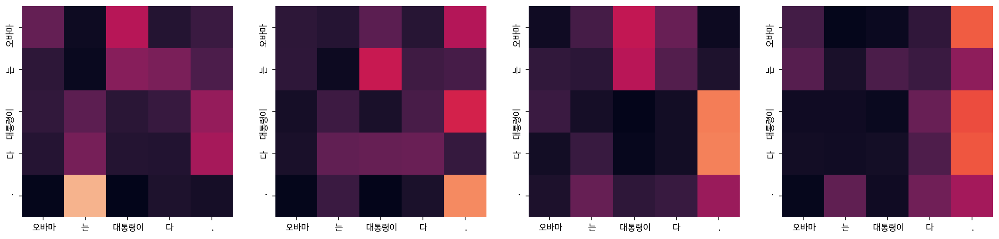

Encoder Layer 2


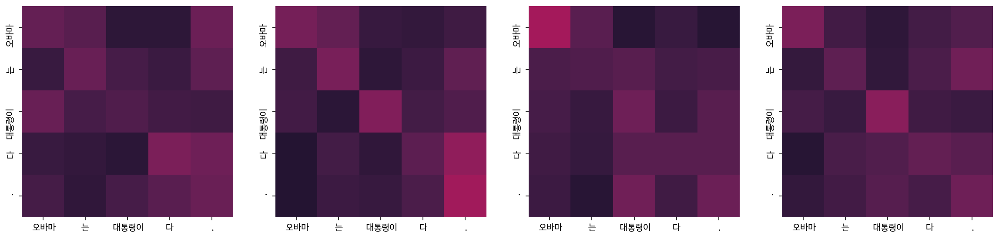

Decoder Self Layer 1


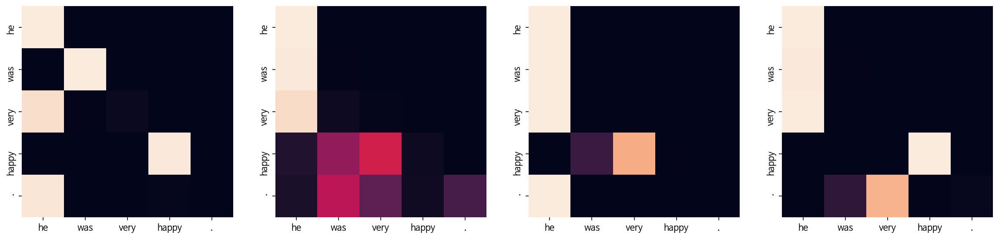

Decoder Src Layer 1


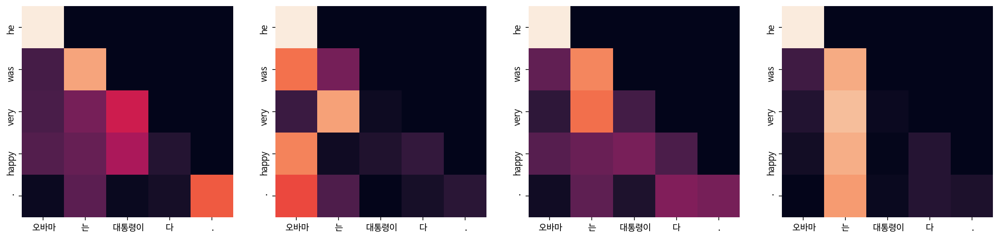

Decoder Self Layer 2


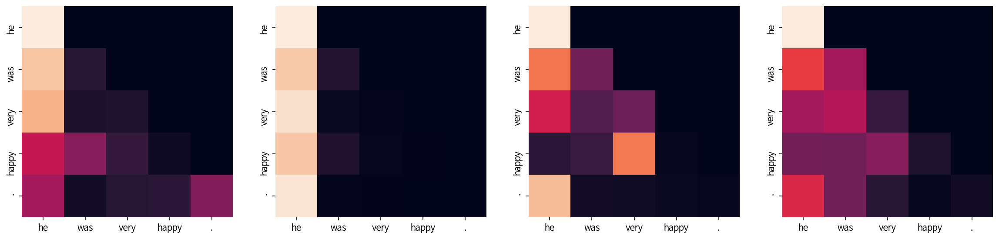

Decoder Src Layer 2


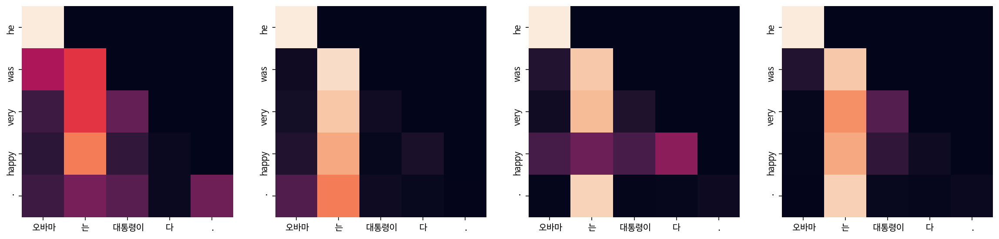

Input: 시민들은 도시 속에 산다.
Predicted translation: they are very happy .
Encoder Layer 1


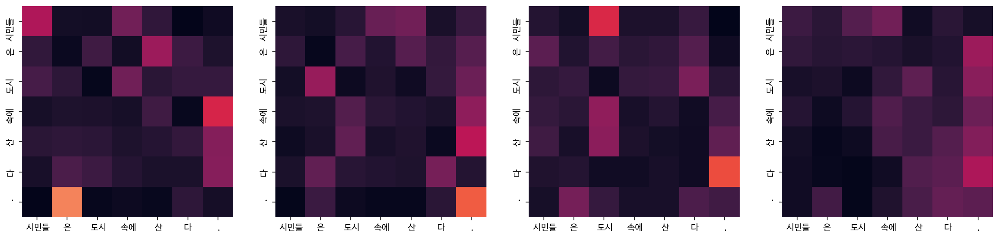

Encoder Layer 2


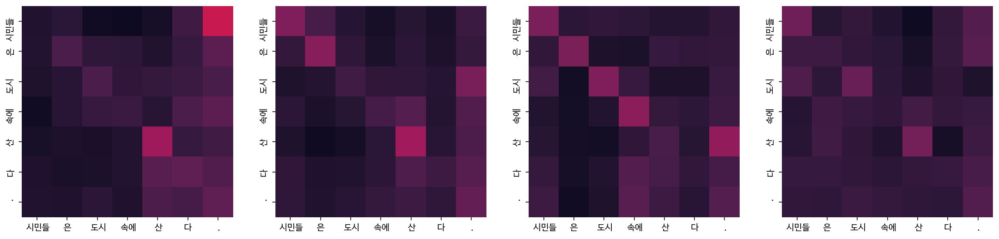

Decoder Self Layer 1


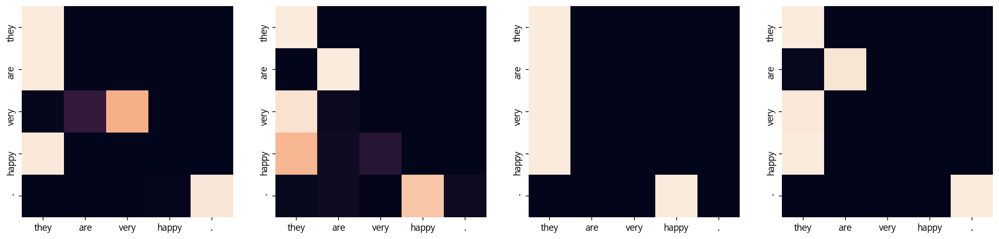

Decoder Src Layer 1


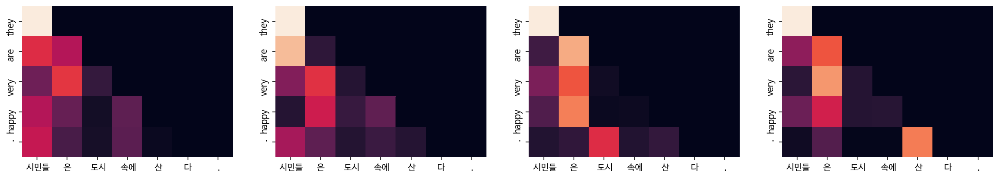

Decoder Self Layer 2


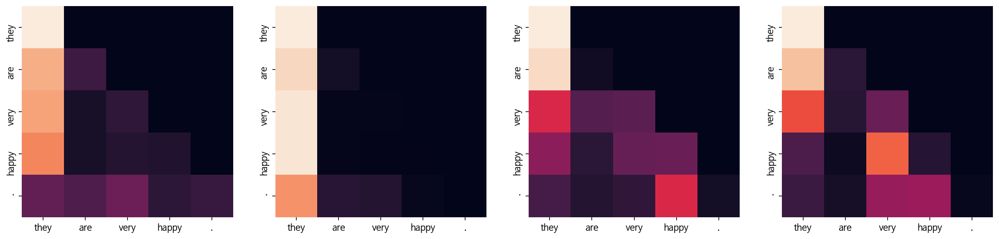

Decoder Src Layer 2


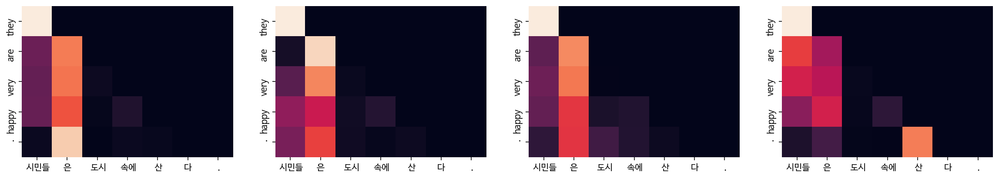

Input: 커피는 필요 없다.
Predicted translation: coffee has not been a coffee coffee .
Encoder Layer 1


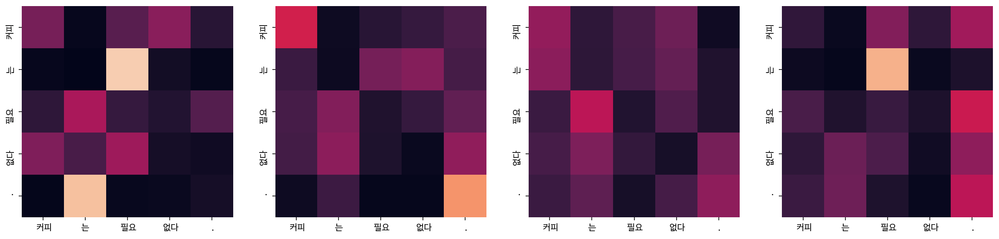

Encoder Layer 2


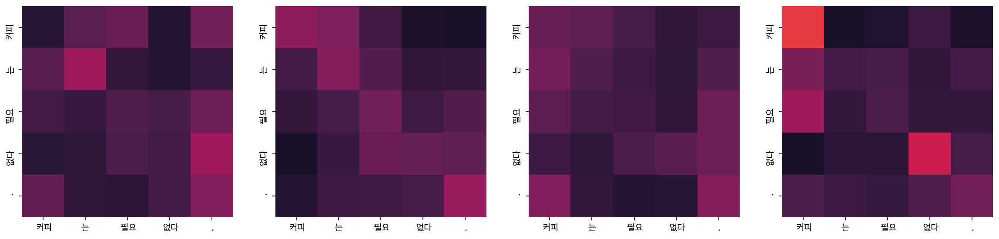

Decoder Self Layer 1


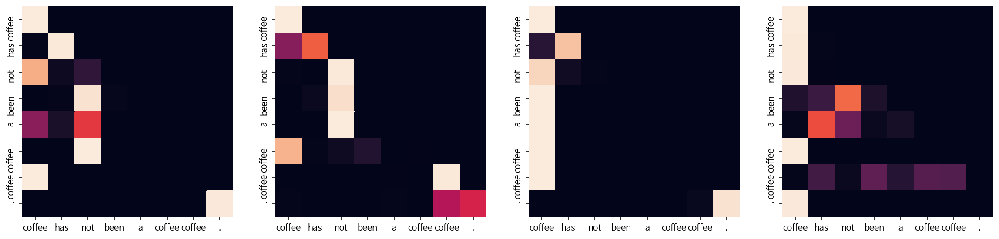

Decoder Src Layer 1


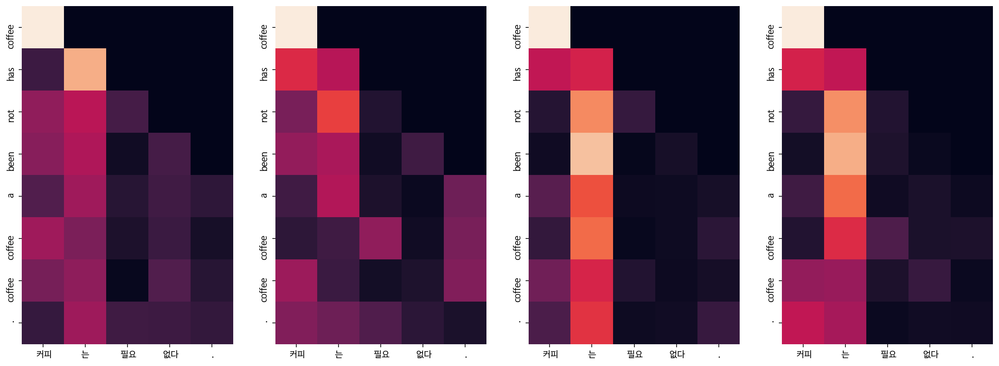

Decoder Self Layer 2


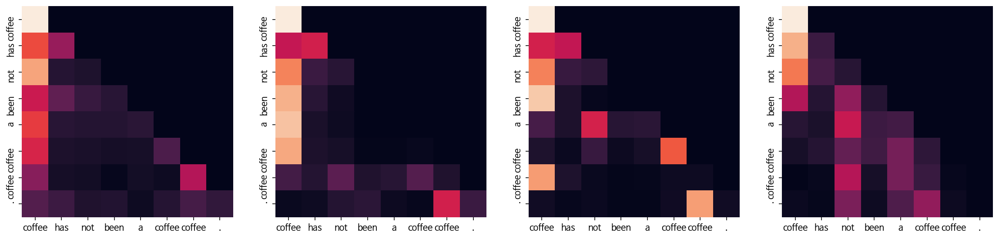

Decoder Src Layer 2


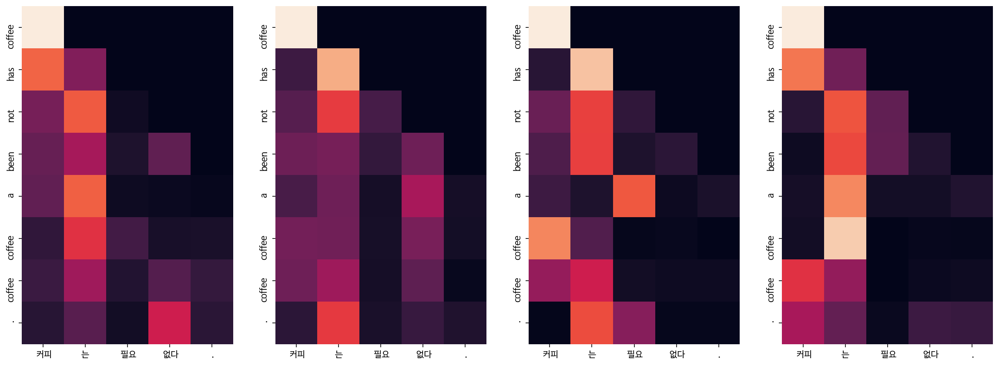

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the dead were wounded in the blast .
Encoder Layer 1


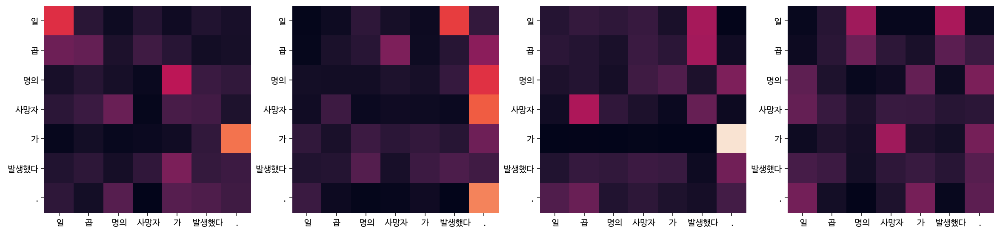

Encoder Layer 2


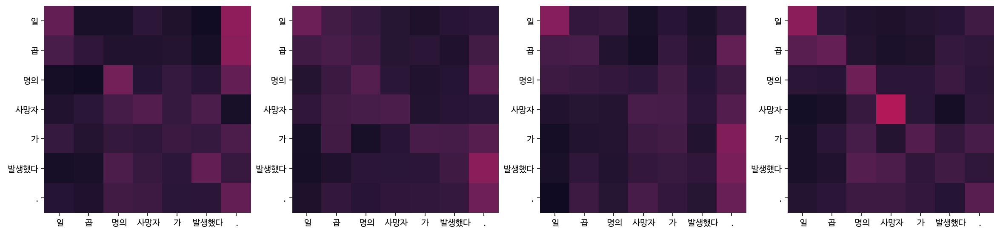

Decoder Self Layer 1


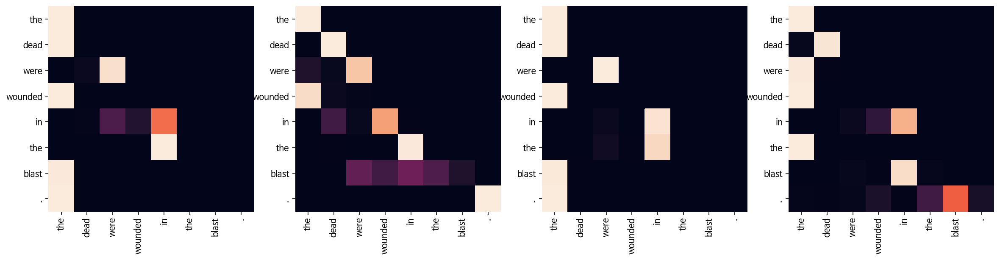

Decoder Src Layer 1


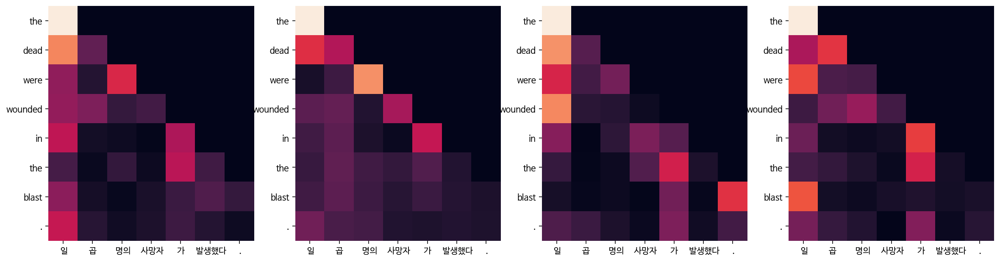

Decoder Self Layer 2


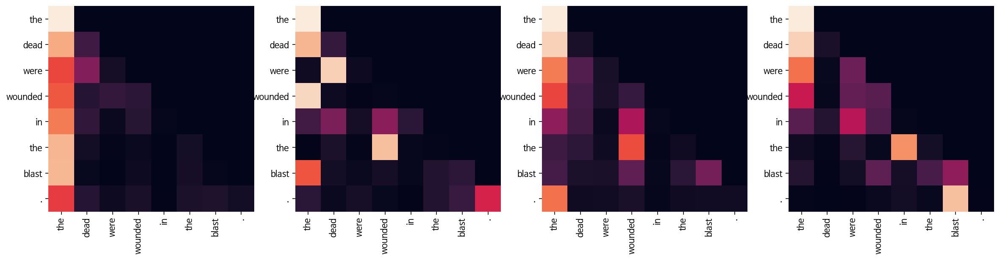

Decoder Src Layer 2


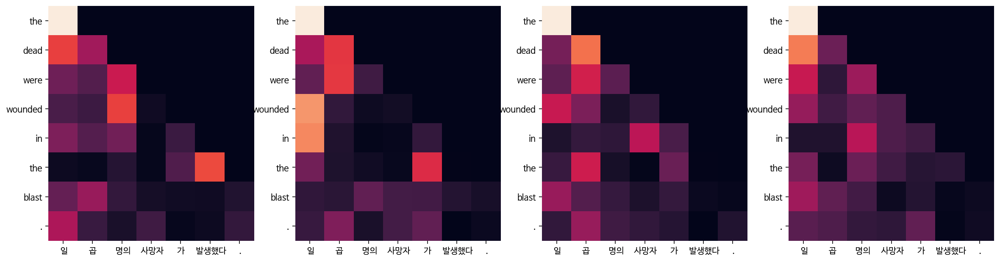

Epoch  2: 100%|██████████| 8507/8507 [19:15<00:00,  7.36it/s, Loss 3.4775]


Input: 오바마는 대통령이다.
Predicted translation: obama is expected to be president .
Encoder Layer 1


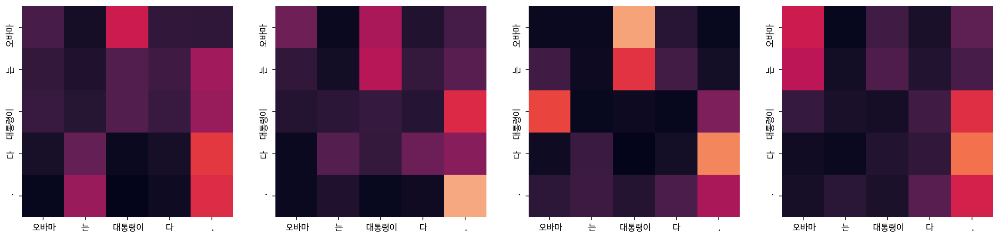

Encoder Layer 2


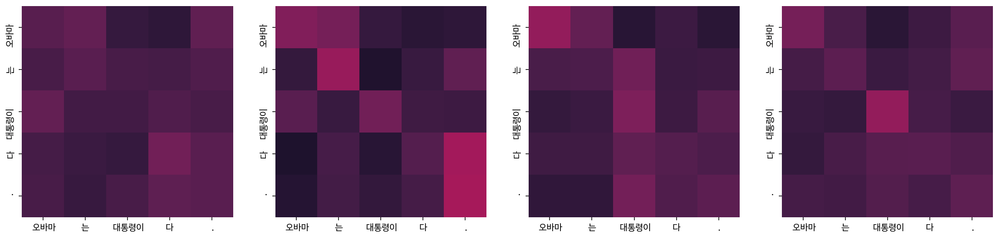

Decoder Self Layer 1


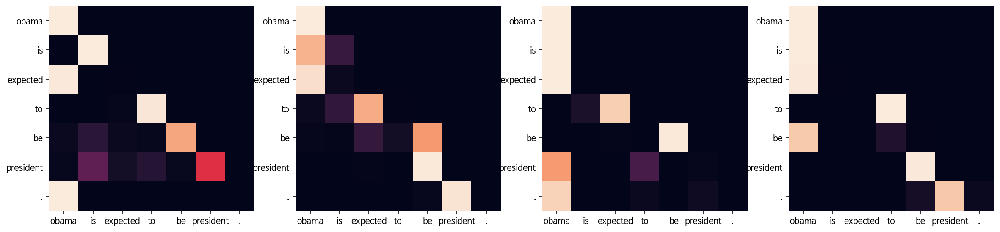

Decoder Src Layer 1


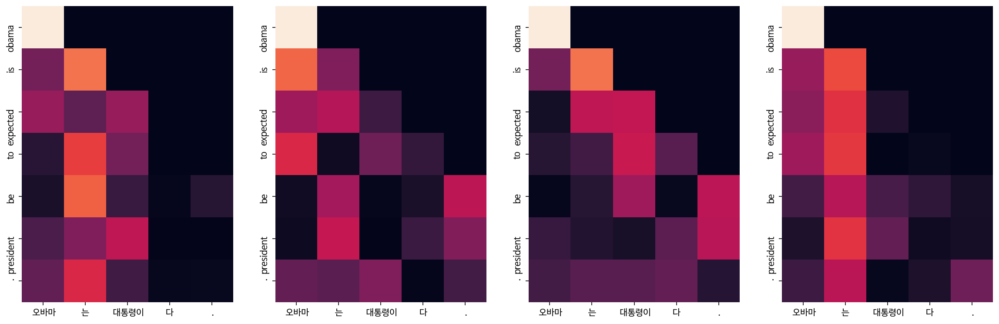

Decoder Self Layer 2


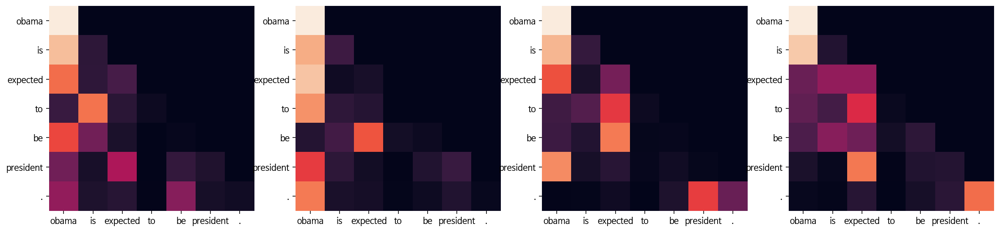

Decoder Src Layer 2


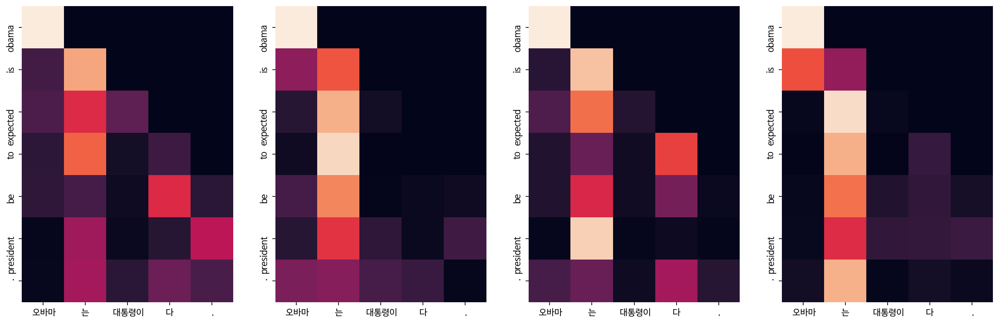

Input: 시민들은 도시 속에 산다.
Predicted translation: people are either in the city .
Encoder Layer 1


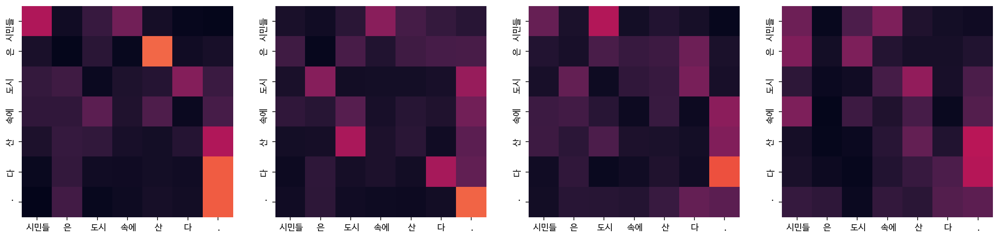

Encoder Layer 2


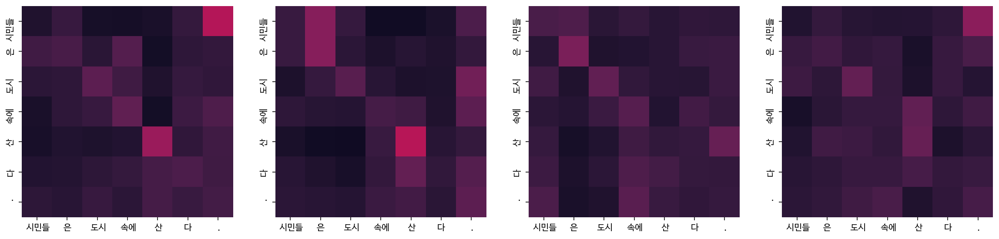

Decoder Self Layer 1


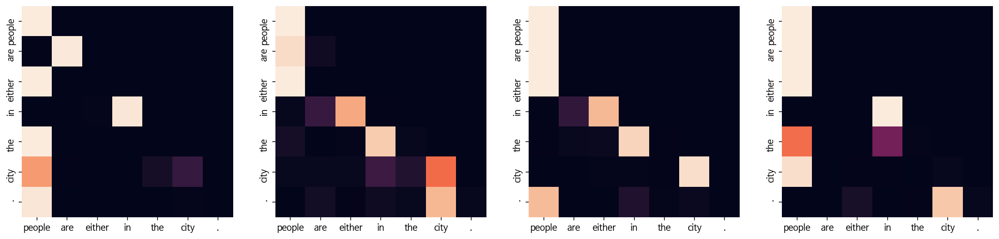

Decoder Src Layer 1


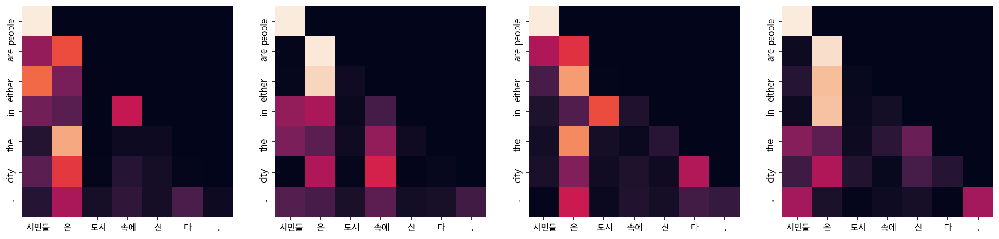

Decoder Self Layer 2


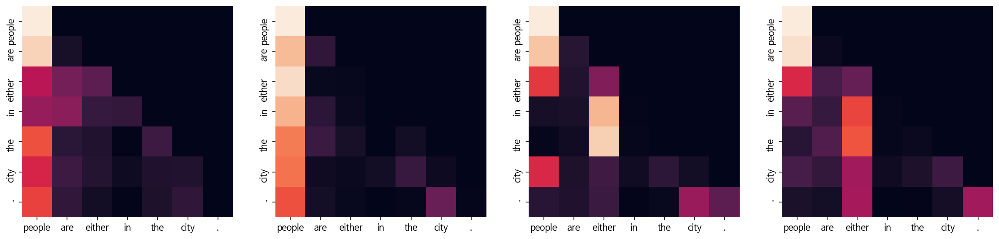

Decoder Src Layer 2


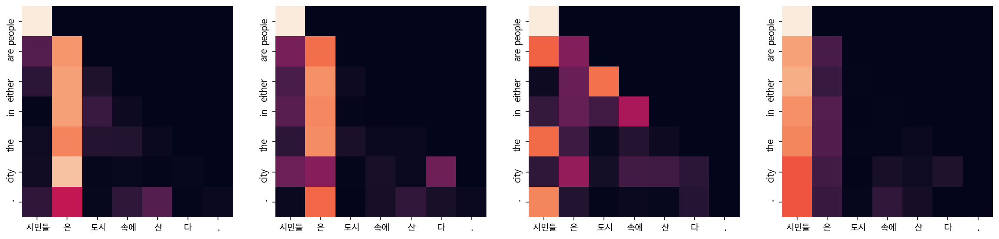

Input: 커피는 필요 없다.
Predicted translation: forty years , we need to do with the other issue .
Encoder Layer 1


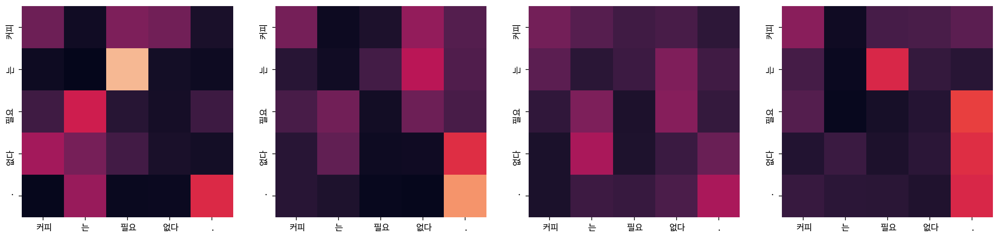

Encoder Layer 2


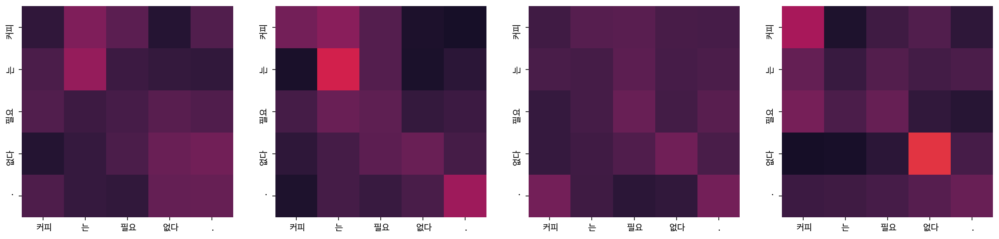

Decoder Self Layer 1


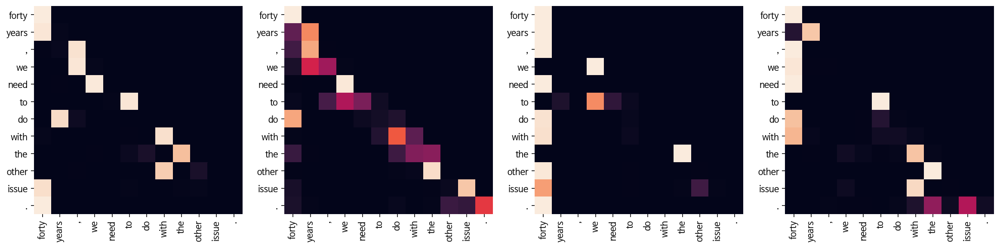

Decoder Src Layer 1


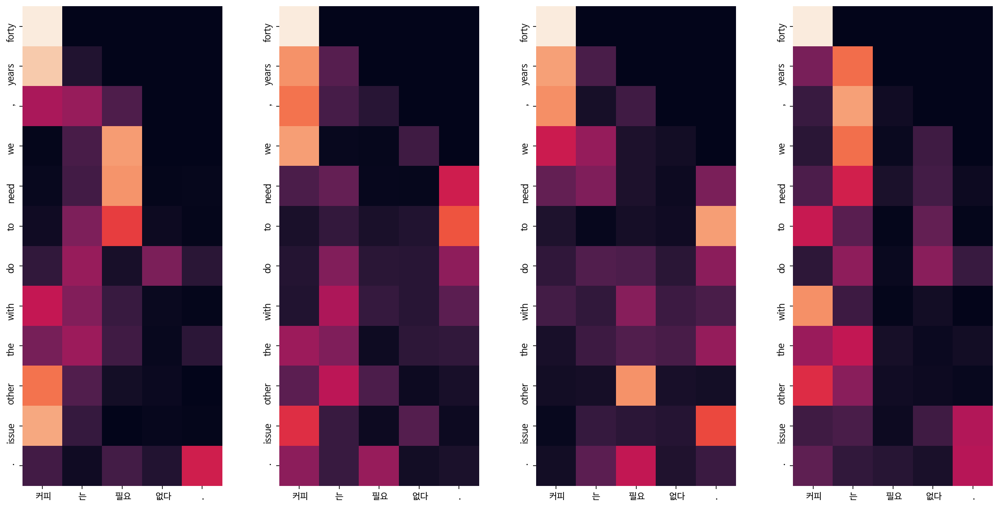

Decoder Self Layer 2


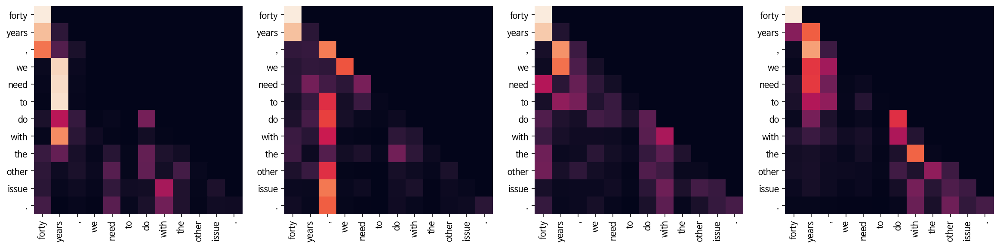

Decoder Src Layer 2


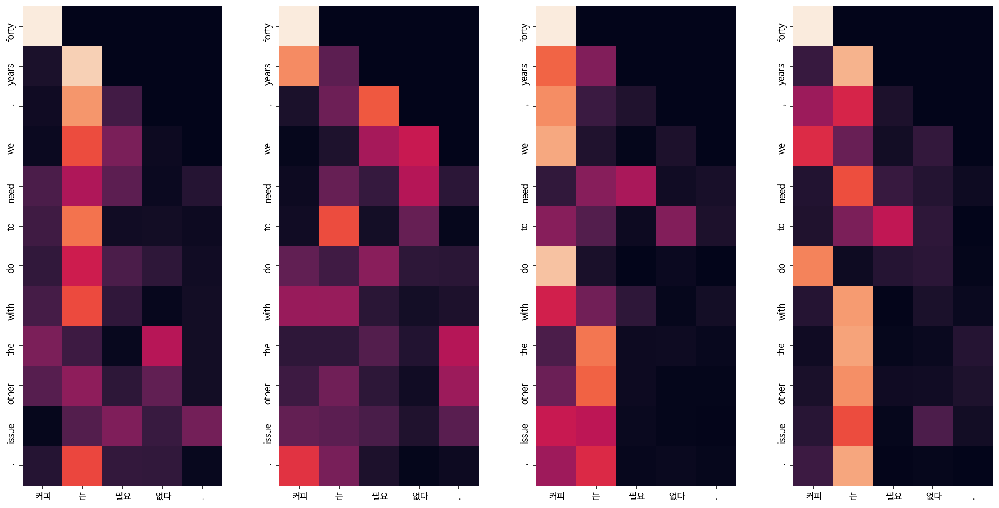

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: four people died monday , the national guard .
Encoder Layer 1


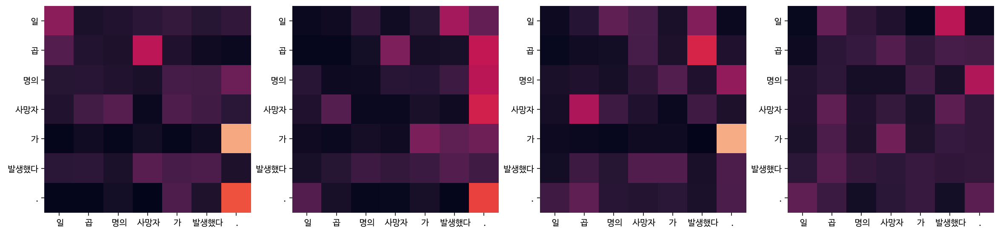

Encoder Layer 2


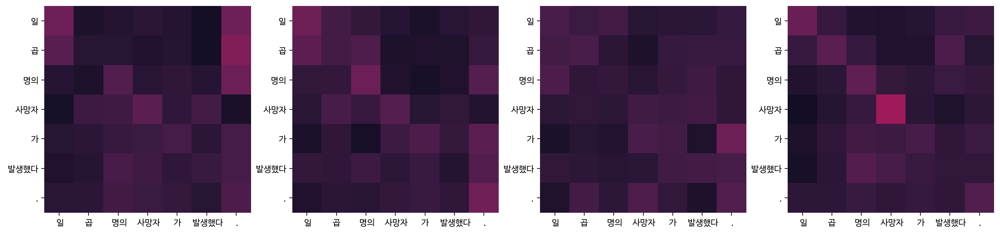

Decoder Self Layer 1


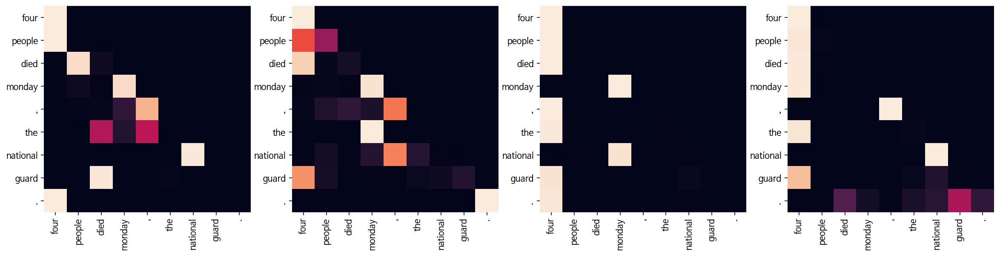

Decoder Src Layer 1


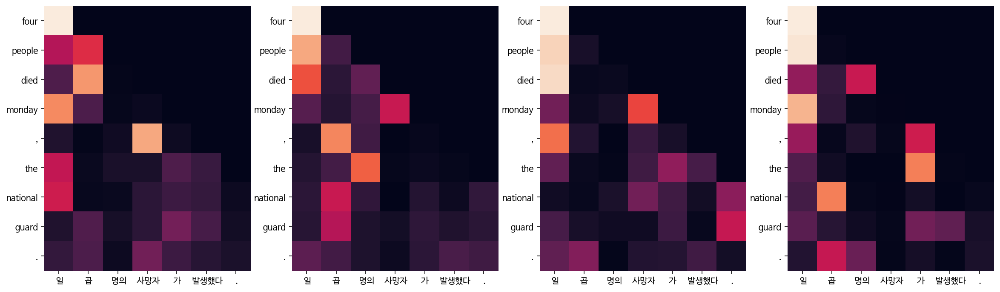

Decoder Self Layer 2


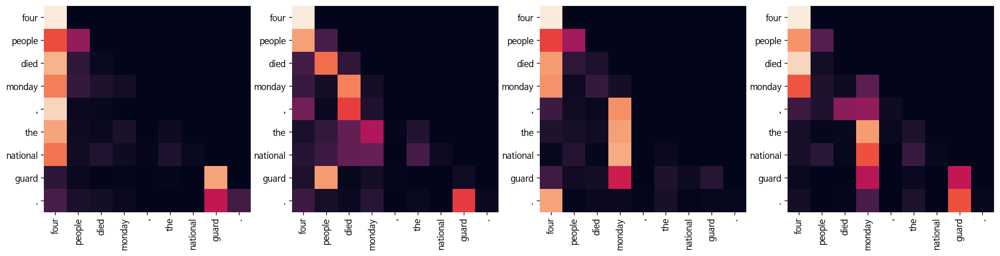

Decoder Src Layer 2


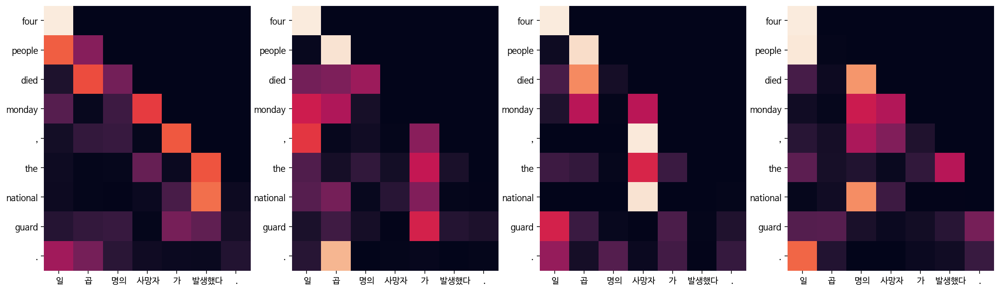

Epoch  3: 100%|██████████| 8507/8507 [19:14<00:00,  7.37it/s, Loss 3.0906]


Input: 오바마는 대통령이다.
Predicted translation: obama is the president .
Encoder Layer 1


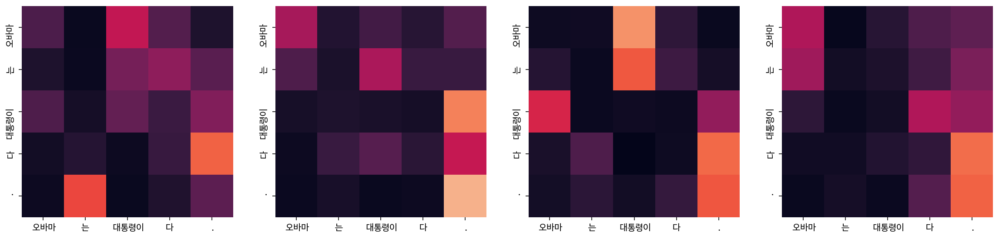

Encoder Layer 2


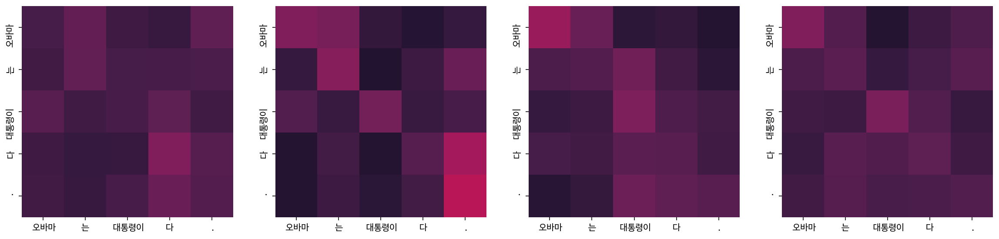

Decoder Self Layer 1


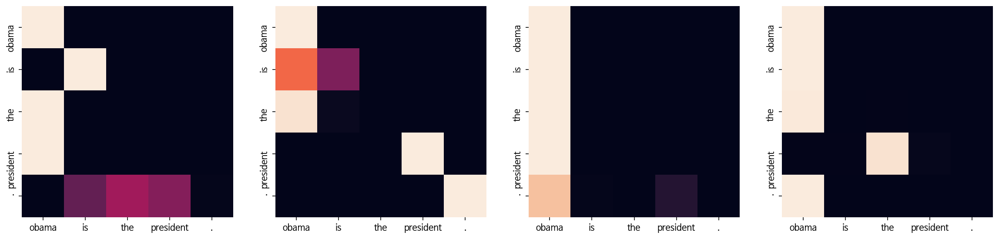

Decoder Src Layer 1


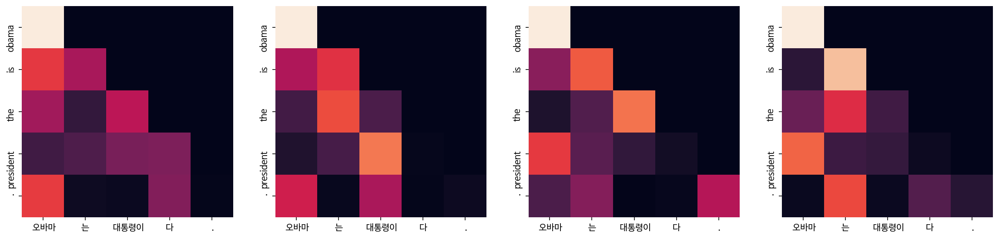

Decoder Self Layer 2


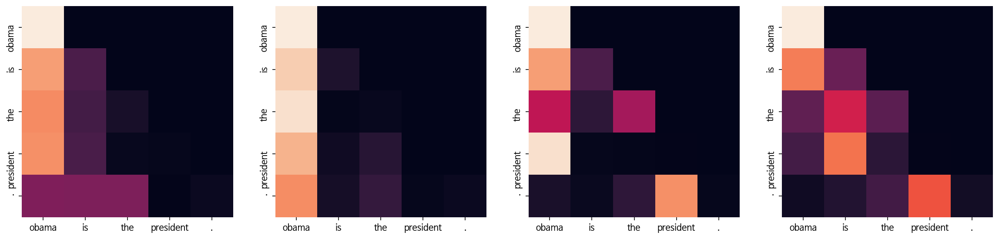

Decoder Src Layer 2


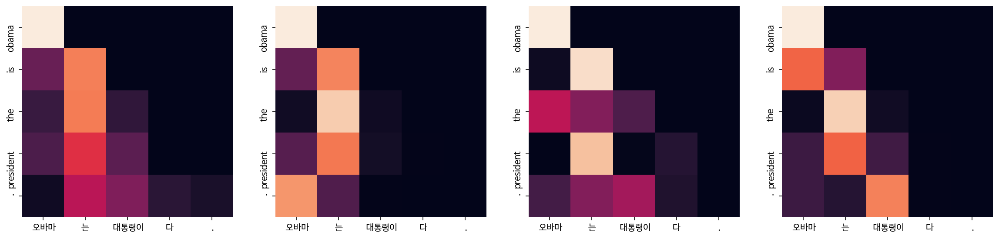

Input: 시민들은 도시 속에 산다.
Predicted translation: the city is a city of dying .
Encoder Layer 1


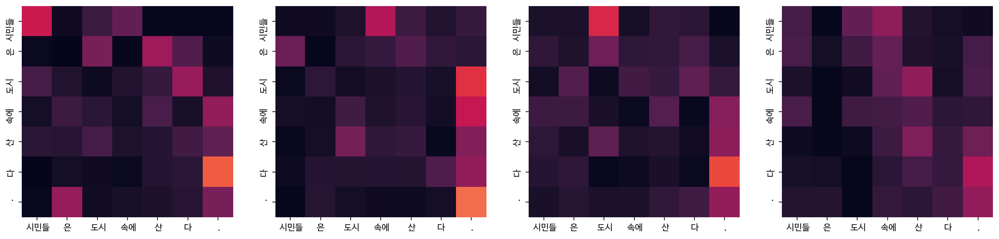

Encoder Layer 2


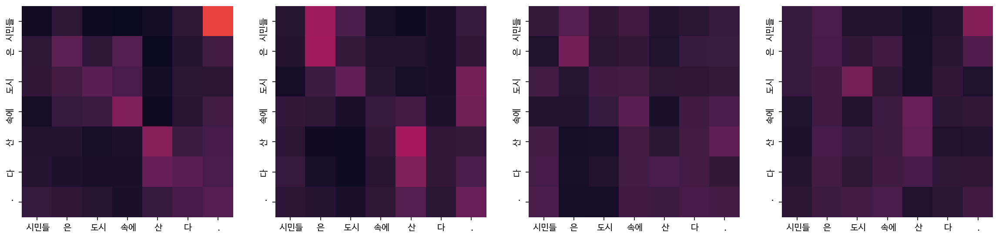

Decoder Self Layer 1


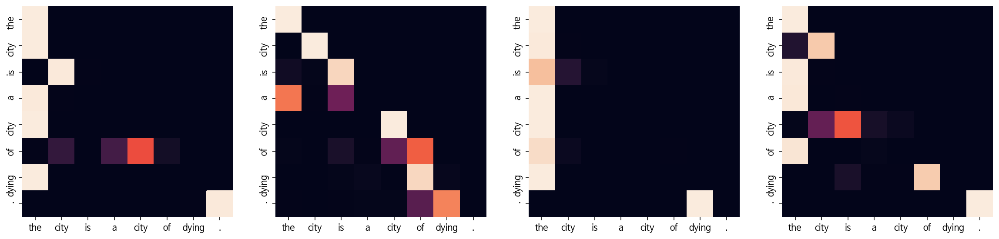

Decoder Src Layer 1


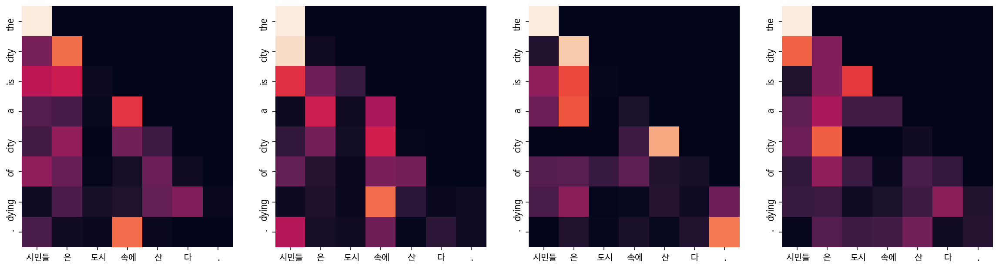

Decoder Self Layer 2


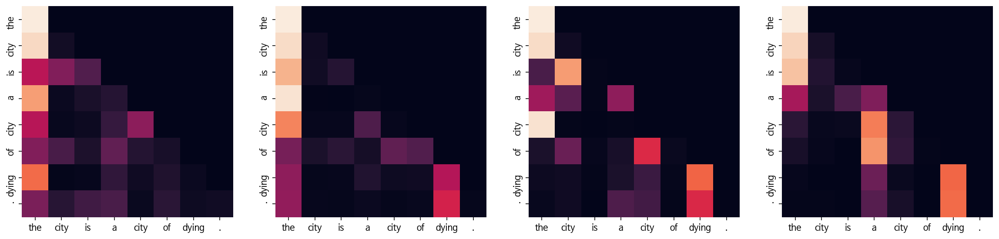

Decoder Src Layer 2


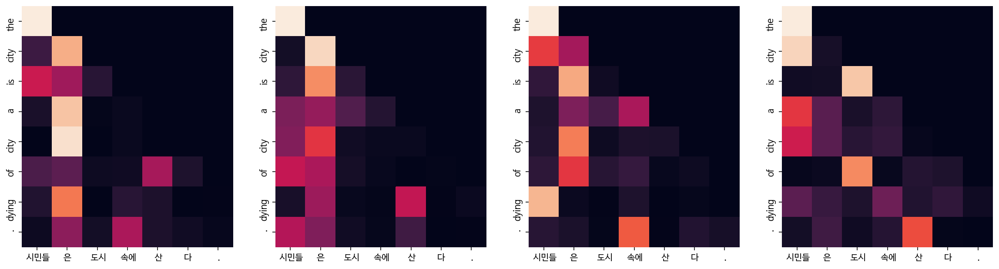

Input: 커피는 필요 없다.
Predicted translation: even before you need to be a good time .
Encoder Layer 1


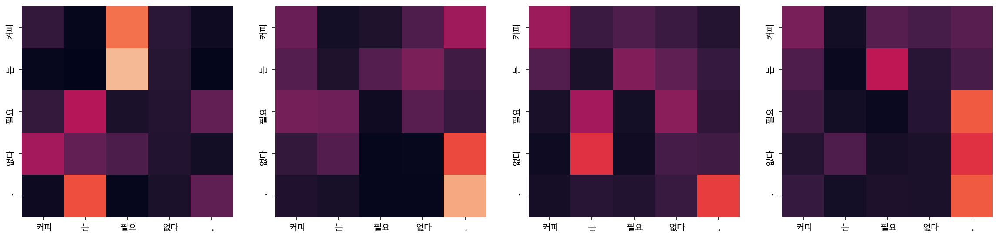

Encoder Layer 2


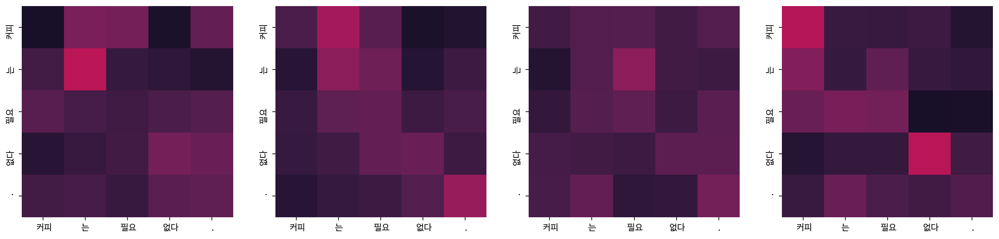

Decoder Self Layer 1


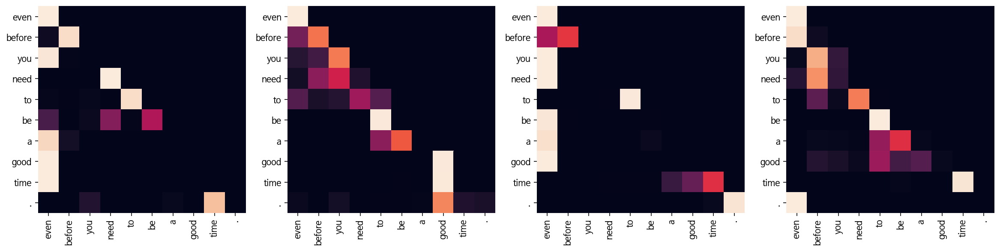

Decoder Src Layer 1


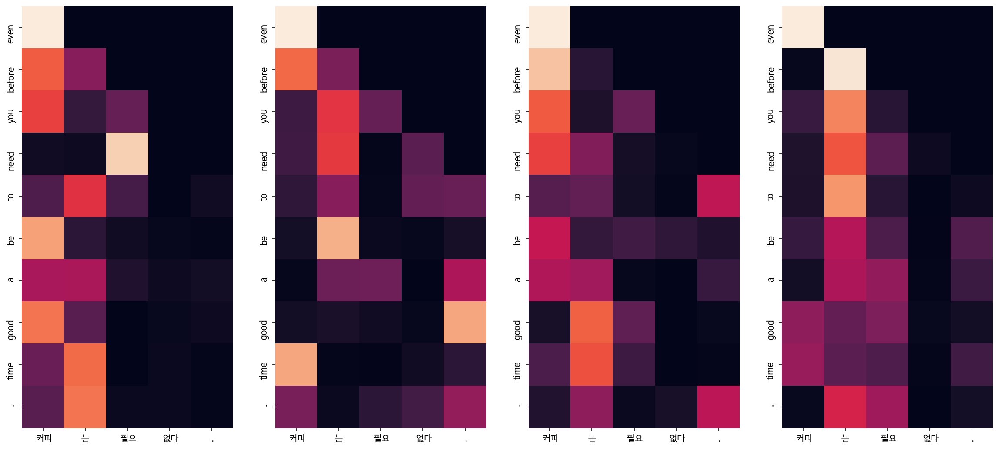

Decoder Self Layer 2


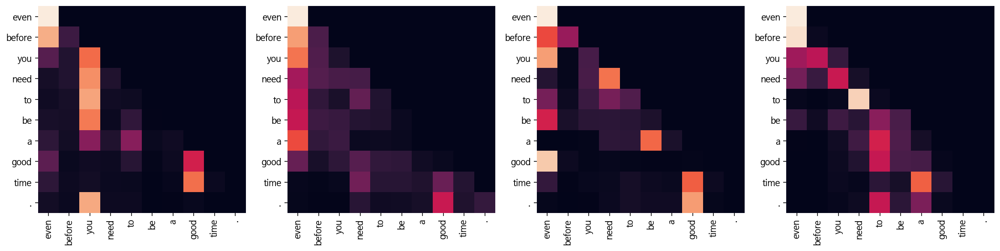

Decoder Src Layer 2


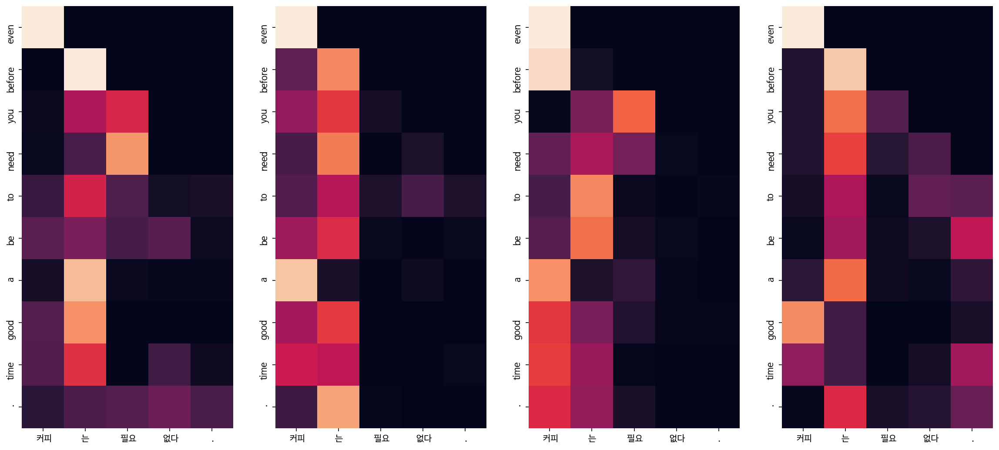

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: a seventh of the seven deaths .
Encoder Layer 1


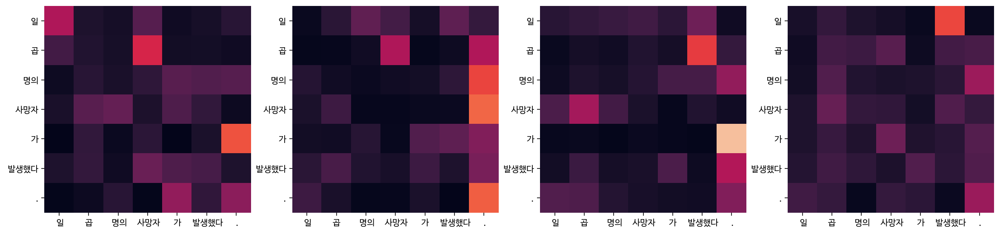

Encoder Layer 2


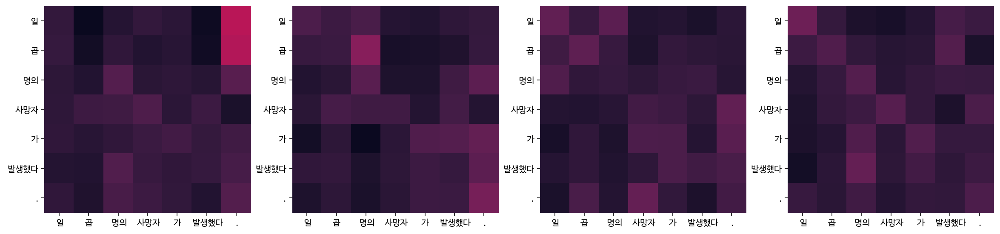

Decoder Self Layer 1


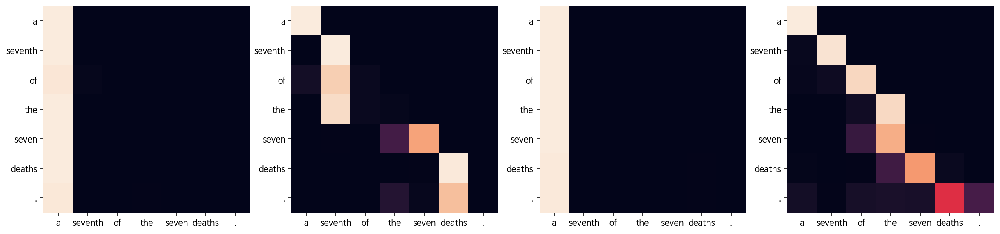

Decoder Src Layer 1


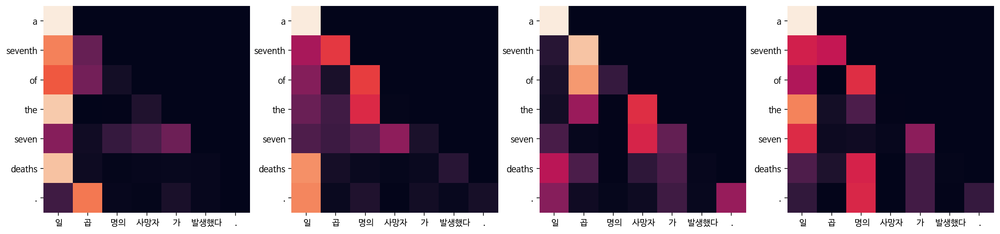

Decoder Self Layer 2


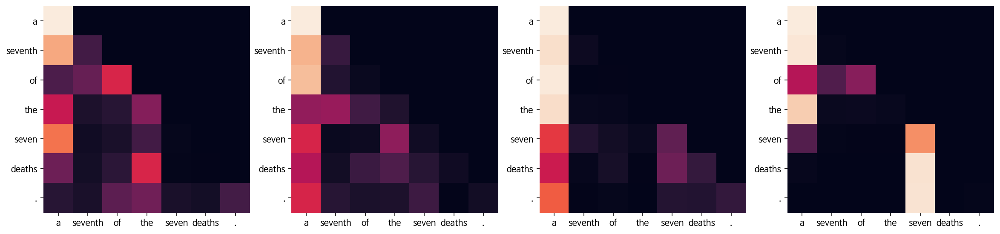

Decoder Src Layer 2


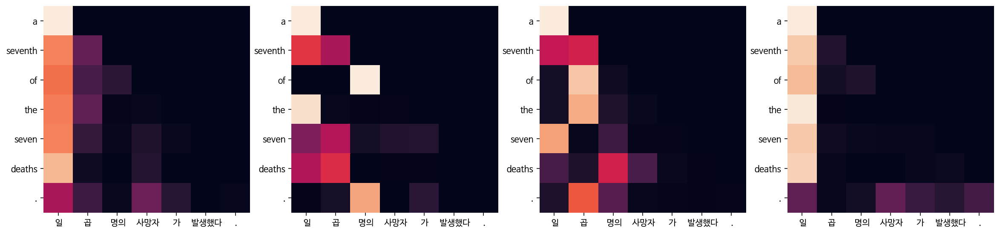

Epoch  4: 100%|██████████| 8507/8507 [19:03<00:00,  7.44it/s, Loss 2.7002]


Input: 오바마는 대통령이다.
Predicted translation: president obama is the president .
Encoder Layer 1


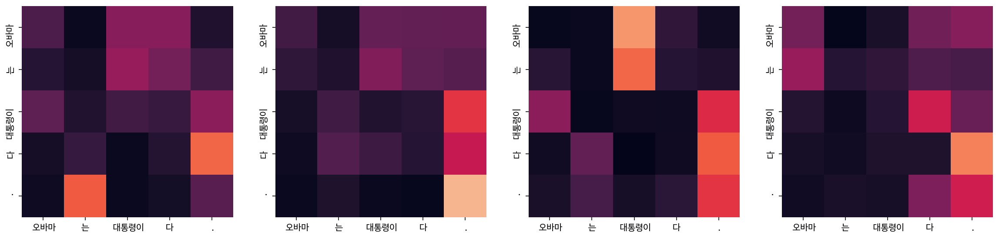

Encoder Layer 2


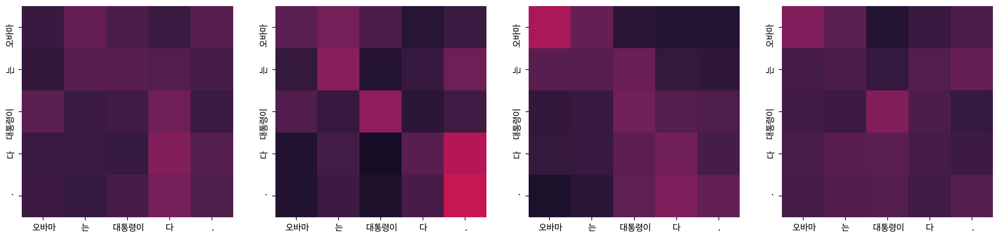

Decoder Self Layer 1


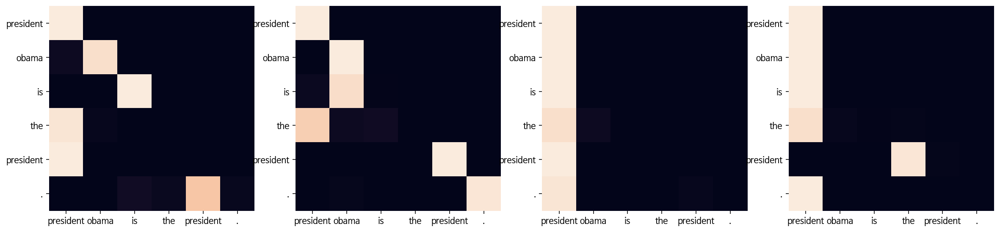

Decoder Src Layer 1


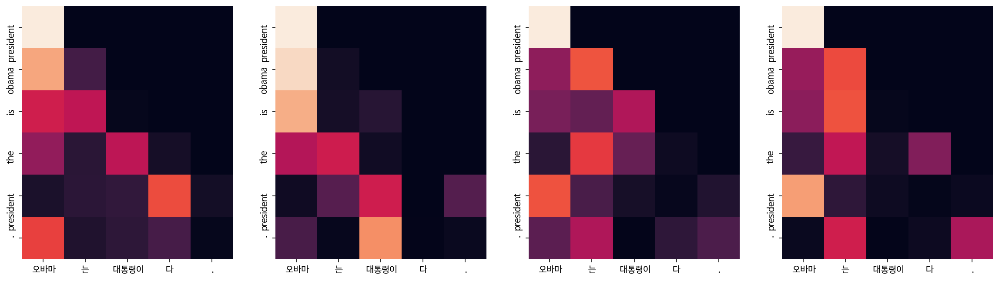

Decoder Self Layer 2


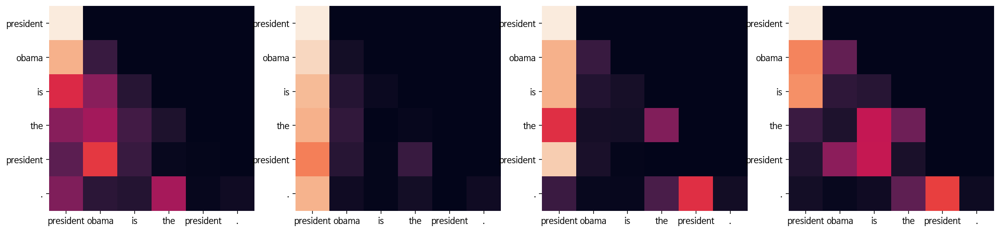

Decoder Src Layer 2


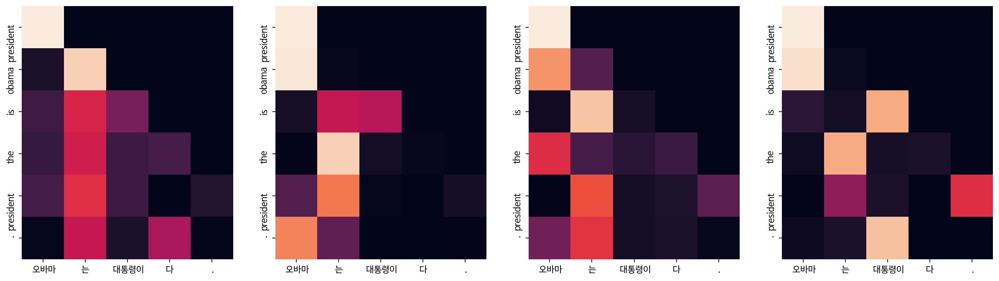

Input: 시민들은 도시 속에 산다.
Predicted translation: they are the mainly down the city s three and the city s overnight .
Encoder Layer 1


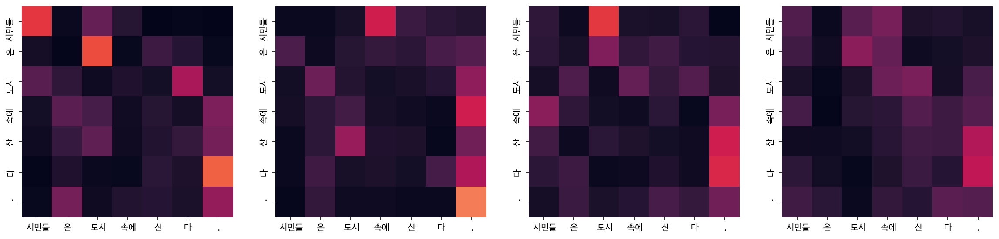

Encoder Layer 2


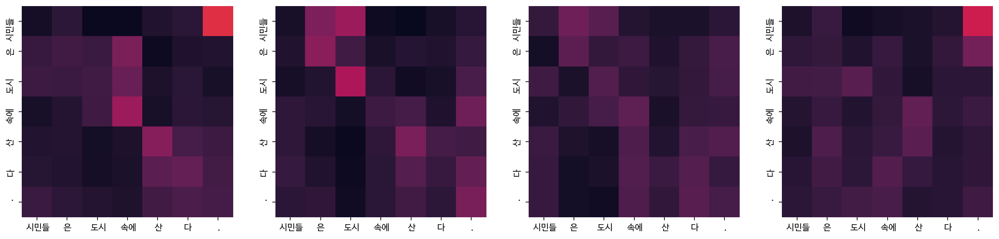

Decoder Self Layer 1


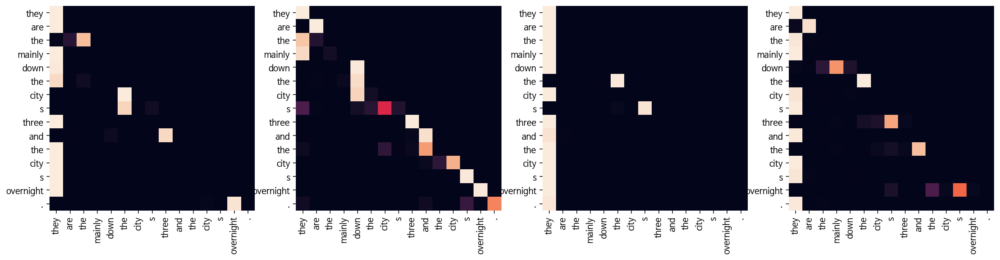

Decoder Src Layer 1


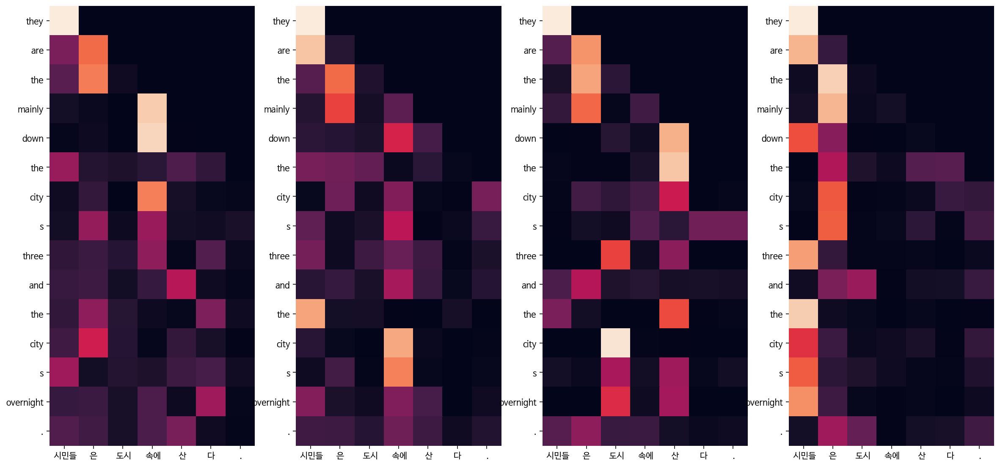

Decoder Self Layer 2


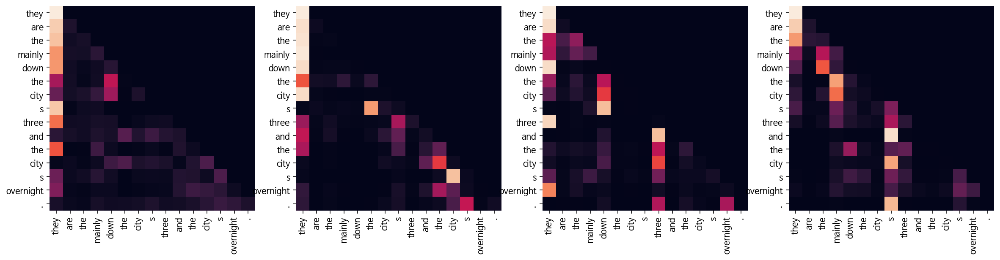

Decoder Src Layer 2


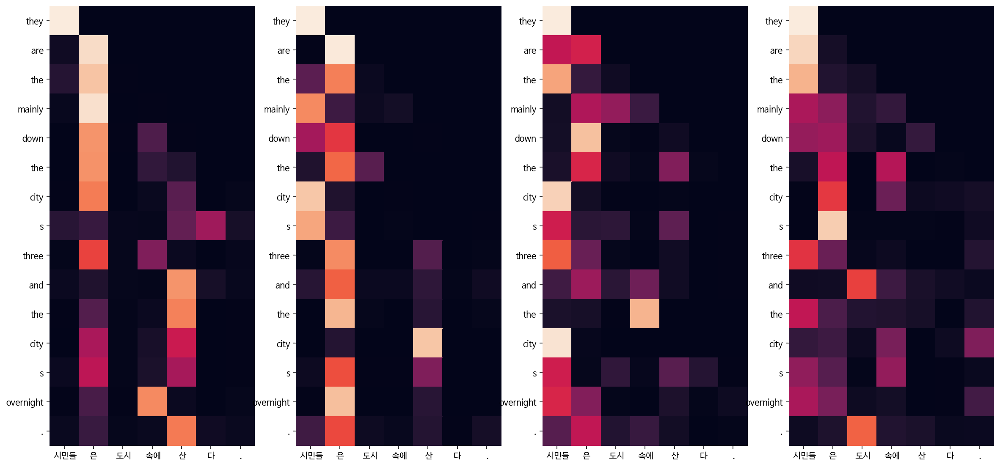

Input: 커피는 필요 없다.
Predicted translation: you don t need to do .
Encoder Layer 1


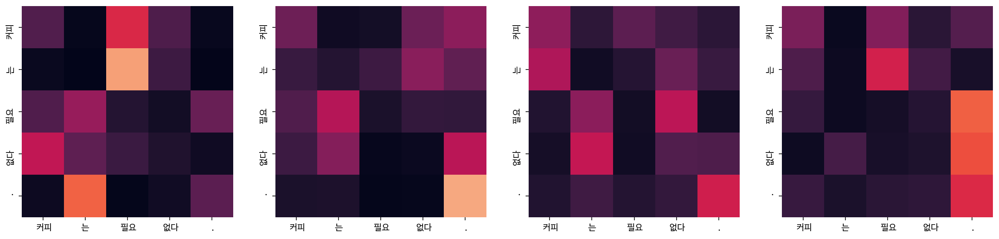

Encoder Layer 2


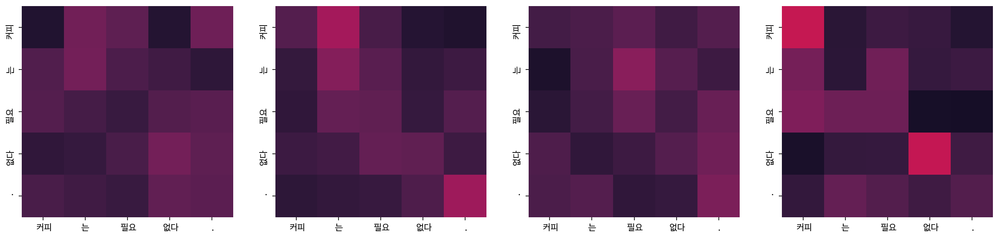

Decoder Self Layer 1


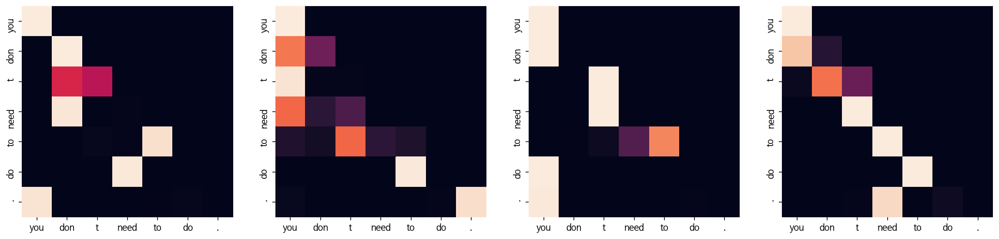

Decoder Src Layer 1


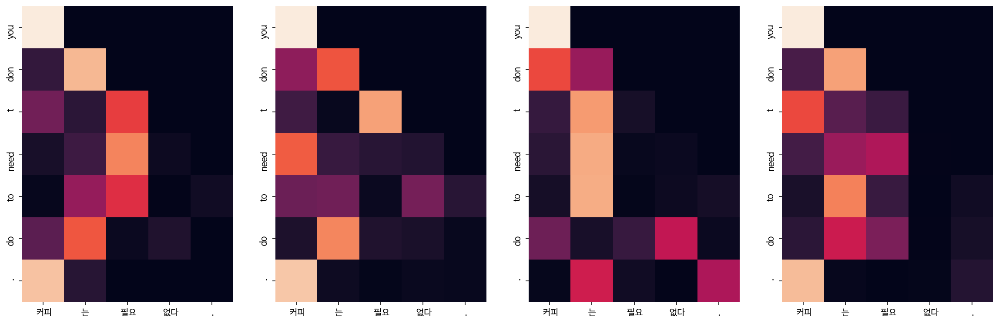

Decoder Self Layer 2


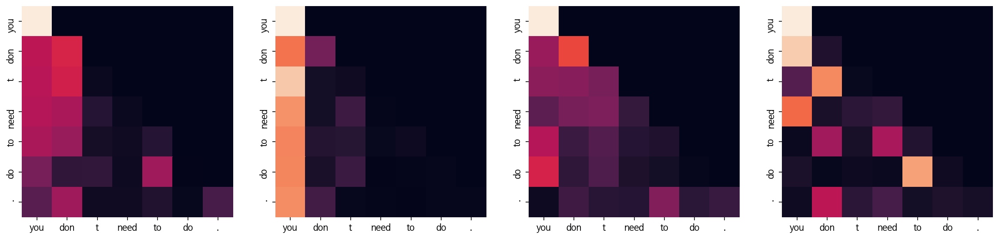

Decoder Src Layer 2


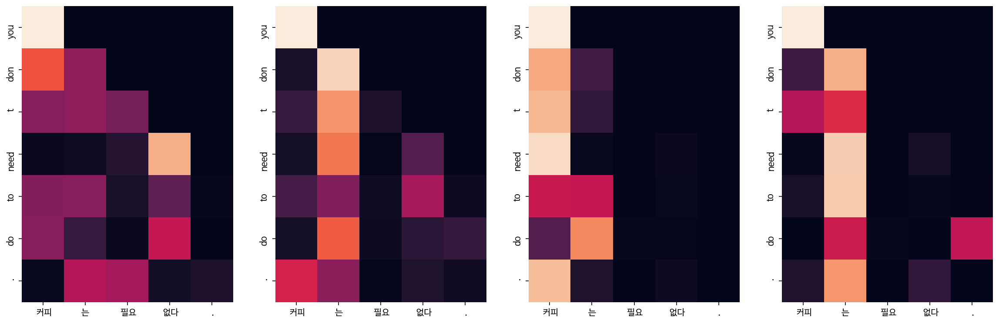

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: five people died in the disaster .
Encoder Layer 1


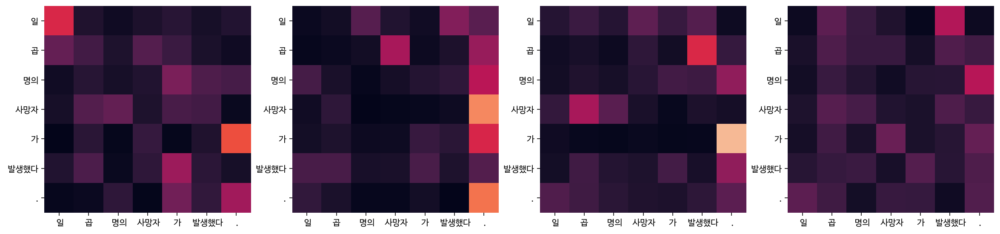

Encoder Layer 2


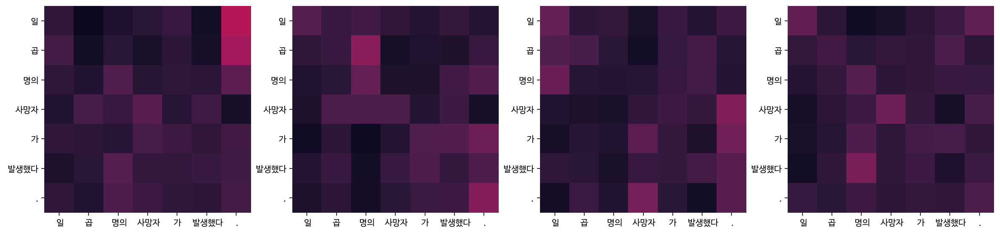

Decoder Self Layer 1


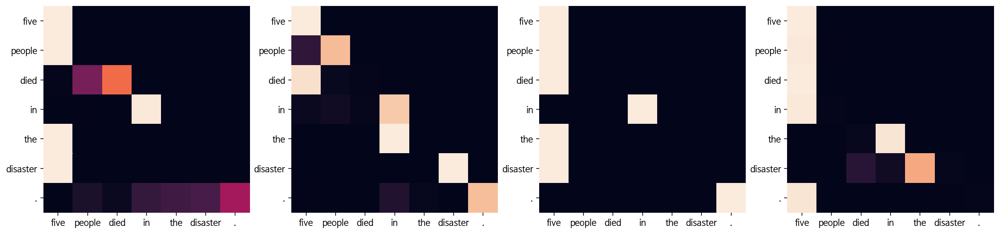

Decoder Src Layer 1


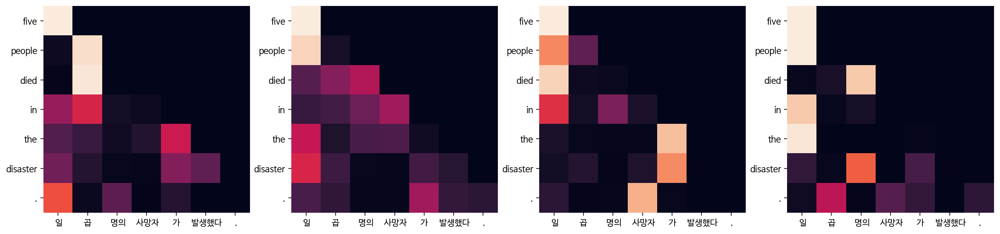

Decoder Self Layer 2


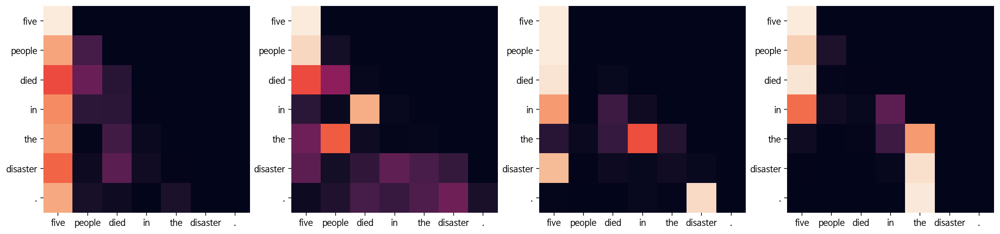

Decoder Src Layer 2


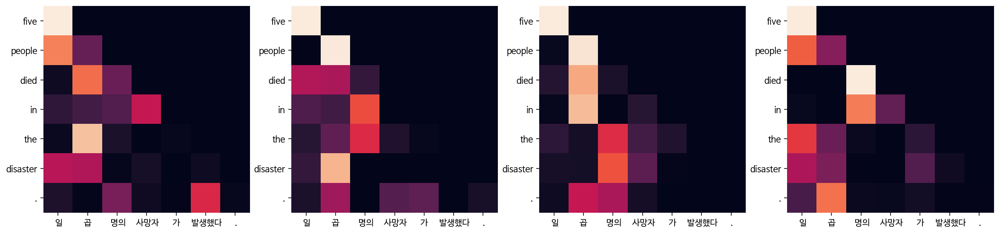

Epoch  5: 100%|██████████| 8507/8507 [19:22<00:00,  7.32it/s, Loss 2.3374]


Input: 오바마는 대통령이다.
Predicted translation: obama s presidents is expected to get the support of obama .
Encoder Layer 1


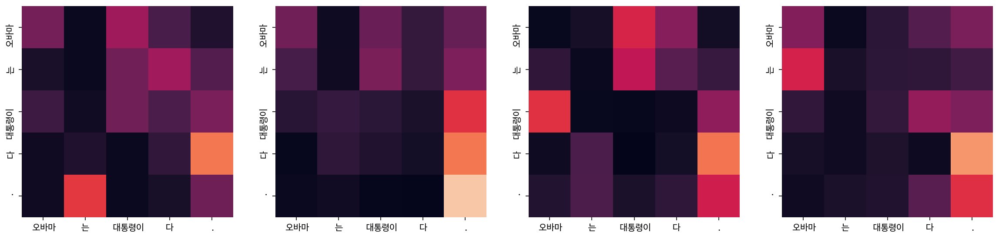

Encoder Layer 2


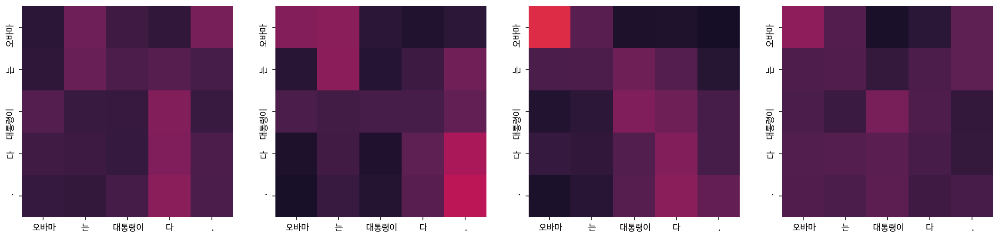

Decoder Self Layer 1


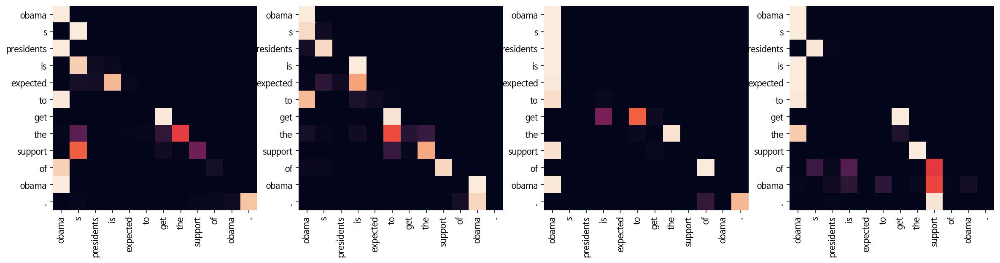

Decoder Src Layer 1


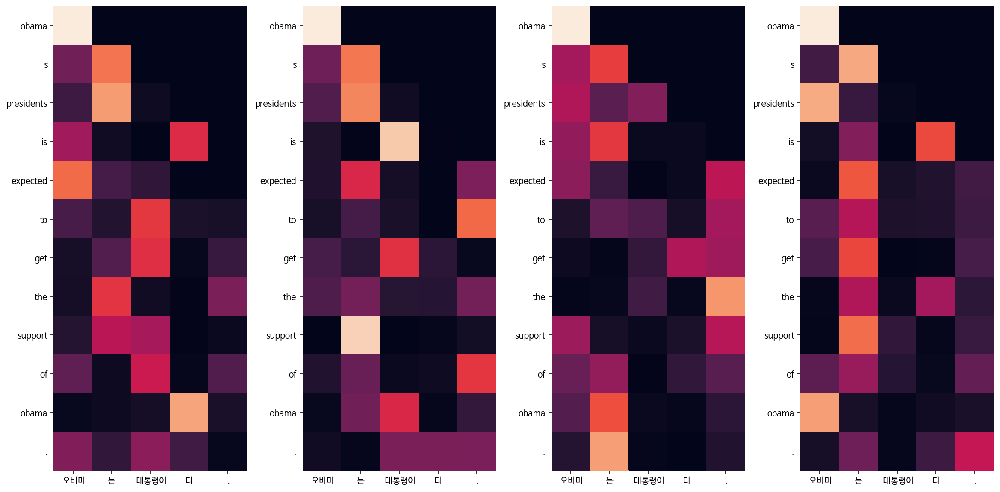

Decoder Self Layer 2


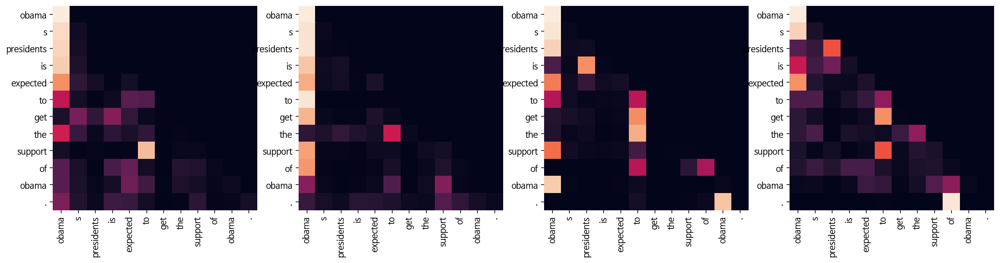

Decoder Src Layer 2


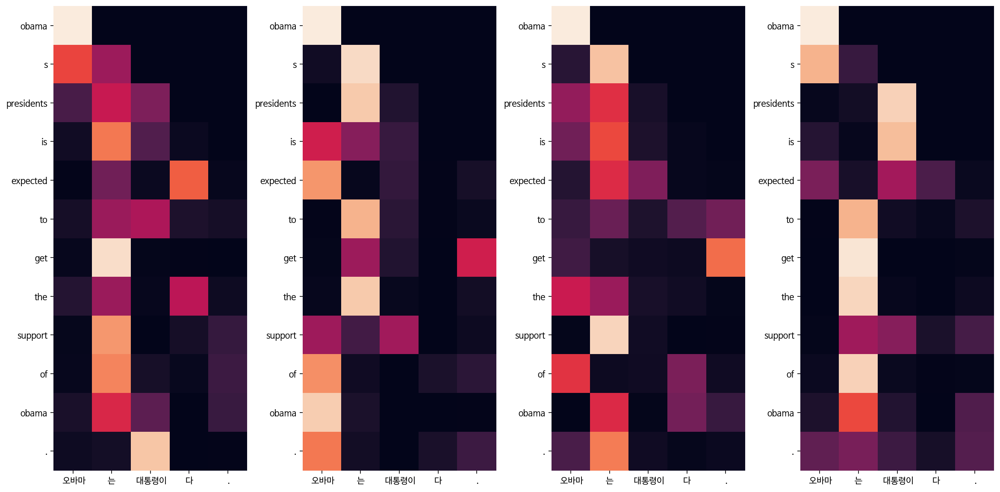

Input: 시민들은 도시 속에 산다.
Predicted translation: they are based in city s into a one city of i .
Encoder Layer 1


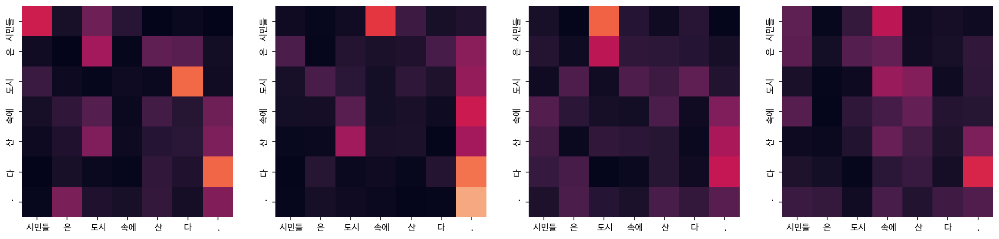

Encoder Layer 2


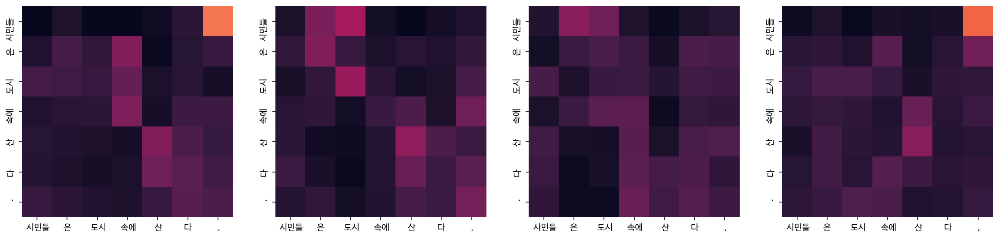

Decoder Self Layer 1


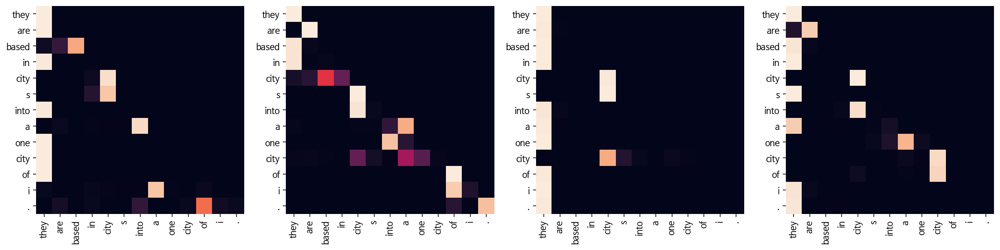

Decoder Src Layer 1


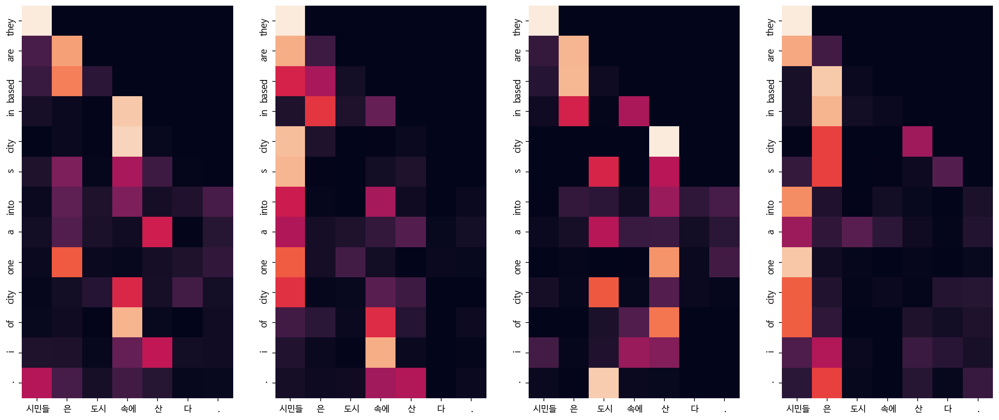

Decoder Self Layer 2


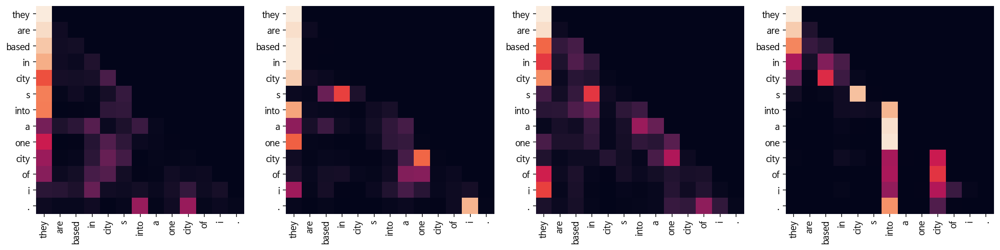

Decoder Src Layer 2


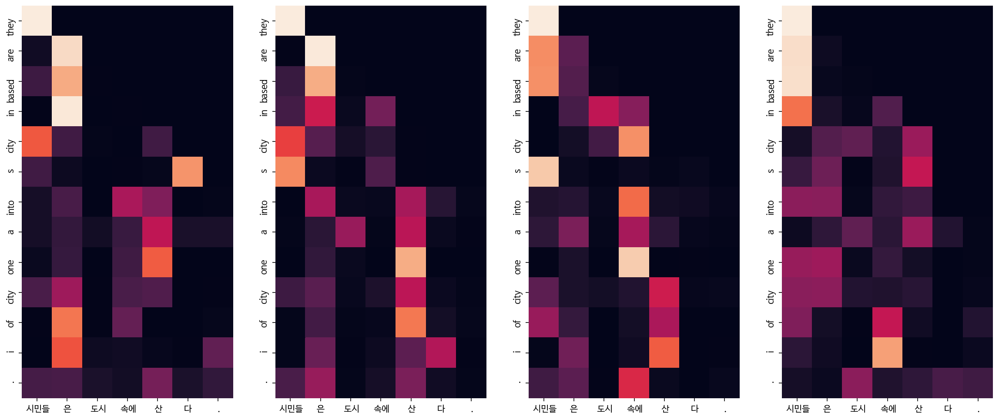

Input: 커피는 필요 없다.
Predicted translation: coffee is nothing when durable coffee .
Encoder Layer 1


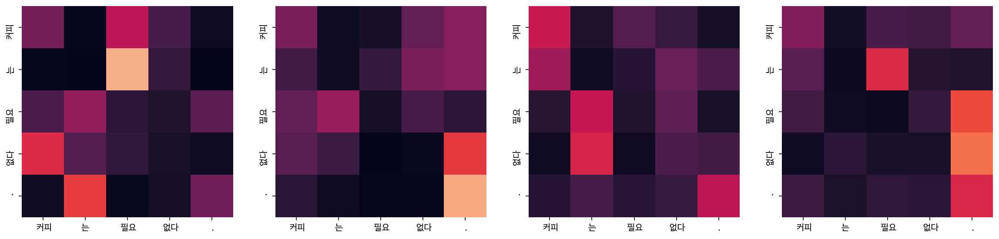

Encoder Layer 2


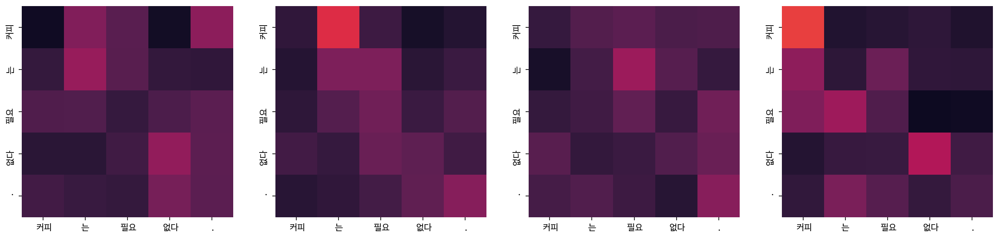

Decoder Self Layer 1


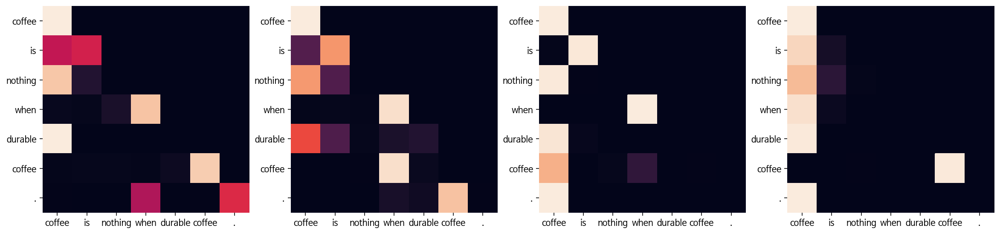

Decoder Src Layer 1


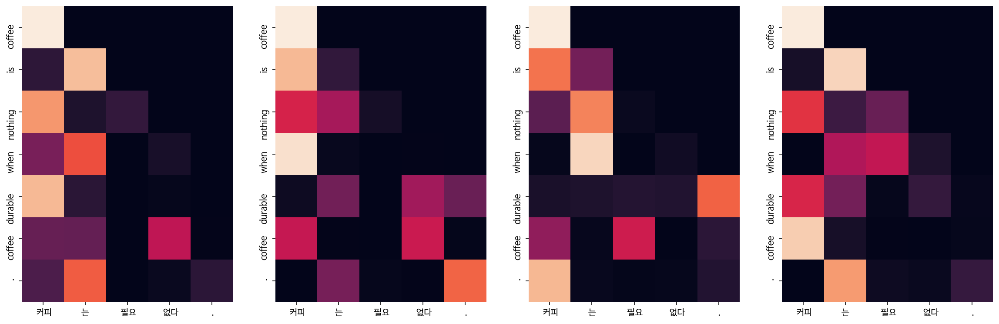

Decoder Self Layer 2


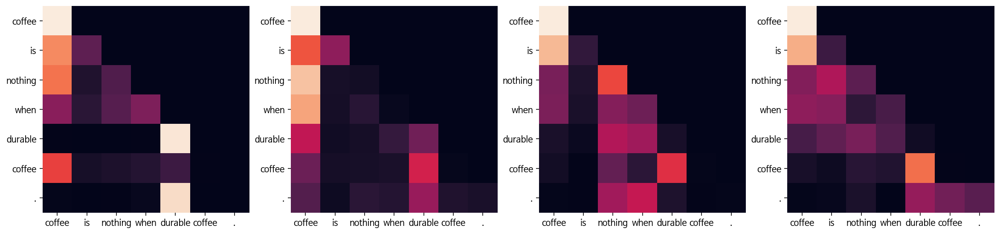

Decoder Src Layer 2


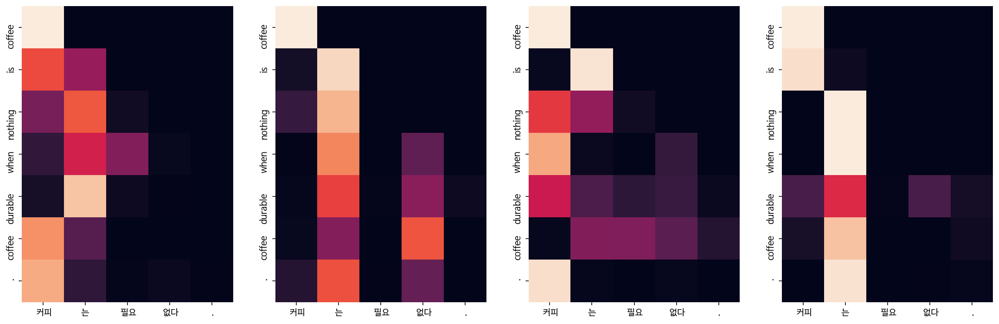

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the death toll from the himself is in southwestern china .
Encoder Layer 1


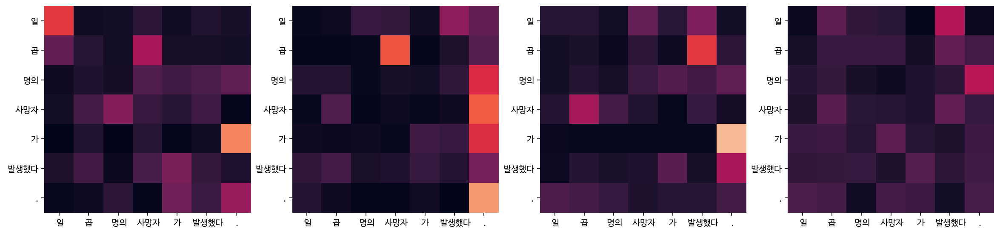

Encoder Layer 2


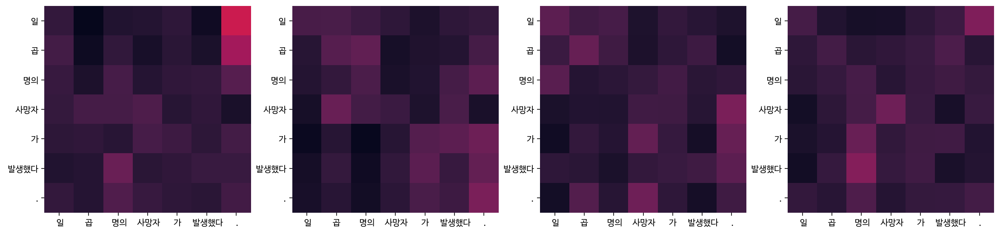

Decoder Self Layer 1


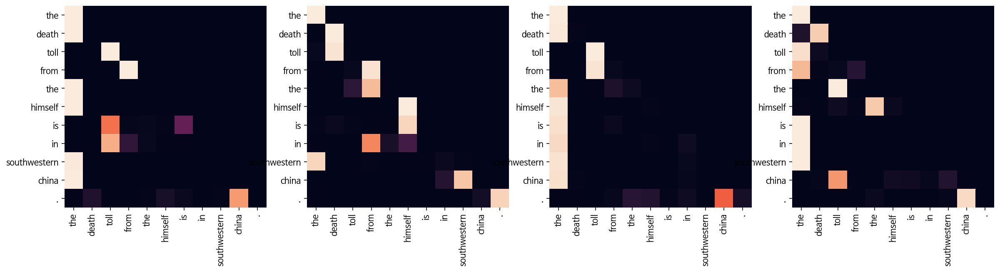

Decoder Src Layer 1


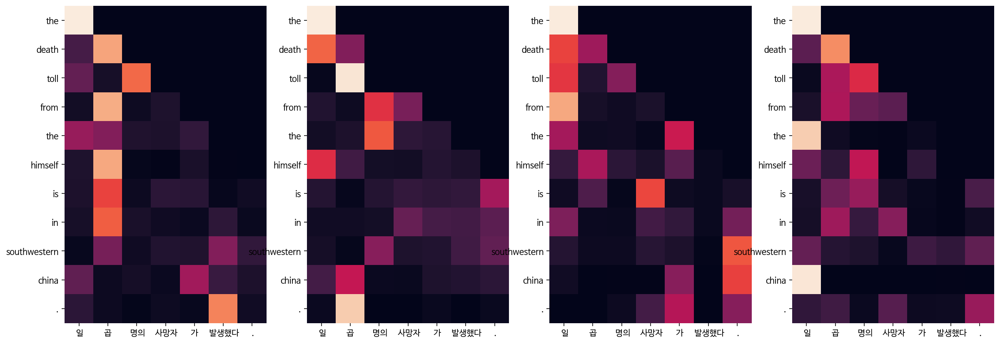

Decoder Self Layer 2


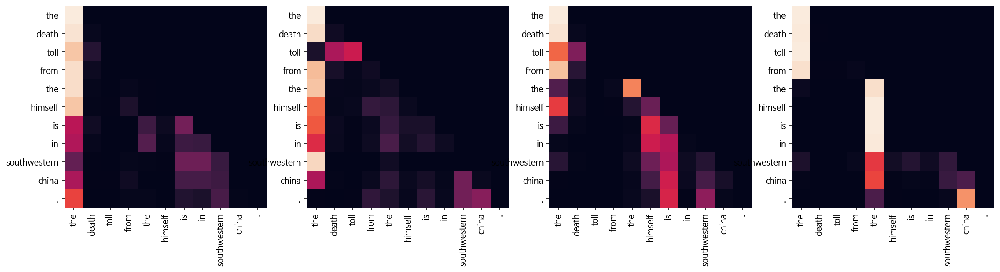

Decoder Src Layer 2


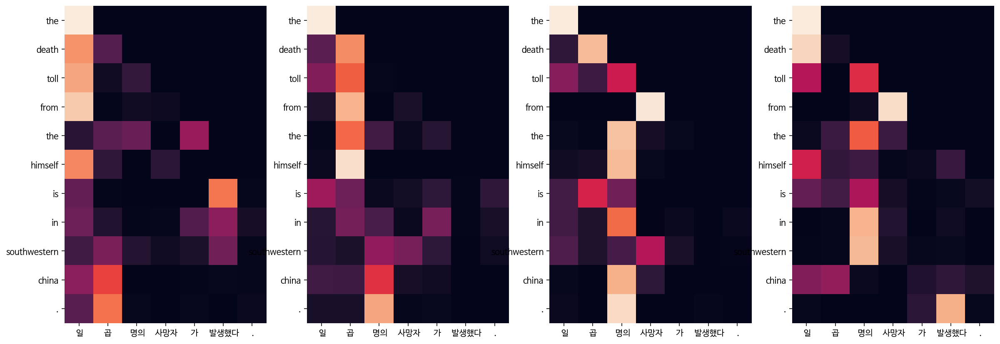

Epoch  6: 100%|██████████| 8507/8507 [19:15<00:00,  7.36it/s, Loss 2.0423]


Input: 오바마는 대통령이다.
Predicted translation: obama is expected to be president .
Encoder Layer 1


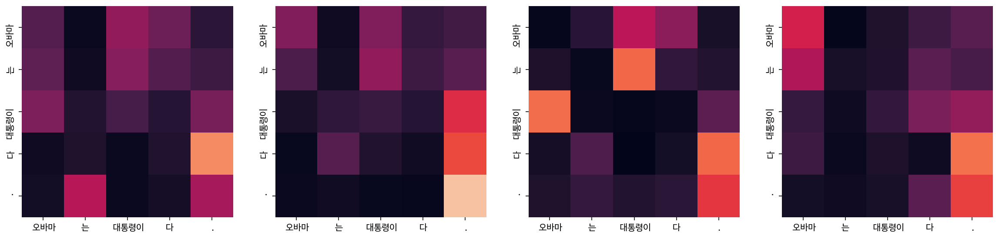

Encoder Layer 2


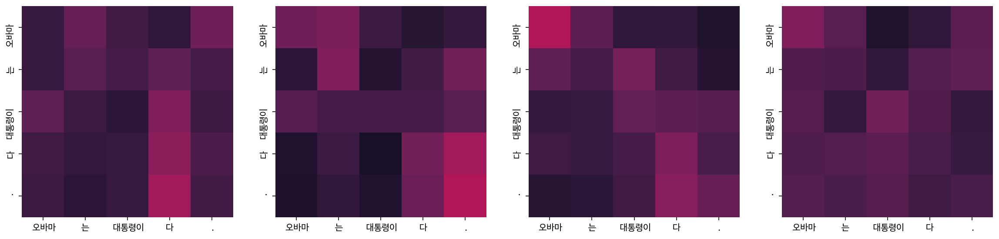

Decoder Self Layer 1


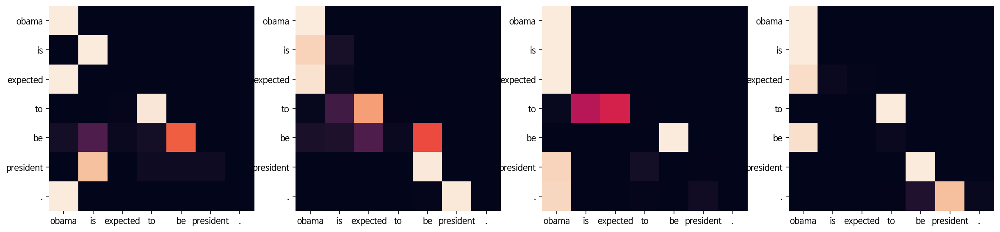

Decoder Src Layer 1


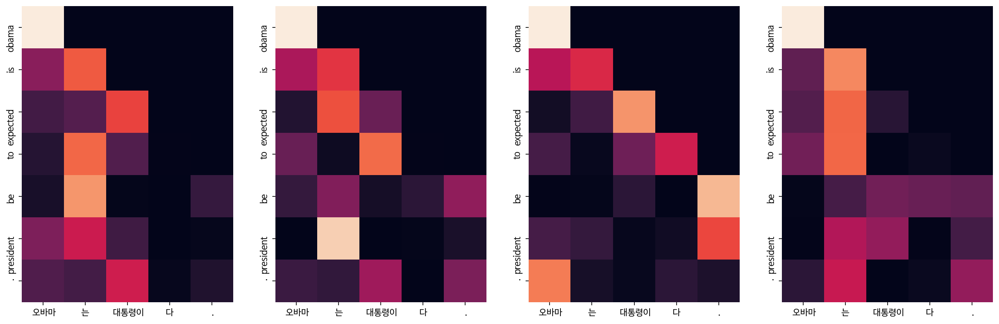

Decoder Self Layer 2


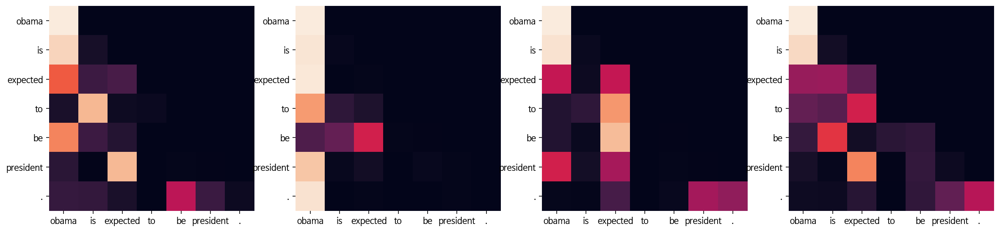

Decoder Src Layer 2


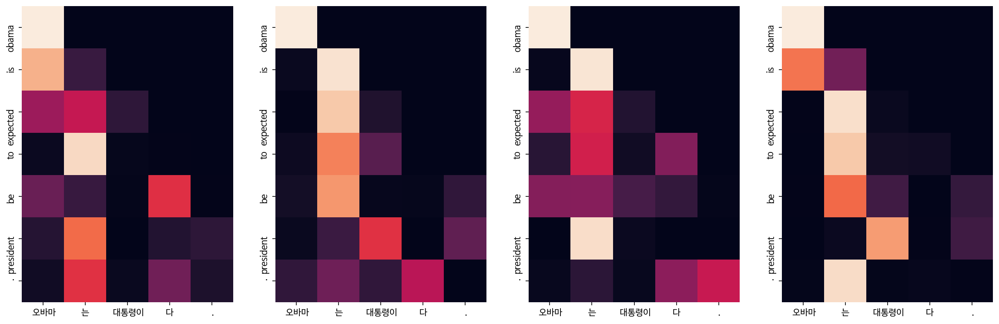

Input: 시민들은 도시 속에 산다.
Predicted translation: the city s most asked for a meter in town .
Encoder Layer 1


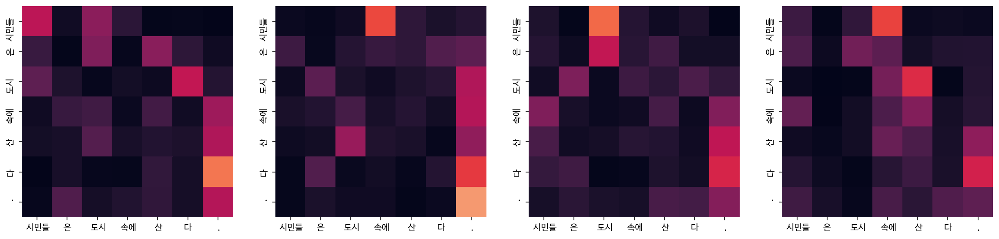

Encoder Layer 2


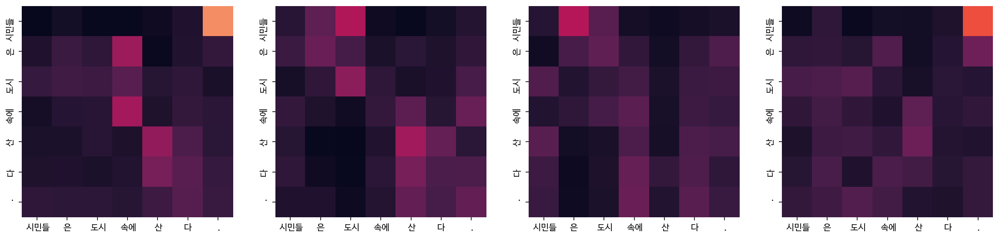

Decoder Self Layer 1


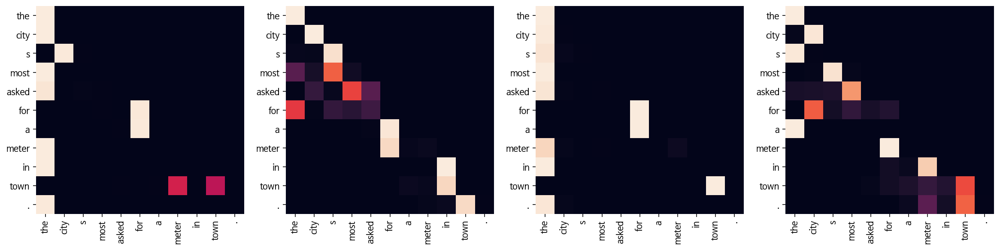

Decoder Src Layer 1


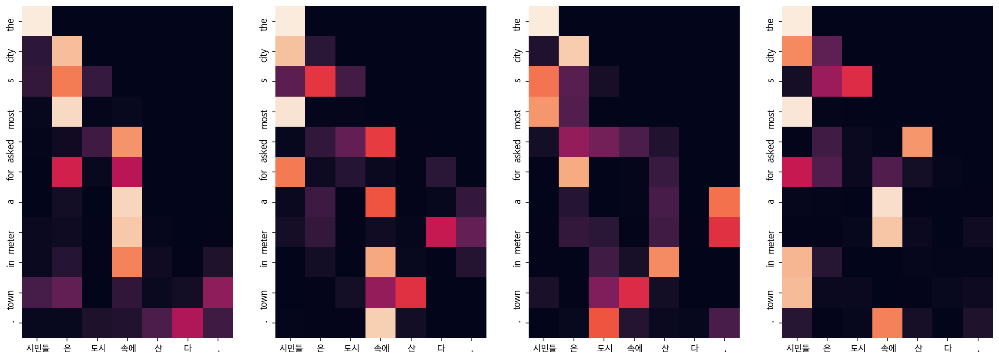

Decoder Self Layer 2


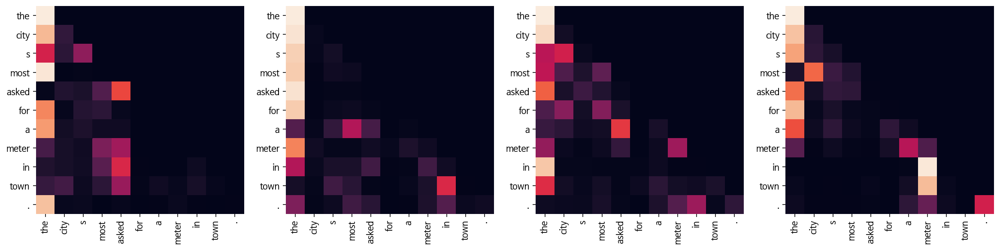

Decoder Src Layer 2


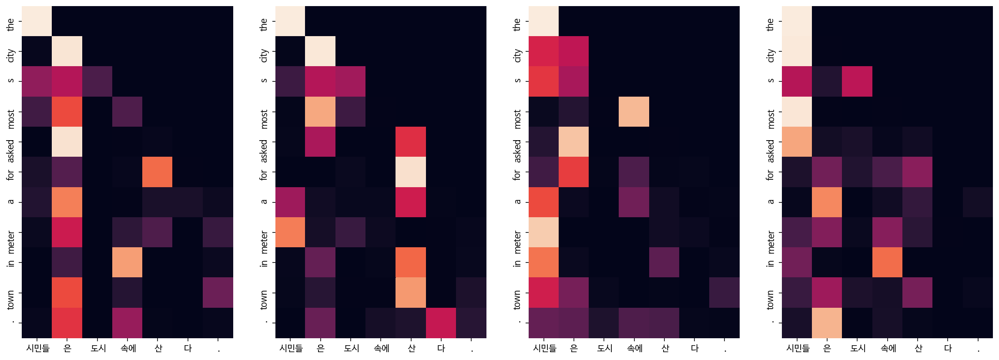

Input: 커피는 필요 없다.
Predicted translation: even if you need to do .
Encoder Layer 1


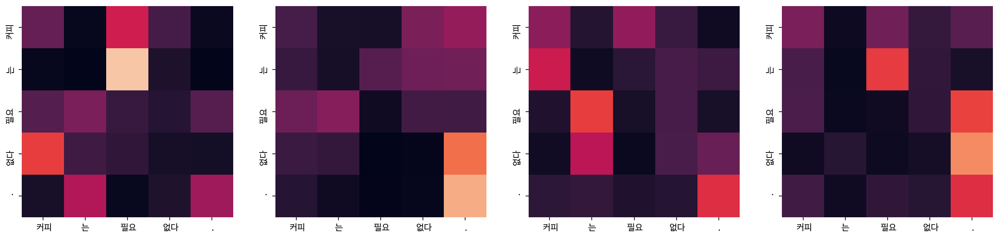

Encoder Layer 2


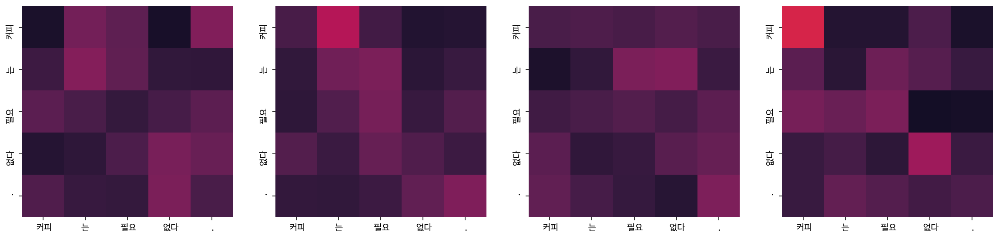

Decoder Self Layer 1


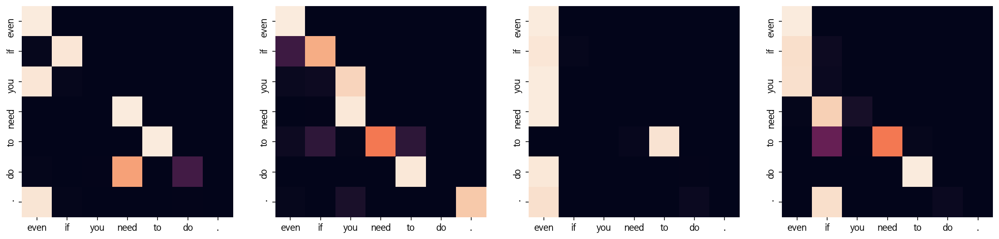

Decoder Src Layer 1


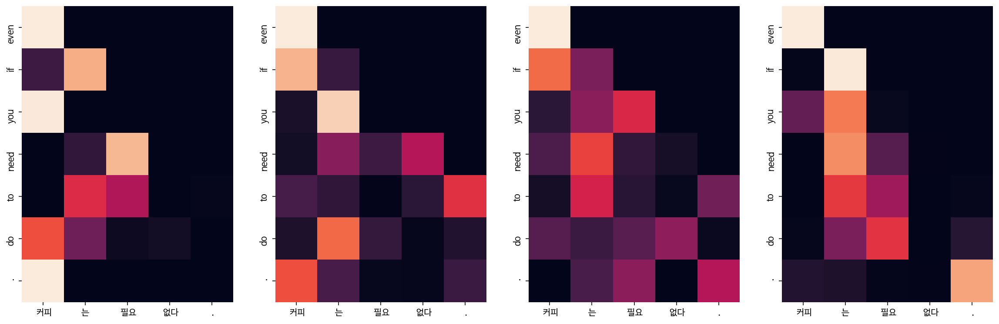

Decoder Self Layer 2


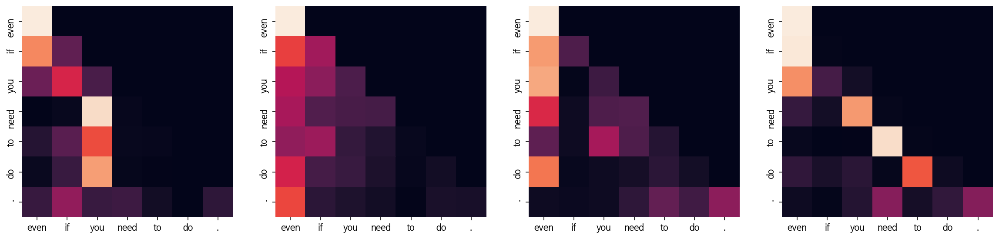

Decoder Src Layer 2


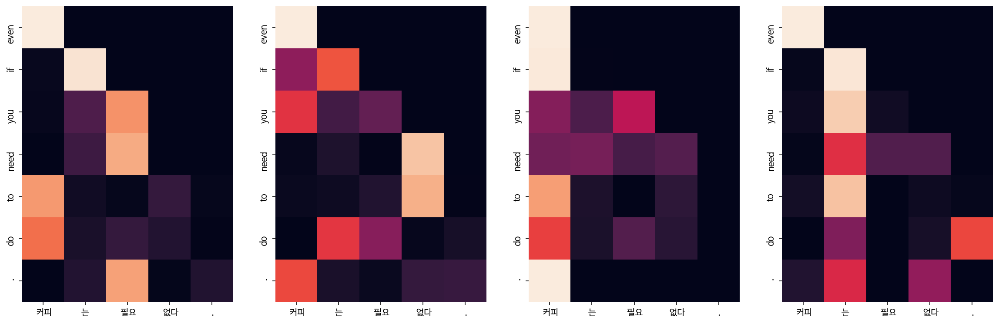

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: in the mostly incidents , three are the other deads .
Encoder Layer 1


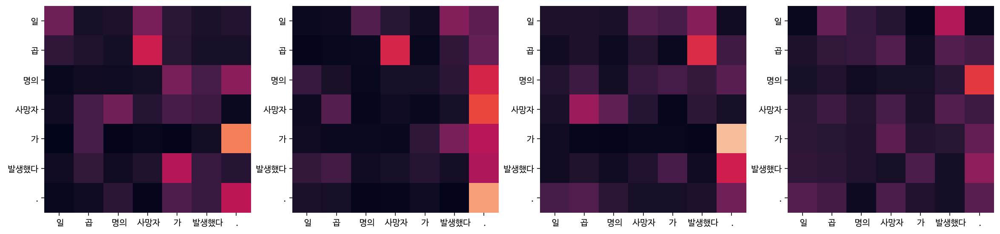

Encoder Layer 2


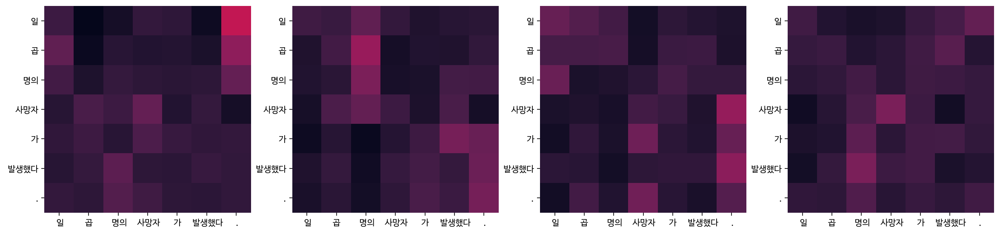

Decoder Self Layer 1


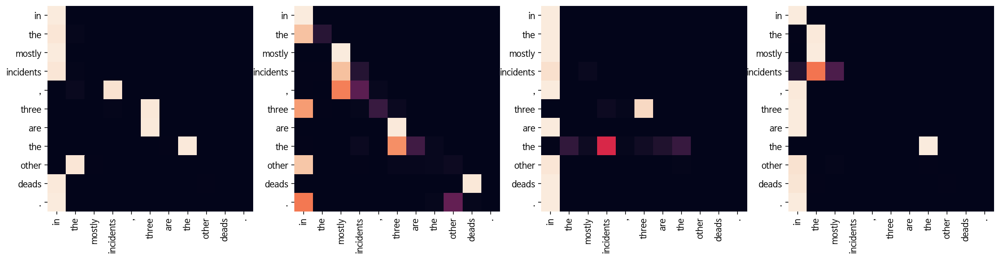

Decoder Src Layer 1


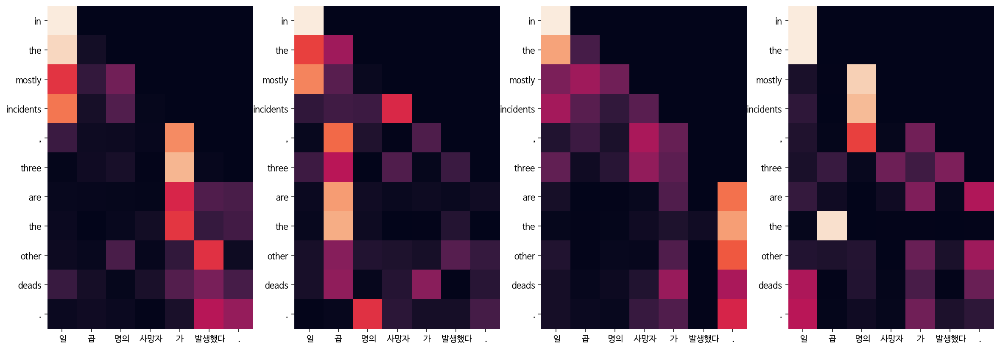

Decoder Self Layer 2


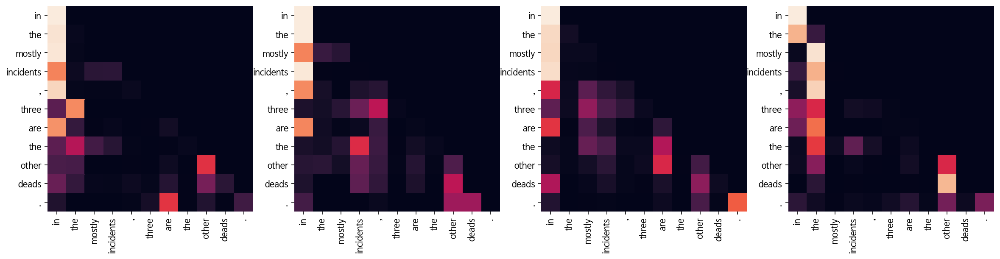

Decoder Src Layer 2


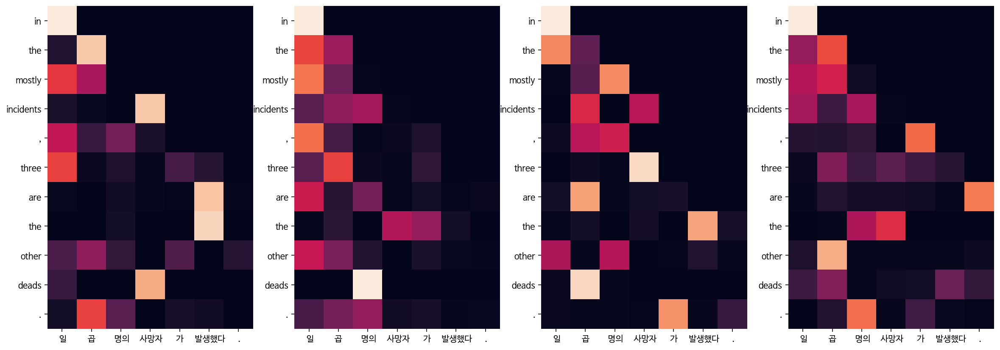

Epoch  7: 100%|██████████| 8507/8507 [19:17<00:00,  7.35it/s, Loss 1.8303]


Input: 오바마는 대통령이다.
Predicted translation: obama has a great deal .
Encoder Layer 1


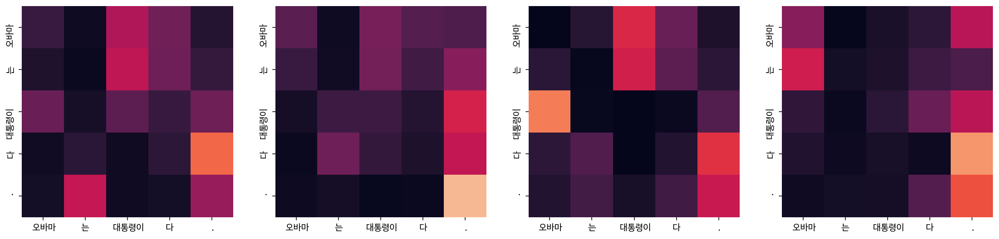

Encoder Layer 2


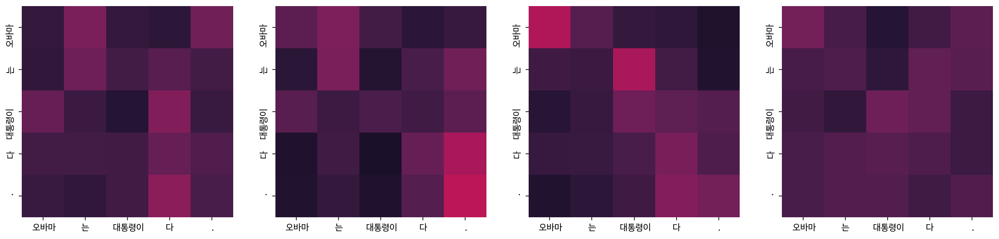

Decoder Self Layer 1


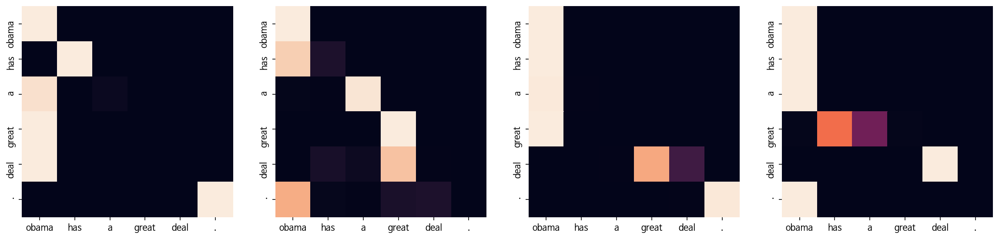

Decoder Src Layer 1


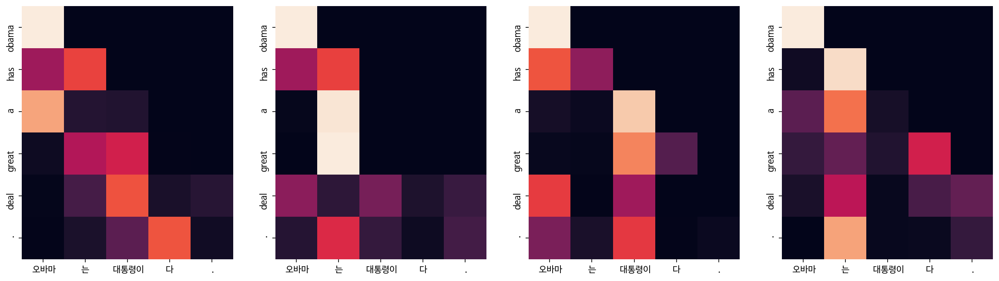

Decoder Self Layer 2


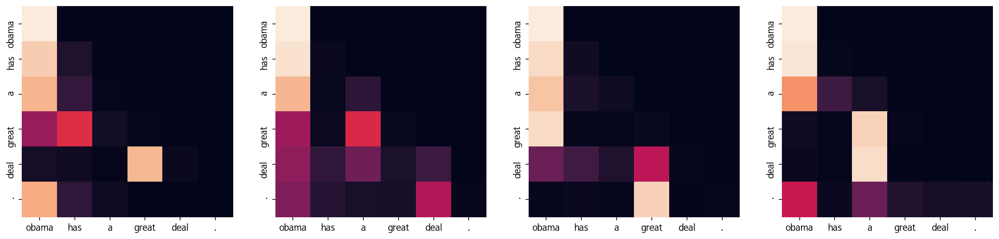

Decoder Src Layer 2


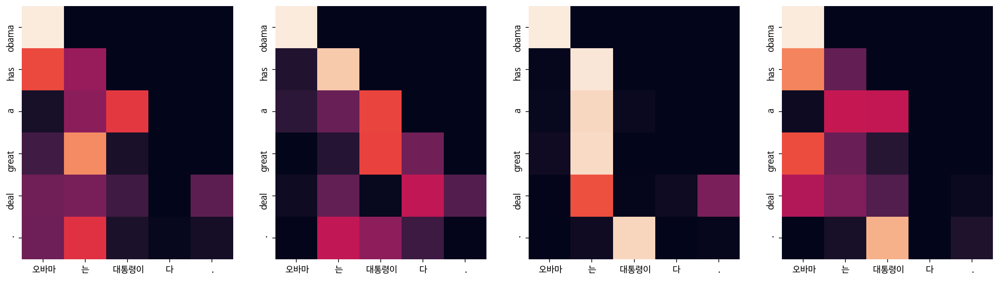

Input: 시민들은 도시 속에 산다.
Predicted translation: they are one of the city s city s city s city s city s three city city citys .
Encoder Layer 1


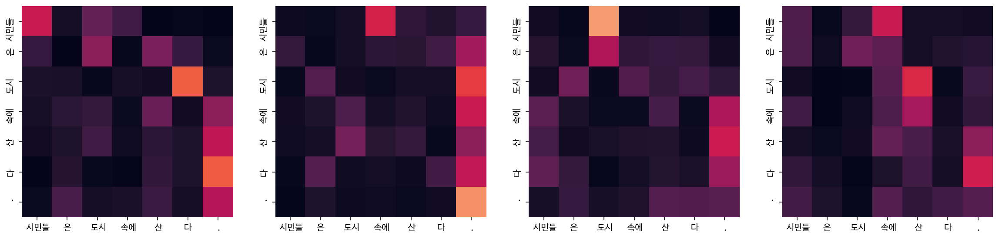

Encoder Layer 2


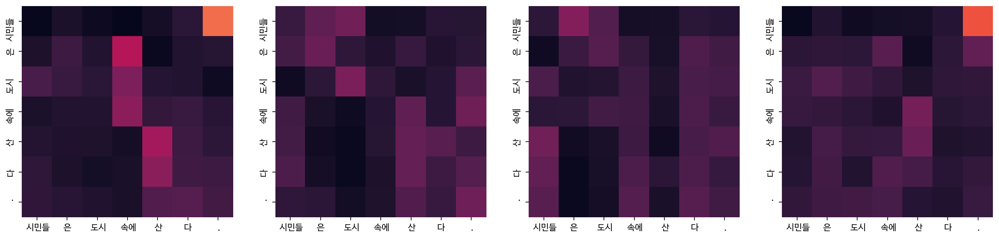

Decoder Self Layer 1


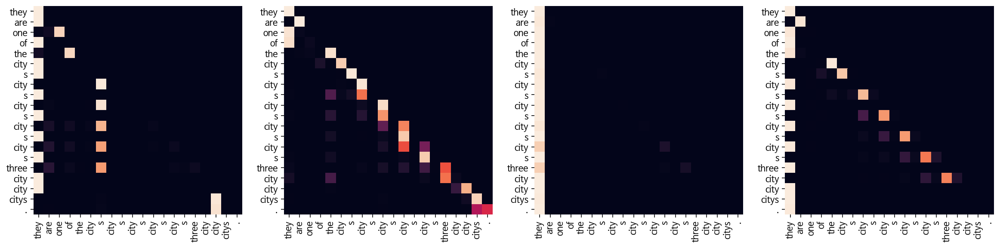

Decoder Src Layer 1


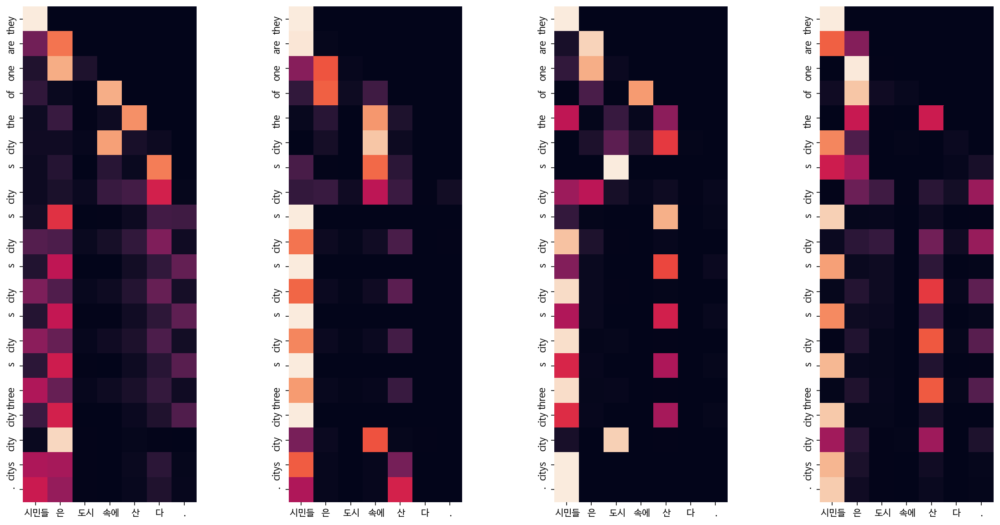

Decoder Self Layer 2


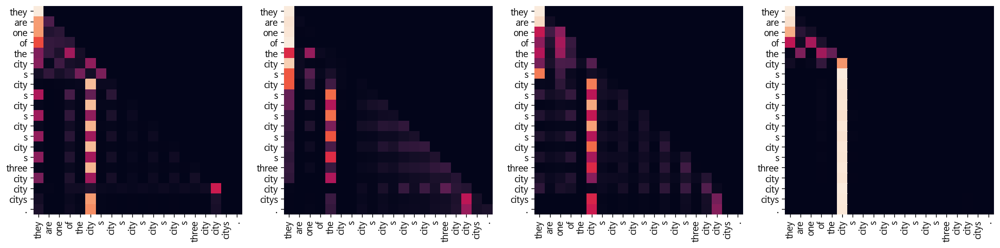

Decoder Src Layer 2


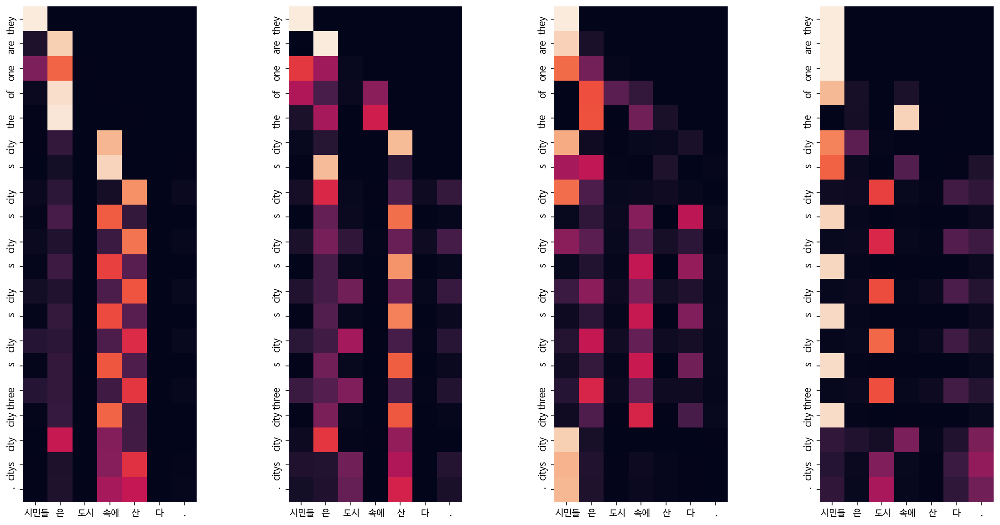

Input: 커피는 필요 없다.
Predicted translation: coffee needs to durable coffee .
Encoder Layer 1


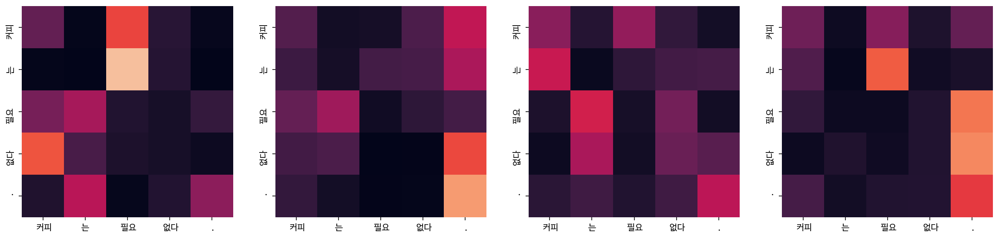

Encoder Layer 2


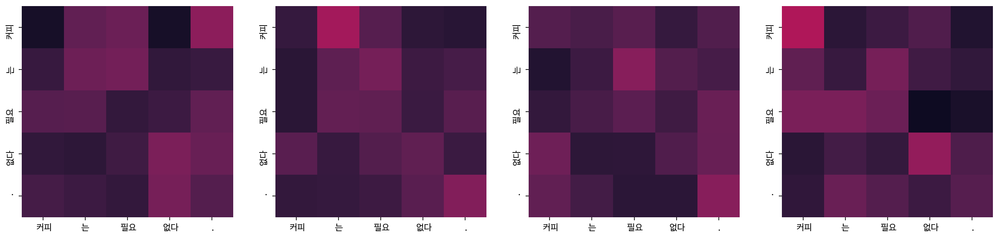

Decoder Self Layer 1


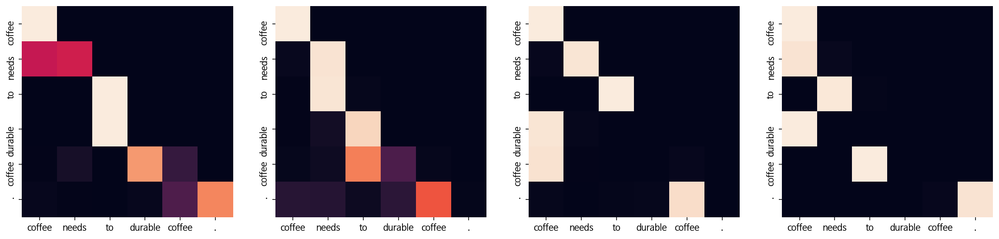

Decoder Src Layer 1


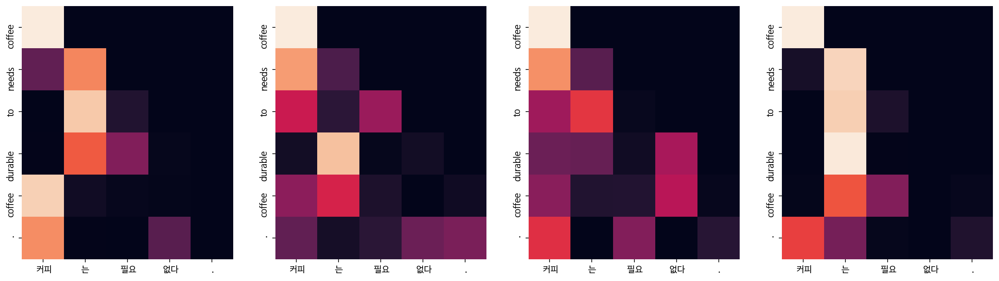

Decoder Self Layer 2


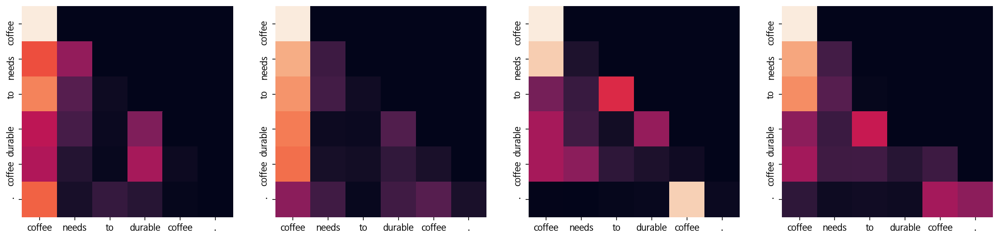

Decoder Src Layer 2


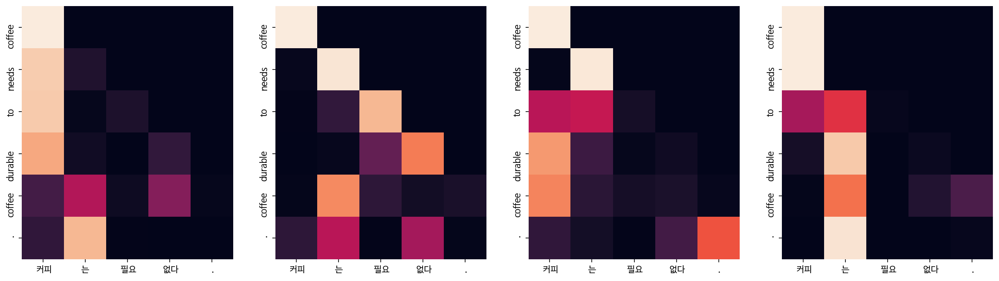

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: six people were killed tuesday .
Encoder Layer 1


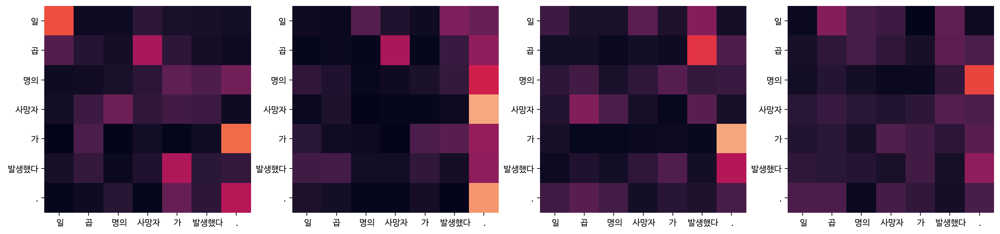

Encoder Layer 2


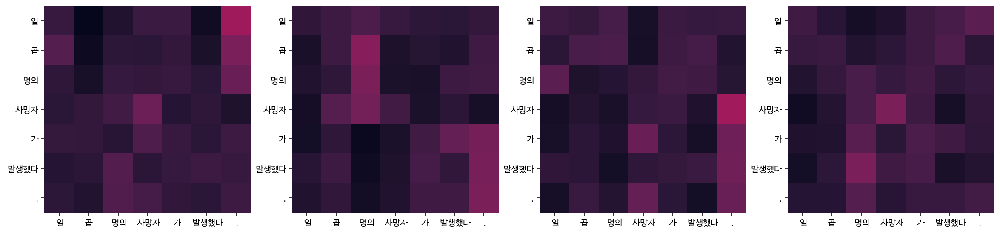

Decoder Self Layer 1


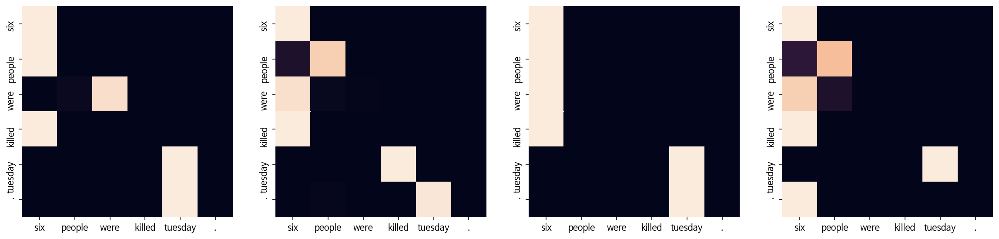

Decoder Src Layer 1


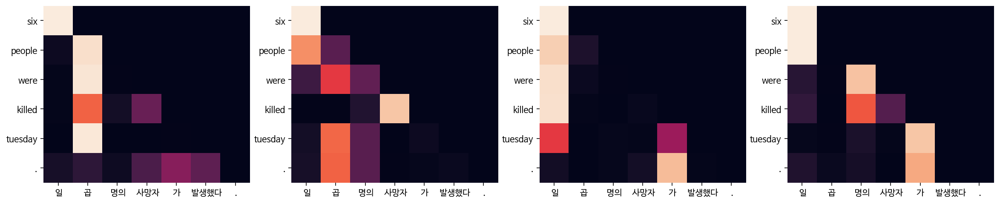

Decoder Self Layer 2


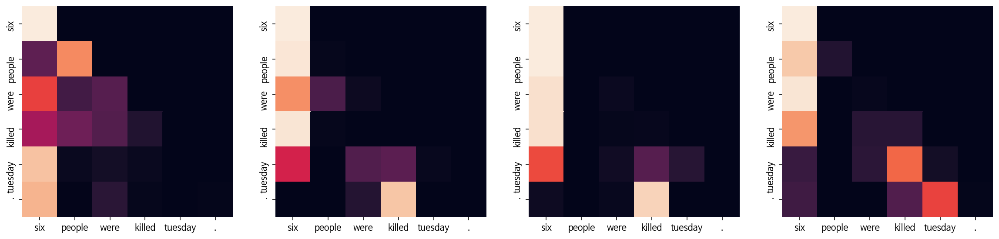

Decoder Src Layer 2


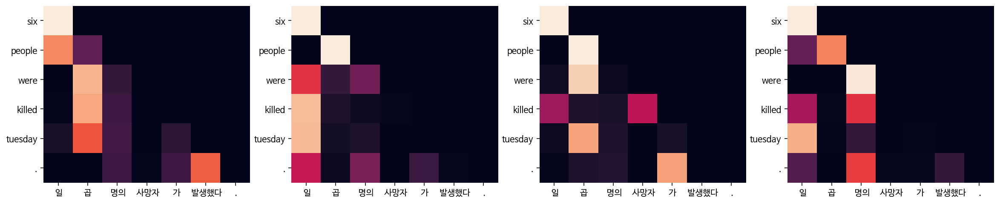

Epoch  8: 100%|██████████| 8507/8507 [19:20<00:00,  7.33it/s, Loss 1.6689]


Input: 오바마는 대통령이다.
Predicted translation: obama s speeches can be , but he s not the president
Encoder Layer 1


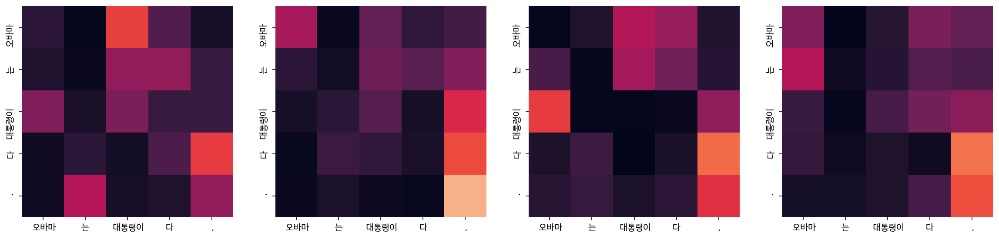

Encoder Layer 2


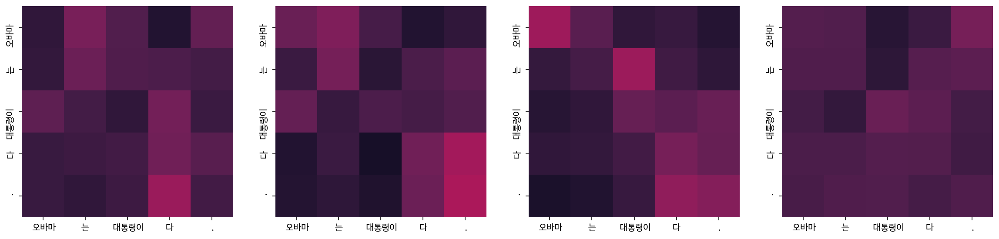

Decoder Self Layer 1


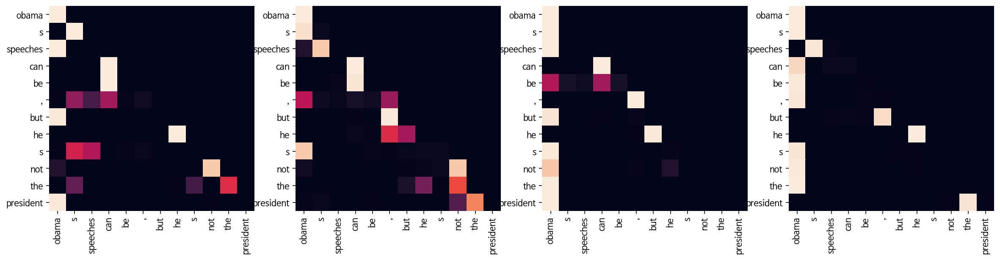

Decoder Src Layer 1


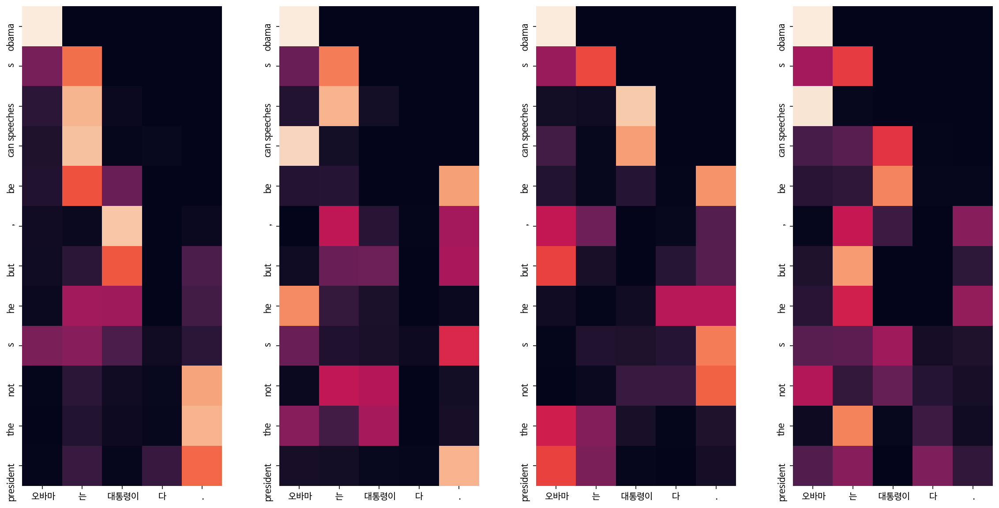

Decoder Self Layer 2


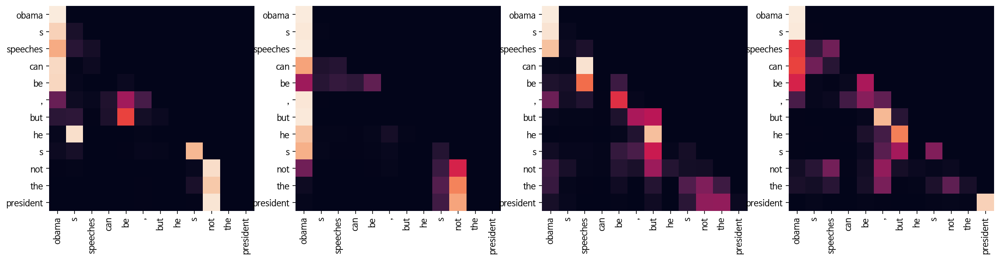

Decoder Src Layer 2


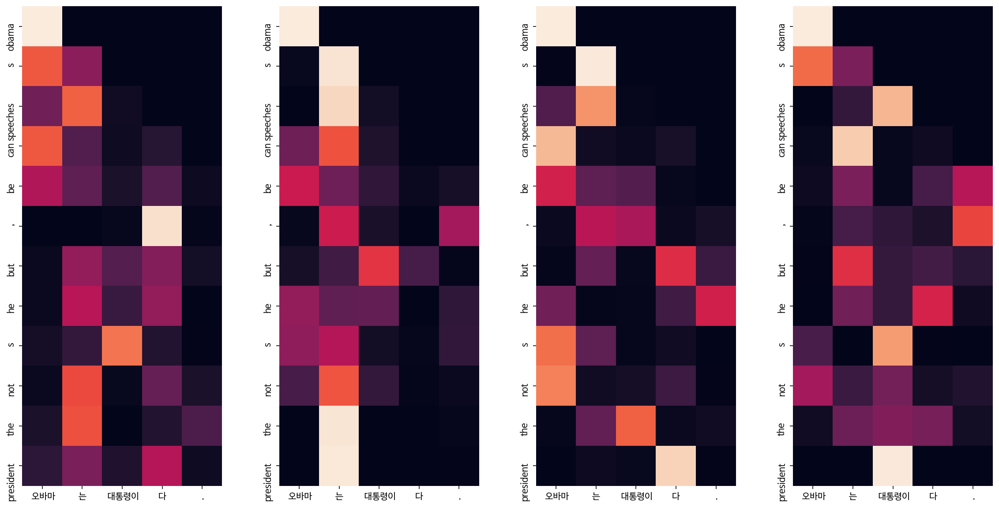

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is also part of a city that has the city of
Encoder Layer 1


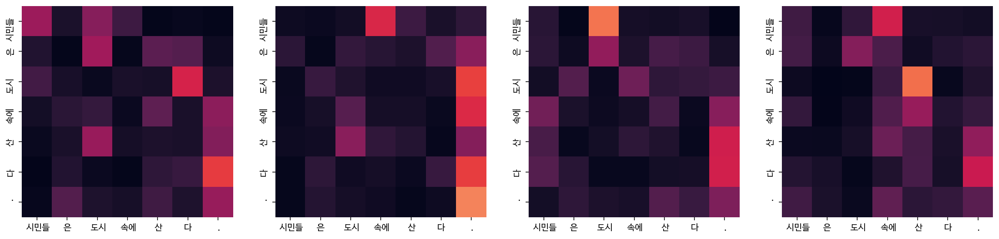

Encoder Layer 2


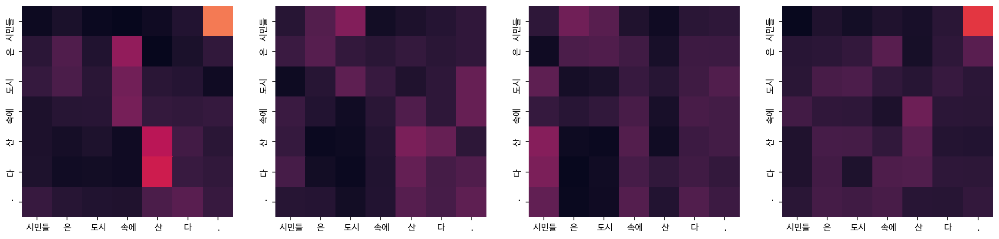

Decoder Self Layer 1


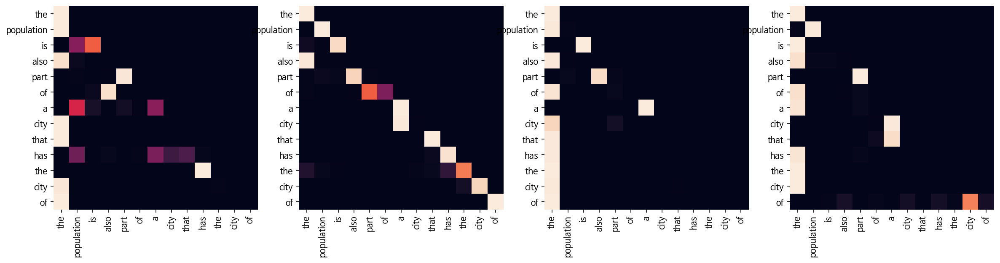

Decoder Src Layer 1


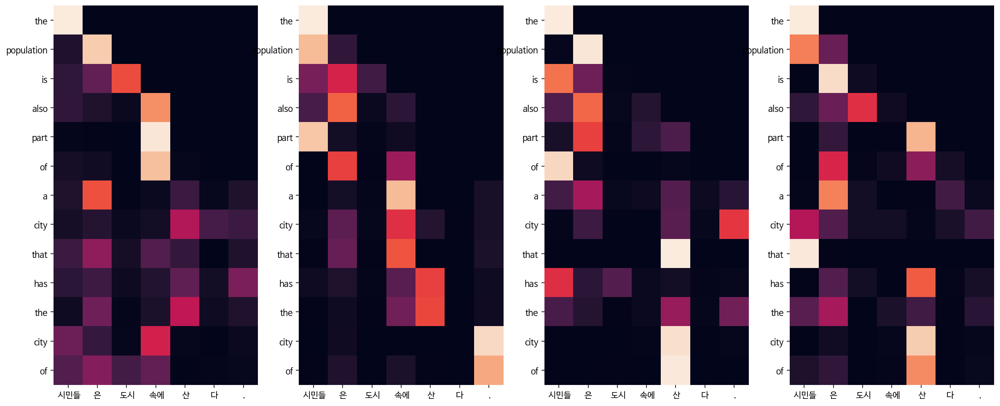

Decoder Self Layer 2


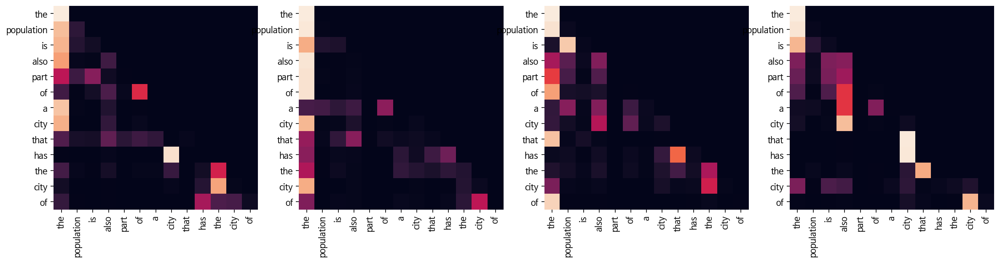

Decoder Src Layer 2


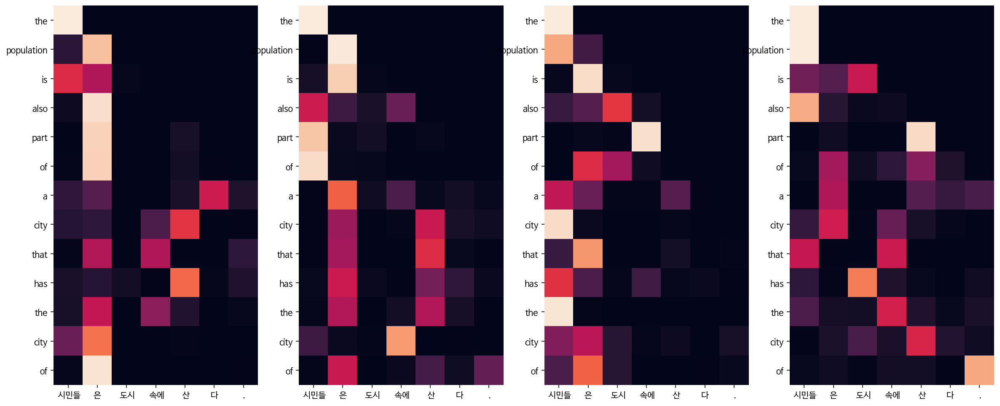

Input: 커피는 필요 없다.
Predicted translation: coffee don t need to be during the coffee .
Encoder Layer 1


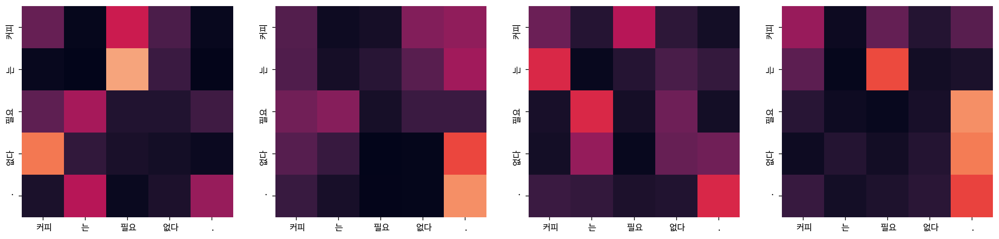

Encoder Layer 2


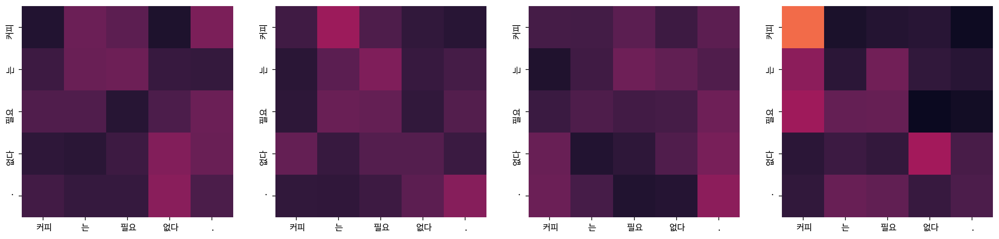

Decoder Self Layer 1


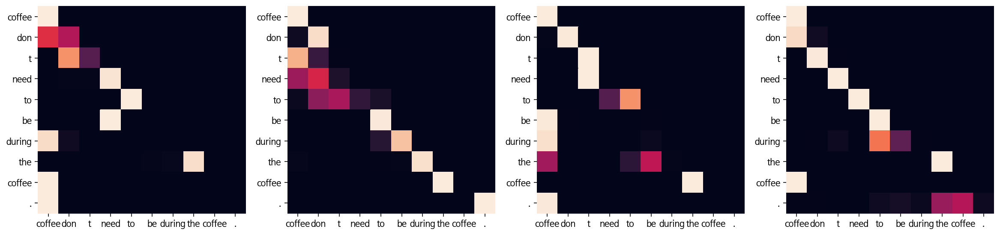

Decoder Src Layer 1


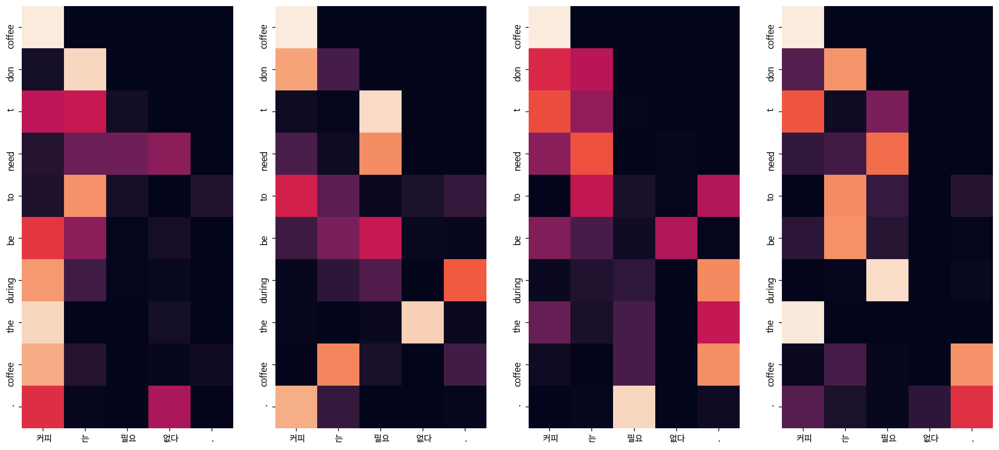

Decoder Self Layer 2


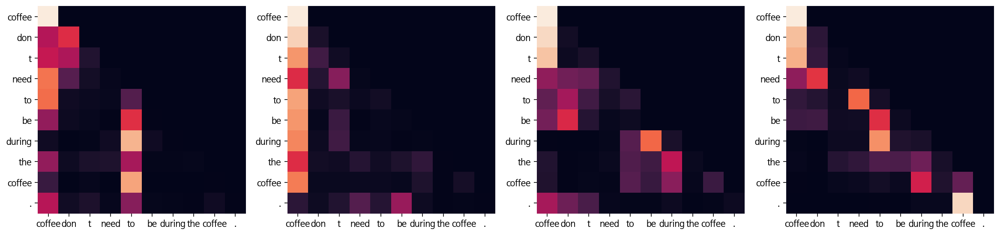

Decoder Src Layer 2


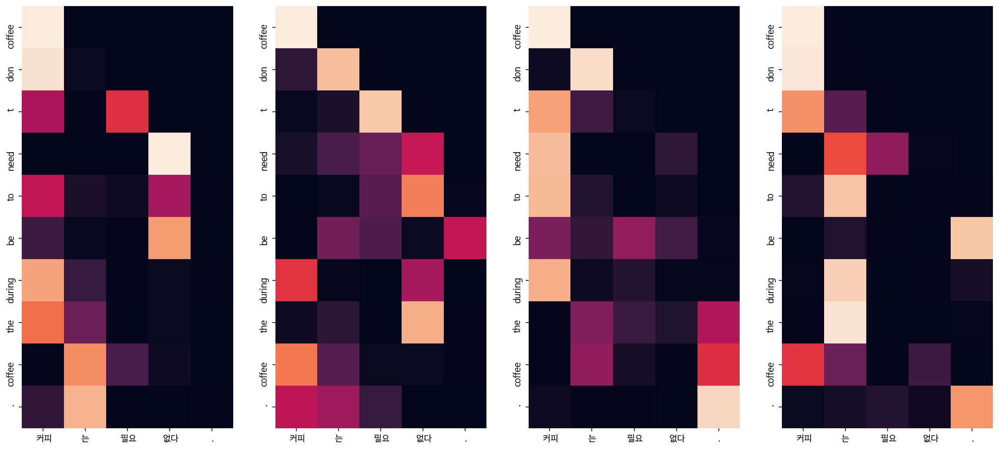

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people were arrived saturday .
Encoder Layer 1


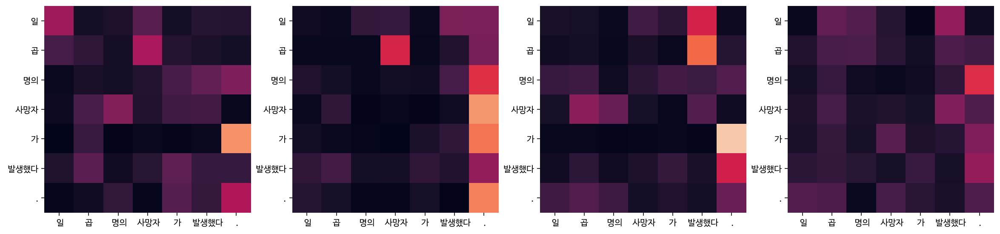

Encoder Layer 2


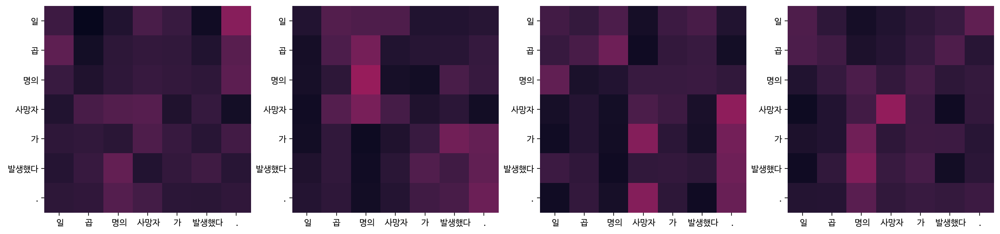

Decoder Self Layer 1


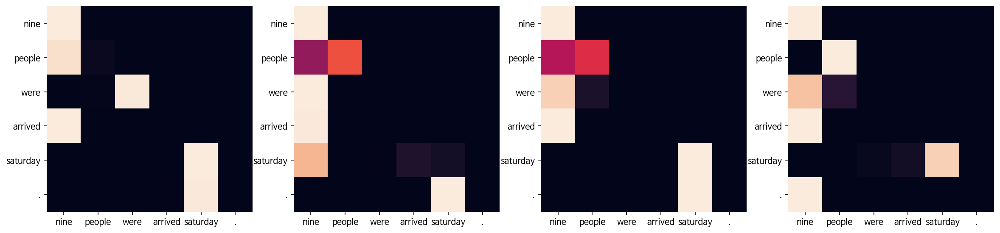

Decoder Src Layer 1


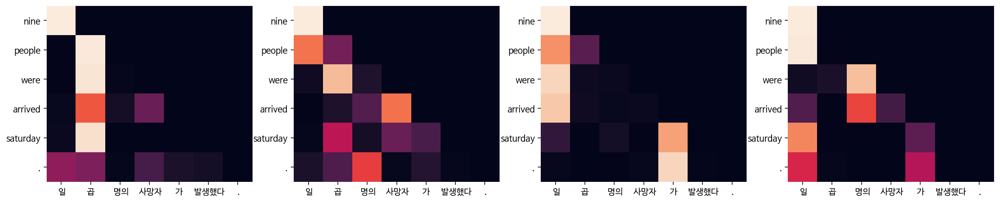

Decoder Self Layer 2


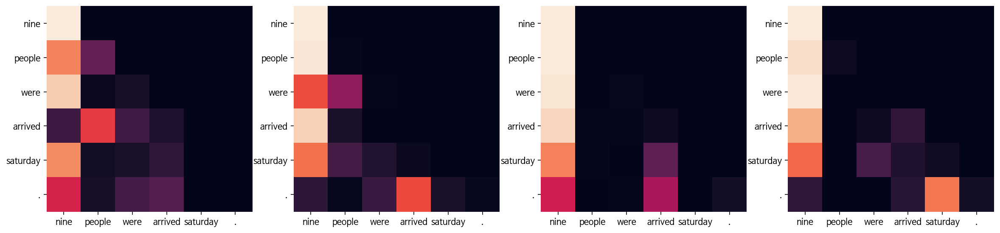

Decoder Src Layer 2


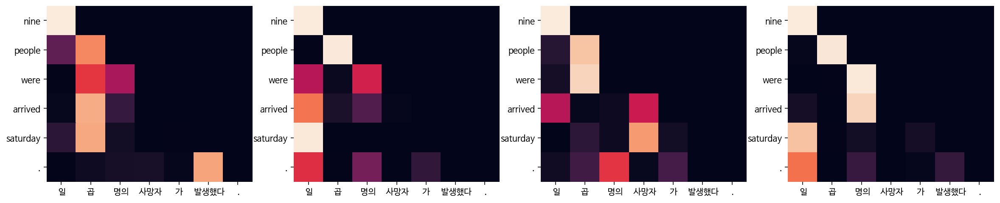

Epoch  9: 100%|██████████| 8507/8507 [19:41<00:00,  7.20it/s, Loss 1.5447]


Input: 오바마는 대통령이다.
Predicted translation: obama s president is , he s got back to the president .
Encoder Layer 1


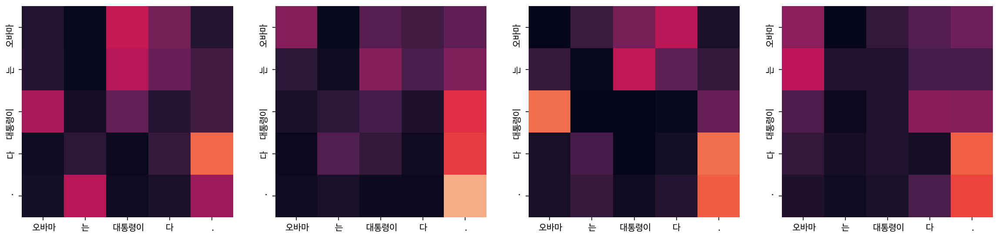

Encoder Layer 2


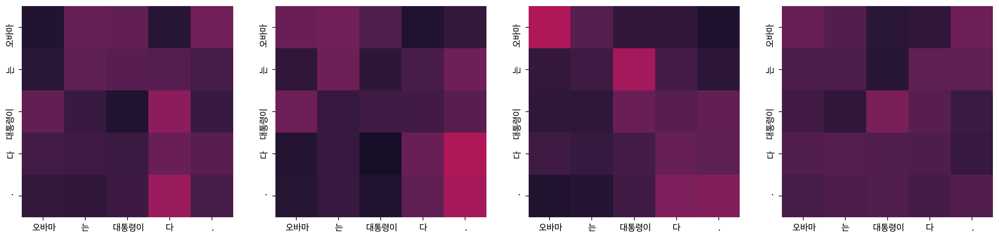

Decoder Self Layer 1


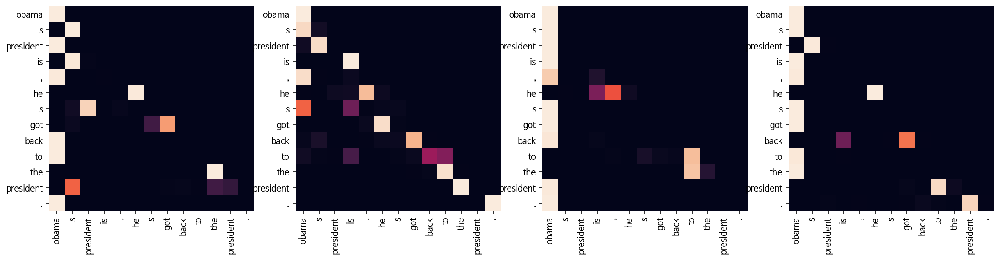

Decoder Src Layer 1


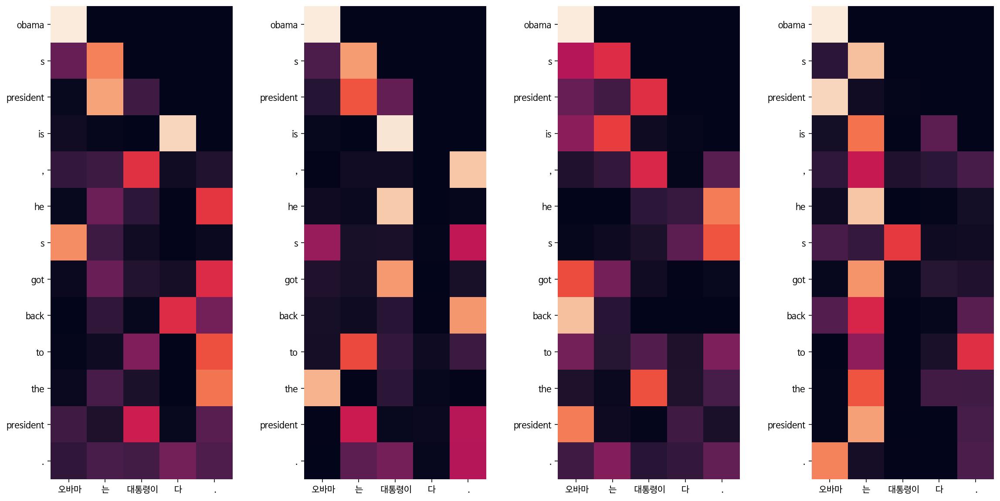

Decoder Self Layer 2


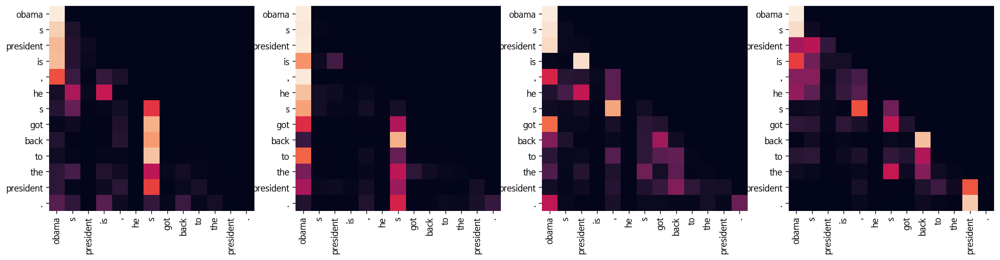

Decoder Src Layer 2


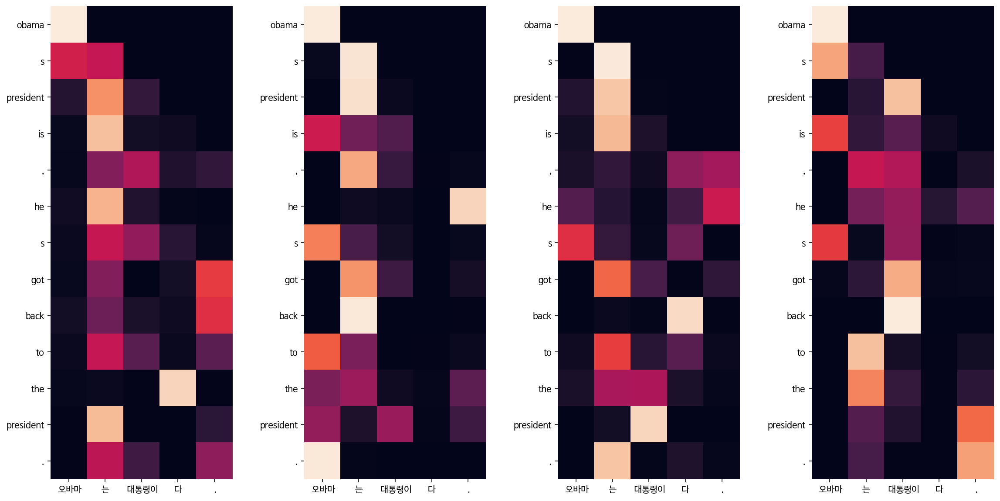

Input: 시민들은 도시 속에 산다.
Predicted translation: the city s three cities are in city .
Encoder Layer 1


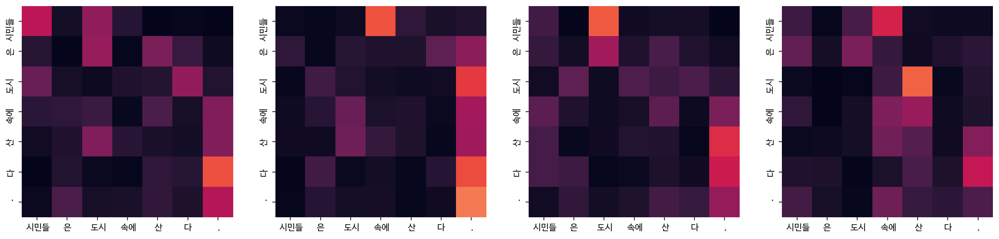

Encoder Layer 2


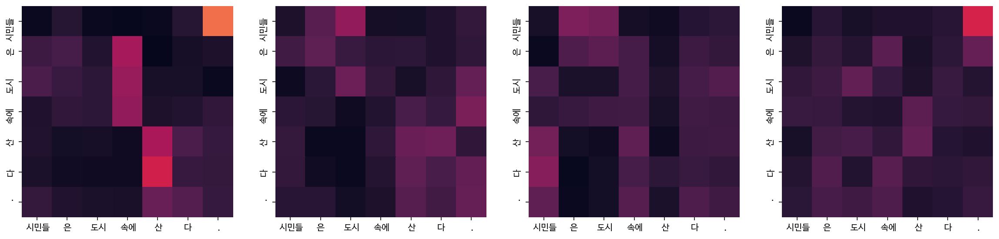

Decoder Self Layer 1


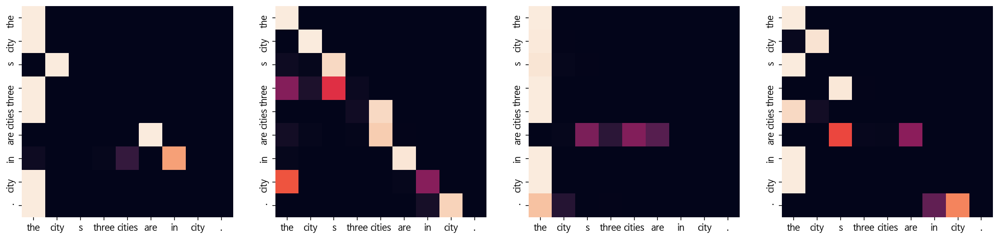

Decoder Src Layer 1


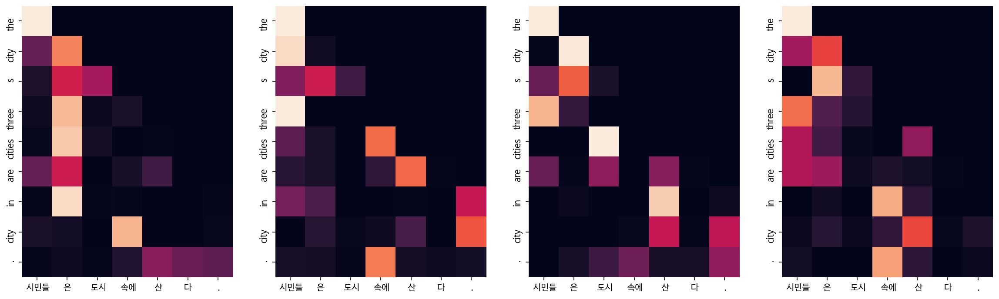

Decoder Self Layer 2


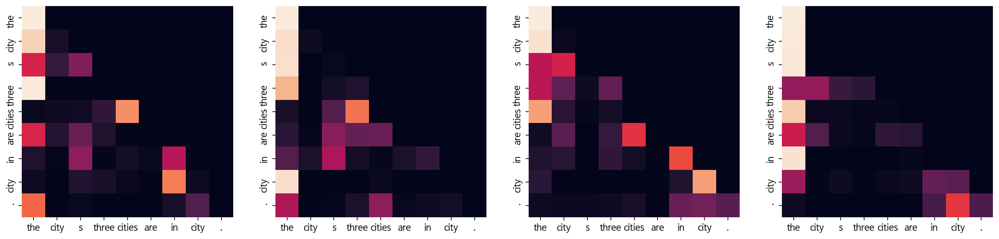

Decoder Src Layer 2


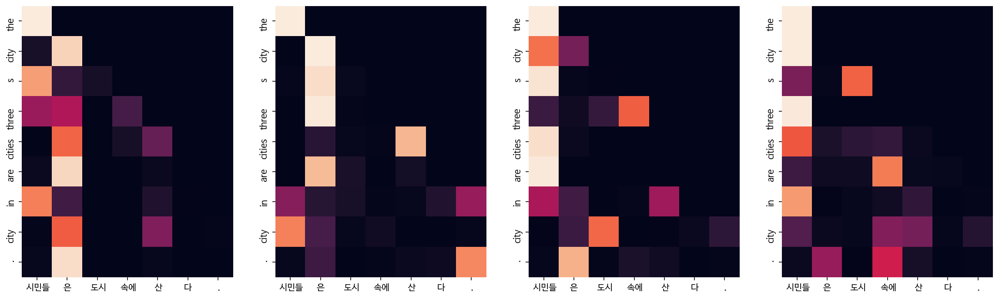

Input: 커피는 필요 없다.
Predicted translation: wednesday s coffee needs .
Encoder Layer 1


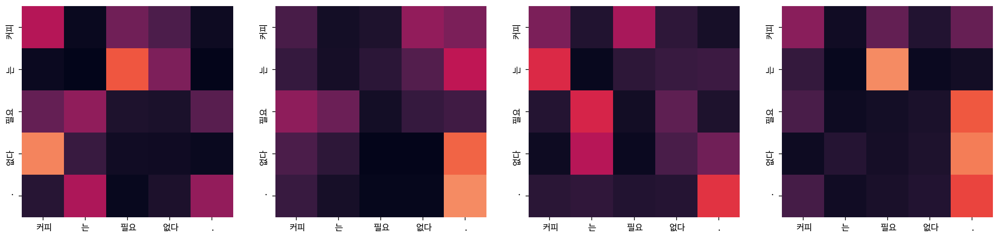

Encoder Layer 2


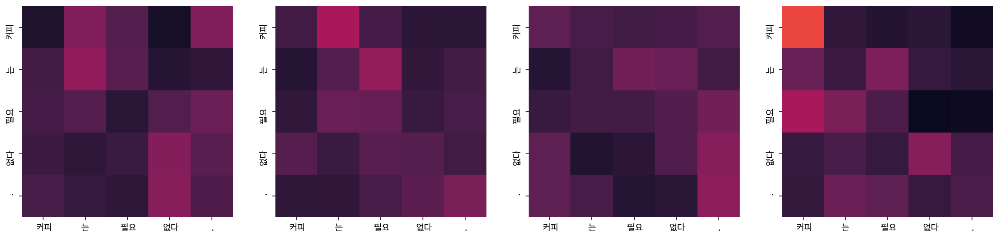

Decoder Self Layer 1


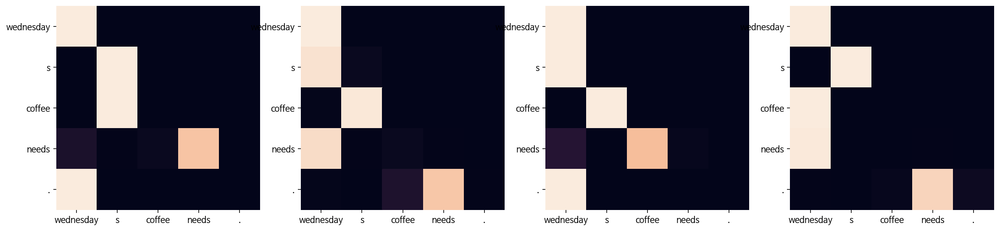

Decoder Src Layer 1


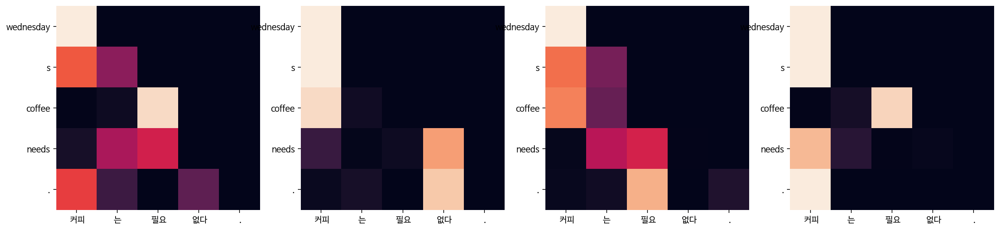

Decoder Self Layer 2


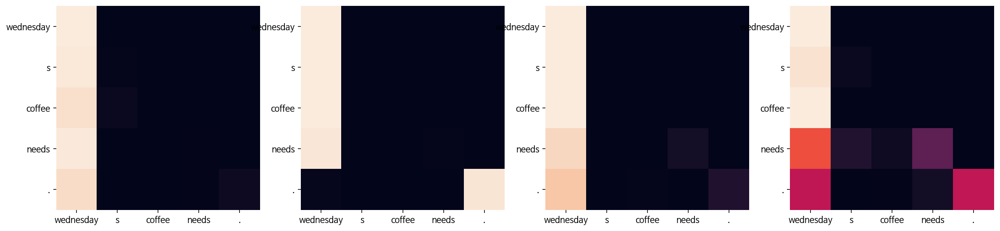

Decoder Src Layer 2


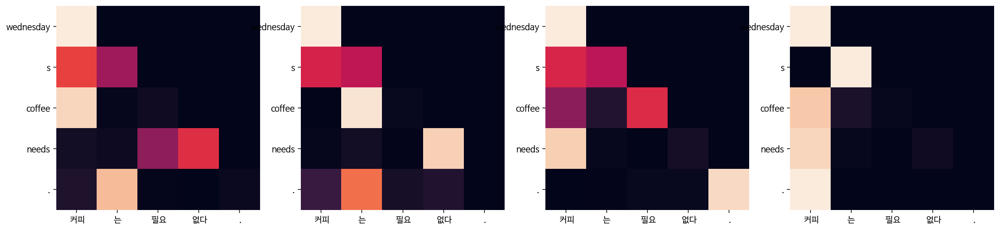

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: in the seven missing people are its all , the national disaster patrol patrol said .
Encoder Layer 1


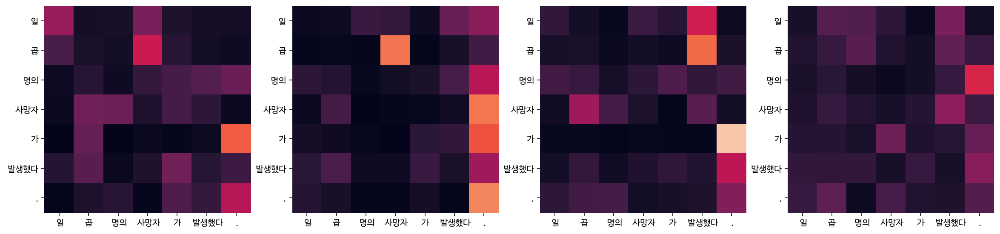

Encoder Layer 2


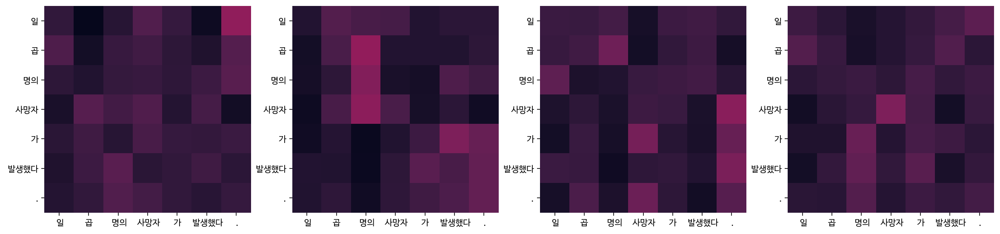

Decoder Self Layer 1


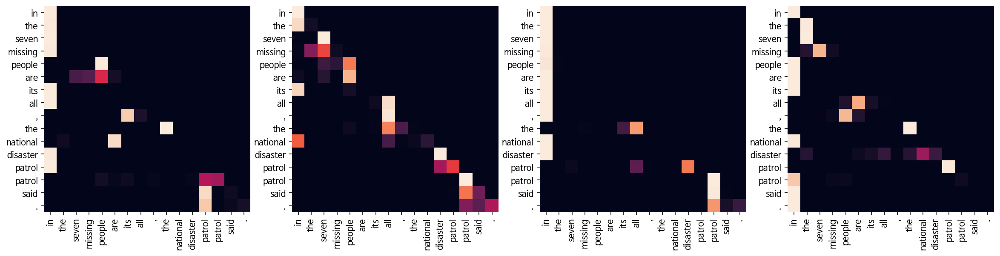

Decoder Src Layer 1


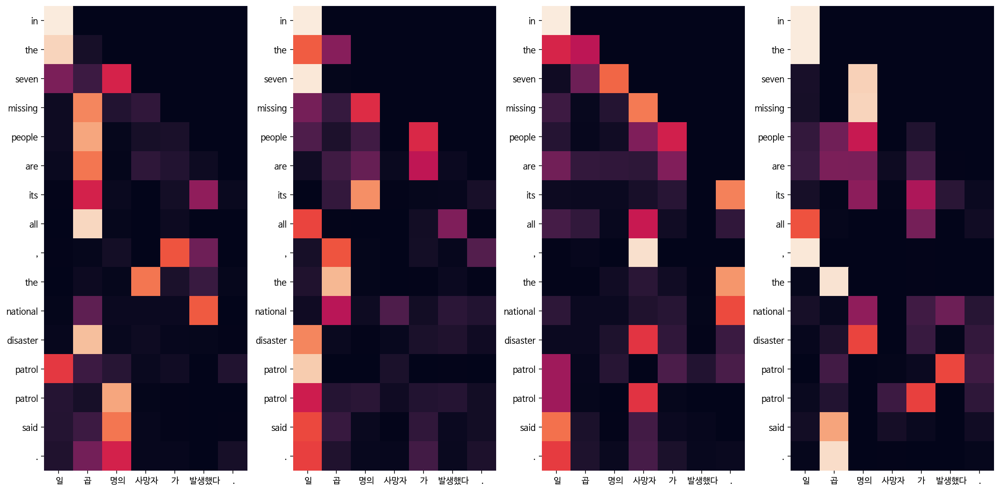

Decoder Self Layer 2


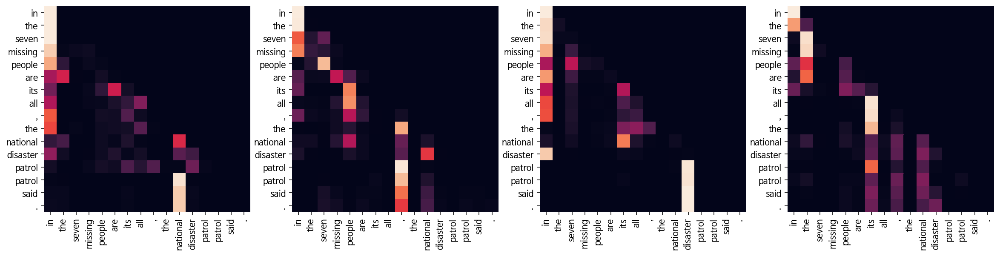

Decoder Src Layer 2


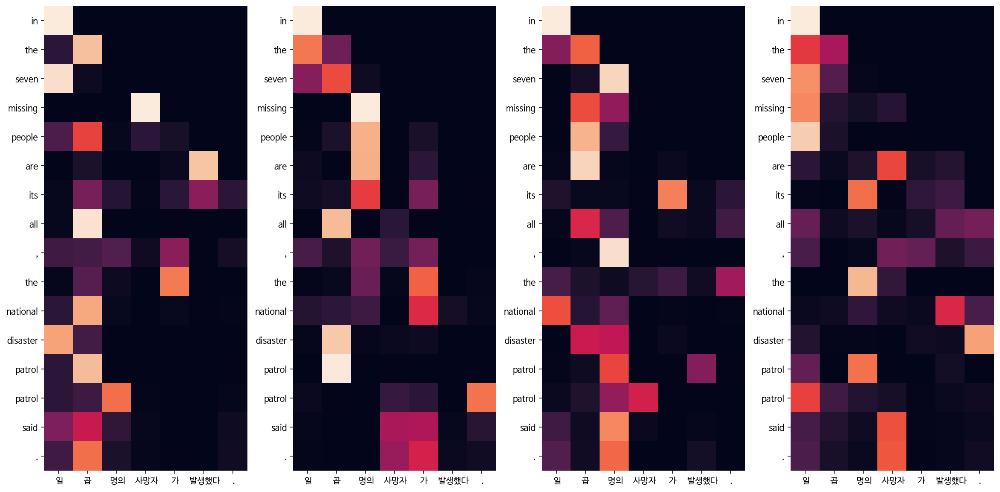

Epoch 10: 100%|██████████| 8507/8507 [19:38<00:00,  7.22it/s, Loss 1.4574]


Input: 오바마는 대통령이다.
Predicted translation: he s very proud to president .
Encoder Layer 1


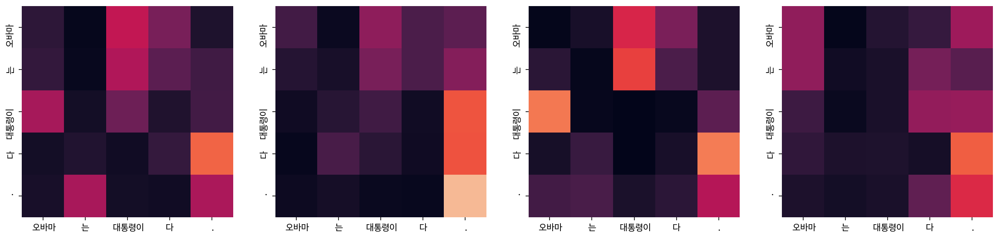

Encoder Layer 2


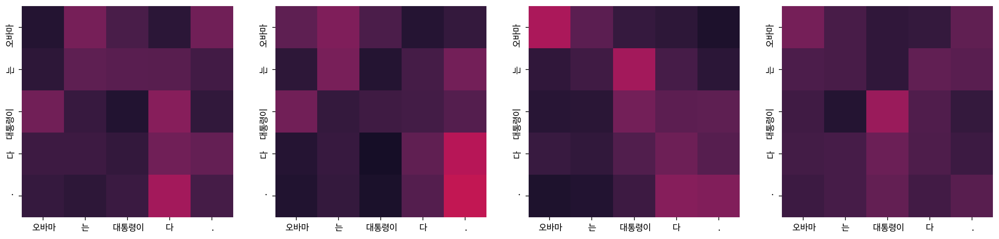

Decoder Self Layer 1


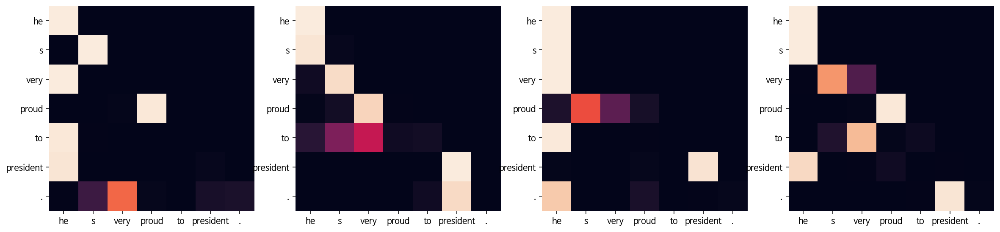

Decoder Src Layer 1


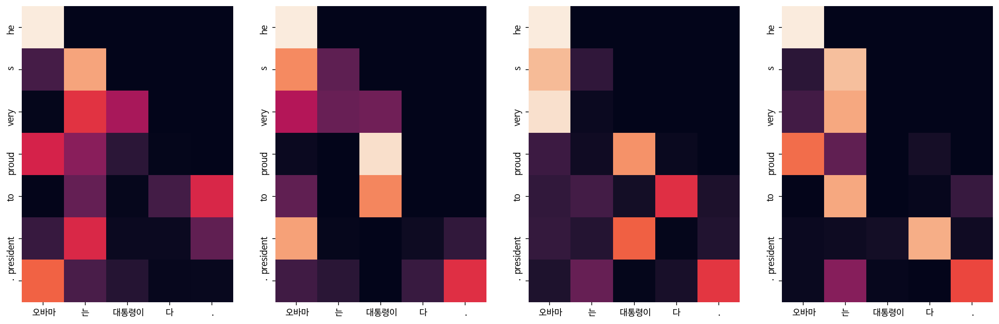

Decoder Self Layer 2


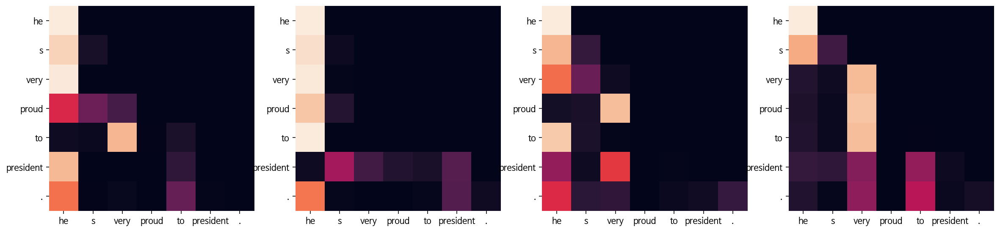

Decoder Src Layer 2


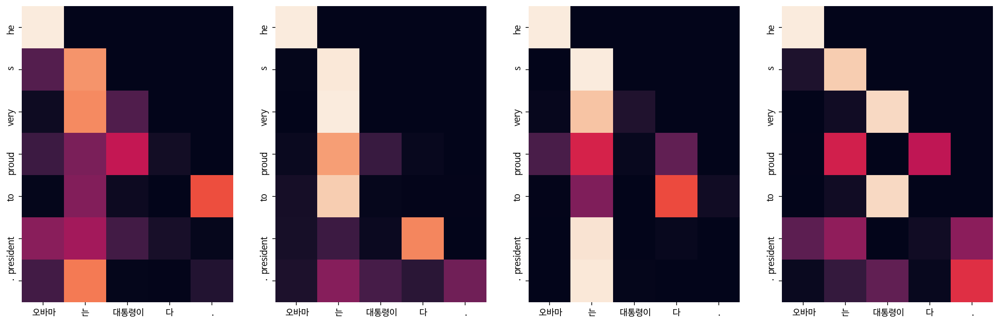

Input: 시민들은 도시 속에 산다.
Predicted translation: they are one of the mainland towns that if they can t really see .
Encoder Layer 1


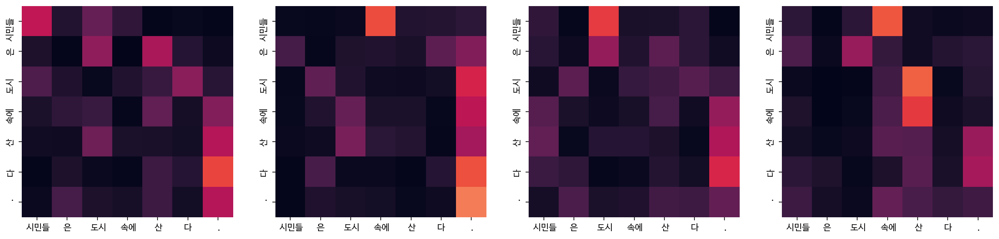

Encoder Layer 2


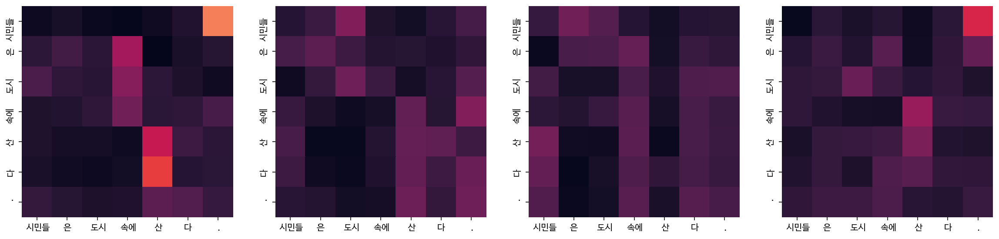

Decoder Self Layer 1


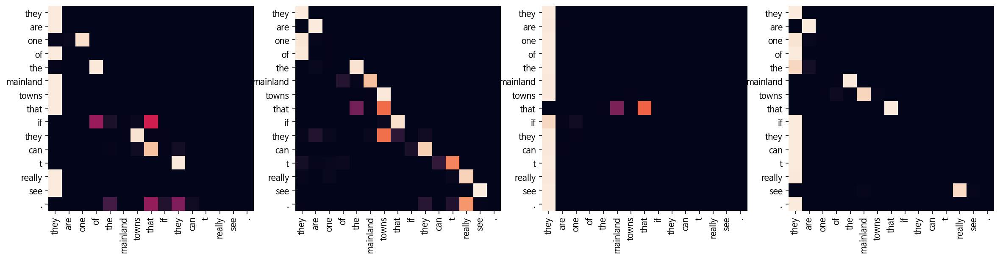

Decoder Src Layer 1


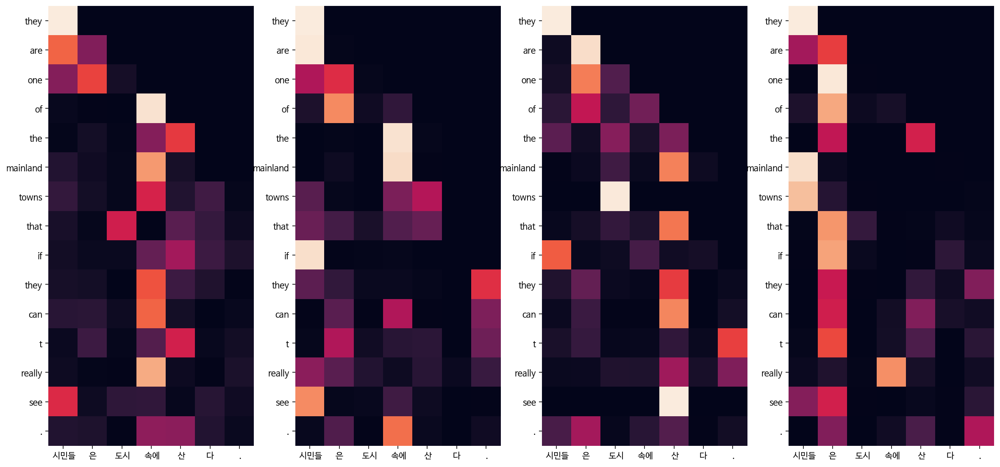

Decoder Self Layer 2


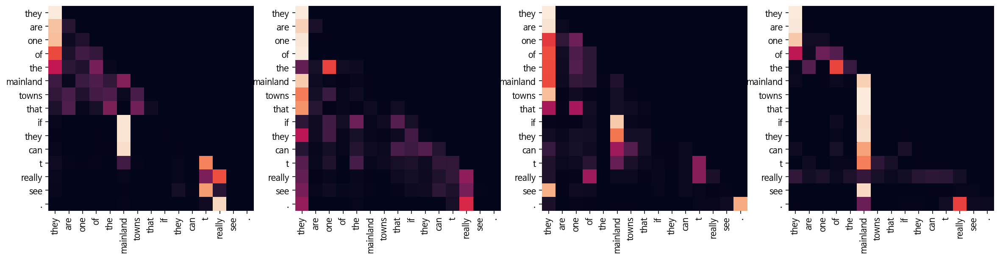

Decoder Src Layer 2


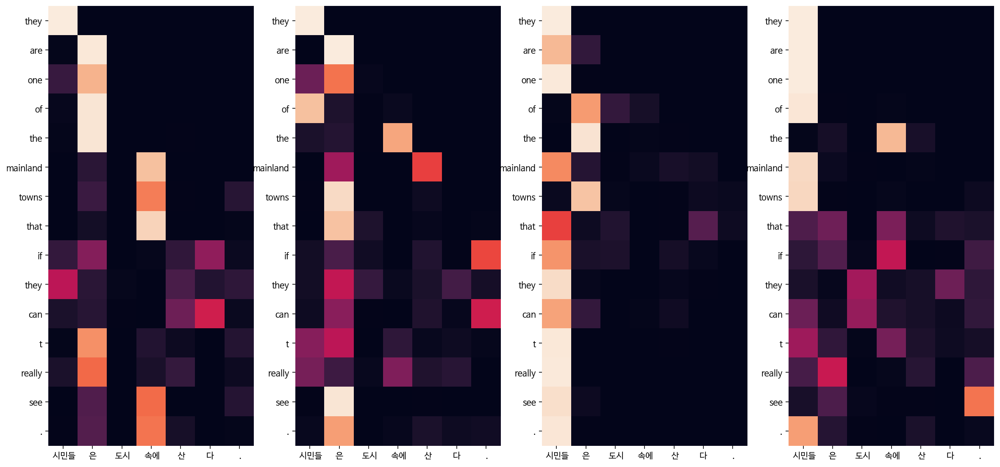

Input: 커피는 필요 없다.
Predicted translation: wednesday s drinking coffee are needed to have to needed to act
Encoder Layer 1


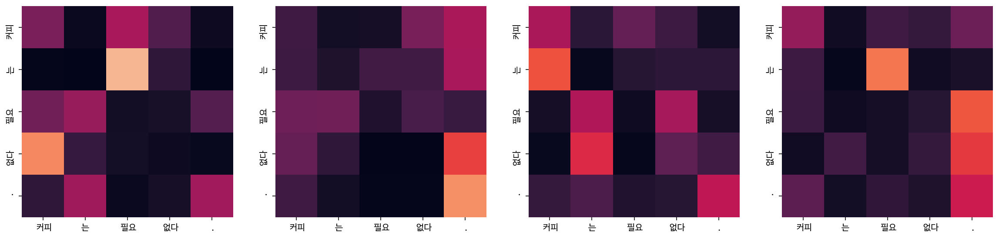

Encoder Layer 2


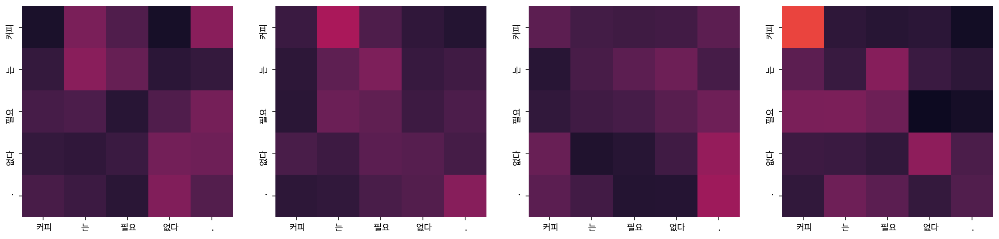

Decoder Self Layer 1


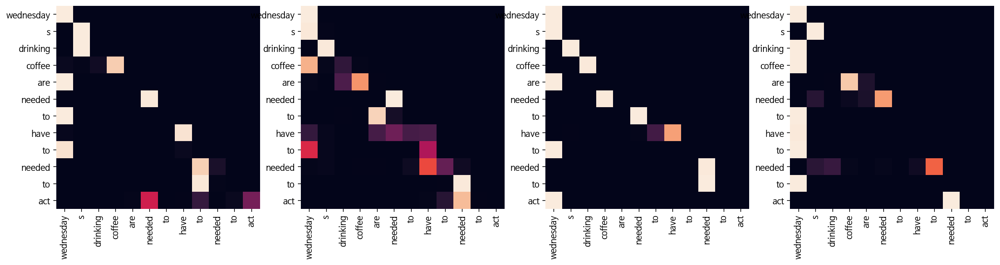

Decoder Src Layer 1


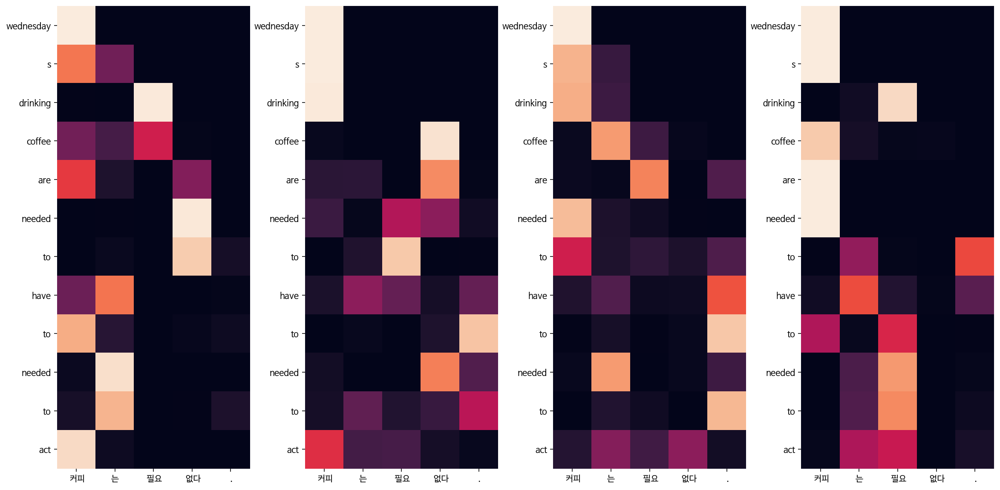

Decoder Self Layer 2


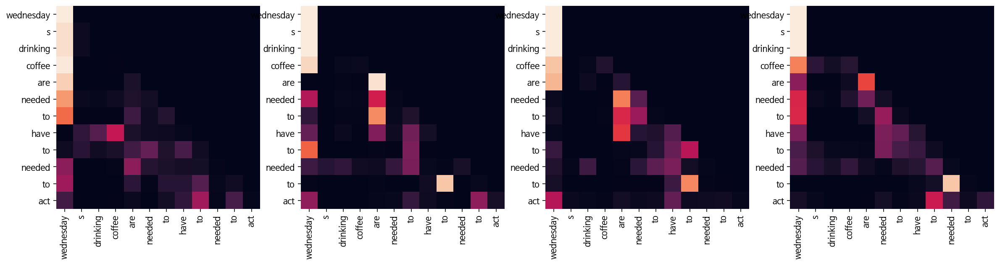

Decoder Src Layer 2


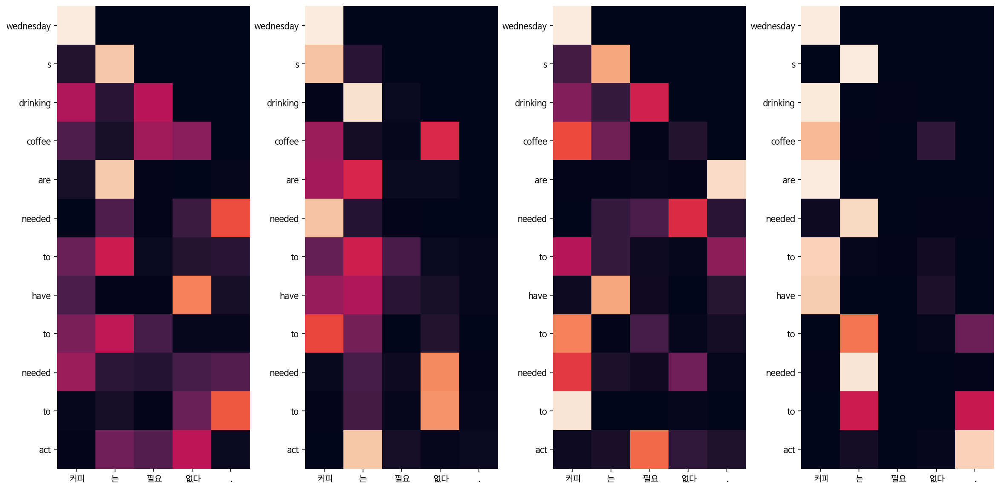

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: six other people died sunday when they were
Encoder Layer 1


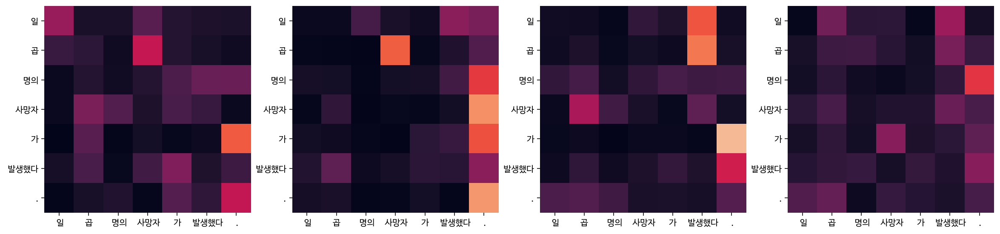

Encoder Layer 2


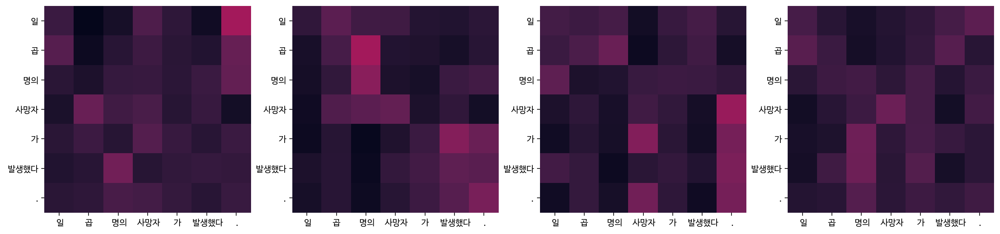

Decoder Self Layer 1


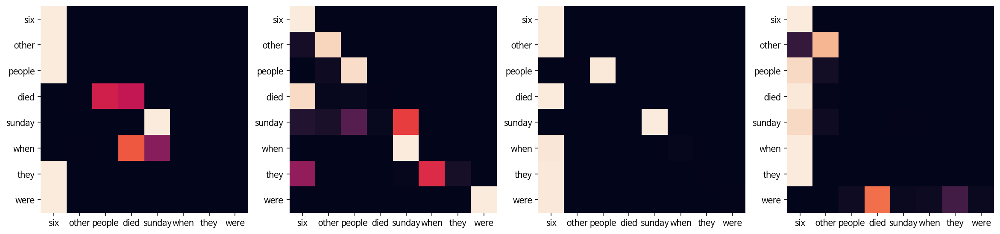

Decoder Src Layer 1


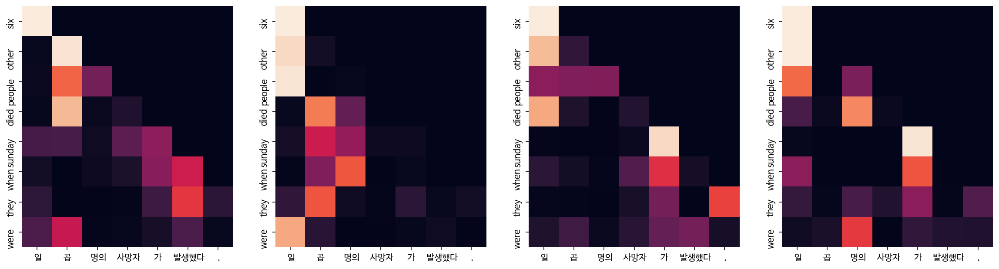

Decoder Self Layer 2


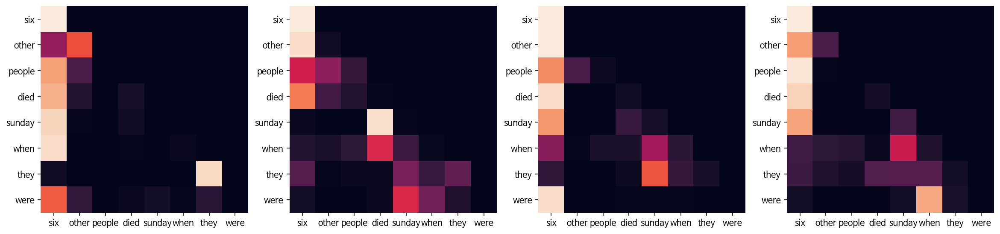

Decoder Src Layer 2


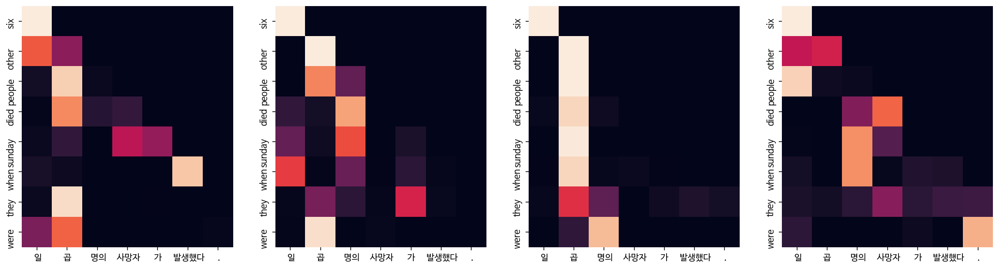

Epoch 11: 100%|██████████| 8507/8507 [19:42<00:00,  7.19it/s, Loss 1.3778]


Input: 오바마는 대통령이다.
Predicted translation: obama has the president .
Encoder Layer 1


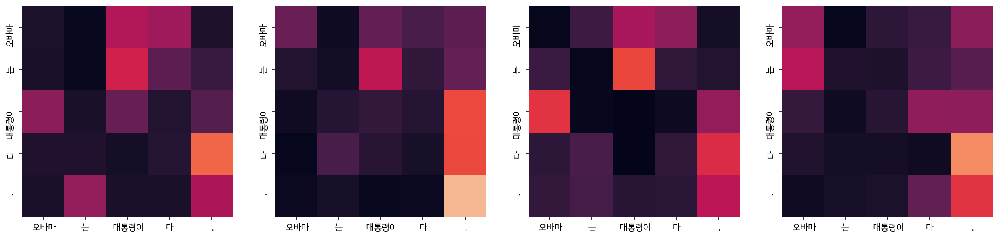

Encoder Layer 2


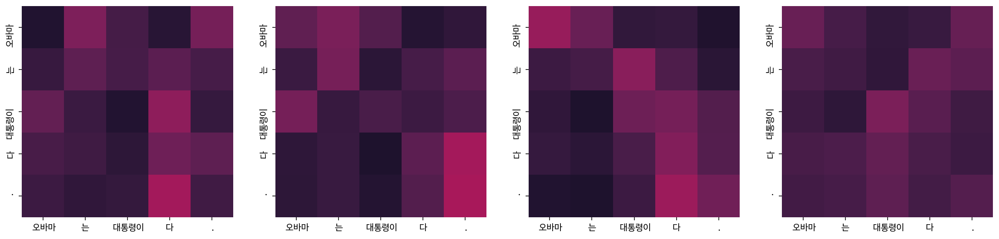

Decoder Self Layer 1


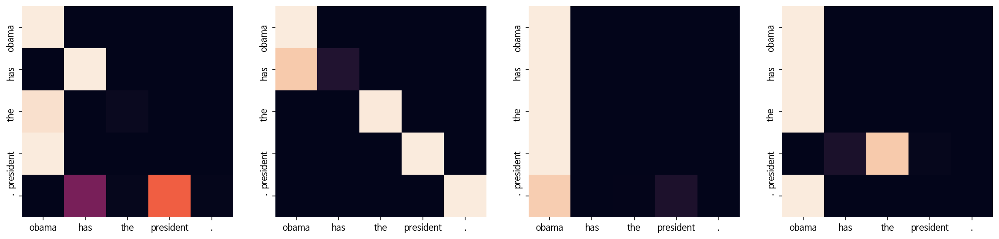

Decoder Src Layer 1


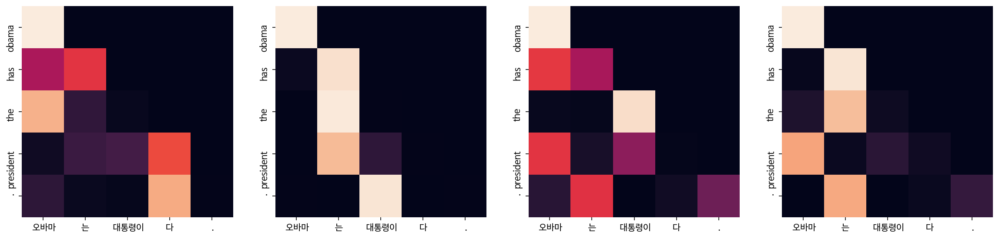

Decoder Self Layer 2


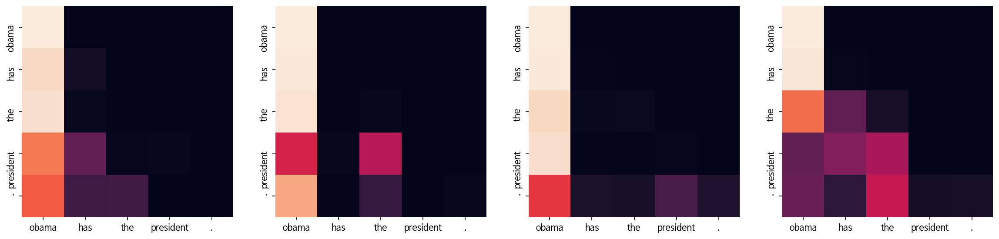

Decoder Src Layer 2


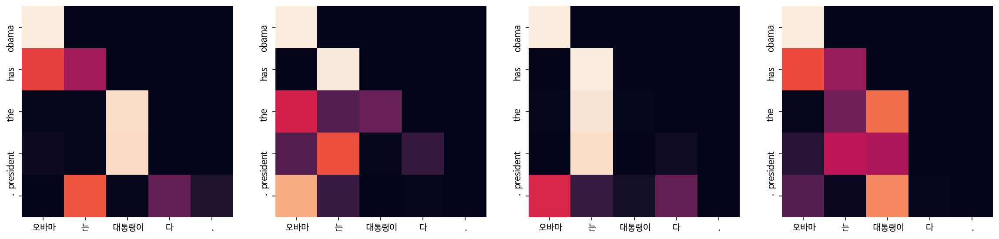

Input: 시민들은 도시 속에 산다.
Predicted translation: the project is based in car city .
Encoder Layer 1


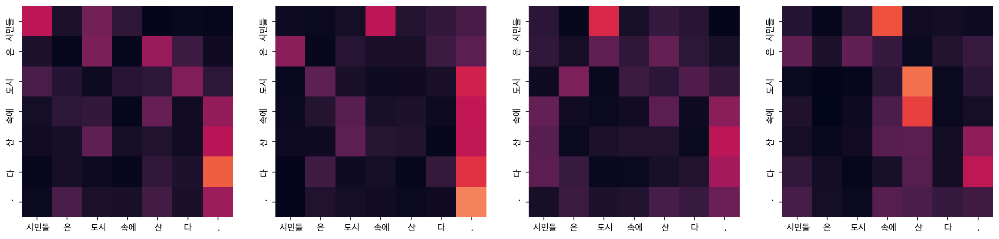

Encoder Layer 2


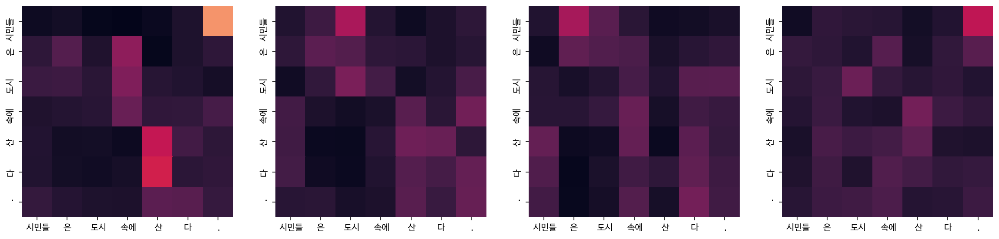

Decoder Self Layer 1


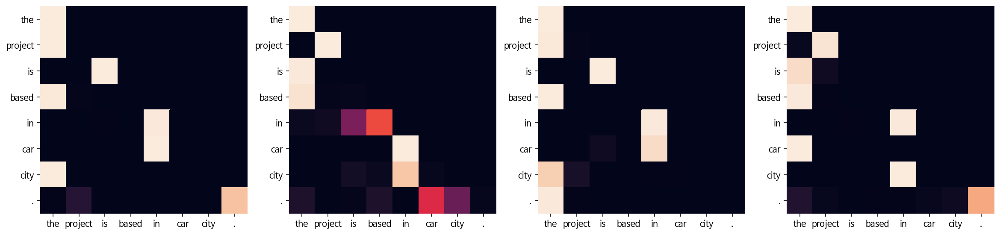

Decoder Src Layer 1


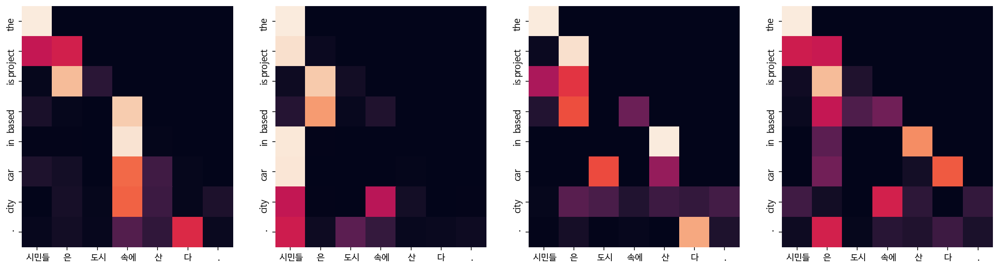

Decoder Self Layer 2


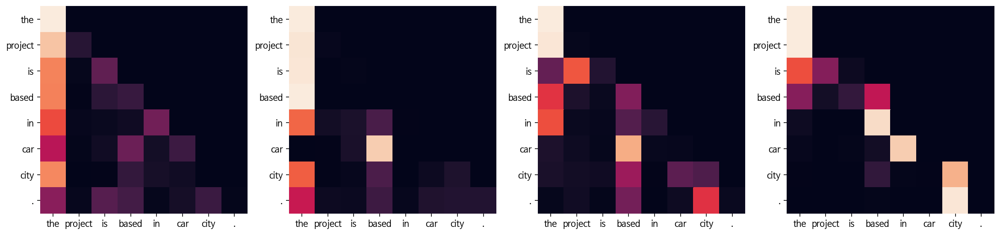

Decoder Src Layer 2


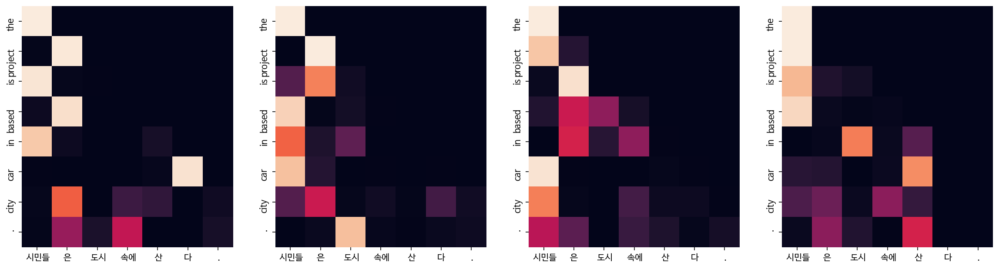

Input: 커피는 필요 없다.
Predicted translation: even if you need to dur coffee
Encoder Layer 1


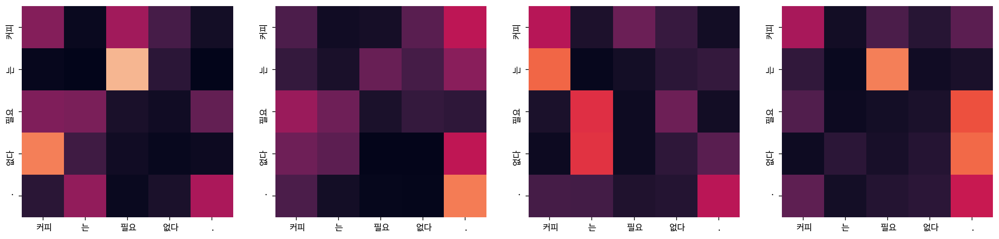

Encoder Layer 2


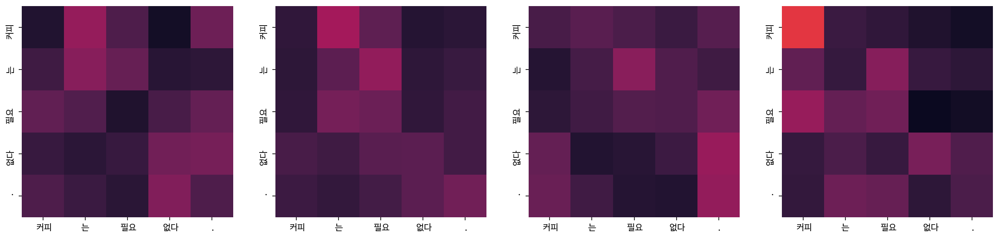

Decoder Self Layer 1


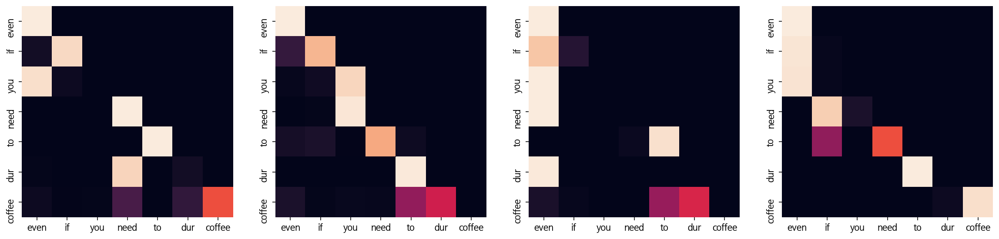

Decoder Src Layer 1


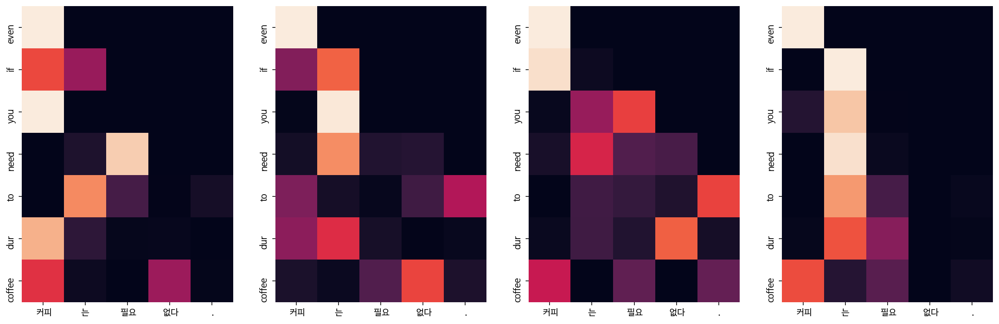

Decoder Self Layer 2


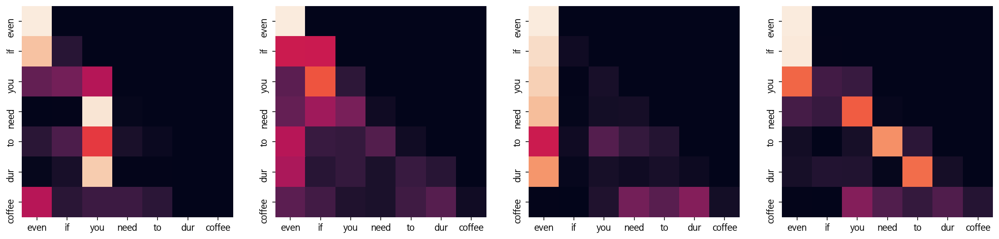

Decoder Src Layer 2


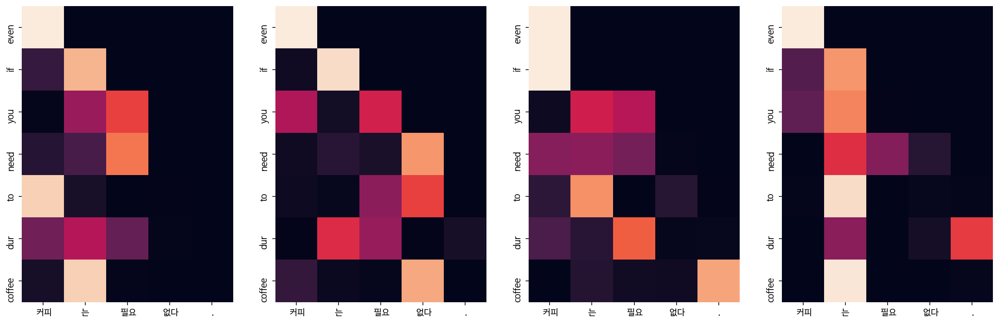

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were injured monday .
Encoder Layer 1


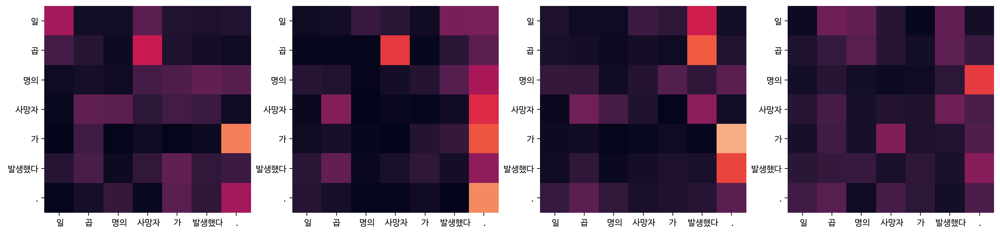

Encoder Layer 2


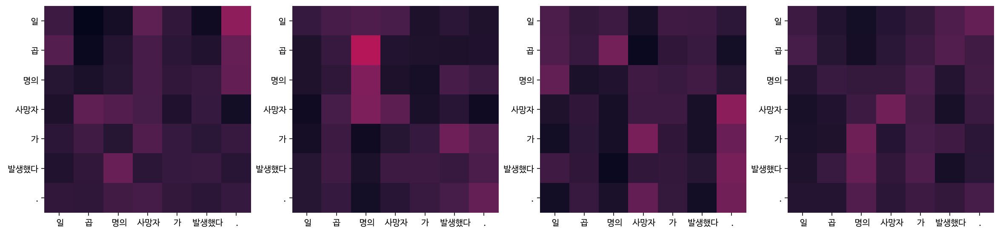

Decoder Self Layer 1


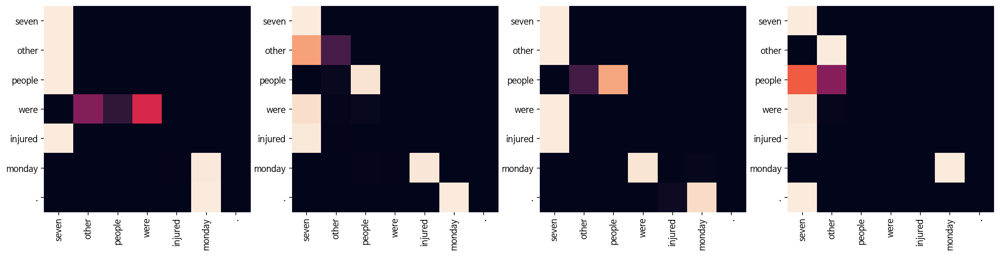

Decoder Src Layer 1


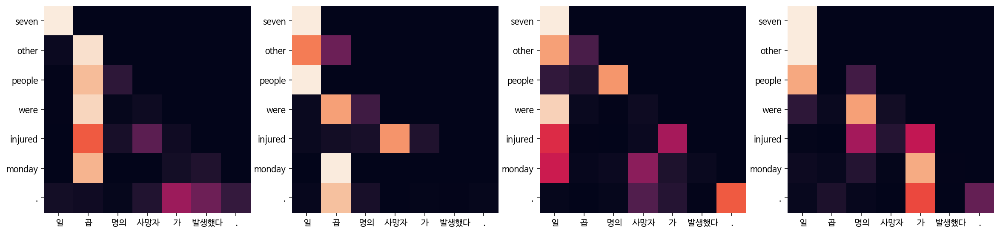

Decoder Self Layer 2


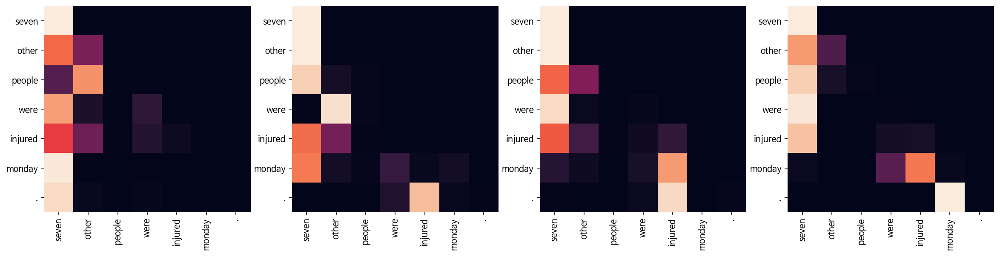

Decoder Src Layer 2


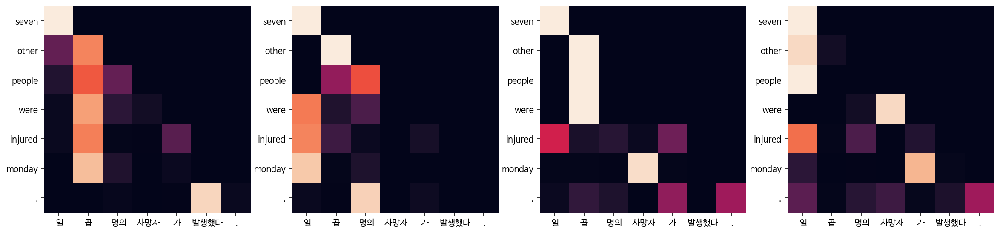

Epoch 12: 100%|██████████| 8507/8507 [19:41<00:00,  7.20it/s, Loss 1.3077]


Input: 오바마는 대통령이다.
Predicted translation: obama currently the front runner .
Encoder Layer 1


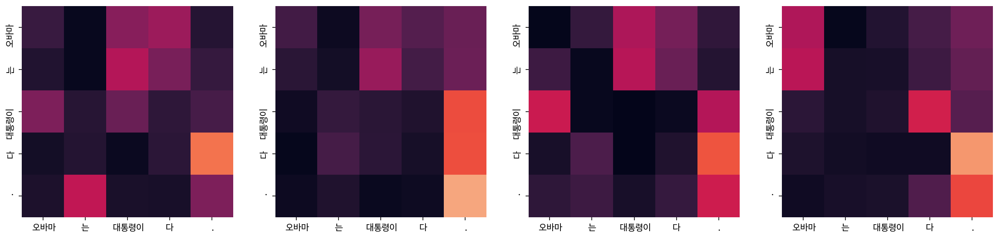

Encoder Layer 2


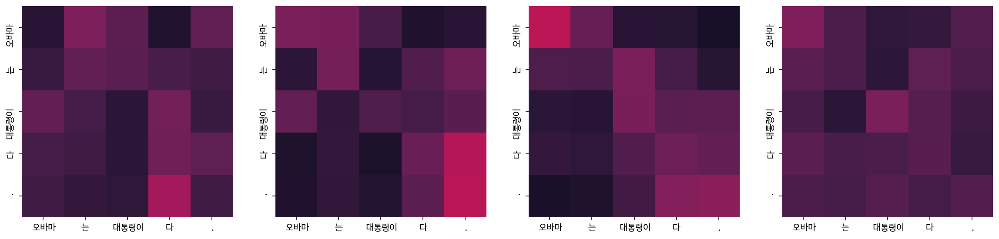

Decoder Self Layer 1


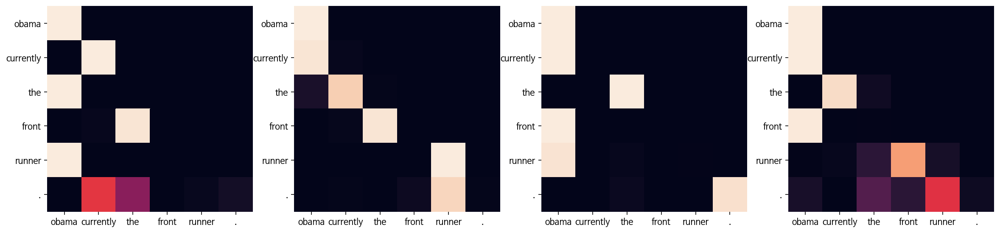

Decoder Src Layer 1


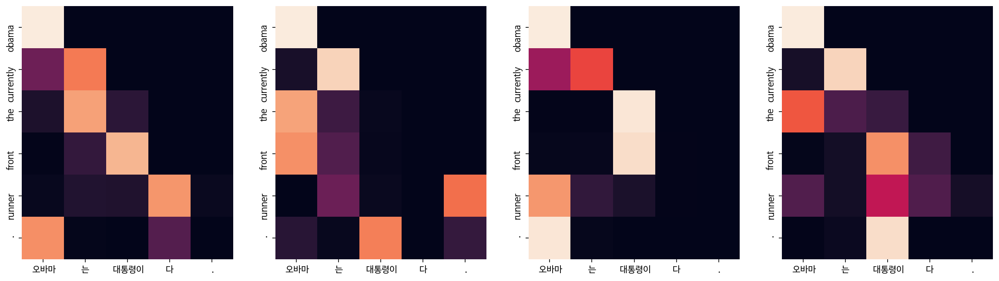

Decoder Self Layer 2


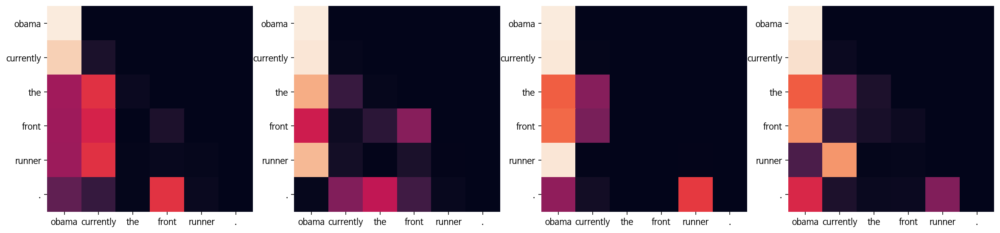

Decoder Src Layer 2


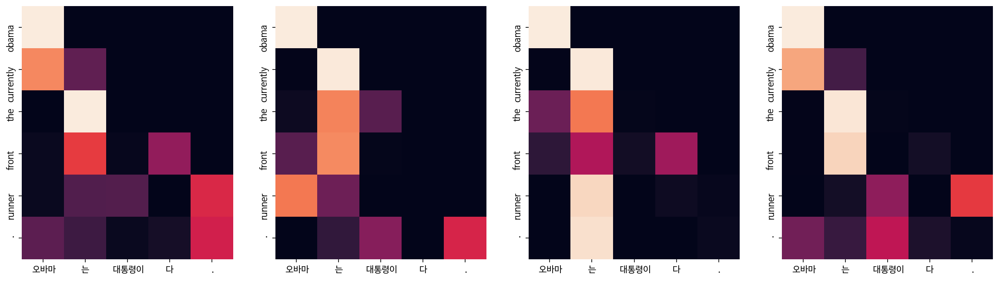

Input: 시민들은 도시 속에 산다.
Predicted translation: the number of citizens in for miles can call in for the city .
Encoder Layer 1


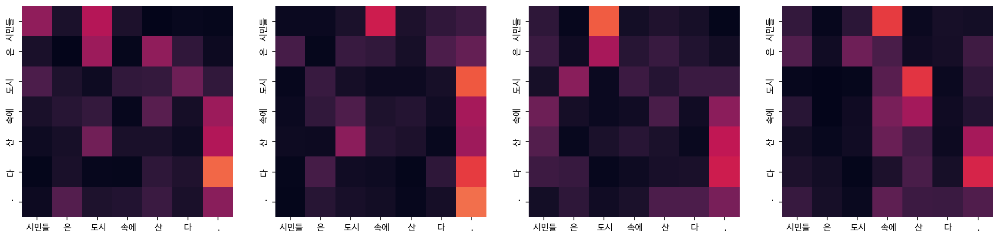

Encoder Layer 2


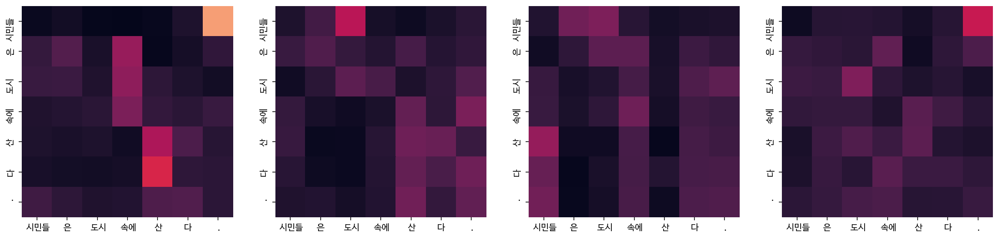

Decoder Self Layer 1


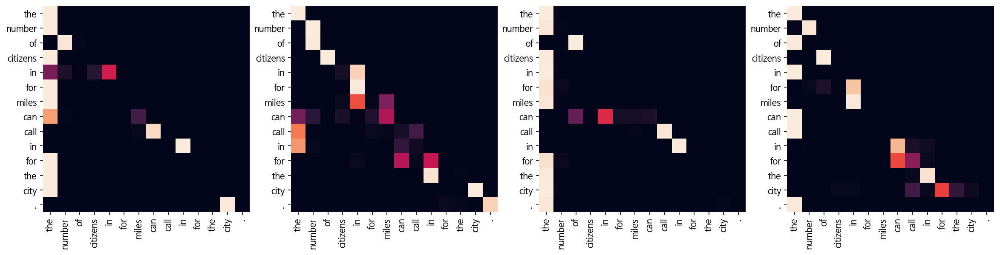

Decoder Src Layer 1


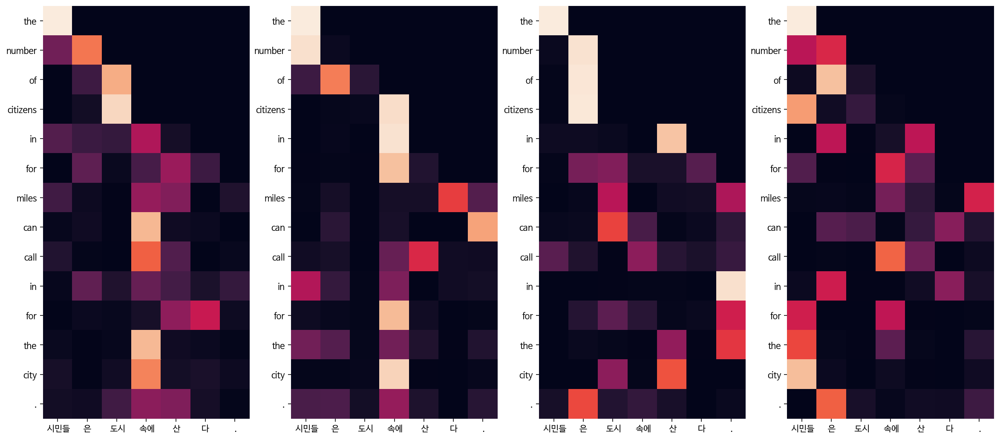

Decoder Self Layer 2


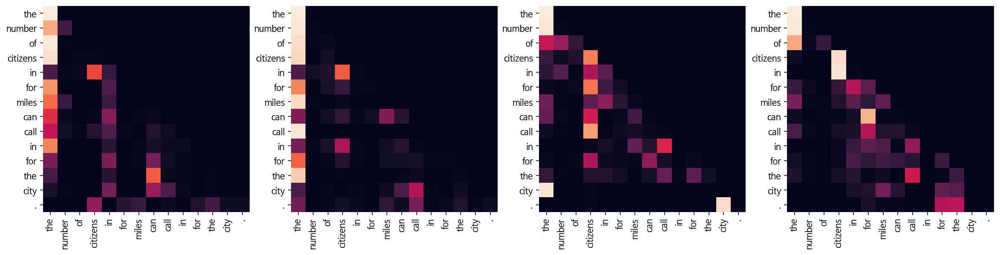

Decoder Src Layer 2


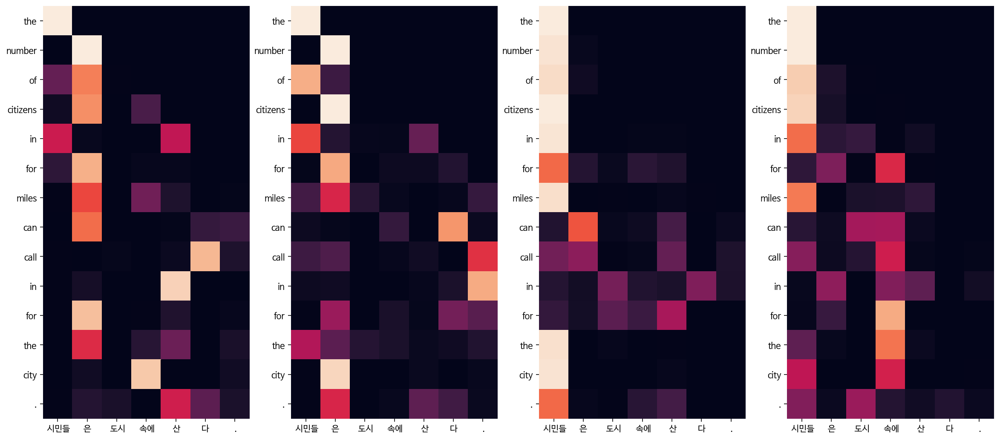

Input: 커피는 필요 없다.
Predicted translation: until tuesday it was needed to do more than don t need cup rallies .
Encoder Layer 1


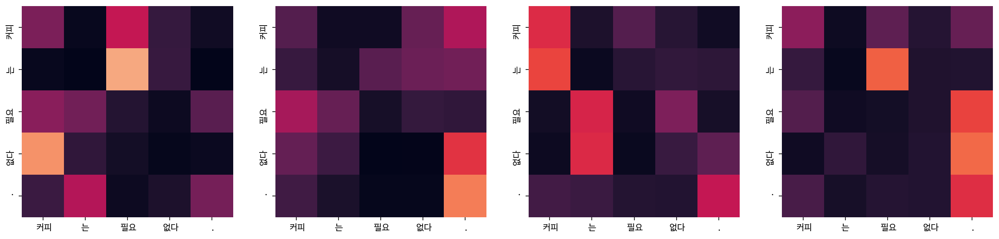

Encoder Layer 2


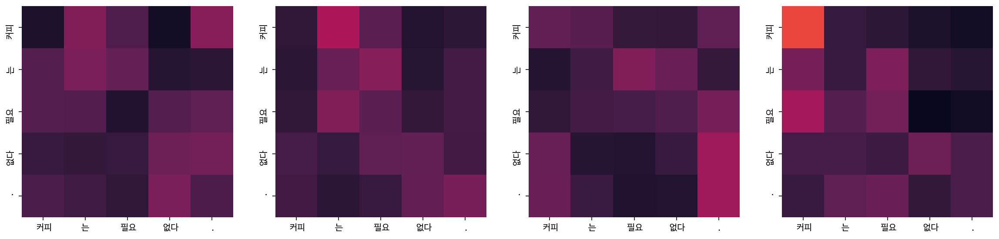

Decoder Self Layer 1


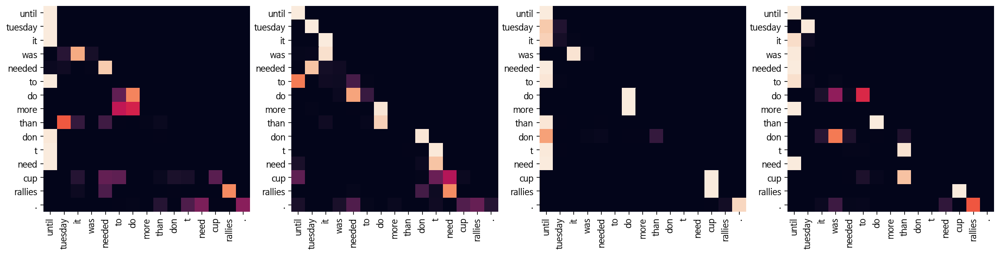

Decoder Src Layer 1


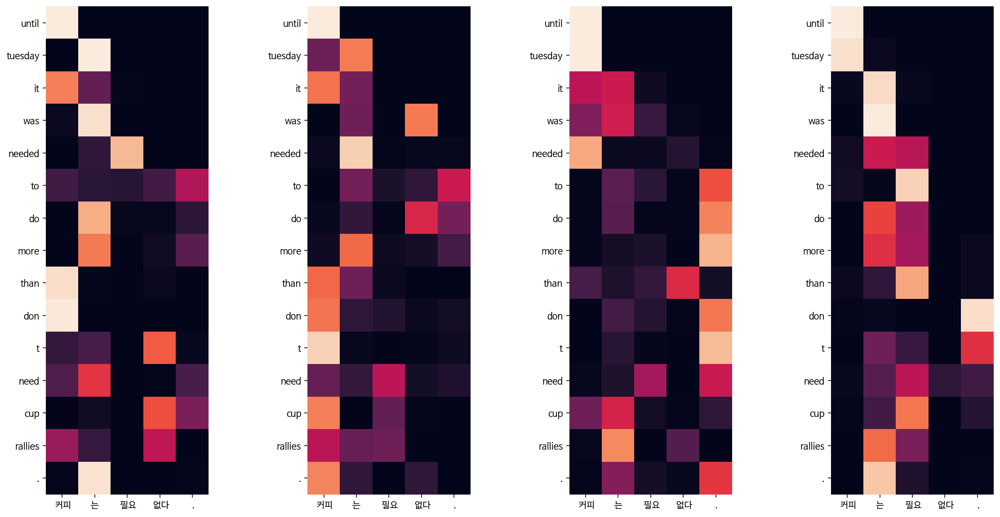

Decoder Self Layer 2


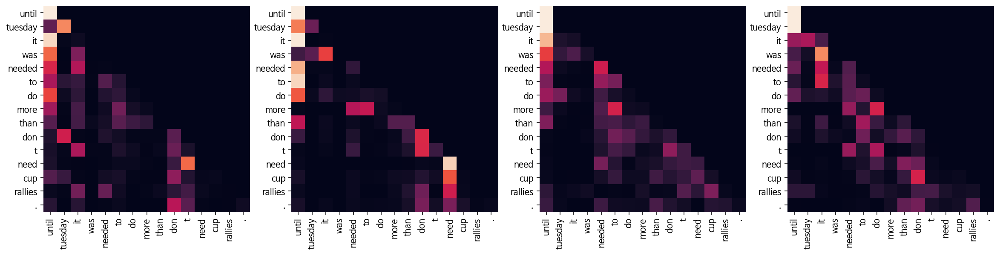

Decoder Src Layer 2


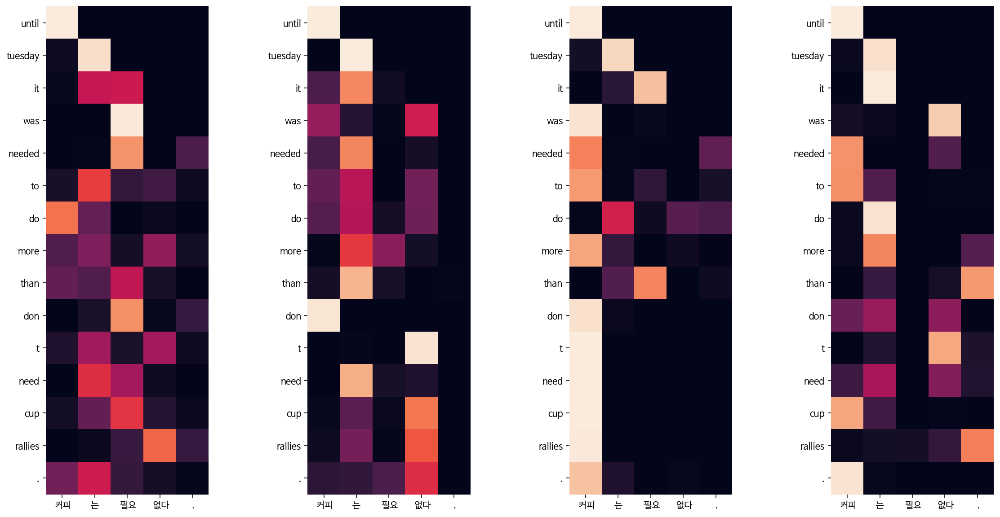

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people are dead , including seven dead .
Encoder Layer 1


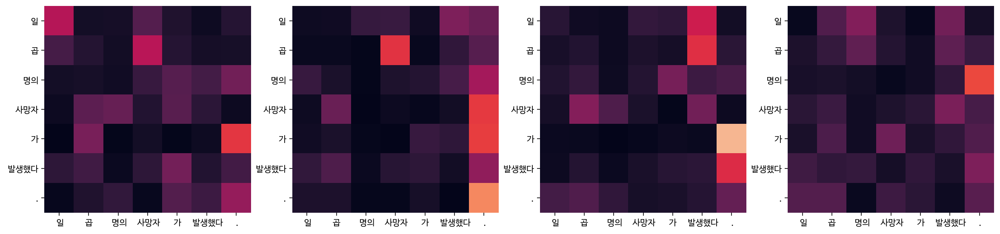

Encoder Layer 2


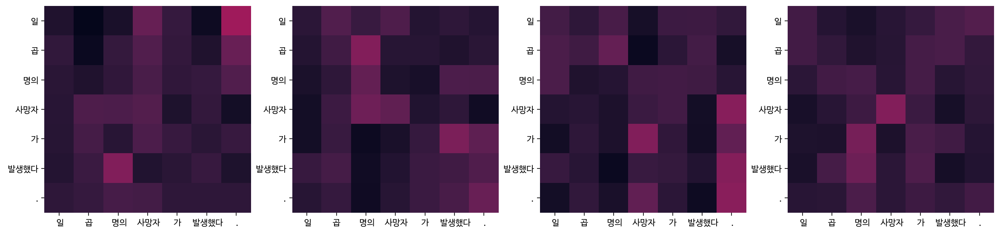

Decoder Self Layer 1


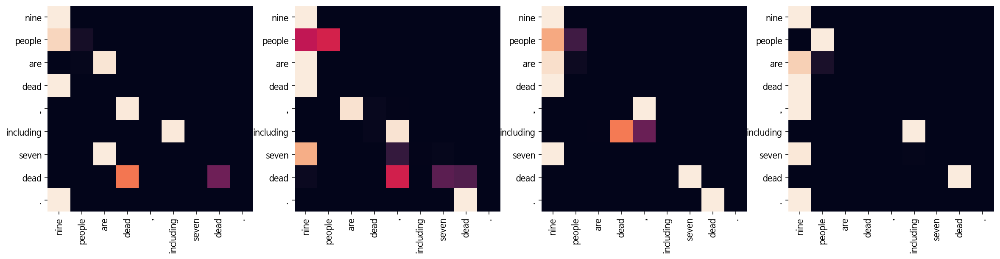

Decoder Src Layer 1


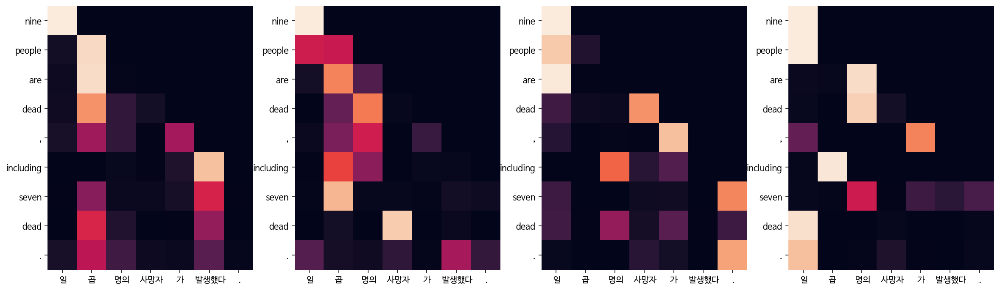

Decoder Self Layer 2


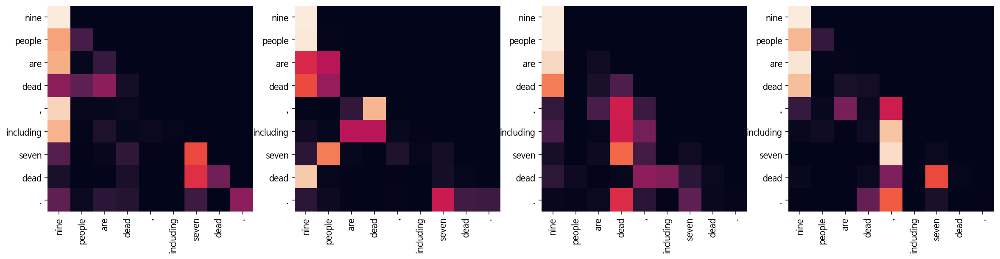

Decoder Src Layer 2


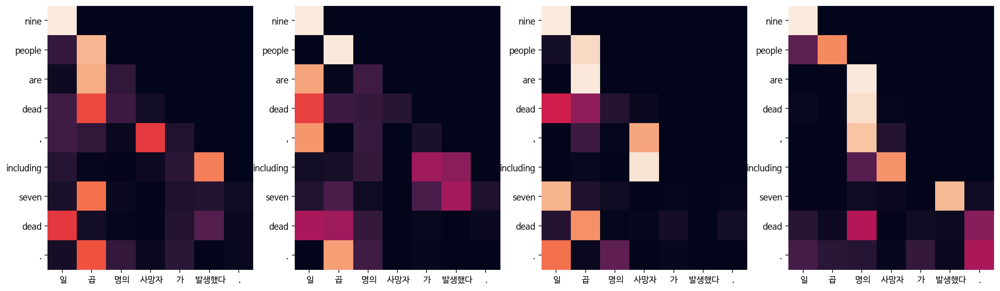

Epoch 13: 100%|██████████| 8507/8507 [19:36<00:00,  7.23it/s, Loss 1.2568]


Input: 오바마는 대통령이다.
Predicted translation: president obama is the first person to have faced jobs .
Encoder Layer 1


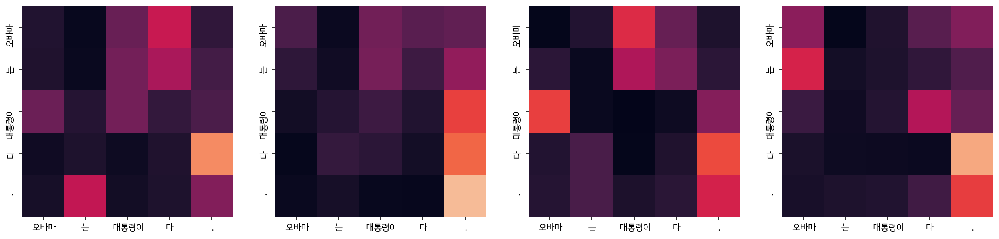

Encoder Layer 2


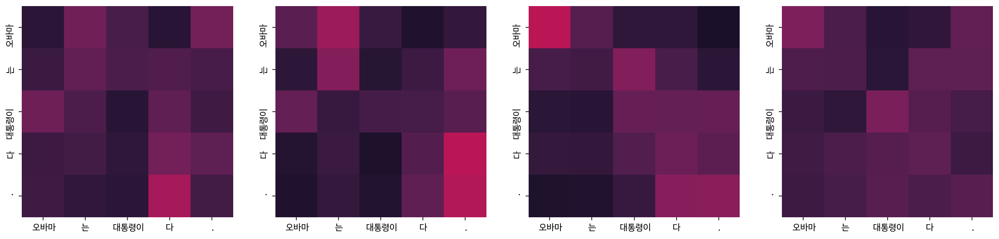

Decoder Self Layer 1


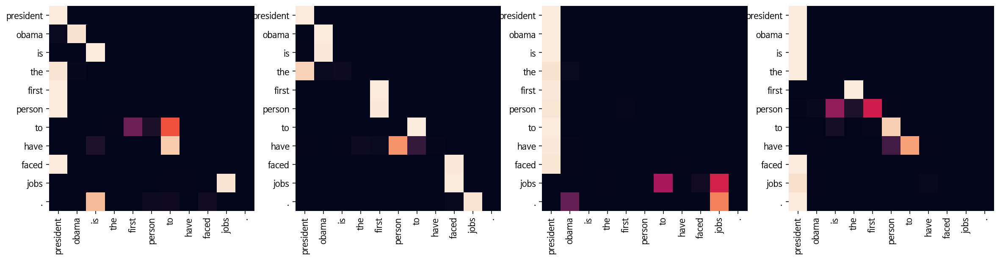

Decoder Src Layer 1


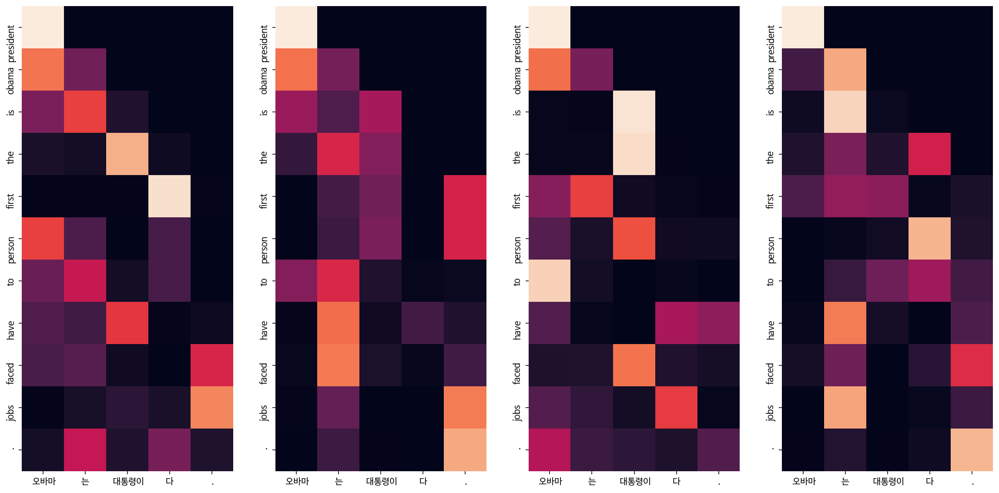

Decoder Self Layer 2


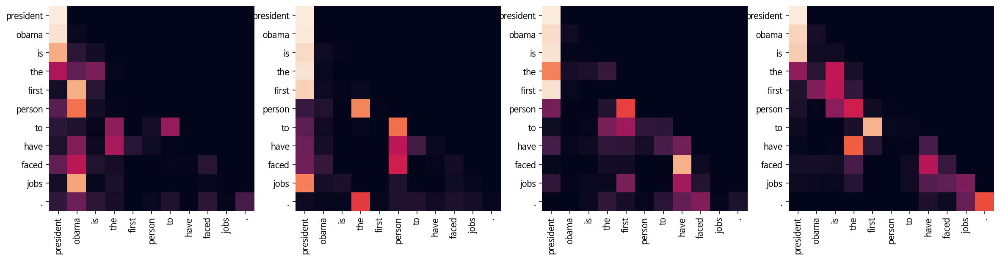

Decoder Src Layer 2


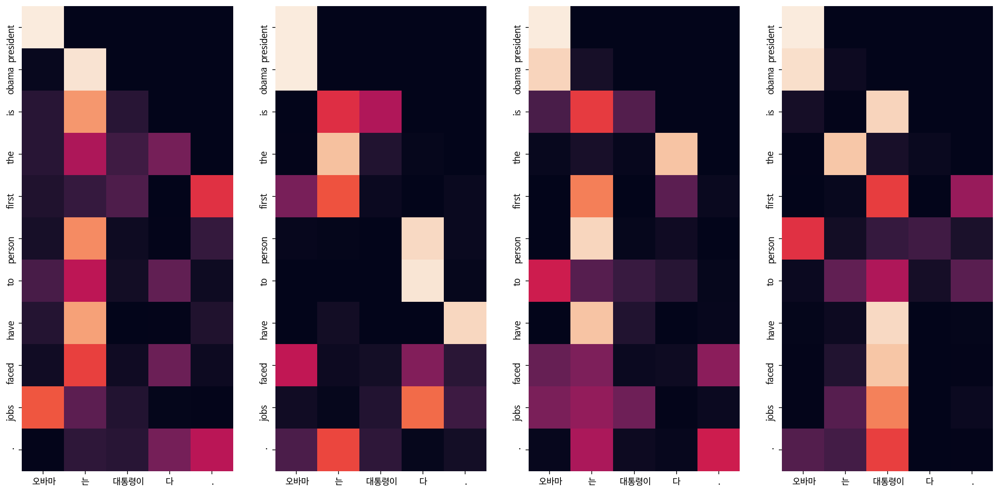

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is part of the city .
Encoder Layer 1


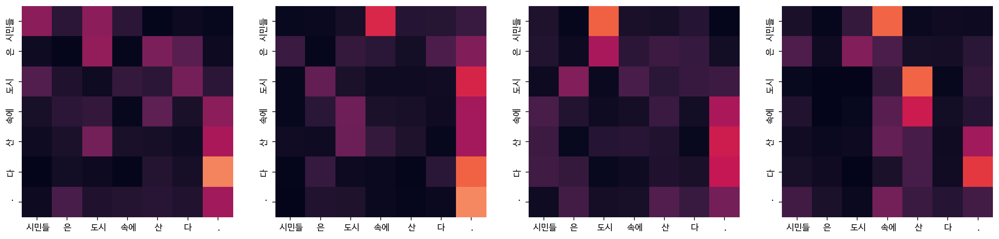

Encoder Layer 2


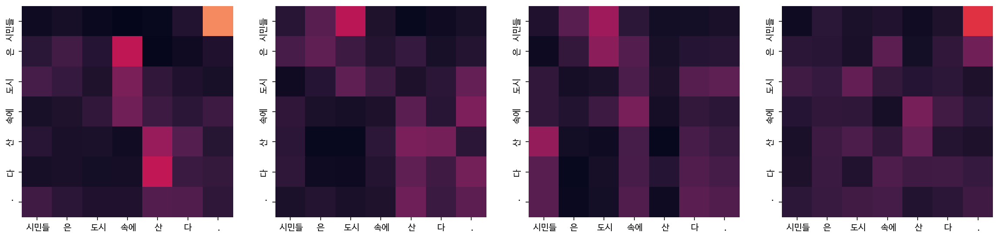

Decoder Self Layer 1


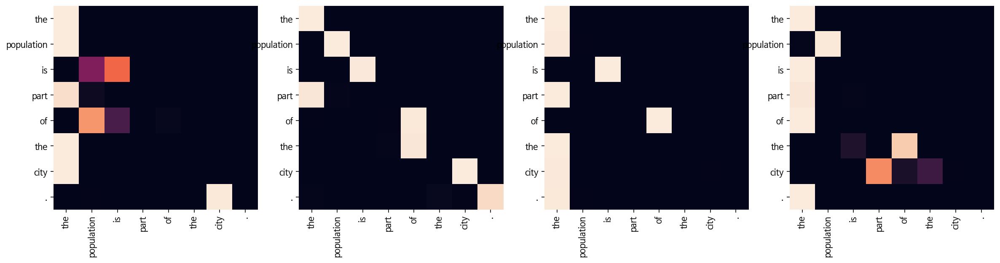

Decoder Src Layer 1


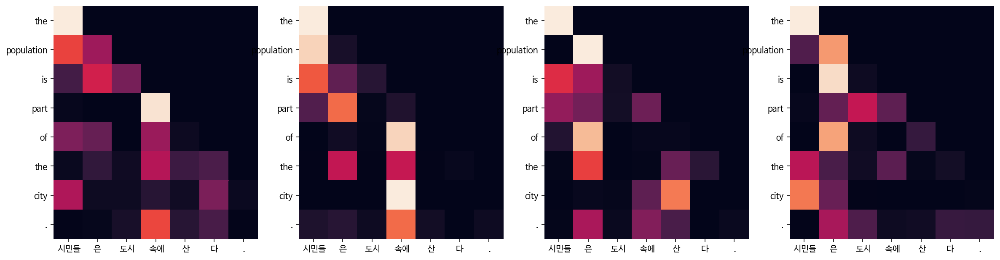

Decoder Self Layer 2


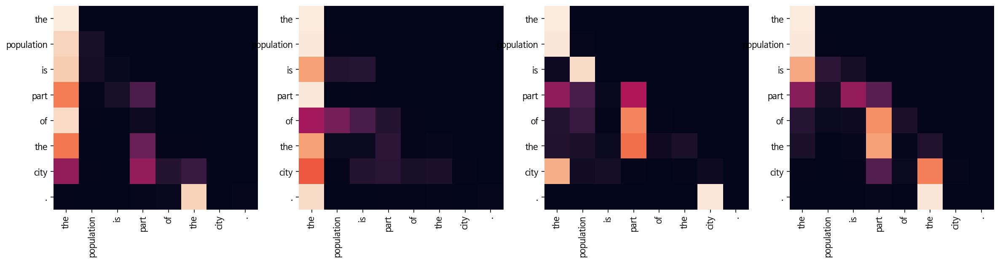

Decoder Src Layer 2


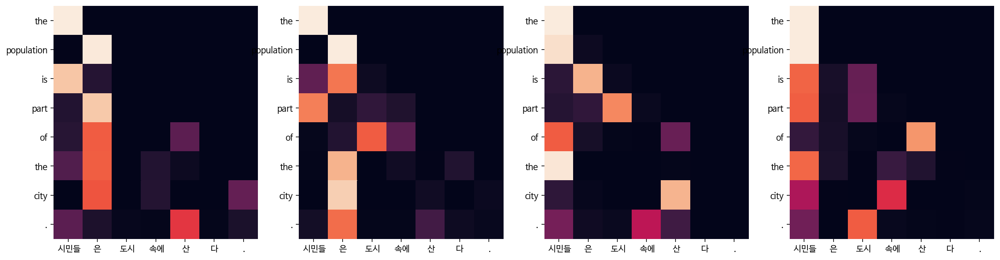

Input: 커피는 필요 없다.
Predicted translation: there needs to go .
Encoder Layer 1


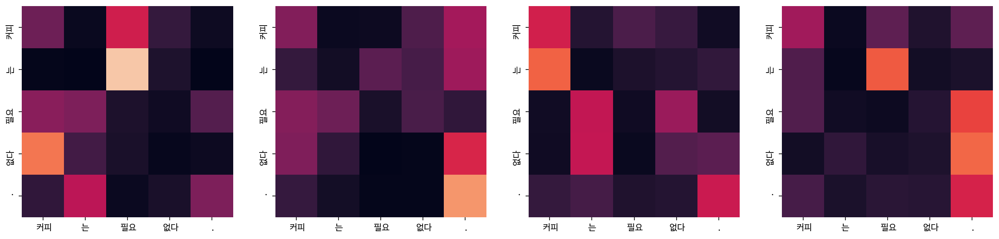

Encoder Layer 2


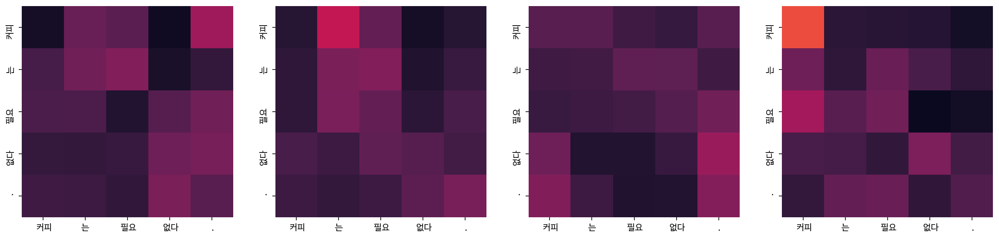

Decoder Self Layer 1


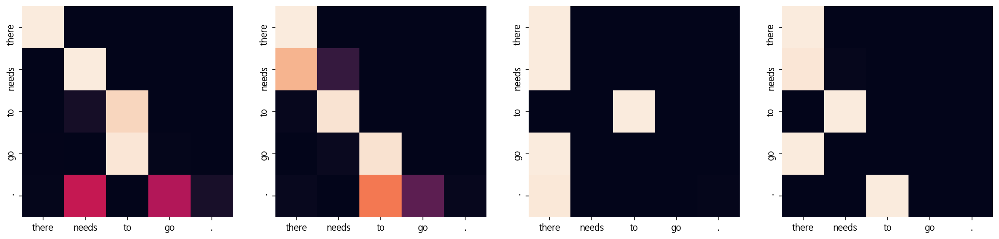

Decoder Src Layer 1


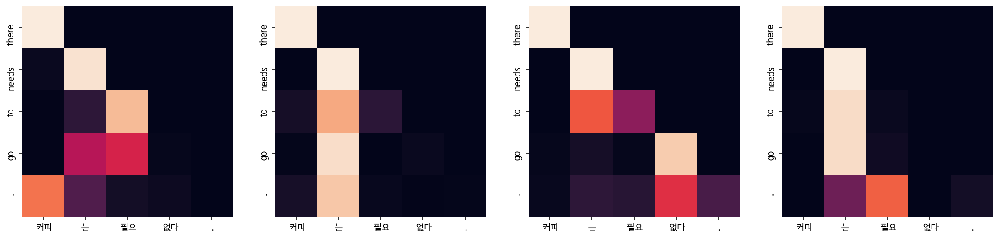

Decoder Self Layer 2


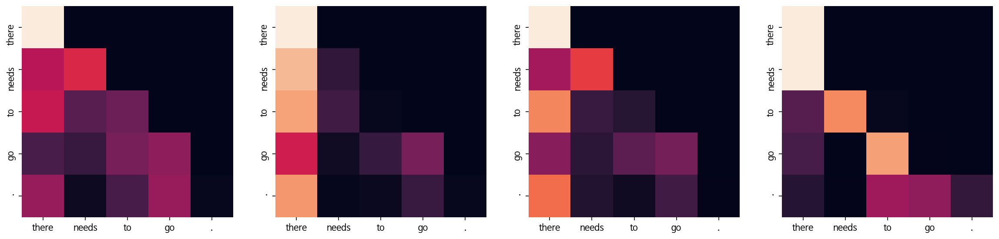

Decoder Src Layer 2


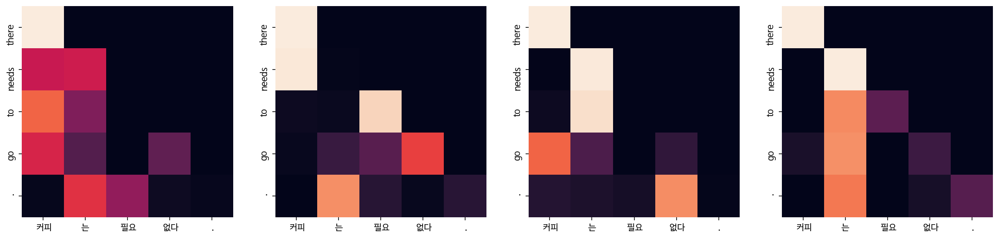

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people died sunday when they were him .
Encoder Layer 1


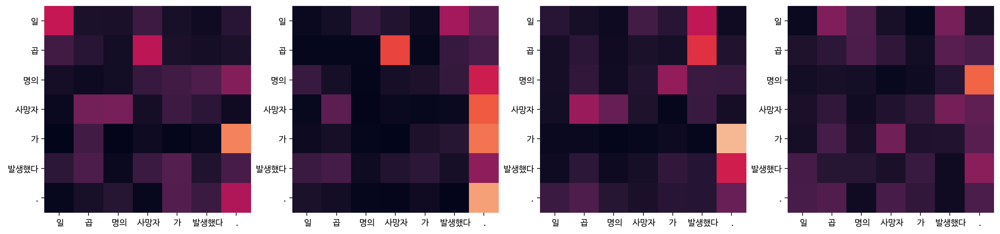

Encoder Layer 2


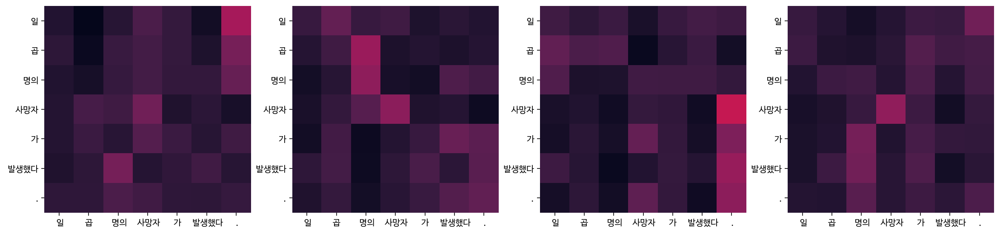

Decoder Self Layer 1


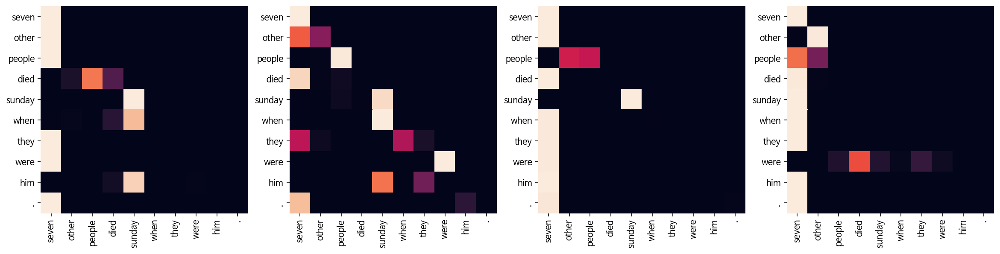

Decoder Src Layer 1


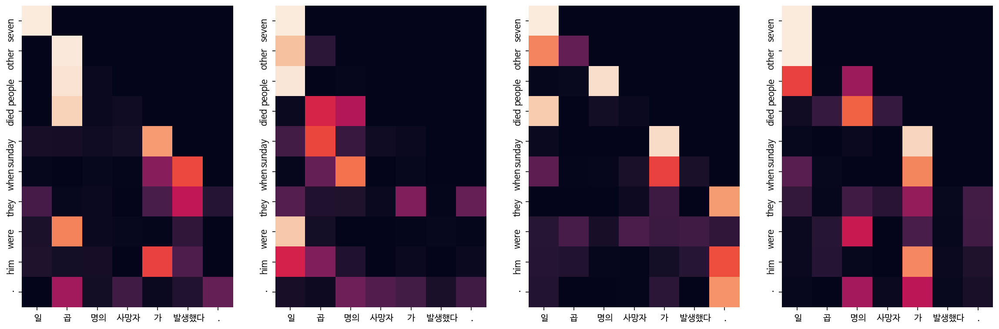

Decoder Self Layer 2


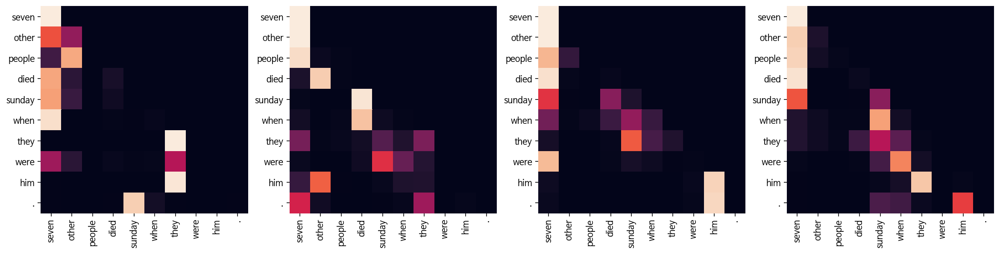

Decoder Src Layer 2


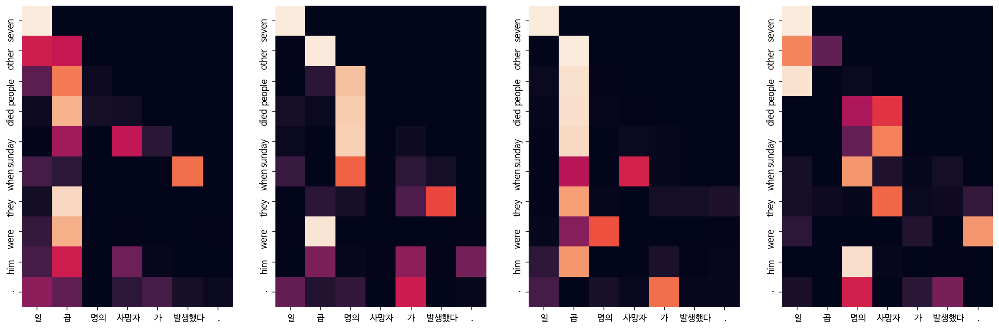

Epoch 14: 100%|██████████| 8507/8507 [19:37<00:00,  7.23it/s, Loss 1.2155]


Input: 오바마는 대통령이다.
Predicted translation: obama s president is expected to pass his own .
Encoder Layer 1


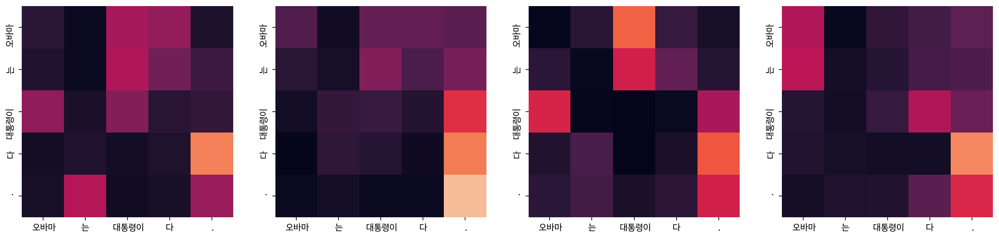

Encoder Layer 2


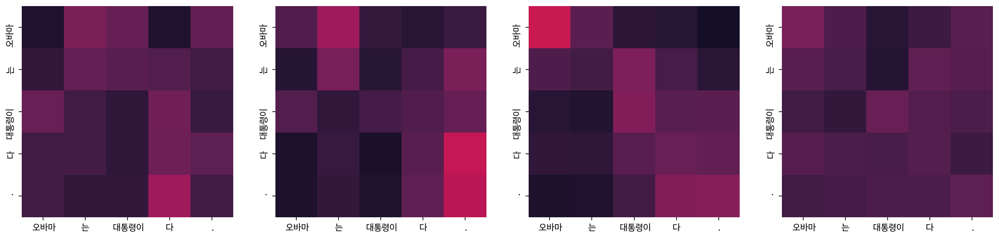

Decoder Self Layer 1


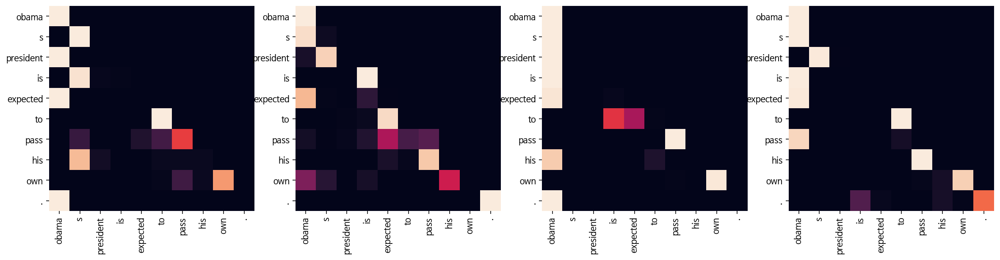

Decoder Src Layer 1


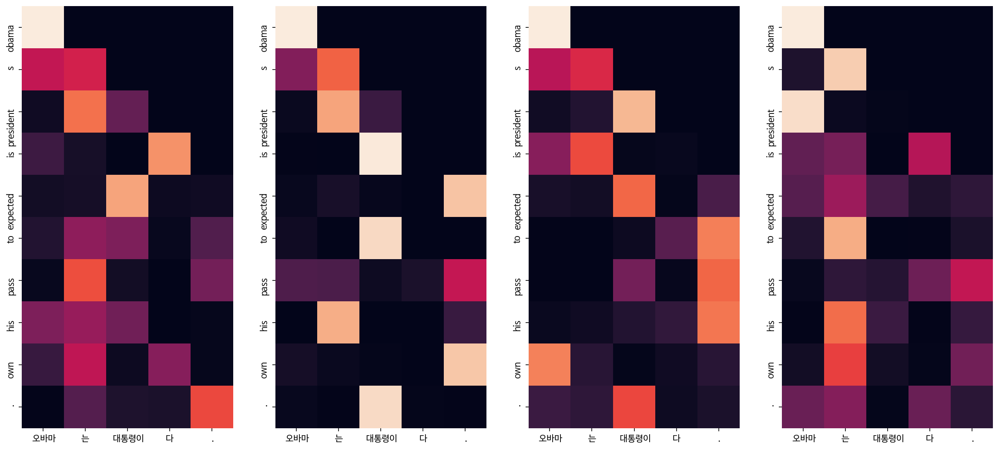

Decoder Self Layer 2


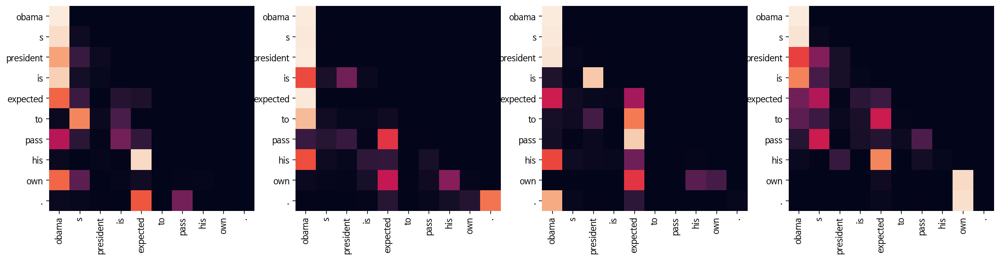

Decoder Src Layer 2


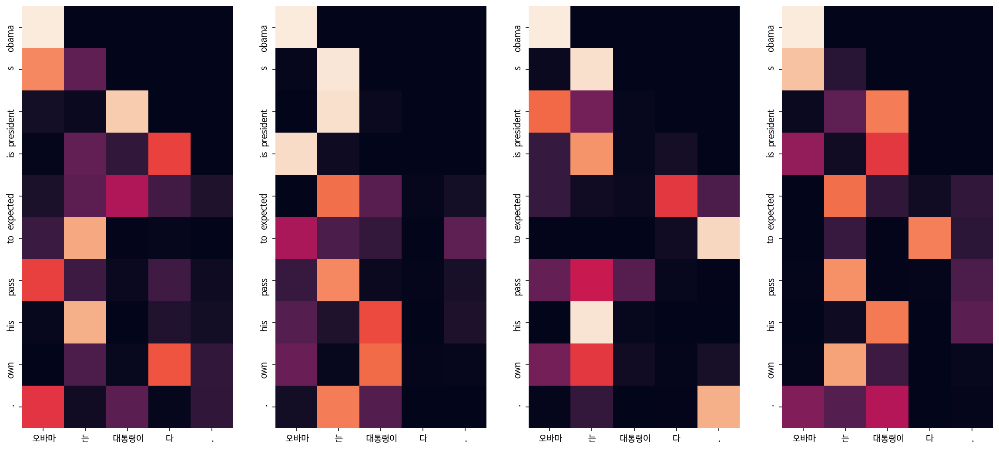

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is life threatening .
Encoder Layer 1


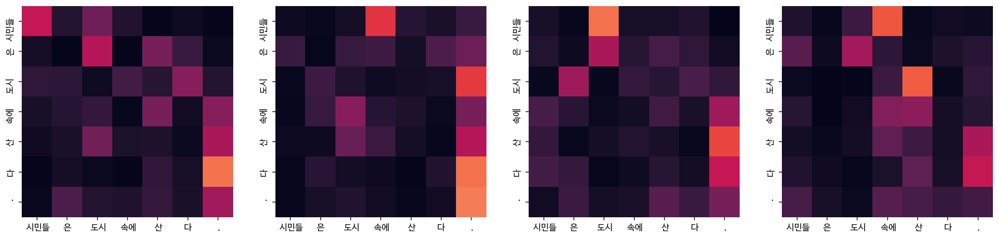

Encoder Layer 2


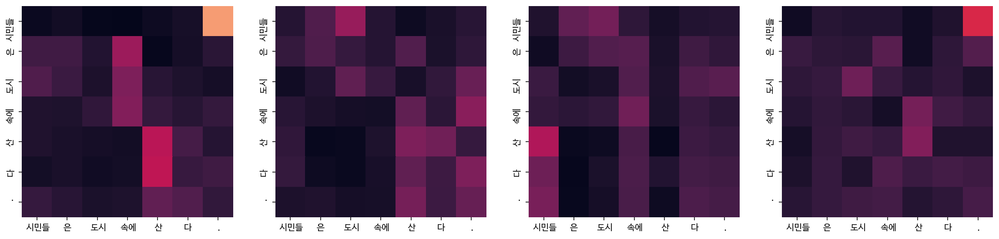

Decoder Self Layer 1


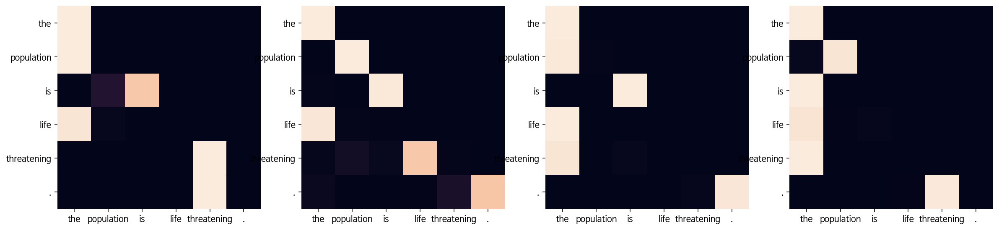

Decoder Src Layer 1


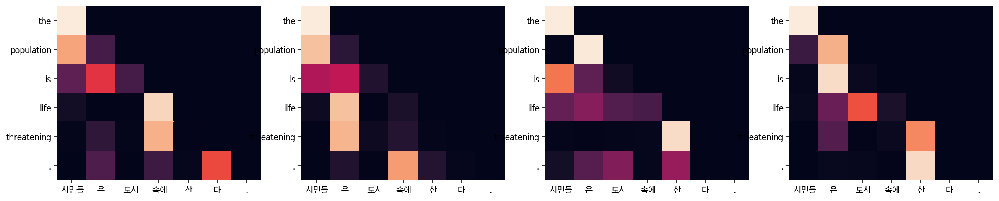

Decoder Self Layer 2


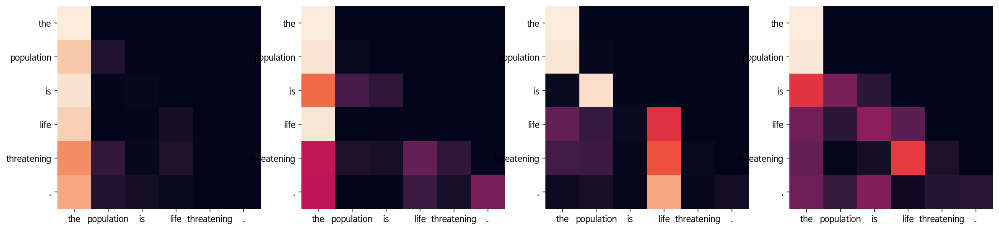

Decoder Src Layer 2


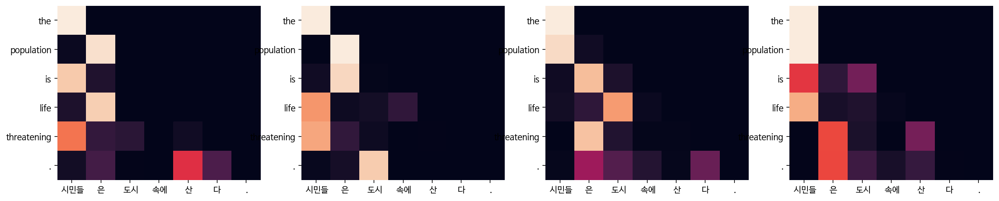

Input: 커피는 필요 없다.
Predicted translation: need need to do it .
Encoder Layer 1


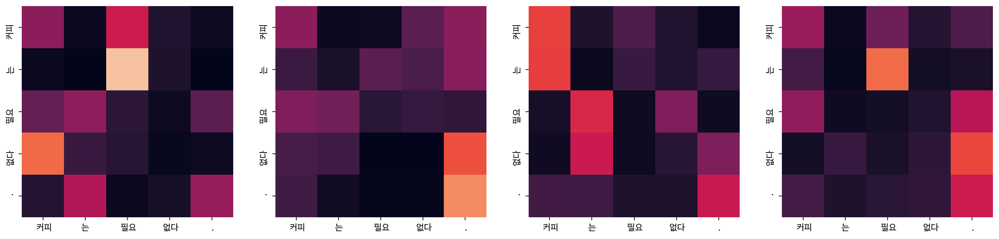

Encoder Layer 2


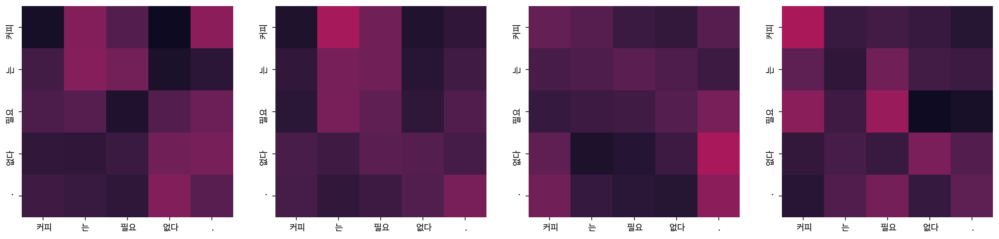

Decoder Self Layer 1


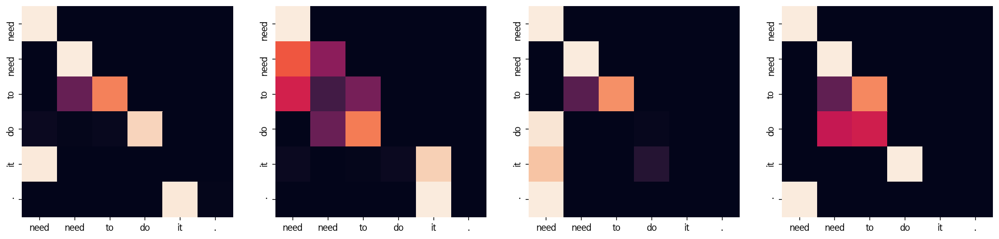

Decoder Src Layer 1


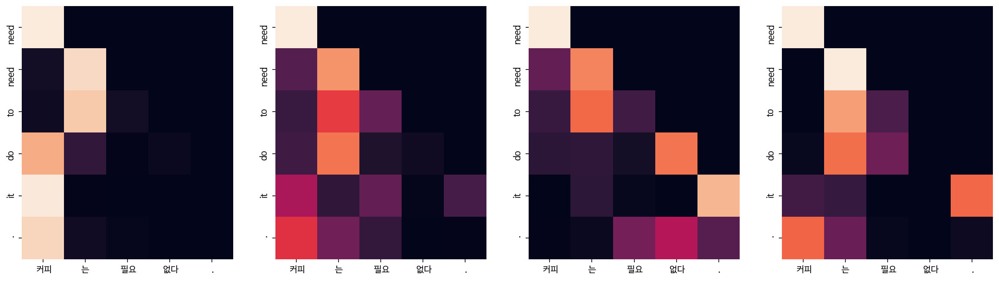

Decoder Self Layer 2


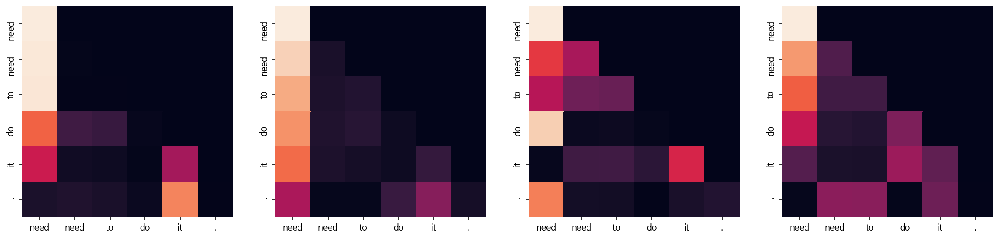

Decoder Src Layer 2


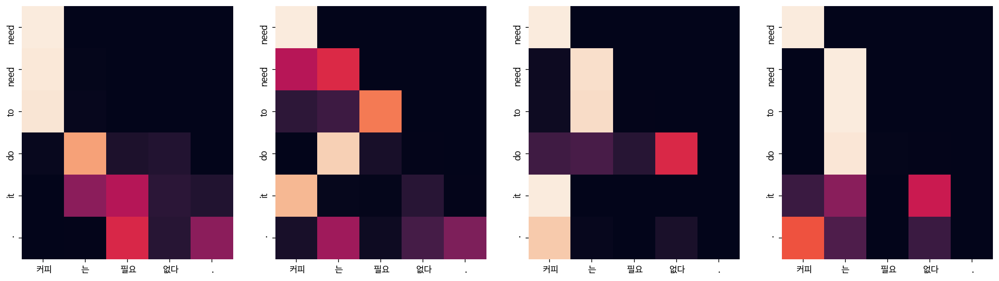

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed tuesday .
Encoder Layer 1


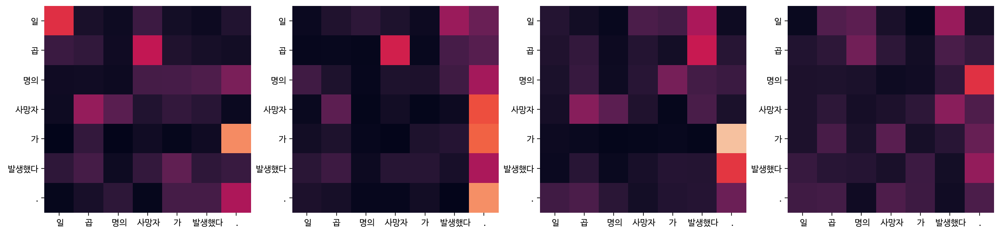

Encoder Layer 2


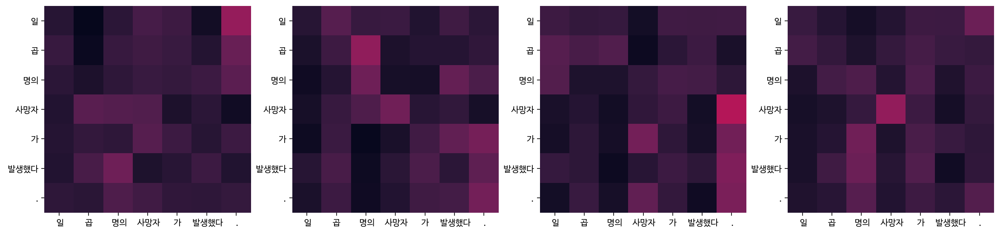

Decoder Self Layer 1


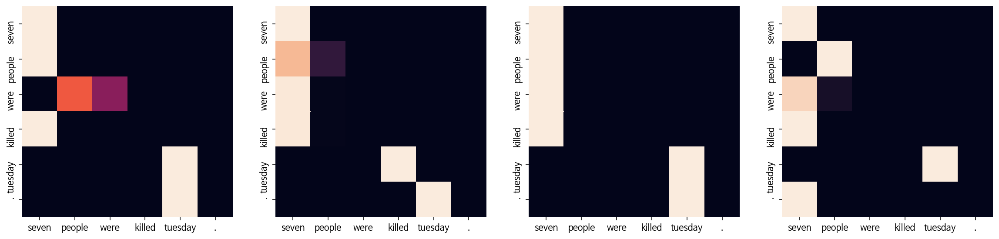

Decoder Src Layer 1


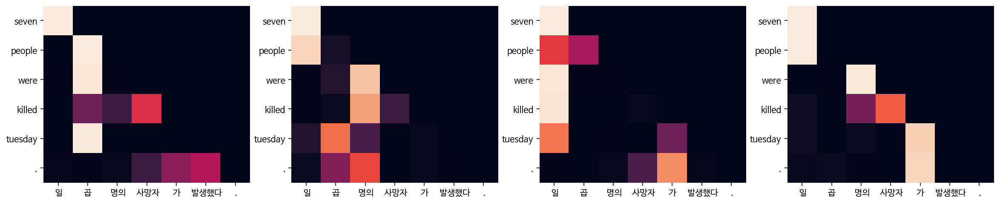

Decoder Self Layer 2


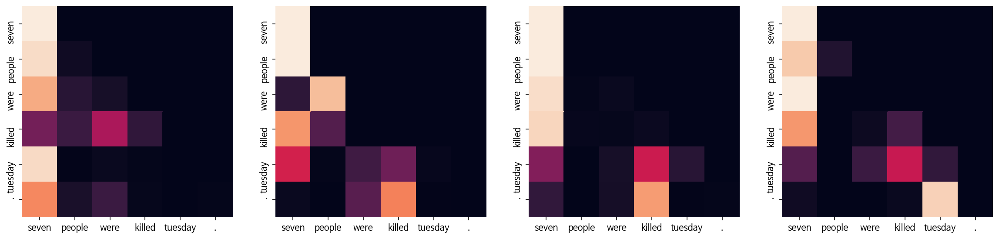

Decoder Src Layer 2


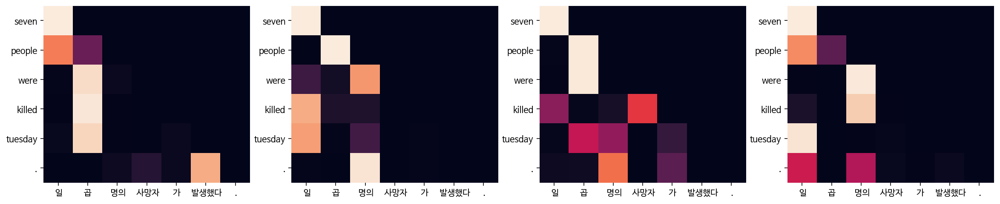

Epoch 15: 100%|██████████| 8507/8507 [19:41<00:00,  7.20it/s, Loss 1.1861]


Input: 오바마는 대통령이다.
Predicted translation: obama is the president .
Encoder Layer 1


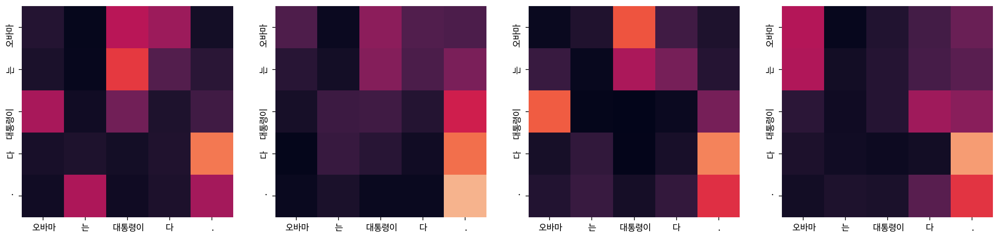

Encoder Layer 2


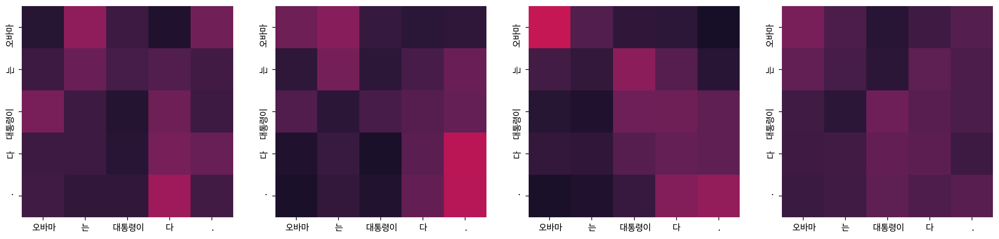

Decoder Self Layer 1


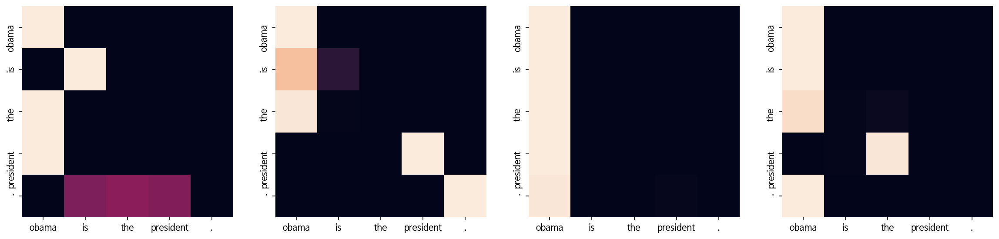

Decoder Src Layer 1


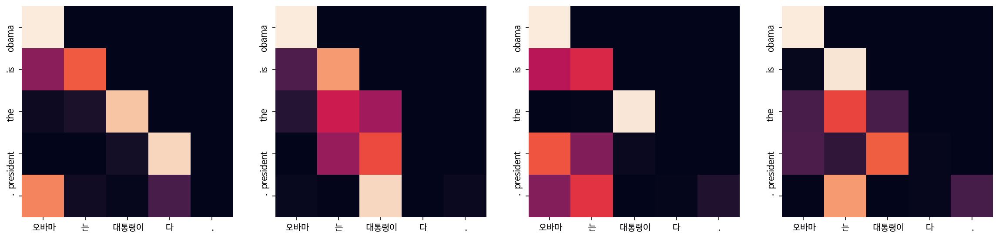

Decoder Self Layer 2


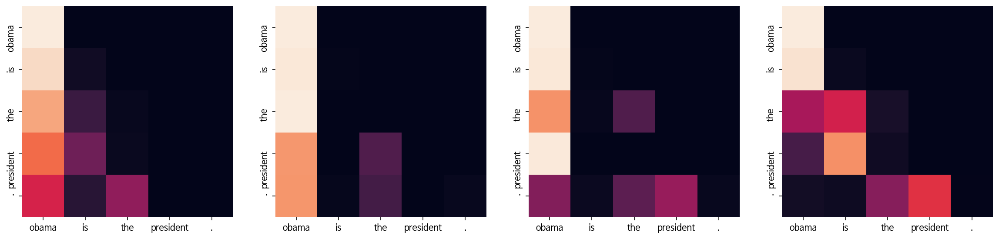

Decoder Src Layer 2


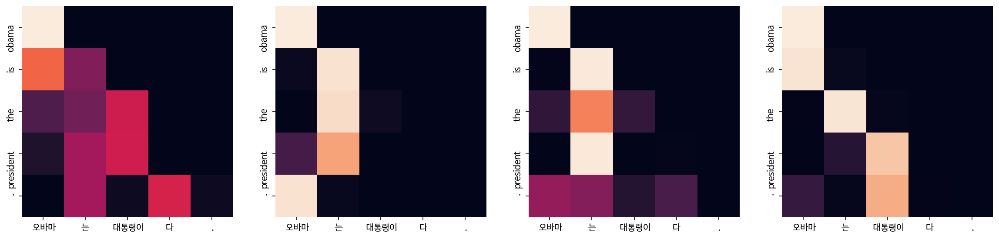

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is estimated to watch the mountain and mountain and in them .
Encoder Layer 1


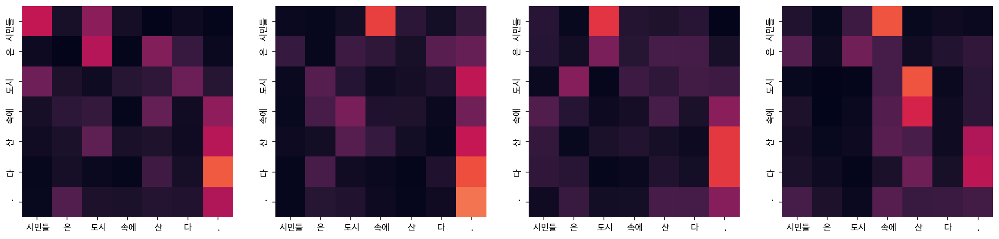

Encoder Layer 2


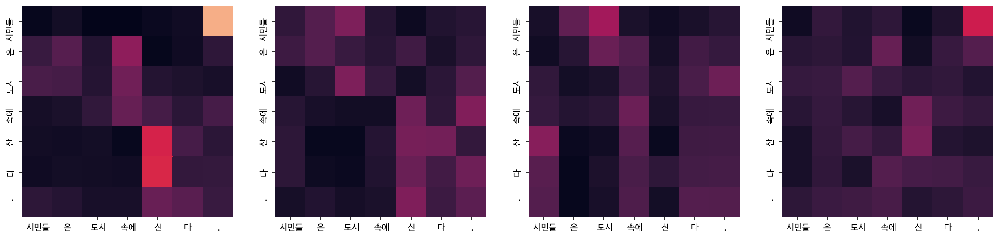

Decoder Self Layer 1


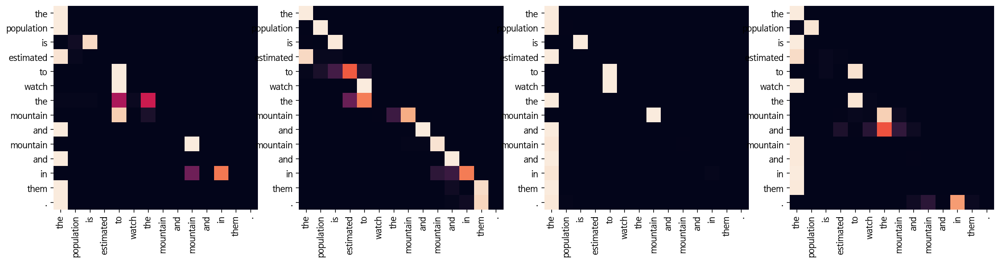

Decoder Src Layer 1


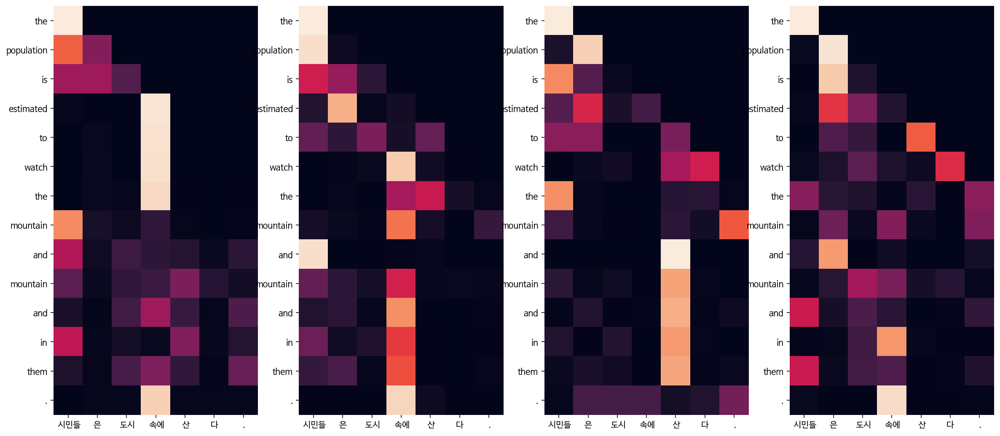

Decoder Self Layer 2


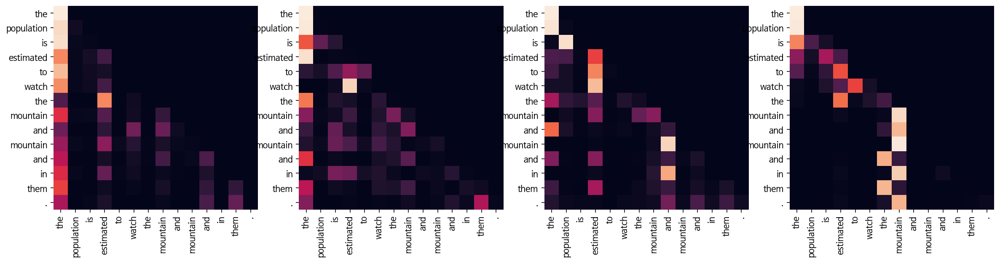

Decoder Src Layer 2


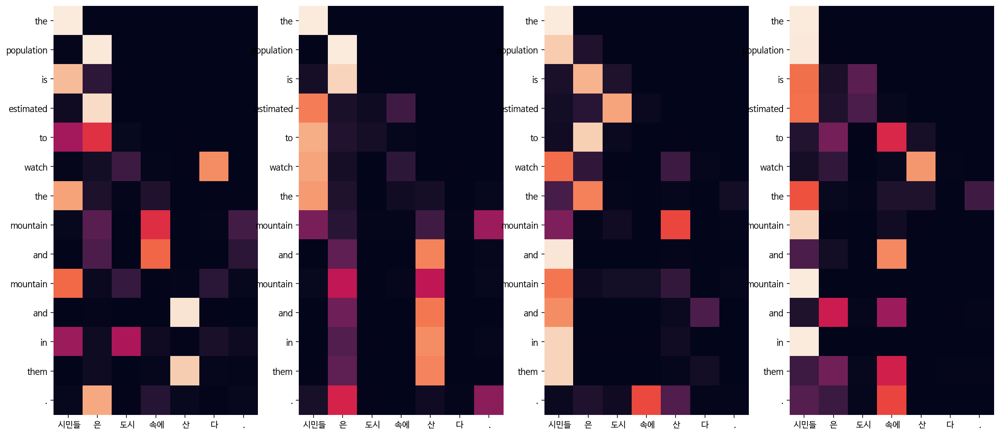

Input: 커피는 필요 없다.
Predicted translation: coffee needs to go .
Encoder Layer 1


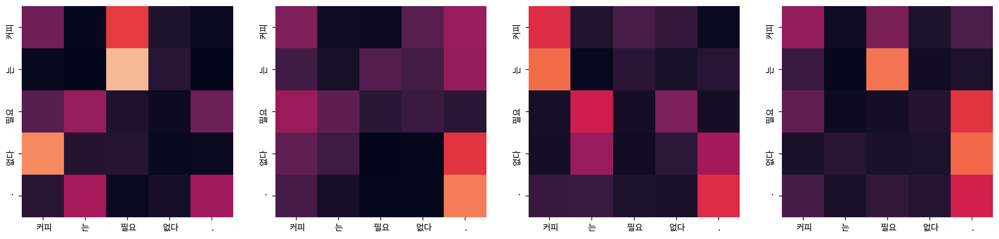

Encoder Layer 2


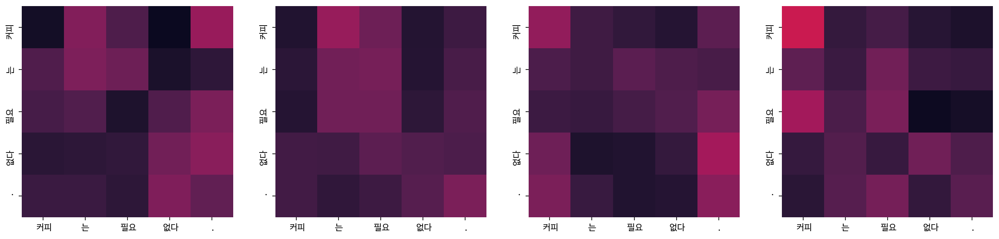

Decoder Self Layer 1


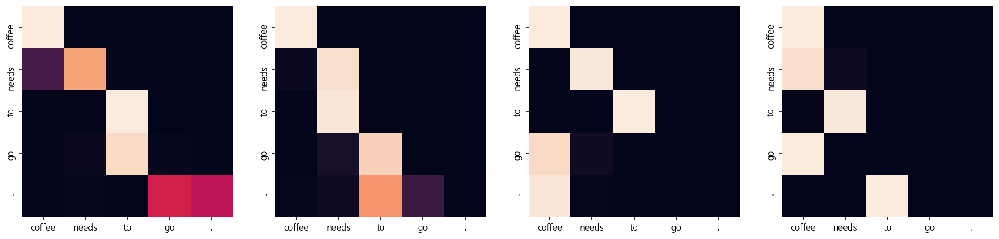

Decoder Src Layer 1


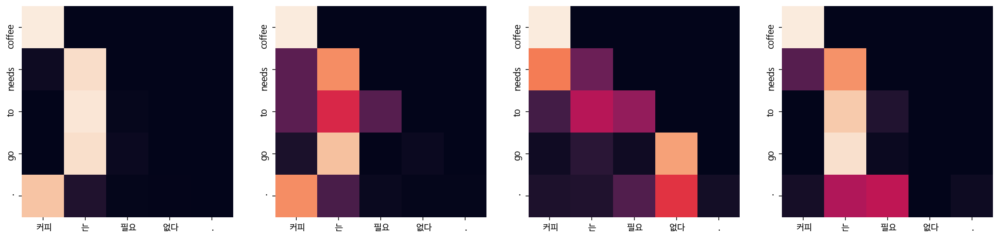

Decoder Self Layer 2


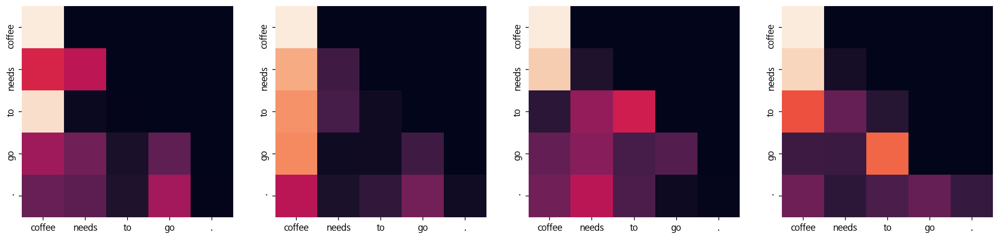

Decoder Src Layer 2


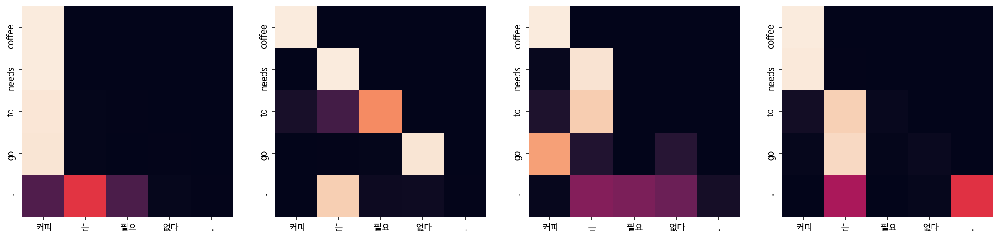

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed , the fatality was seven .
Encoder Layer 1


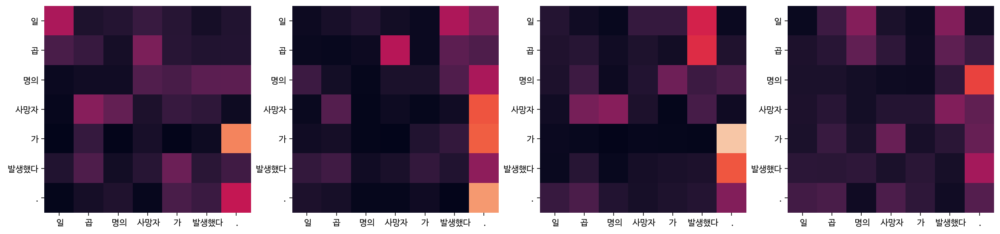

Encoder Layer 2


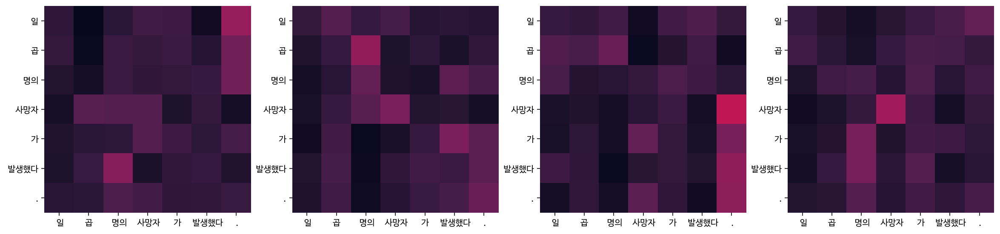

Decoder Self Layer 1


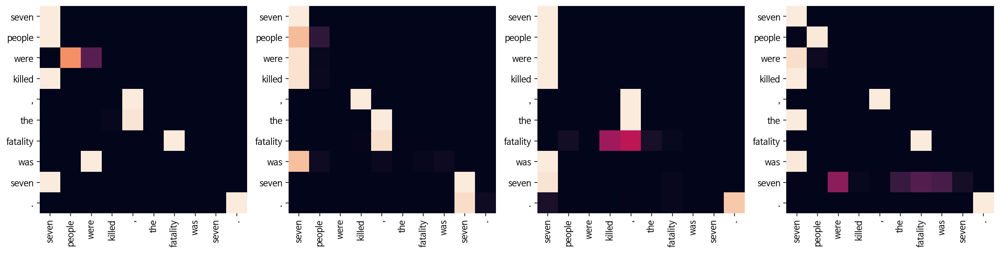

Decoder Src Layer 1


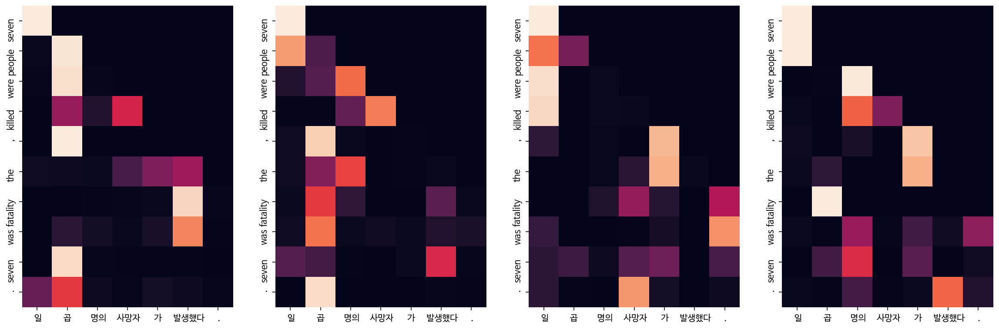

Decoder Self Layer 2


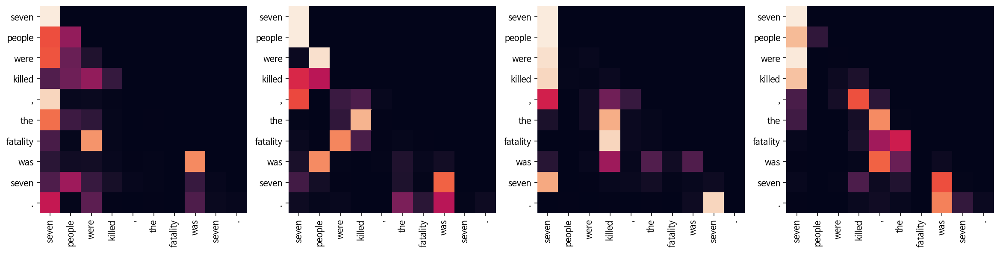

Decoder Src Layer 2


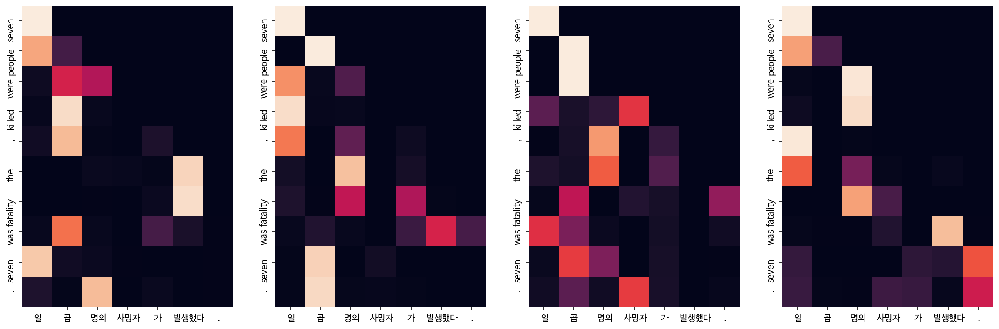

Epoch 16: 100%|██████████| 8507/8507 [19:41<00:00,  7.20it/s, Loss 1.1632]


Input: 오바마는 대통령이다.
Predicted translation: president elect barack obama is confident .
Encoder Layer 1


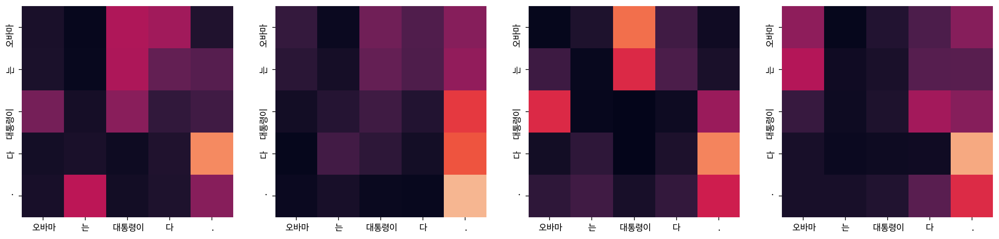

Encoder Layer 2


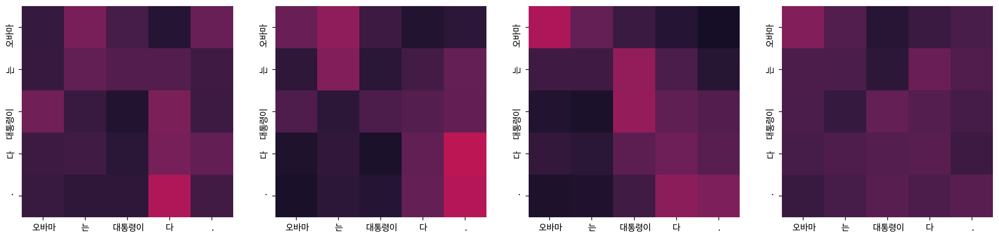

Decoder Self Layer 1


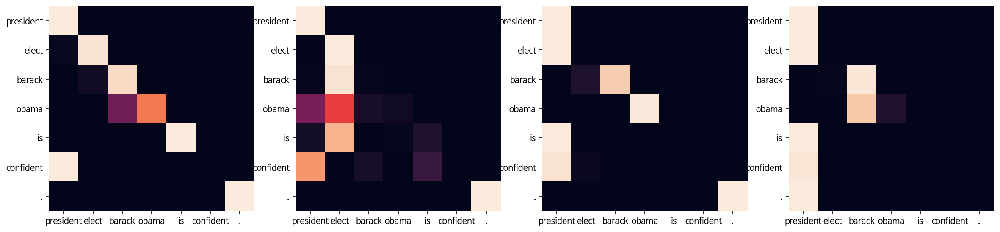

Decoder Src Layer 1


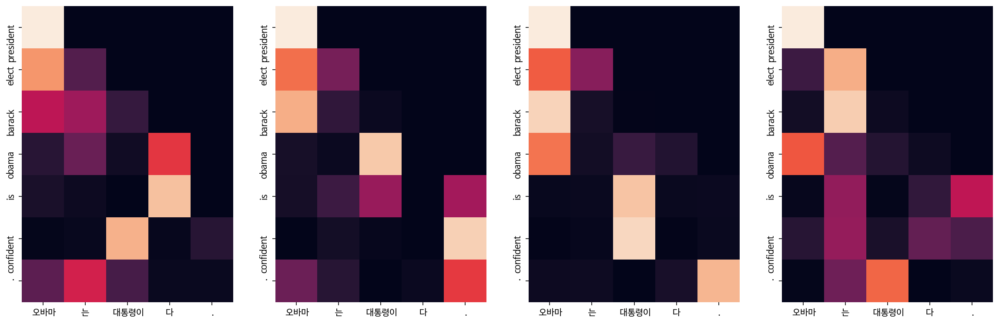

Decoder Self Layer 2


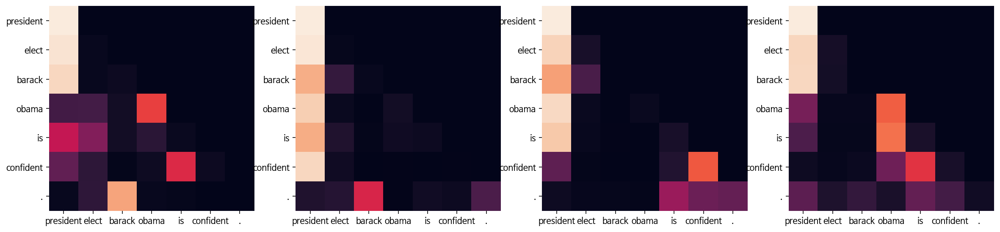

Decoder Src Layer 2


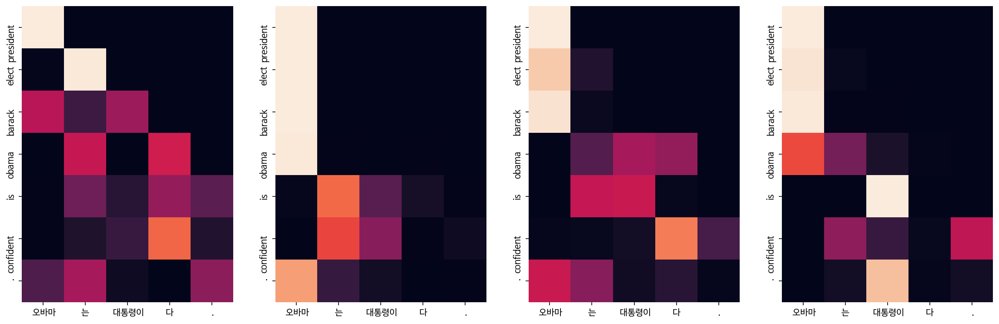

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is likely to be cared in cities .
Encoder Layer 1


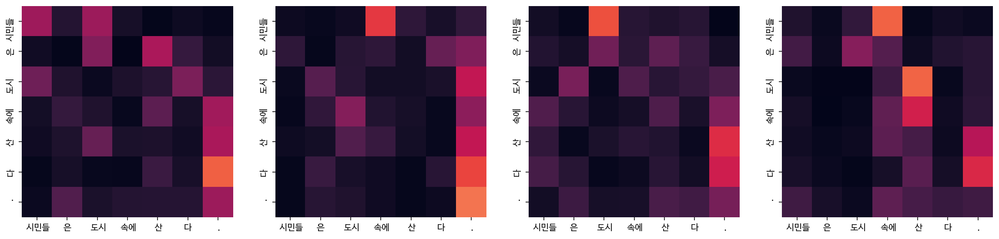

Encoder Layer 2


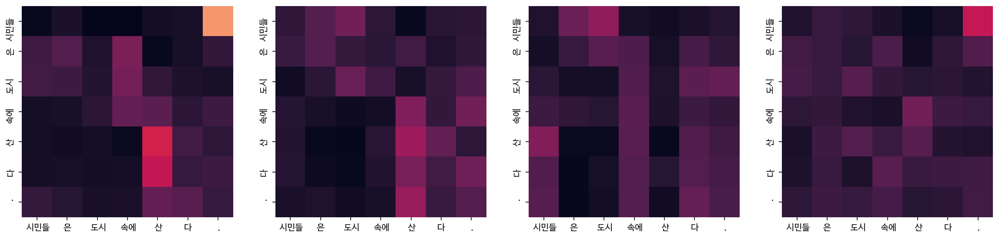

Decoder Self Layer 1


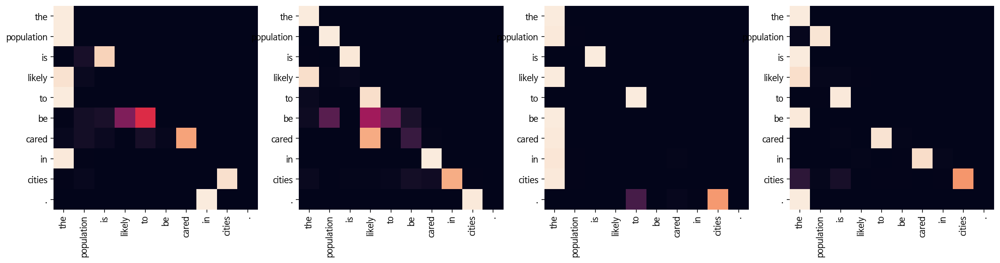

Decoder Src Layer 1


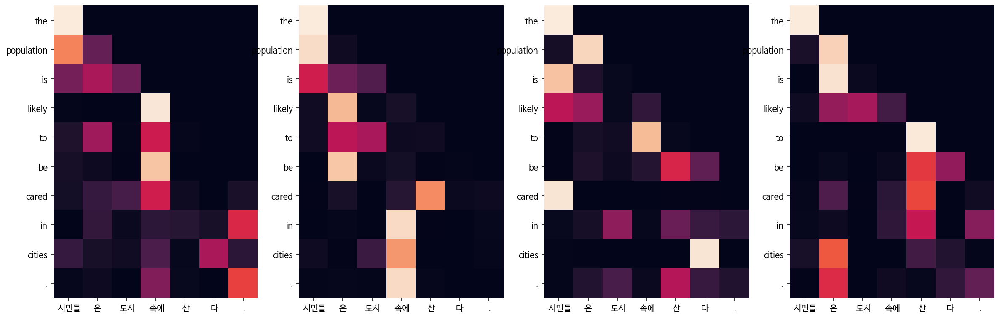

Decoder Self Layer 2


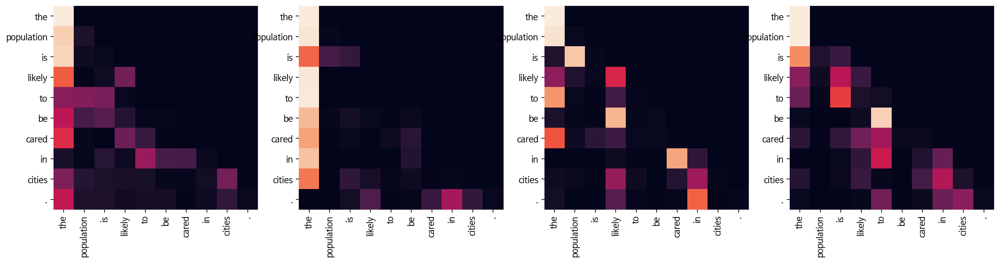

Decoder Src Layer 2


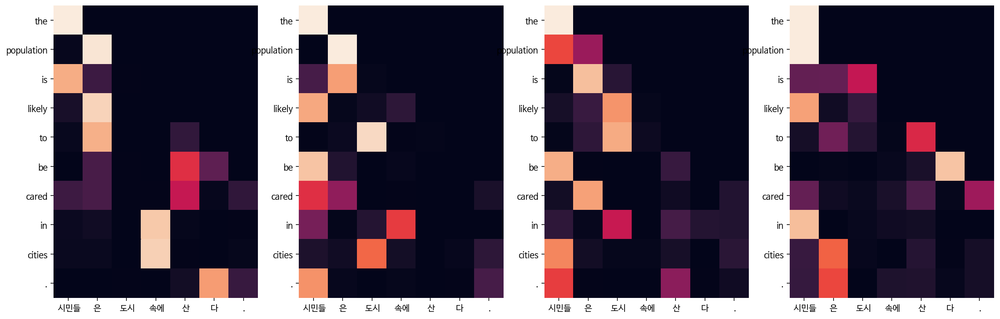

Input: 커피는 필요 없다.
Predicted translation: coffee is no need to need .
Encoder Layer 1


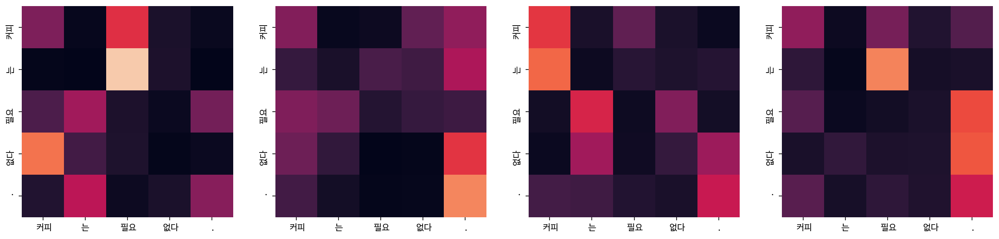

Encoder Layer 2


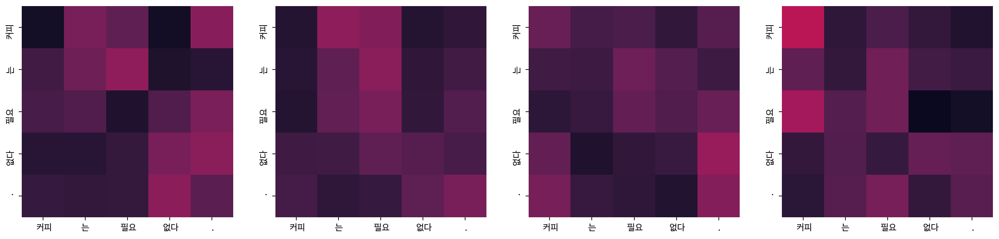

Decoder Self Layer 1


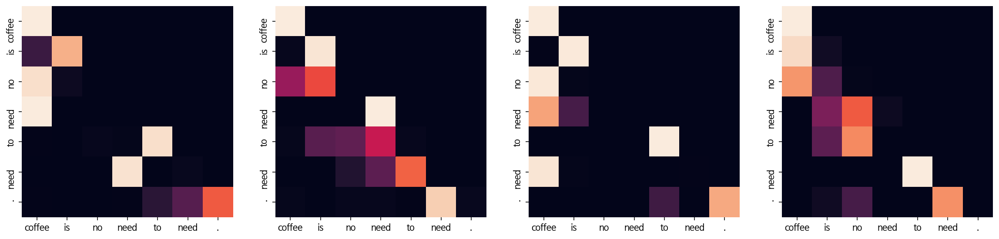

Decoder Src Layer 1


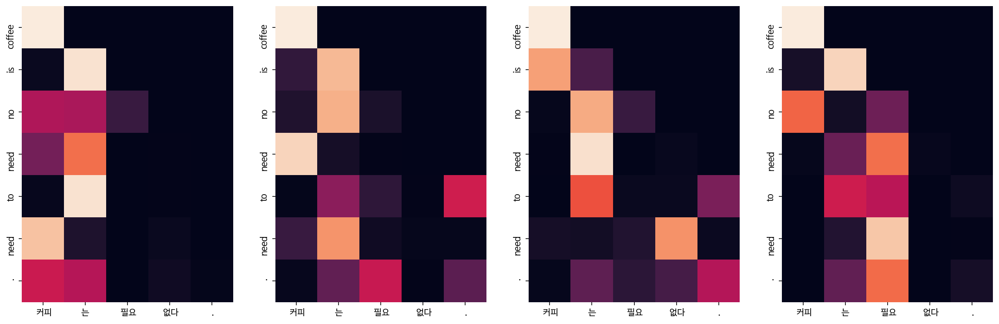

Decoder Self Layer 2


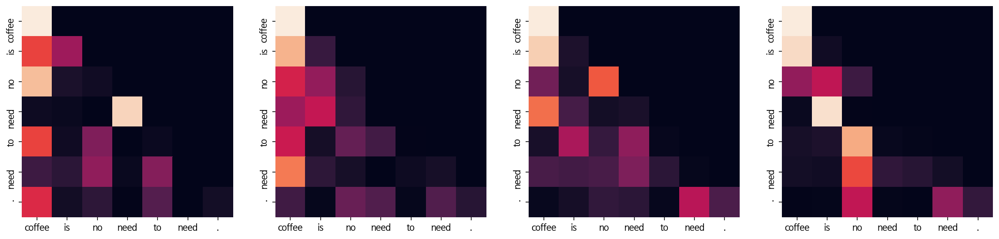

Decoder Src Layer 2


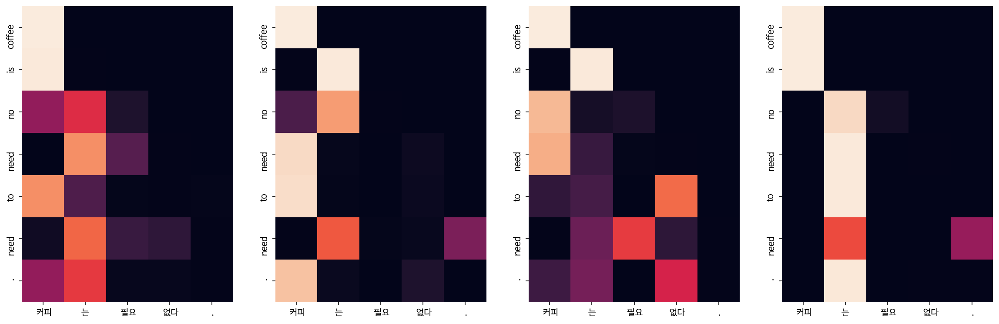

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people were confirmed dead on monday .
Encoder Layer 1


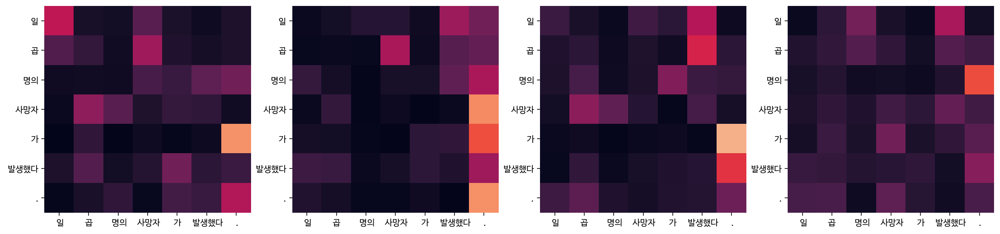

Encoder Layer 2


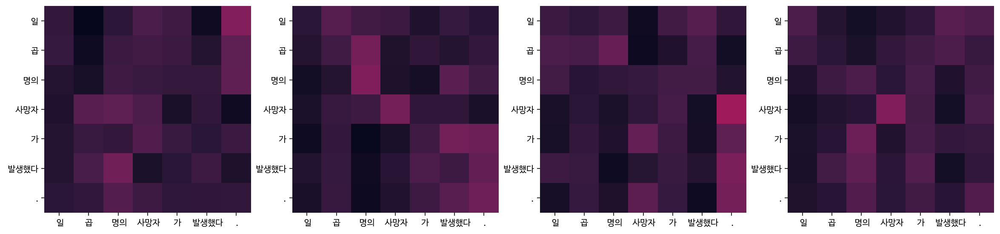

Decoder Self Layer 1


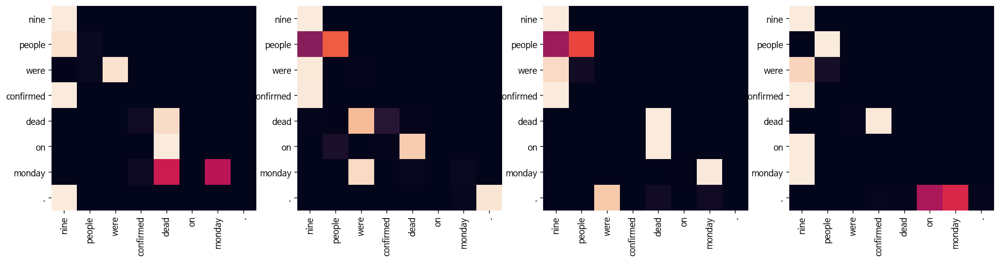

Decoder Src Layer 1


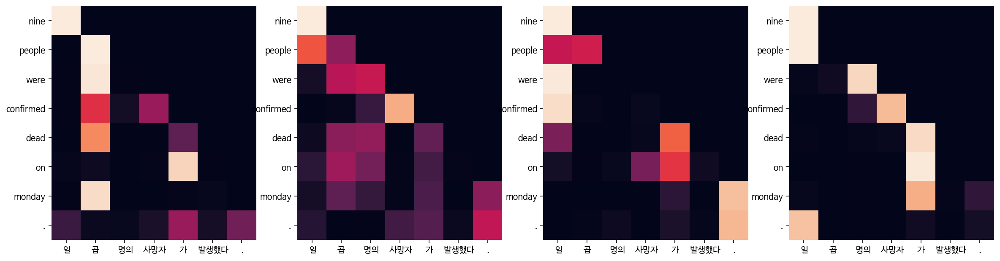

Decoder Self Layer 2


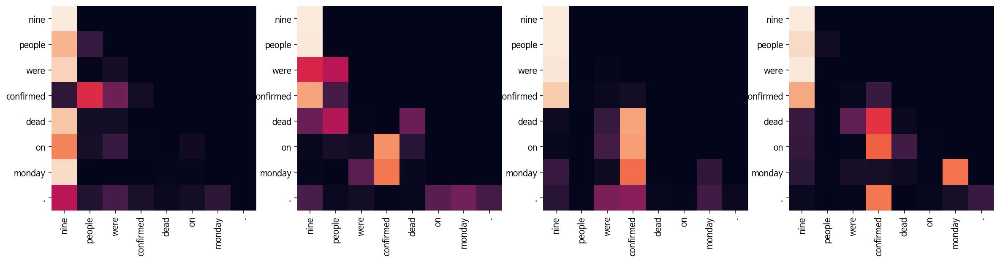

Decoder Src Layer 2


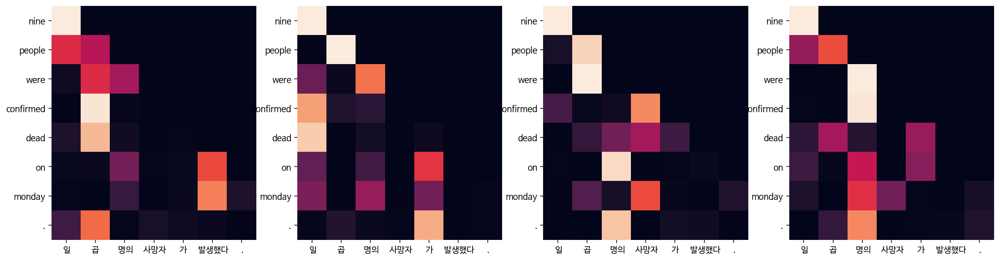

Epoch 17: 100%|██████████| 8507/8507 [19:29<00:00,  7.28it/s, Loss 1.1202]


Input: 오바마는 대통령이다.
Predicted translation: obama is the father of president bush .
Encoder Layer 1


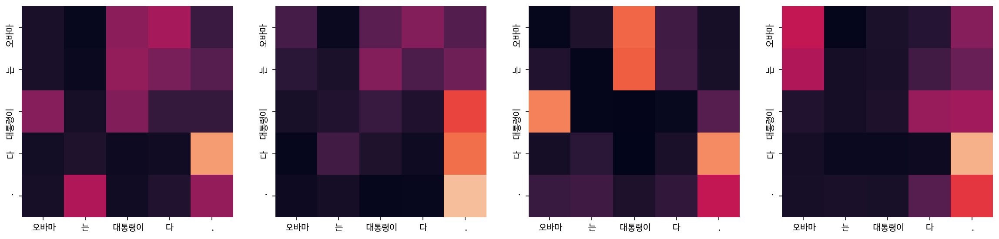

Encoder Layer 2


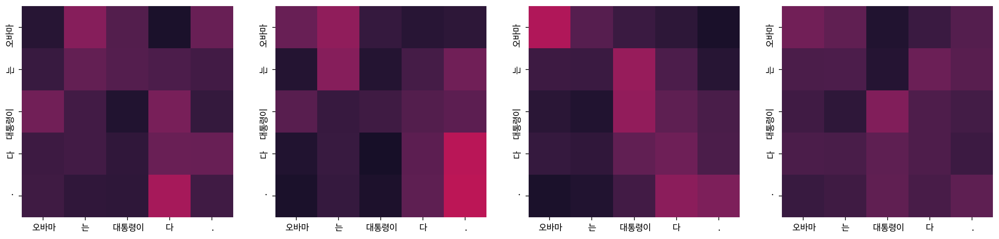

Decoder Self Layer 1


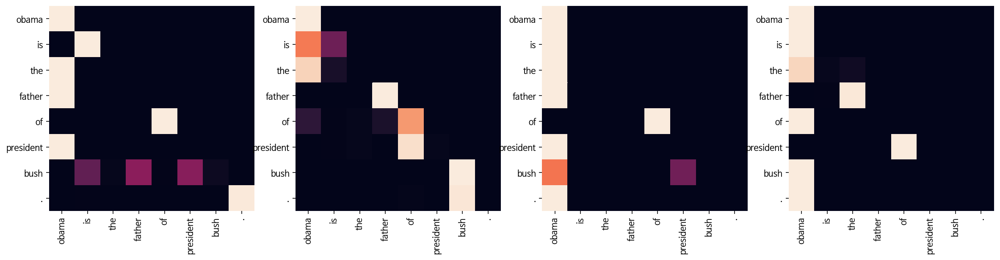

Decoder Src Layer 1


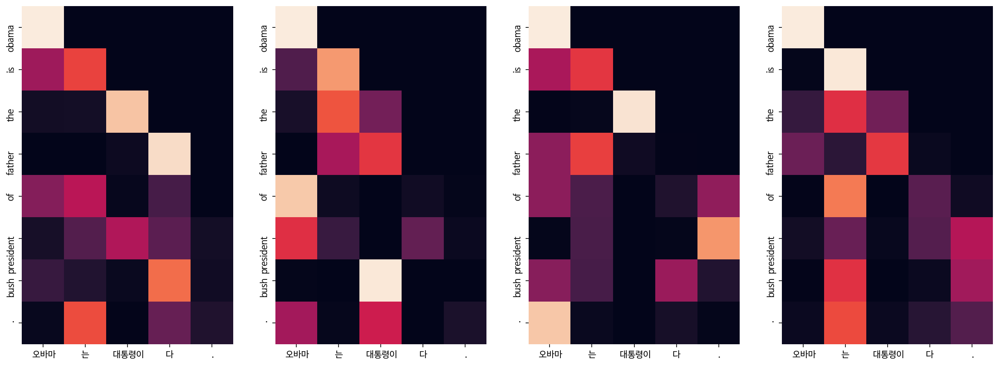

Decoder Self Layer 2


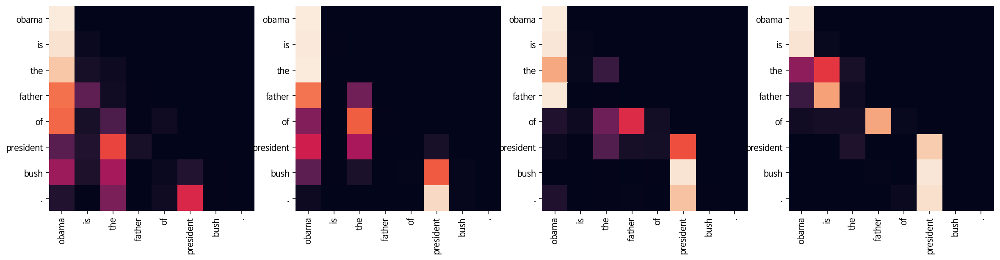

Decoder Src Layer 2


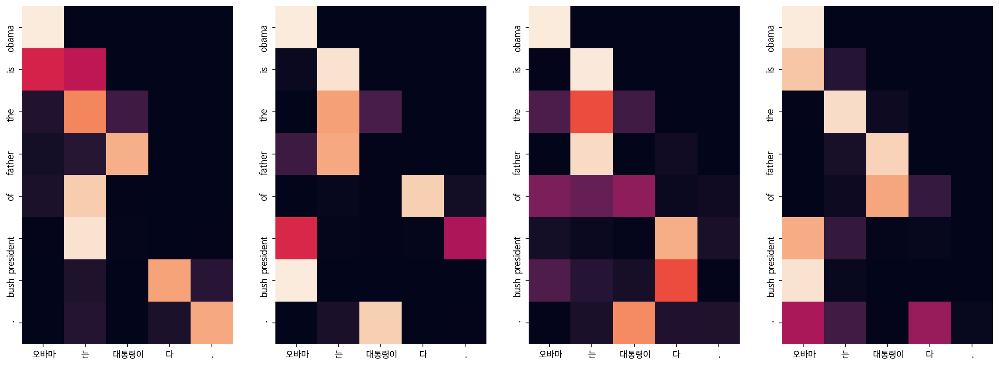

Input: 시민들은 도시 속에 산다.
Predicted translation: the figure is childly fallers .
Encoder Layer 1


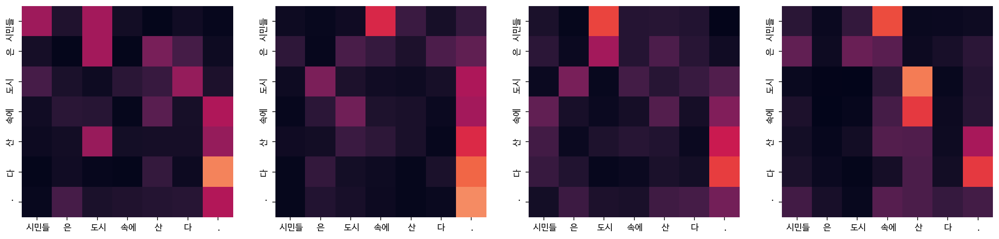

Encoder Layer 2


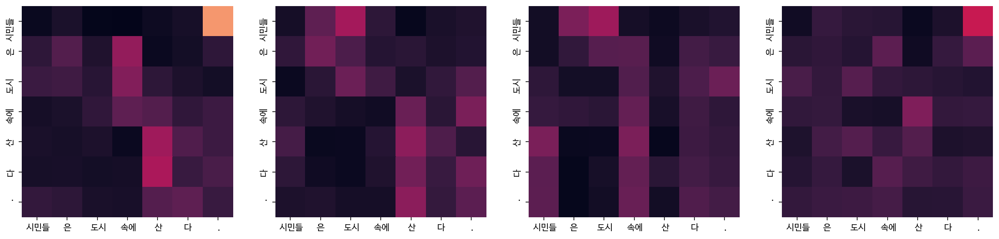

Decoder Self Layer 1


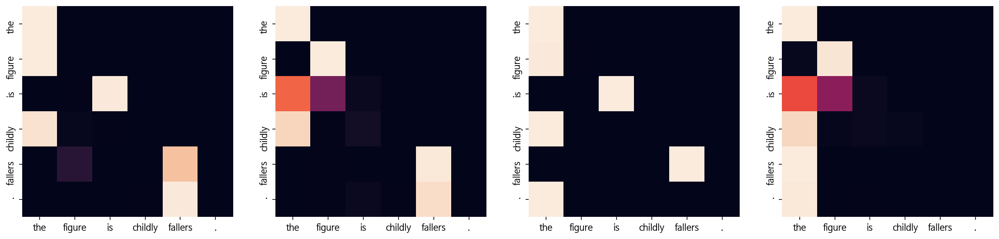

Decoder Src Layer 1


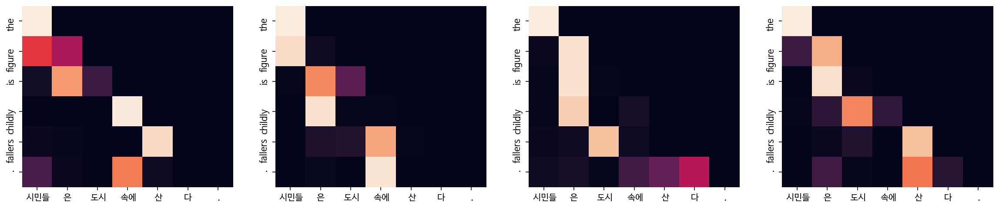

Decoder Self Layer 2


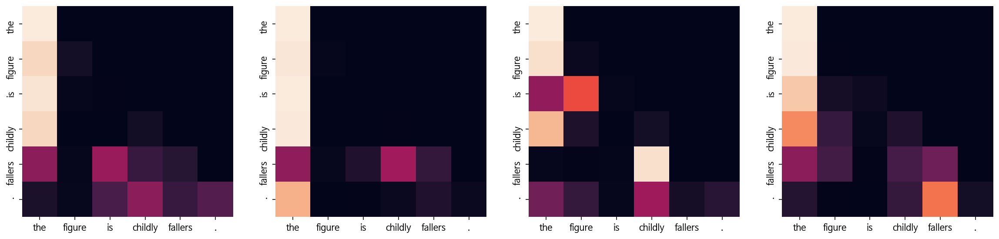

Decoder Src Layer 2


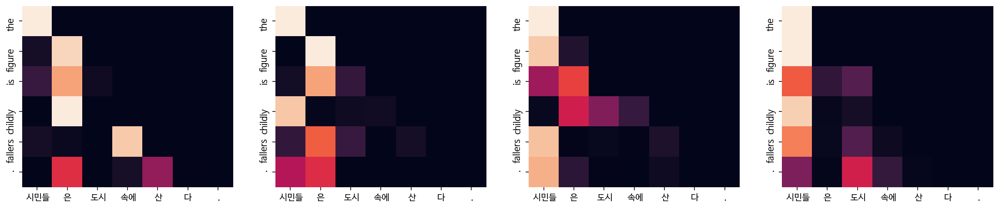

Input: 커피는 필요 없다.
Predicted translation: coffee is no short need to send coffee .
Encoder Layer 1


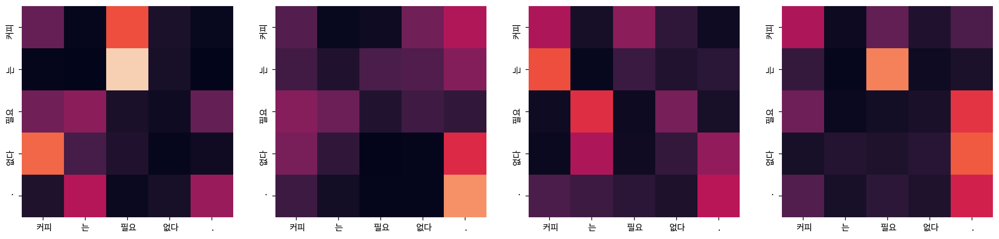

Encoder Layer 2


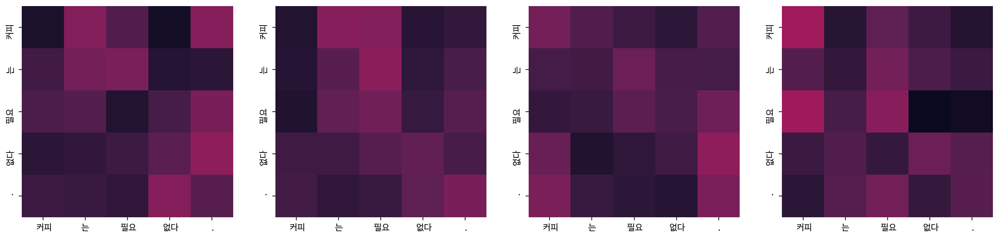

Decoder Self Layer 1


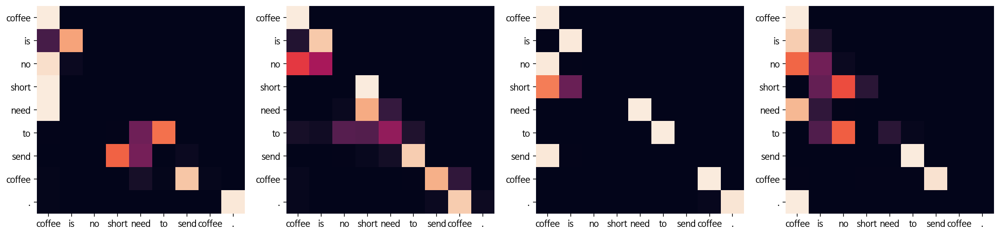

Decoder Src Layer 1


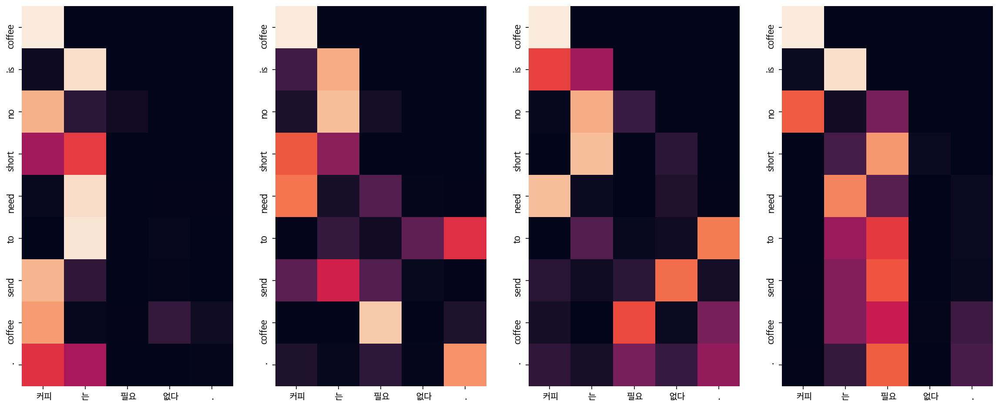

Decoder Self Layer 2


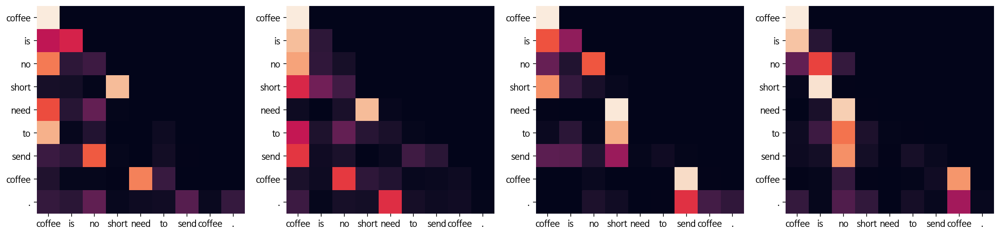

Decoder Src Layer 2


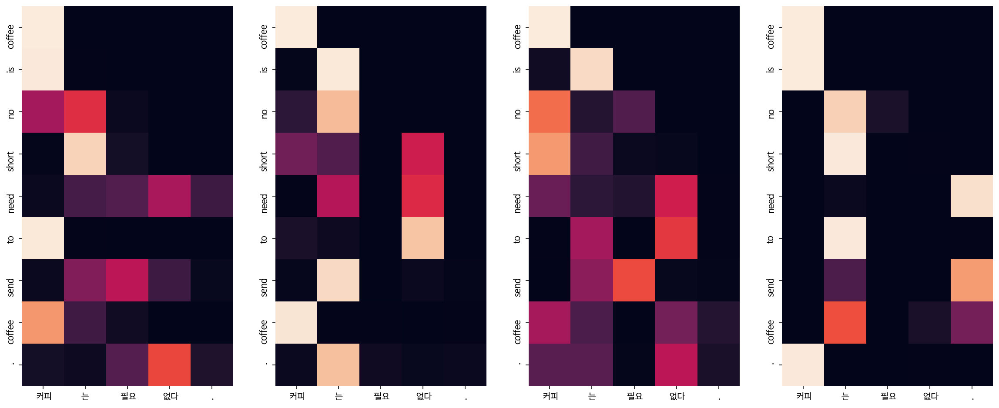

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people were killed on thursday .
Encoder Layer 1


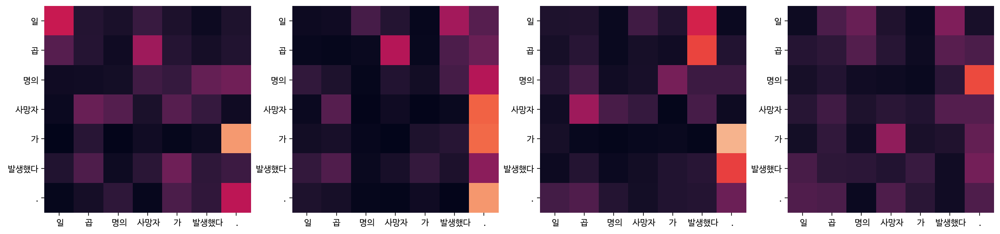

Encoder Layer 2


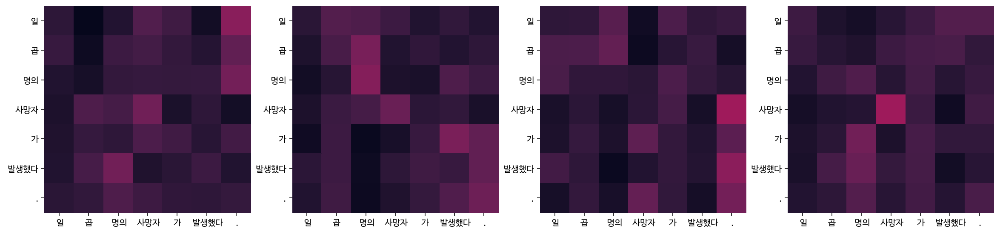

Decoder Self Layer 1


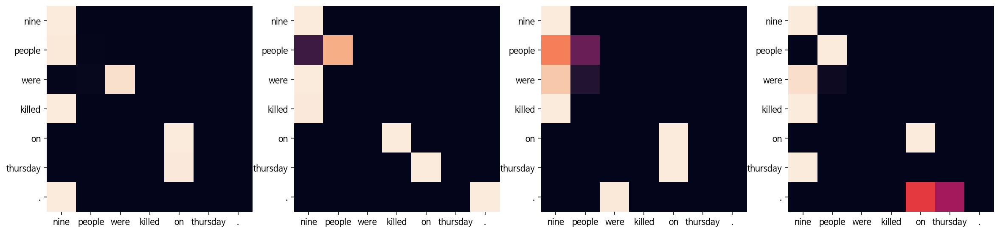

Decoder Src Layer 1


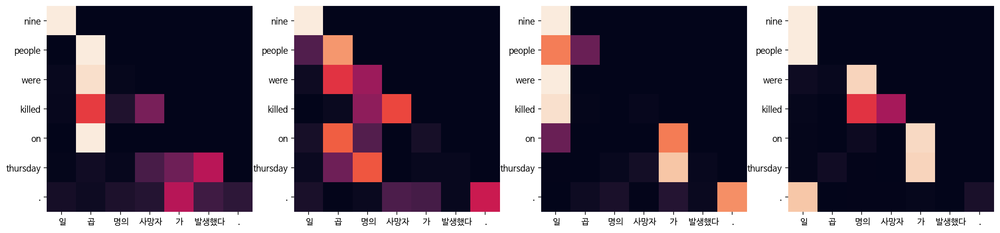

Decoder Self Layer 2


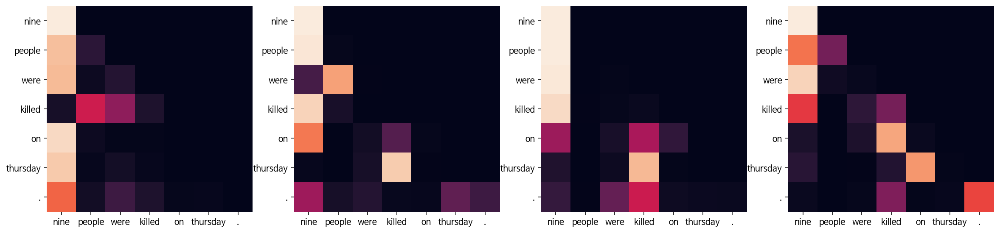

Decoder Src Layer 2


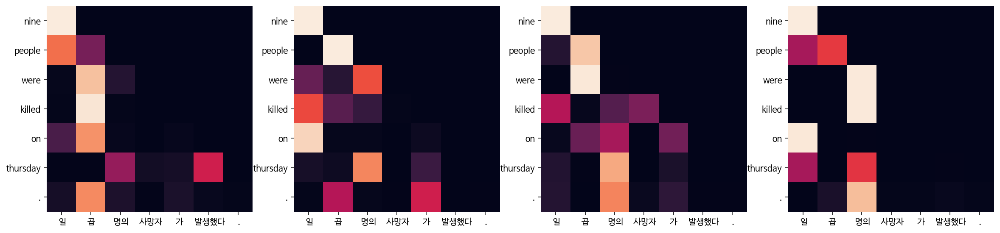

Epoch 18: 100%|██████████| 8507/8507 [19:42<00:00,  7.19it/s, Loss 1.0774]


Input: 오바마는 대통령이다.
Predicted translation: obama currently do .
Encoder Layer 1


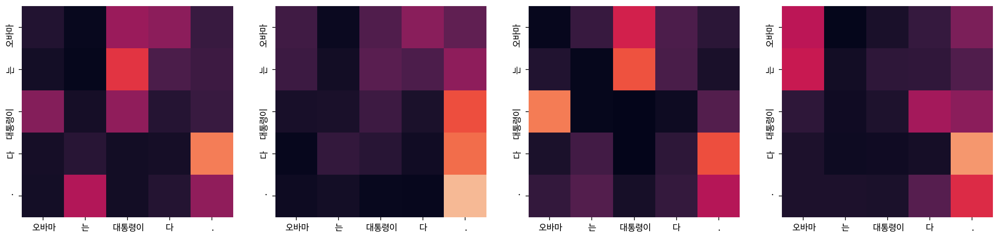

Encoder Layer 2


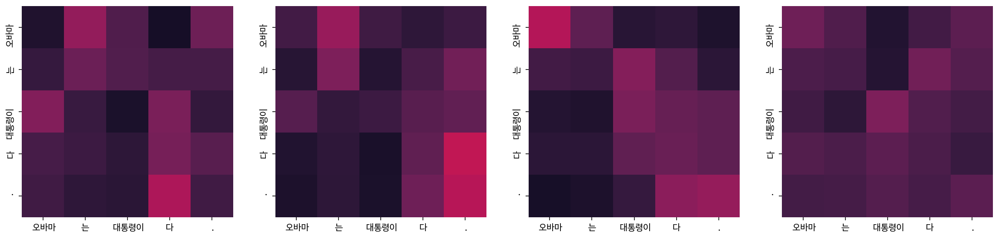

Decoder Self Layer 1


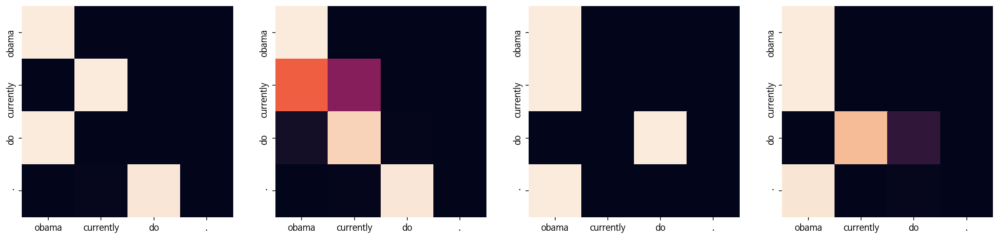

Decoder Src Layer 1


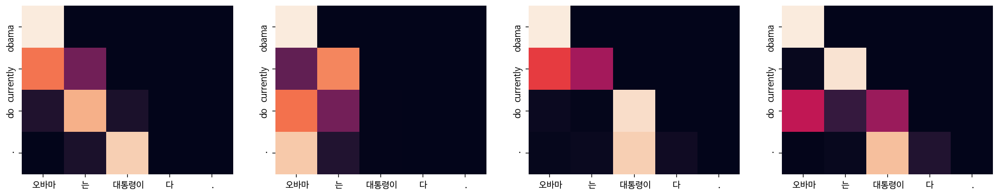

Decoder Self Layer 2


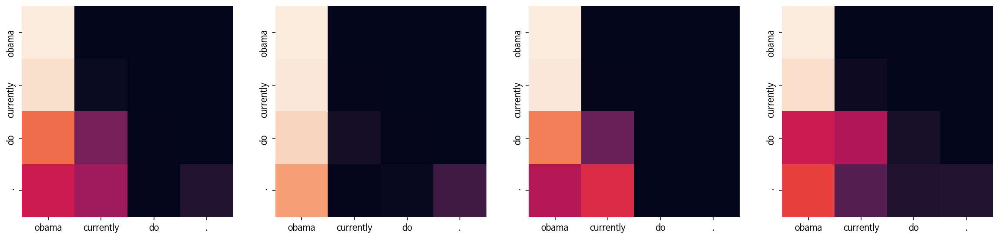

Decoder Src Layer 2


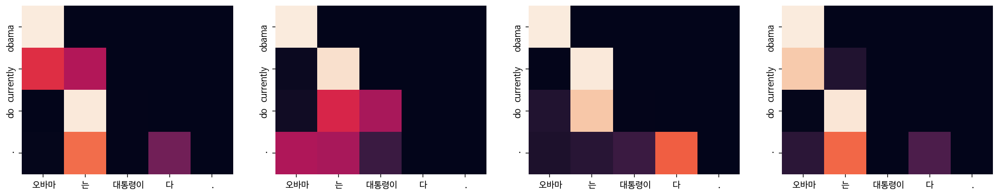

Input: 시민들은 도시 속에 산다.
Predicted translation: the seeing island activities in the motown .
Encoder Layer 1


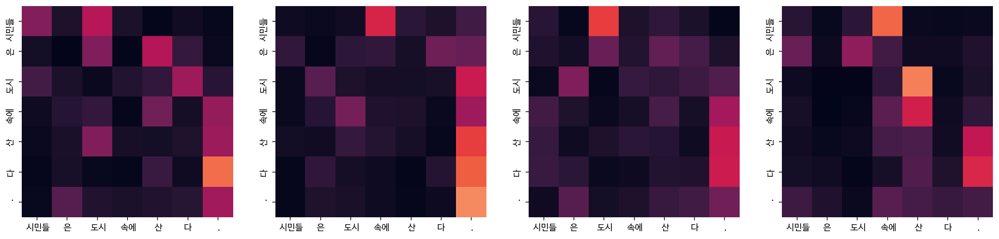

Encoder Layer 2


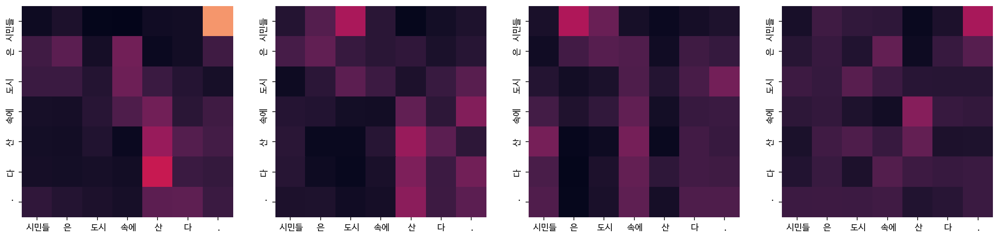

Decoder Self Layer 1


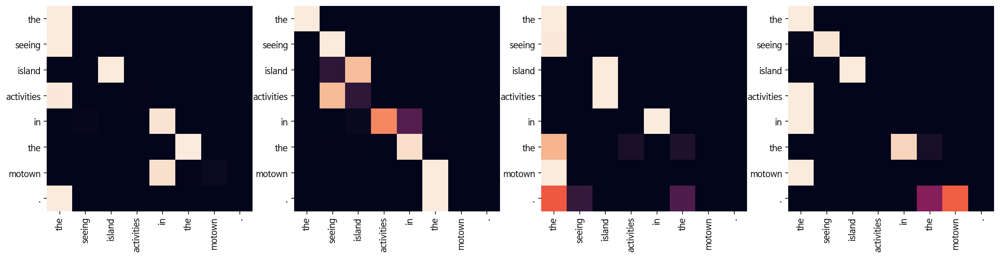

Decoder Src Layer 1


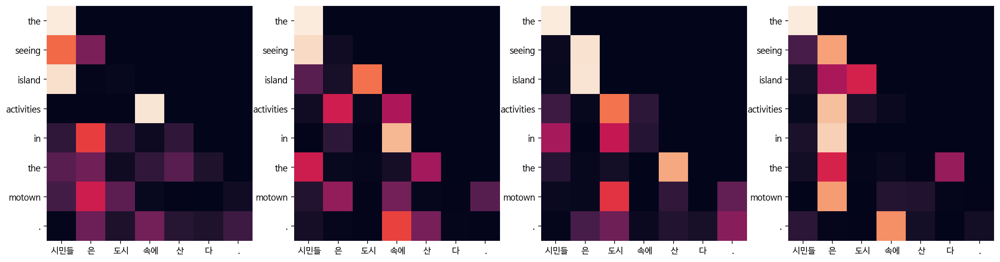

Decoder Self Layer 2


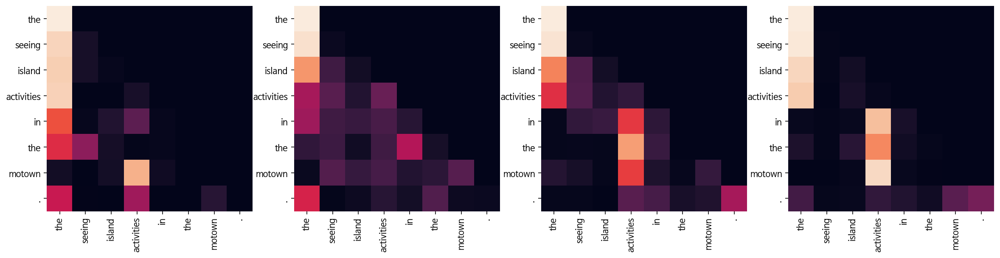

Decoder Src Layer 2


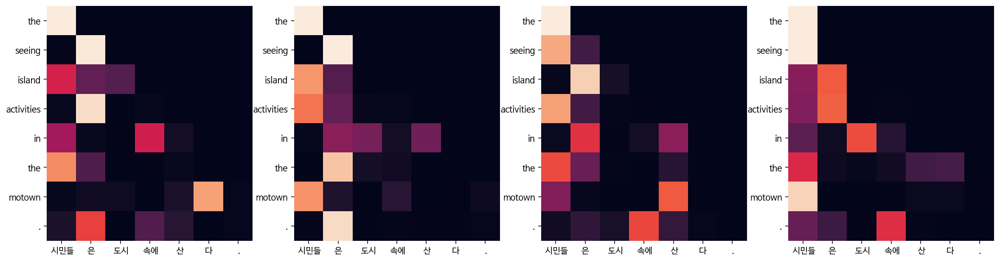

Input: 커피는 필요 없다.
Predicted translation: coffee don t need coffee .
Encoder Layer 1


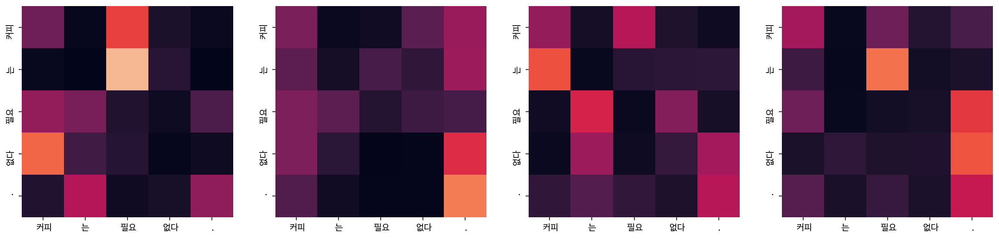

Encoder Layer 2


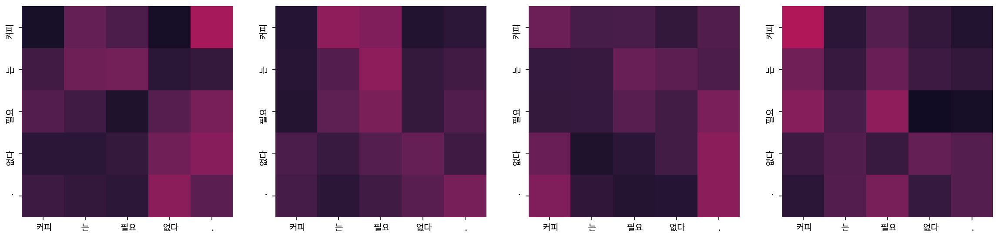

Decoder Self Layer 1


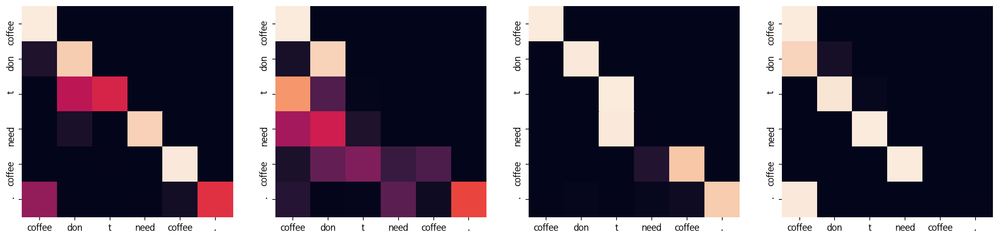

Decoder Src Layer 1


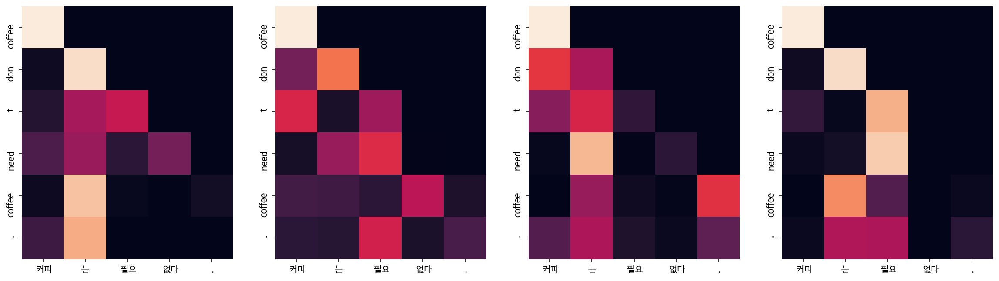

Decoder Self Layer 2


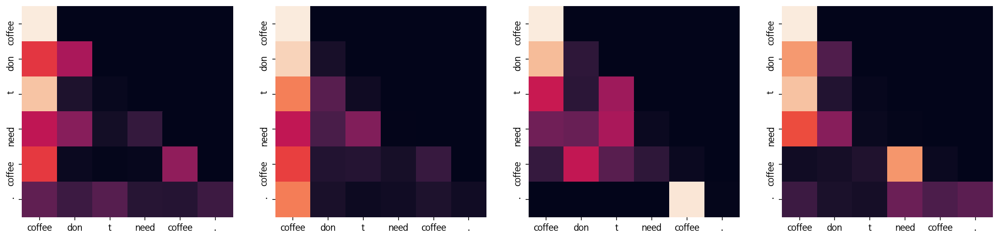

Decoder Src Layer 2


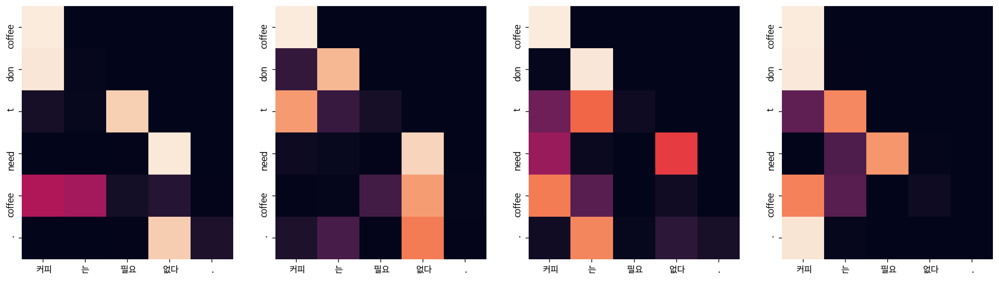

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people died sunday after an attack .
Encoder Layer 1


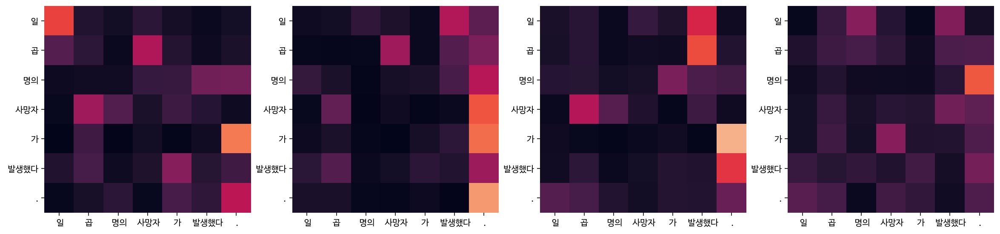

Encoder Layer 2


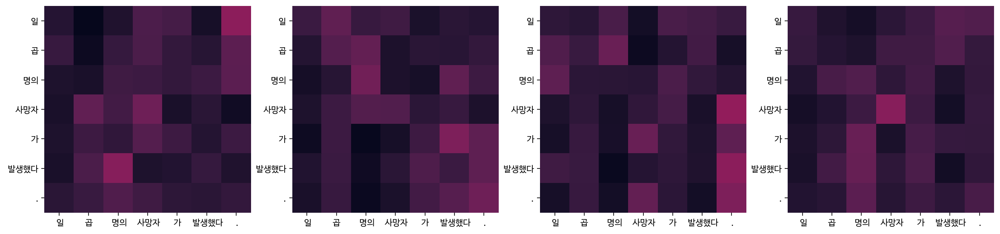

Decoder Self Layer 1


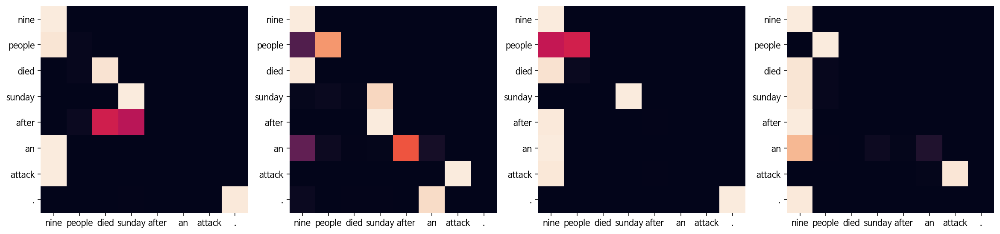

Decoder Src Layer 1


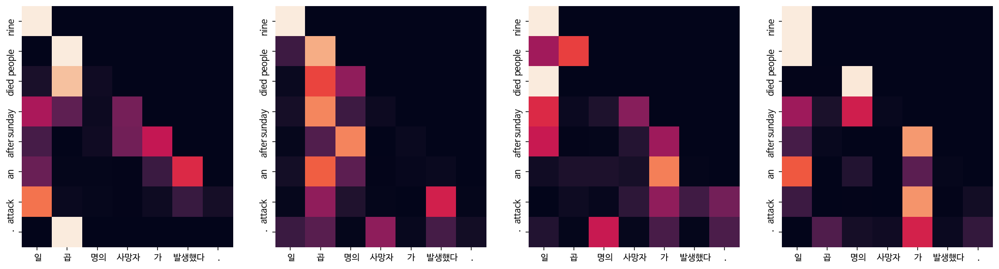

Decoder Self Layer 2


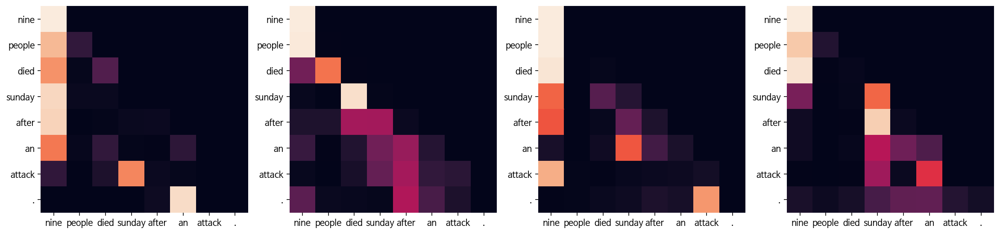

Decoder Src Layer 2


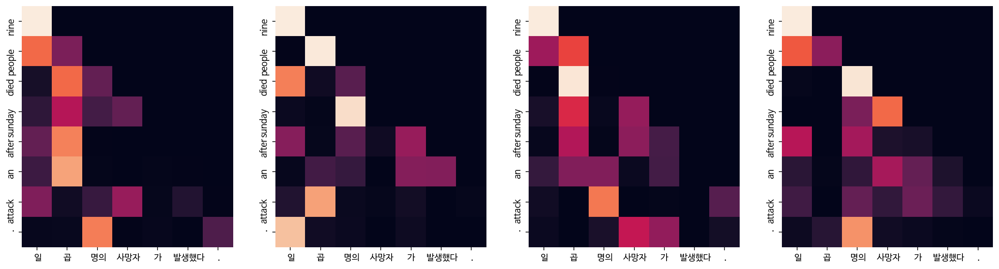

Epoch 19: 100%|██████████| 8507/8507 [19:42<00:00,  7.20it/s, Loss 1.0404]


Input: 오바마는 대통령이다.
Predicted translation: obama currently then .
Encoder Layer 1


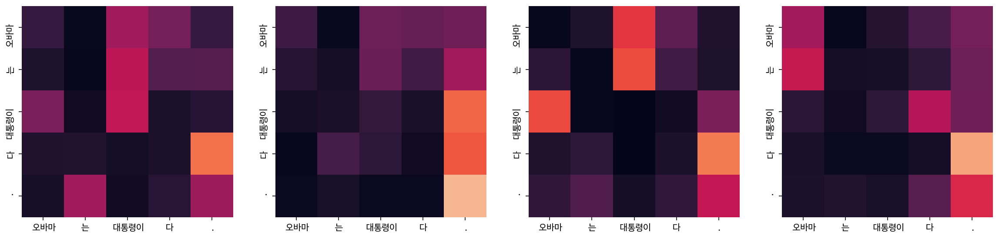

Encoder Layer 2


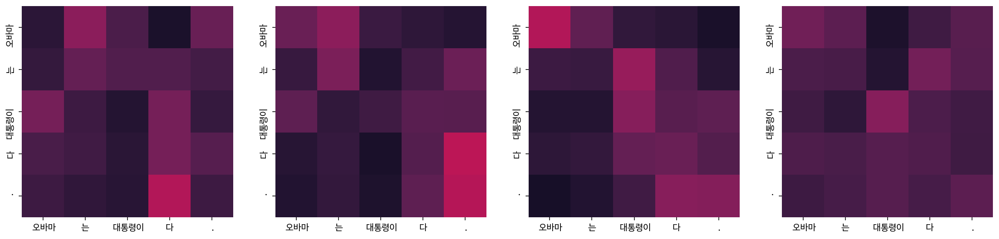

Decoder Self Layer 1


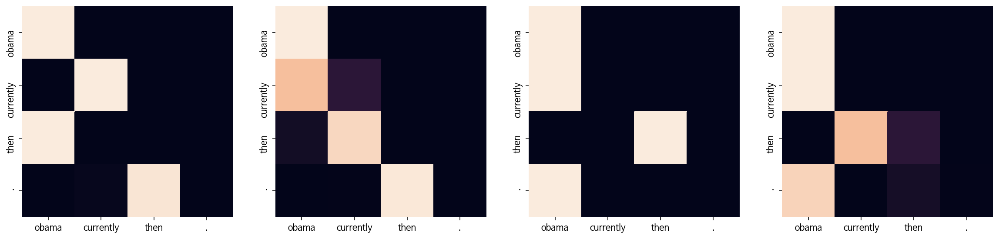

Decoder Src Layer 1


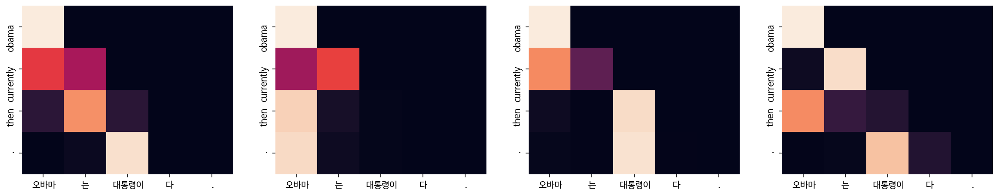

Decoder Self Layer 2


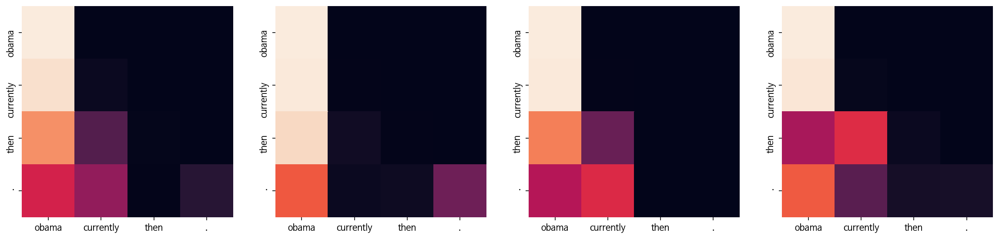

Decoder Src Layer 2


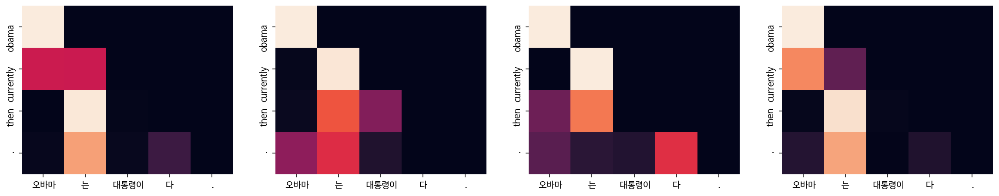

Input: 시민들은 도시 속에 산다.
Predicted translation: the city s three wheelies are safely in life .
Encoder Layer 1


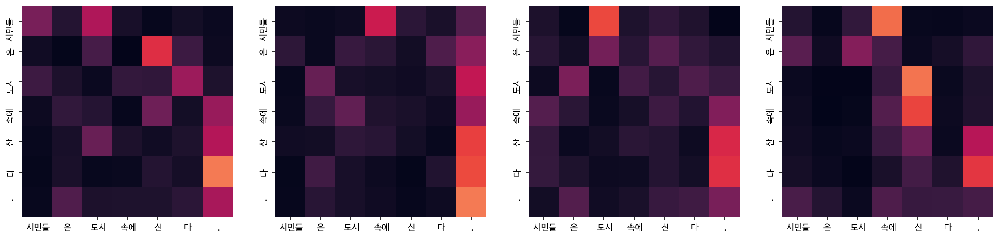

Encoder Layer 2


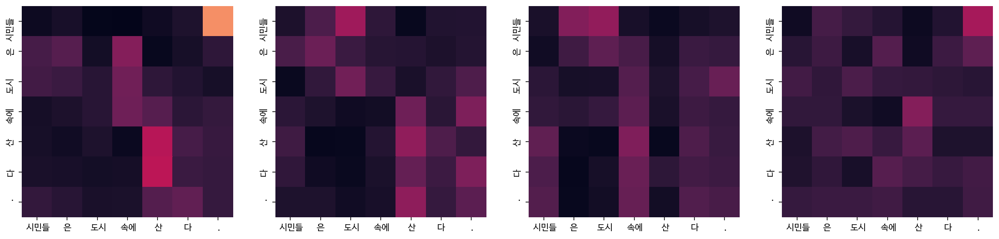

Decoder Self Layer 1


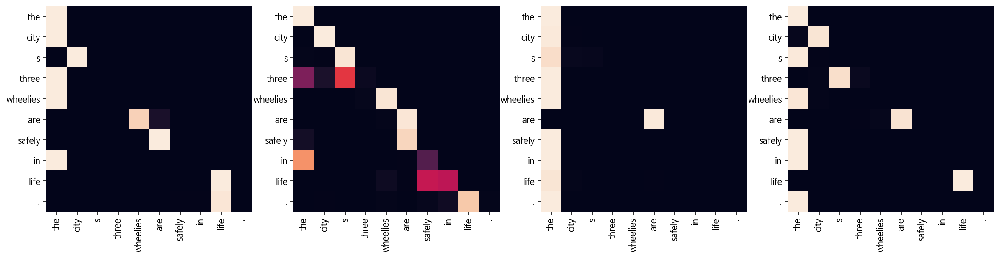

Decoder Src Layer 1


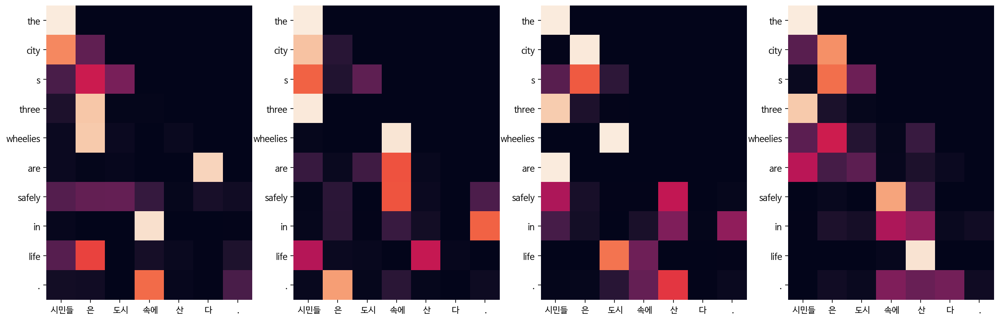

Decoder Self Layer 2


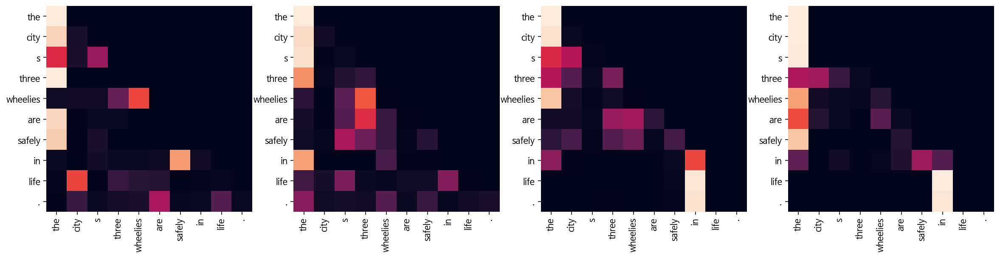

Decoder Src Layer 2


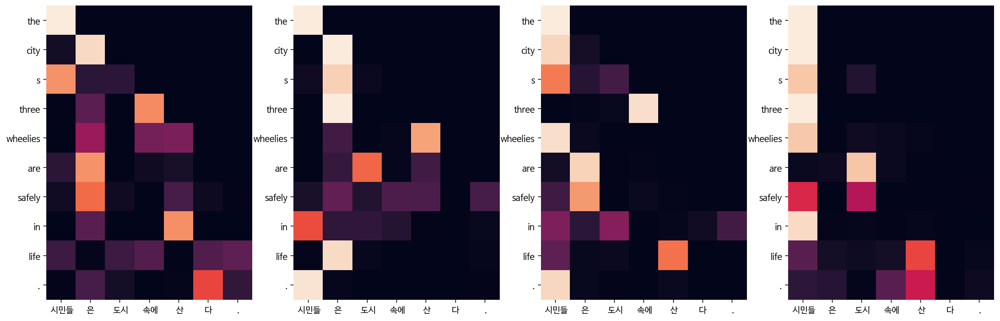

Input: 커피는 필요 없다.
Predicted translation: he needs to do .
Encoder Layer 1


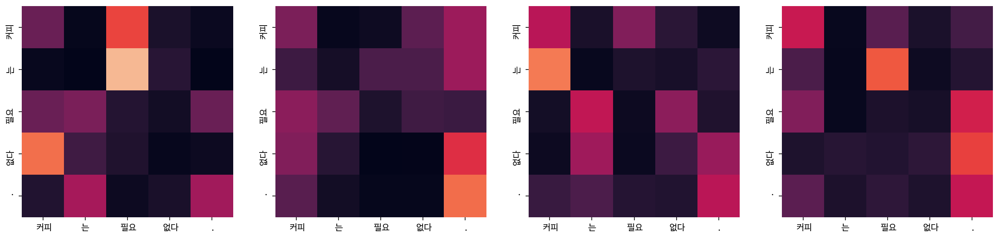

Encoder Layer 2


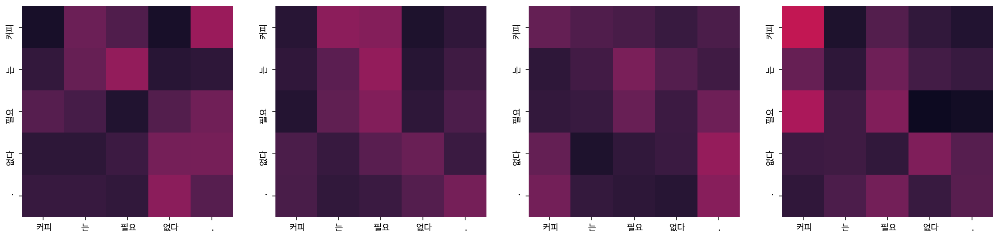

Decoder Self Layer 1


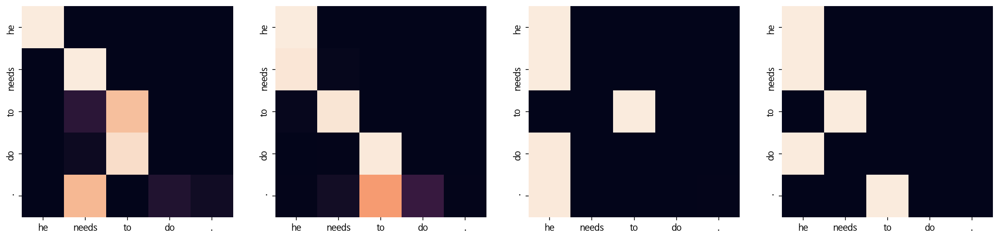

Decoder Src Layer 1


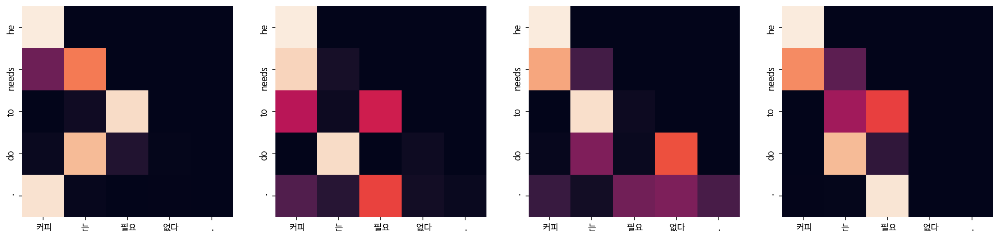

Decoder Self Layer 2


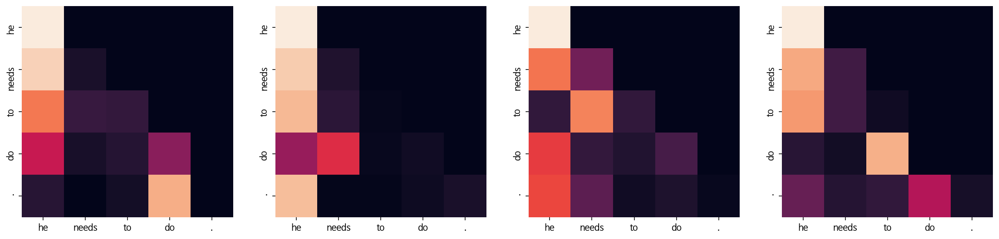

Decoder Src Layer 2


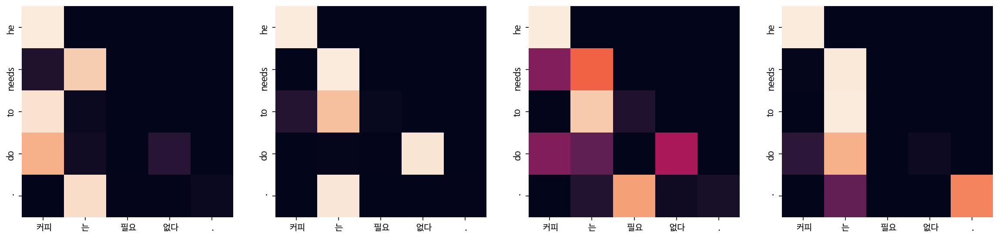

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed tuesday .
Encoder Layer 1


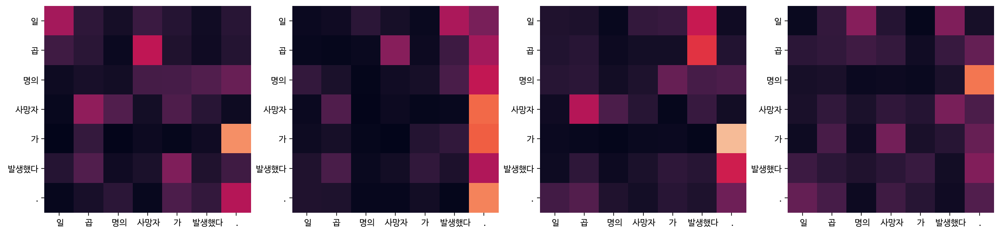

Encoder Layer 2


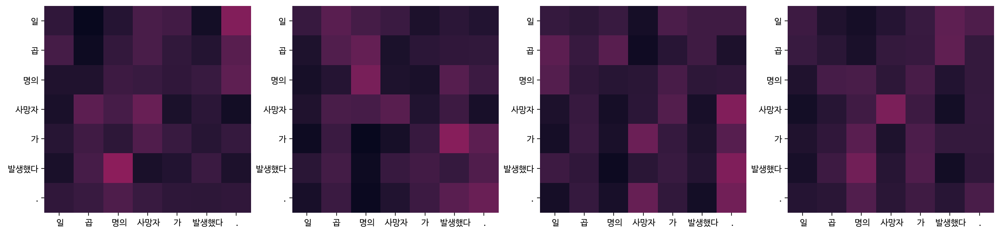

Decoder Self Layer 1


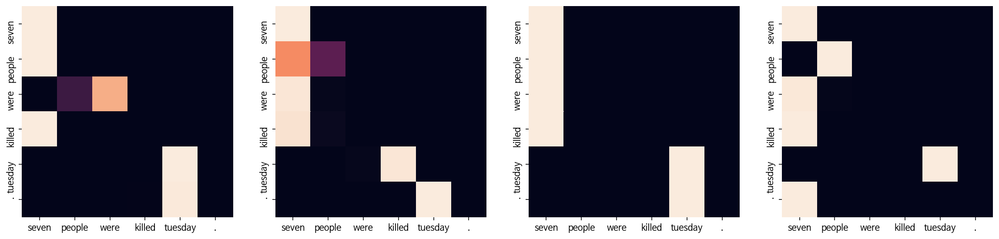

Decoder Src Layer 1


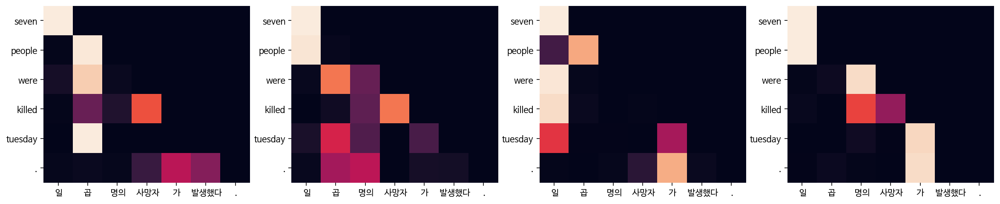

Decoder Self Layer 2


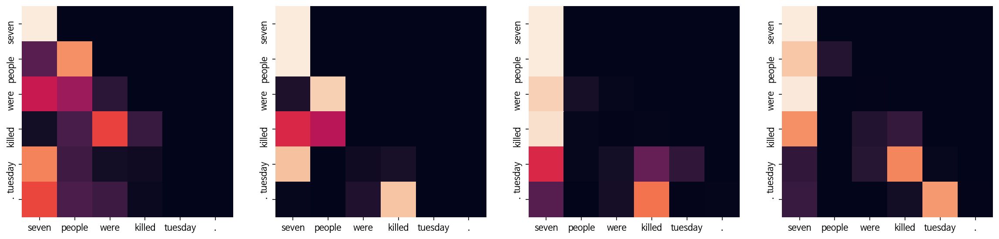

Decoder Src Layer 2


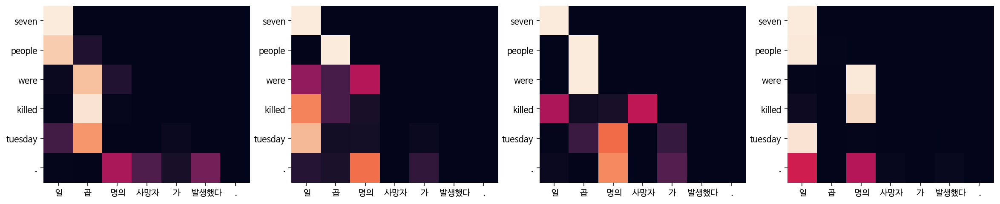

Epoch 20: 100%|██████████| 8507/8507 [19:33<00:00,  7.25it/s, Loss 1.0059]


Input: 오바마는 대통령이다.
Predicted translation: president barack obama adds .
Encoder Layer 1


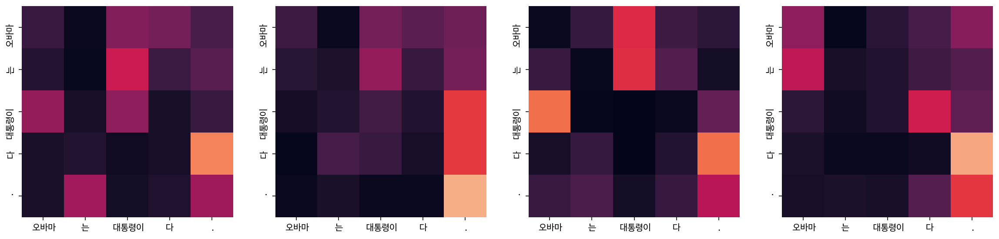

Encoder Layer 2


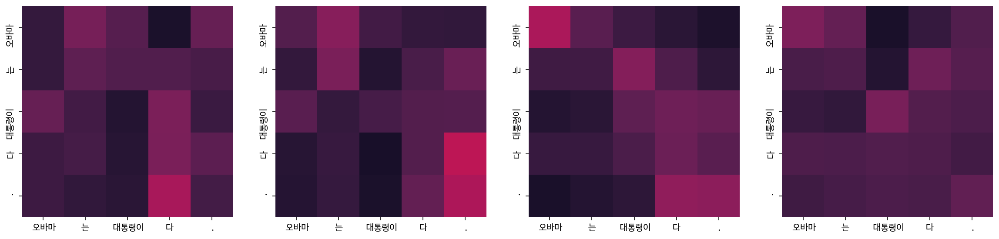

Decoder Self Layer 1


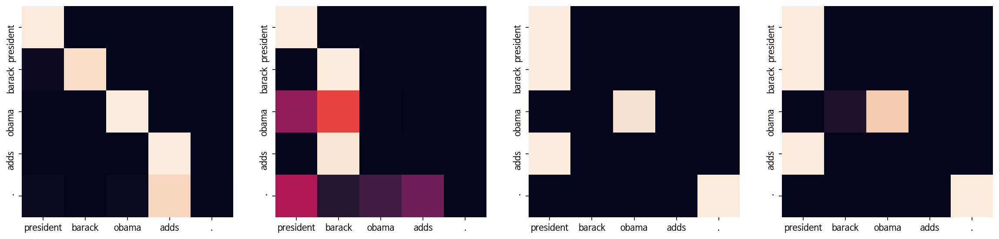

Decoder Src Layer 1


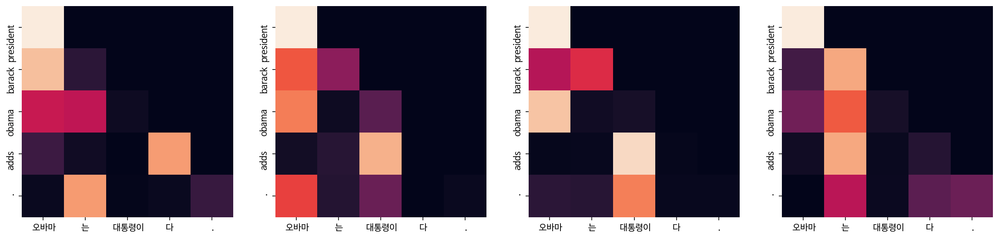

Decoder Self Layer 2


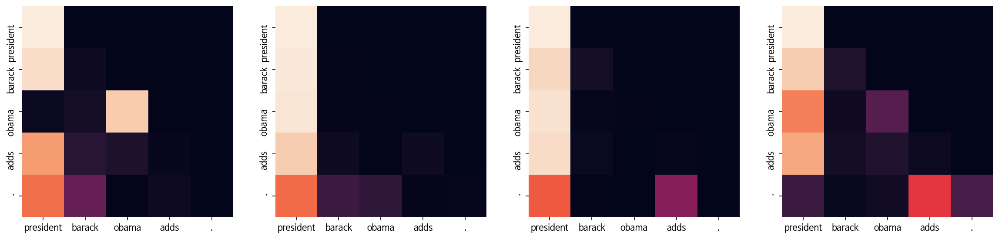

Decoder Src Layer 2


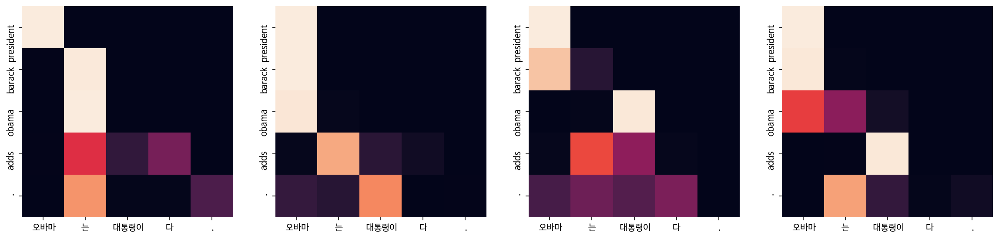

Input: 시민들은 도시 속에 산다.
Predicted translation: the population is estimated to see any into the current downstream .
Encoder Layer 1


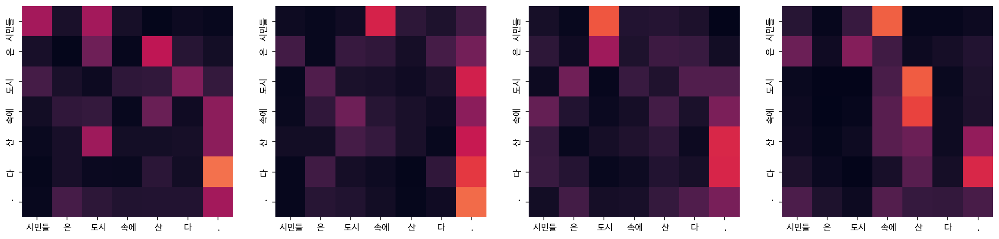

Encoder Layer 2


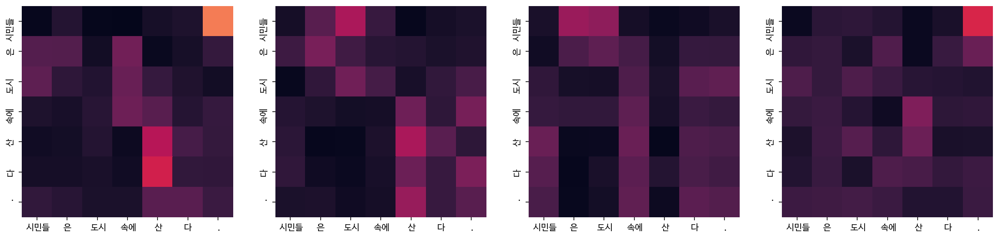

Decoder Self Layer 1


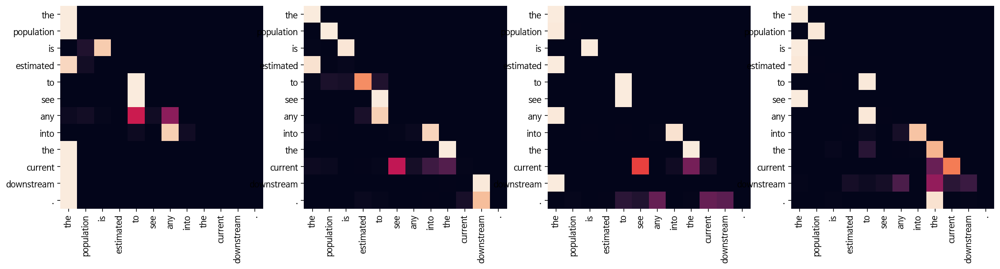

Decoder Src Layer 1


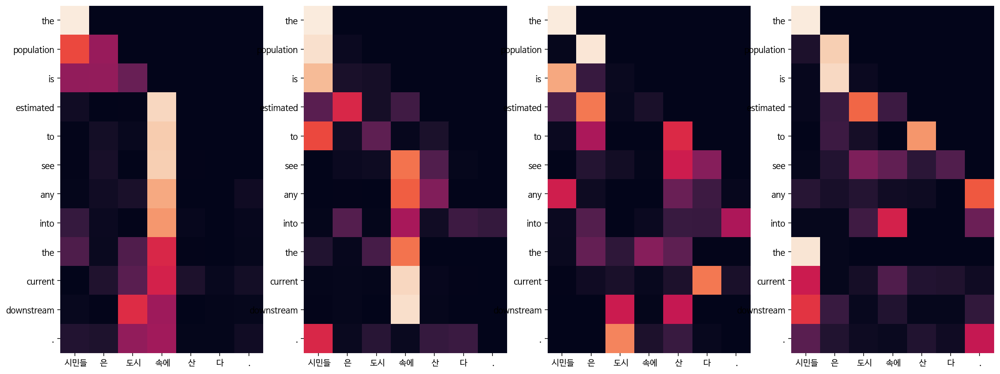

Decoder Self Layer 2


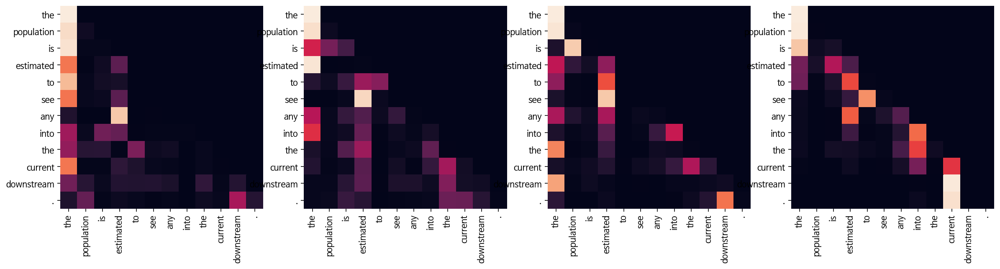

Decoder Src Layer 2


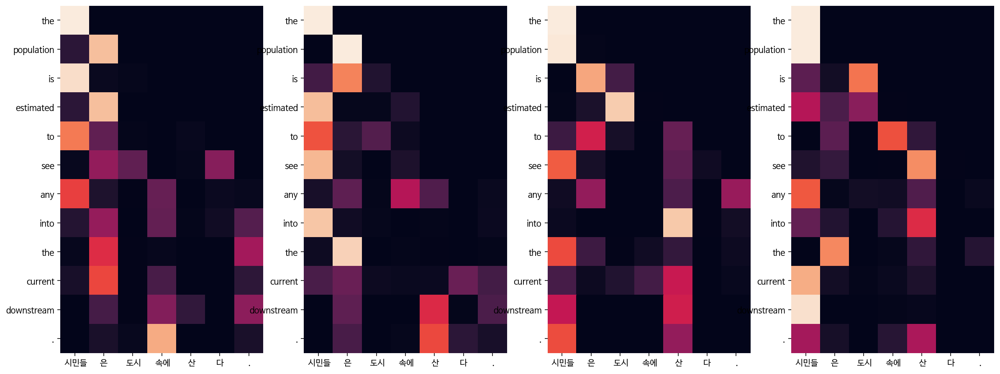

Input: 커피는 필요 없다.
Predicted translation: there need to stop .
Encoder Layer 1


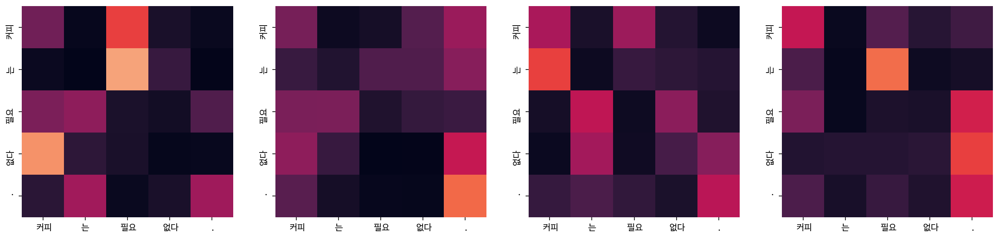

Encoder Layer 2


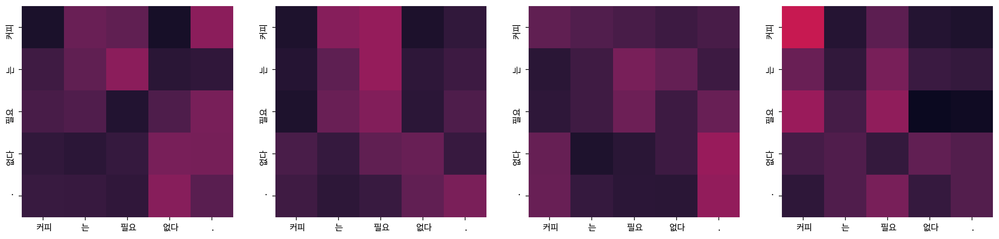

Decoder Self Layer 1


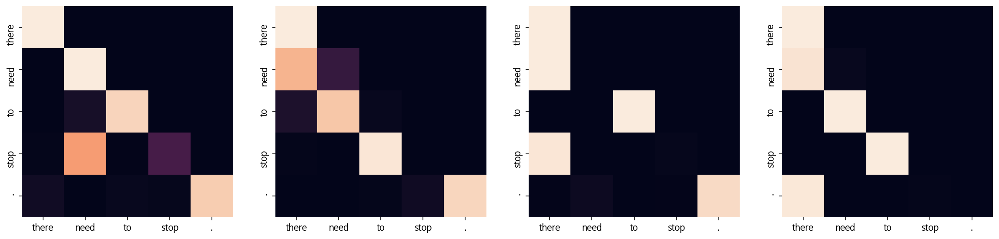

Decoder Src Layer 1


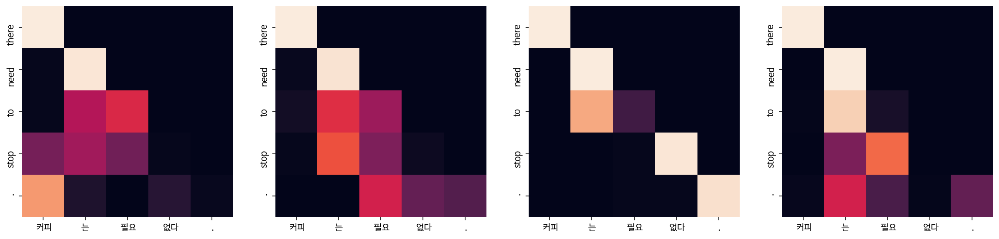

Decoder Self Layer 2


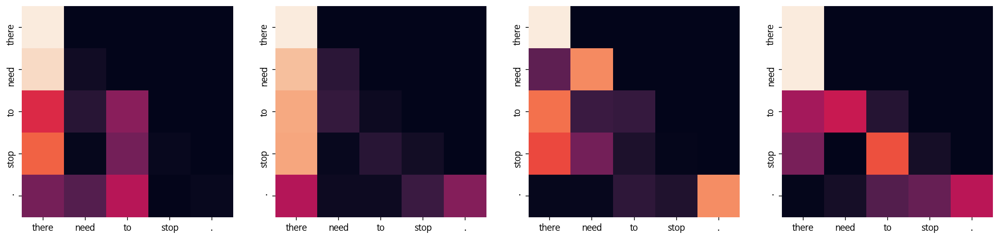

Decoder Src Layer 2


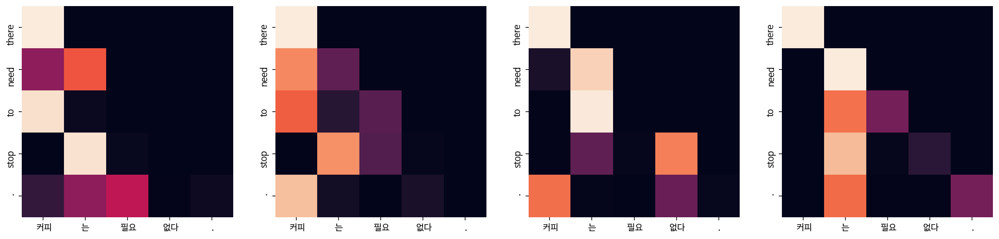

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: nine people were killed tuesday night .
Encoder Layer 1


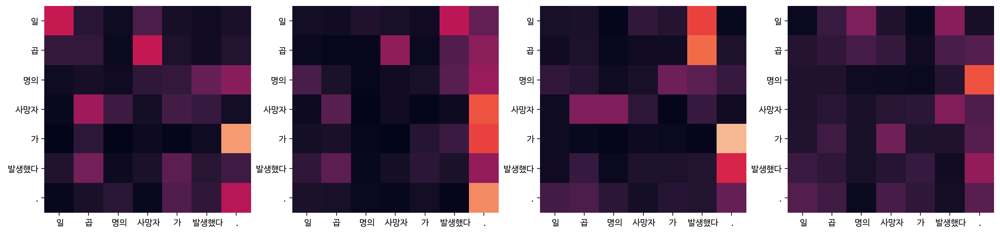

Encoder Layer 2


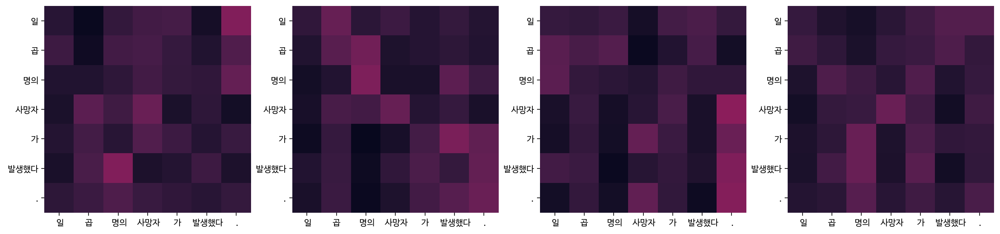

Decoder Self Layer 1


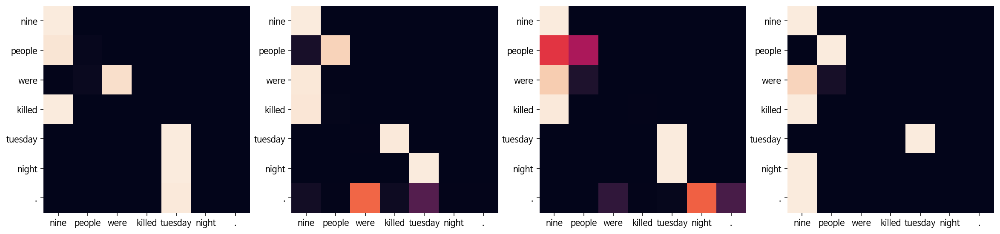

Decoder Src Layer 1


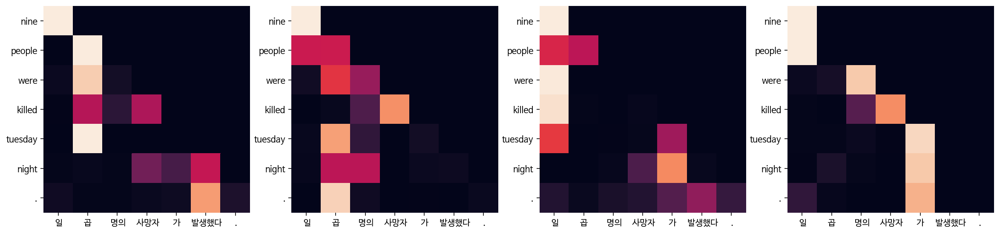

Decoder Self Layer 2


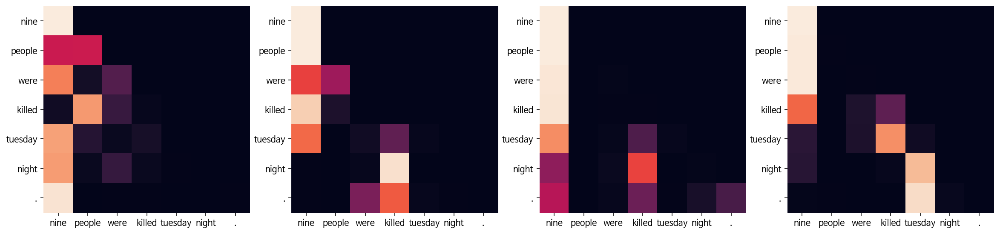

Decoder Src Layer 2


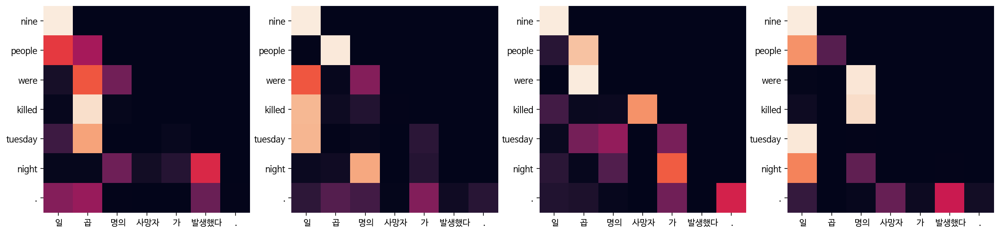

In [32]:
EPOCHS = 20
BATCH_SIZE = 8

for epoch in range(EPOCHS):
    total_loss = 0

    idx_list = list(range(0, enc_train.shape[0], BATCH_SIZE))
    random.shuffle(idx_list)
    t = tqdm(idx_list)

    for (batch, idx) in enumerate(t):
        batch_loss, enc_attns, dec_attns, dec_enc_attns = train_step(enc_train[idx:idx+BATCH_SIZE],
                                                                     dec_train[idx:idx+BATCH_SIZE],
                                                                     transformer2,
                                                                     optimizer)

        total_loss += batch_loss

        t.set_description_str('Epoch %2d' % (epoch + 1))
        t.set_postfix_str('Loss %.4f' % (total_loss.numpy() / (batch + 1)))
    
    # 매 Epoch 마다 제시된 예문에 대한 번역 생성
    for example in examples:
        translate(example, transformer2, ko_tokenizer, en_tokenizer, True)

**학습 3**

In [27]:
transformer3 = Transformer(
    n_layers=2,
    d_model=512,
    n_heads=8,
    d_ff=2048,
    src_vocab_size=SRC_VOCAB_SIZE,
    tgt_vocab_size=TGT_VOCAB_SIZE,
    pos_len=200,
    dropout=0.2,
    shared=True
)

In [30]:
EPOCHS = 100
BATCH_SIZE = 32

for epoch in range(EPOCHS):
    total_loss = 0

    idx_list = list(range(0, enc_train.shape[0], BATCH_SIZE))
    random.shuffle(idx_list)
    t = tqdm(idx_list)

    for (batch, idx) in enumerate(t):
        batch_loss, enc_attns, dec_attns, dec_enc_attns = train_step(enc_train[idx:idx+BATCH_SIZE],
                                                                     dec_train[idx:idx+BATCH_SIZE],
                                                                     transformer3,
                                                                     optimizer)

        total_loss += batch_loss

        t.set_description_str('Epoch %2d' % (epoch + 1))
        t.set_postfix_str('Loss %.4f' % (total_loss.numpy() / (batch + 1)))
    
    # 매 Epoch 마다 제시된 예문에 대한 번역 생성
    for example in examples:
        translate(example, transformer3, ko_tokenizer, en_tokenizer)

Epoch  1: 100%|██████████| 2127/2127 [04:50<00:00,  7.31it/s, Loss 4.8049]


Input: 오바마는 대통령이다.
Predicted translation: obama is ahead of obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: they are dy .
Input: 커피는 필요 없다.
Predicted translation: they are not going to take .


Epoch  2:   0%|          | 1/2127 [00:00<05:14,  6.76it/s, Loss 4.1956]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the death toll in the death toll in the death toll in the death toll in the death toll of the death toll .


Epoch  2: 100%|██████████| 2127/2127 [04:54<00:00,  7.23it/s, Loss 3.8970]


Input: 오바마는 대통령이다.
Predicted translation: obama is about the president .
Input: 시민들은 도시 속에 산다.
Predicted translation: they are often , the city is often .
Input: 커피는 필요 없다.
Predicted translation: nobody needs to be nobody .


Epoch  3:   0%|          | 1/2127 [00:00<05:11,  6.82it/s, Loss 2.4939]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: on friday , the interior ministry officials said .


Epoch  3: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 3.3607]


Input: 오바마는 대통령이다.
Predicted translation: obama is a president barack obama s president .
Input: 시민들은 도시 속에 산다.
Predicted translation: they are in the city of urban area .
Input: 커피는 필요 없다.
Predicted translation: no one need for the guys .


Epoch  4:   0%|          | 1/2127 [00:00<05:03,  7.00it/s, Loss 2.8165]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: the death toll is among the dead .


Epoch  4: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 2.7691]


Input: 오바마는 대통령이다.
Predicted translation: obama is headed by the obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: they cited a new town where snowy .
Input: 커피는 필요 없다.
Predicted translation: it needs to be done .


Epoch  5:   0%|          | 1/2127 [00:00<05:15,  6.74it/s, Loss 2.2253]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed .


Epoch  5: 100%|██████████| 2127/2127 [04:57<00:00,  7.16it/s, Loss 2.2325]


Input: 오바마는 대통령이다.
Predicted translation: obama s president , the president s office said .
Input: 시민들은 도시 속에 산다.
Predicted translation: the city s city is the city s th century .
Input: 커피는 필요 없다.
Predicted translation: and no need for .


Epoch  6:   0%|          | 1/2127 [00:00<05:02,  7.02it/s, Loss 1.6565]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven were among the dead , the sunday deaths .


Epoch  6: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 1.7648]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a dozen obama s president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the time is the year old .
Input: 커피는 필요 없다.
Predicted translation: there will be no coffee at any coffee .


Epoch  7:   0%|          | 1/2127 [00:00<05:10,  6.86it/s, Loss 1.0127]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven of the death toll is expected .


Epoch  7: 100%|██████████| 2127/2127 [04:54<00:00,  7.23it/s, Loss 1.3654]


Input: 오바마는 대통령이다.
Predicted translation: obama is a road .
Input: 시민들은 도시 속에 산다.
Predicted translation: in cities , the name of the city is a mountain .
Input: 커피는 필요 없다.
Predicted translation: it s a coffee never anything .


Epoch  8:   0%|          | 1/2127 [00:00<05:15,  6.75it/s, Loss 0.9743]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people have been killed , and others were killed , according to the iraqi journalists .


Epoch  8: 100%|██████████| 2127/2127 [04:54<00:00,  7.23it/s, Loss 1.0443]


Input: 오바마는 대통령이다.
Predicted translation: obama takes to the obama girl s home .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens made public through the local anti new iraqi david
Input: 커피는 필요 없다.
Predicted translation: any great coffee needs .


Epoch  9:   0%|          | 1/2127 [00:00<05:04,  6.98it/s, Loss 0.4129]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven deaths were among those on monday .


Epoch  9: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.8138]


Input: 오바마는 대통령이다.
Predicted translation: obama is kind of about to obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the name comes in commerciala cities .
Input: 커피는 필요 없다.
Predicted translation: no need need ever never ever .


Epoch 10:   0%|          | 1/2127 [00:00<04:55,  7.19it/s, Loss 0.2809]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed , but others were wounded .


Epoch 10: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.6565]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a double obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: they cited their names in the city .
Input: 커피는 필요 없다.
Predicted translation: it s necessary .


Epoch 11:   0%|          | 1/2127 [00:00<04:47,  7.39it/s, Loss 0.4955]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven others were killed .


Epoch 11: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.5545]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a dozen .
Input: 시민들은 도시 속에 산다.
Predicted translation: the new cited municipal zoo in cold cities .
Input: 커피는 필요 없다.
Predicted translation: it s needed coffee .


Epoch 12:   0%|          | 1/2127 [00:00<04:46,  7.42it/s, Loss 0.5308]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed .


Epoch 12: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.4864]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a double digit .
Input: 시민들은 도시 속에 산다.
Predicted translation: just publicly . cities in the city .
Input: 커피는 필요 없다.
Predicted translation: it s necessary .


Epoch 13:   0%|          | 1/2127 [00:00<04:58,  7.13it/s, Loss 0.1133]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other seven deaths were reported .


Epoch 13: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.4370]


Input: 오바마는 대통령이다.
Predicted translation: obama is actually an obama supporter .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly cited police big sources in the public .
Input: 커피는 필요 없다.
Predicted translation: the coffee needs .


Epoch 14:   0%|          | 1/2127 [00:00<05:04,  6.99it/s, Loss 0.2853]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people are dead , seven have died , seven have been wounded .


Epoch 14: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.4031]


Input: 오바마는 대통령이다.
Predicted translation: obama s illinois governor rod blagojevich .
Input: 시민들은 도시 속에 산다.
Predicted translation: sometimes american apparently anti terror .
Input: 커피는 필요 없다.
Predicted translation: coffee needs .


Epoch 15:   0%|          | 1/2127 [00:00<05:01,  7.05it/s, Loss 0.0924]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed .


Epoch 15: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.3761]


Input: 오바마는 대통령이다.
Predicted translation: obama s home was about to be .
Input: 시민들은 도시 속에 산다.
Predicted translation: in cities
Input: 커피는 필요 없다.
Predicted translation: we don t care for coffee .


Epoch 16:   0%|          | 1/2127 [00:00<05:01,  7.04it/s, Loss 0.2270]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed , but others were seriously injured .


Epoch 16: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.3530]


Input: 오바마는 대통령이다.
Predicted translation: obama is .
Input: 시민들은 도시 속에 산다.
Predicted translation: sometimess live in the mountain area .
Input: 커피는 필요 없다.
Predicted translation: coffee is a coffee .


Epoch 17:   0%|          | 1/2127 [00:00<04:48,  7.37it/s, Loss 0.1141]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed .


Epoch 17: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.3321]


Input: 오바마는 대통령이다.
Predicted translation: obama is kind of president in the obama house .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly toured the mountain is blood .
Input: 커피는 필요 없다.
Predicted translation: the club needs no coffee will start t change .


Epoch 18:   0%|          | 1/2127 [00:00<04:45,  7.45it/s, Loss 0.1292]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in sunday s sunday death .


Epoch 18: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.3161]


Input: 오바마는 대통령이다.
Predicted translation: obama is also home to a nearly two years .
Input: 시민들은 도시 속에 산다.
Predicted translation: sometimes american people live in the city .
Input: 커피는 필요 없다.
Predicted translation: it s necessarily does .


Epoch 19:   0%|          | 1/2127 [00:00<04:52,  7.26it/s, Loss 0.2242]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other deaths were killed in the sunday afternoon day .


Epoch 19: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.3022]


Input: 오바마는 대통령이다.
Predicted translation: obama is also excited .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly thousands of called it their mountains .
Input: 커피는 필요 없다.
Predicted translation: never necessary .


Epoch 20:   0%|          | 1/2127 [00:00<05:08,  6.89it/s, Loss 0.2108]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven .


Epoch 20: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2932]


Input: 오바마는 대통령이다.
Predicted translation: obama s north is also a way to president .
Input: 시민들은 도시 속에 산다.
Predicted translation: in one cities , named police .
Input: 커피는 필요 없다.
Predicted translation: we need need heavy stores .


Epoch 21:   0%|          | 1/2127 [00:00<04:50,  7.33it/s, Loss 0.2396]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed .


Epoch 21: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2857]


Input: 오바마는 대통령이다.
Predicted translation: obama is also credited with a state .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly do what s they do .
Input: 커피는 필요 없다.
Predicted translation: coffee needs .


Epoch 22:   0%|          | 1/2127 [00:00<04:51,  7.30it/s, Loss 0.1069]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were wounded .


Epoch 22: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2788]


Input: 오바마는 대통령이다.
Predicted translation: obama is a actual grand president .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly ranks citizens shin in the hunterd half a half of the name of the citizens .
Input: 커피는 필요 없다.
Predicted translation: we need cards .


Epoch 23:   0%|          | 1/2127 [00:00<04:44,  7.46it/s, Loss 0.3032]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed tuesday and three others were injured .


Epoch 23: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2703]


Input: 오바마는 대통령이다.
Predicted translation: obama s president is also a s story .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly police raise the mountain .
Input: 커피는 필요 없다.
Predicted translation: the church doesn t need cards to start .


Epoch 24:   0%|          | 1/2127 [00:00<05:06,  6.94it/s, Loss 0.0616]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed , and others were wounded .


Epoch 24: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2631]


Input: 오바마는 대통령이다.
Predicted translation: obama s president is also a
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly
Input: 커피는 필요 없다.
Predicted translation: we need no coffee .


Epoch 25:   0%|          | 1/2127 [00:00<04:42,  7.54it/s, Loss 0.0855]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in the sunday night .


Epoch 25: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2575]


Input: 오바마는 대통령이다.
Predicted translation: obama s inauguration could , obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: in one named city hall .
Input: 커피는 필요 없다.
Predicted translation: the coffee will don t necessarily .


Epoch 26:   0%|          | 1/2127 [00:00<05:00,  7.07it/s, Loss 0.1168]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and are wounded .


Epoch 26: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.2508]


Input: 오바마는 대통령이다.
Predicted translation: obama s president ,
Input: 시민들은 도시 속에 산다.
Predicted translation: some stay in the city .
Input: 커피는 필요 없다.
Predicted translation: no coffee will don t care .


Epoch 27:   0%|          | 1/2127 [00:00<04:58,  7.12it/s, Loss 0.0712]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and others were wounded .


Epoch 27: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2437]


Input: 오바마는 대통령이다.
Predicted translation: obama s queen son ,
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly police helped search for the public .
Input: 커피는 필요 없다.
Predicted translation: coffee will take a coffee coffee .


Epoch 28:   0%|          | 1/2127 [00:00<04:46,  7.42it/s, Loss 0.2700]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and most have been injured .


Epoch 28: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.2358]


Input: 오바마는 대통령이다.
Predicted translation: obama s collection would like the president is um .
Input: 시민들은 도시 속에 산다.
Predicted translation: some americans would public in growing f common cities .
Input: 커피는 필요 없다.
Predicted translation: coffee will take on coffee .


Epoch 29:   0%|          | 1/2127 [00:00<04:47,  7.39it/s, Loss 0.0963]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people are dead , seven have been wounded .


Epoch 29: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2307]


Input: 오바마는 대통령이다.
Predicted translation: obama s husband , especially in the obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: some people have been myanmar s name .
Input: 커피는 필요 없다.
Predicted translation: no coffee does no coffee s coffee .


Epoch 30:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 0.1202]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed .


Epoch 30: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2238]


Input: 오바마는 대통령이다.
Predicted translation: obama is also actually a in english .
Input: 시민들은 도시 속에 산다.
Predicted translation: some people will live in the cities .
Input: 커피는 필요 없다.
Predicted translation: coffee will take down money .


Epoch 31:   0%|          | 1/2127 [00:00<05:08,  6.89it/s, Loss 0.0674]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were wounded sunday .


Epoch 31: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2208]


Input: 오바마는 대통령이다.
Predicted translation: obama s co president .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are based on anti visibility .
Input: 커피는 필요 없다.
Predicted translation: coffee will don t take coffee .


Epoch 32:   0%|          | 1/2127 [00:00<05:00,  7.08it/s, Loss 0.1410]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and others were wounded sunday .


Epoch 32: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.2159]


Input: 오바마는 대통령이다.
Predicted translation: obama is also credit .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens aren t live .
Input: 커피는 필요 없다.
Predicted translation: even need sexual coffee .


Epoch 33:   0%|          | 1/2127 [00:00<04:46,  7.42it/s, Loss 0.0937]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were wounded , according to the death toll .


Epoch 33: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.2127]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a dozen obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: in publicity is named .
Input: 커피는 필요 없다.
Predicted translation: practice no coffee at their coffee .


Epoch 34:   0%|          | 1/2127 [00:00<05:00,  7.08it/s, Loss 0.1950]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sevenother were wounded seven in the sunday death toll .


Epoch 34: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.2098]


Input: 오바마는 대통령이다.
Predicted translation: obama is kind of in russia .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can young people live in the city .
Input: 커피는 필요 없다.
Predicted translation: even need care .


Epoch 35:   0%|          | 1/2127 [00:00<04:59,  7.10it/s, Loss 0.1617]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in the attack sunday day on iraqi and wounded .


Epoch 35: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.2076]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a dozen .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are thousands of ed urban .
Input: 커피는 필요 없다.
Predicted translation: no red needs .


Epoch 36:   0%|          | 1/2127 [00:00<04:49,  7.34it/s, Loss 0.0605]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been wounded .


Epoch 36: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.2057]


Input: 오바마는 대통령이다.
Predicted translation: obama s office would be .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are citizens over the years .
Input: 커피는 필요 없다.
Predicted translation: never needed .


Epoch 37:   0%|          | 1/2127 [00:00<04:45,  7.44it/s, Loss 0.1666]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were wounded in the sunday death toll .


Epoch 37: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.2019]


Input: 오바마는 대통령이다.
Predicted translation: obama sd presidential palace will bed in sunday .
Input: 시민들은 도시 속에 산다.
Predicted translation: people in the city s peloponnese is about three in a half century
Input: 커피는 필요 없다.
Predicted translation: there s a never starting practice .


Epoch 38:   0%|          | 1/2127 [00:00<04:53,  7.24it/s, Loss 0.1331]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven .


Epoch 38: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.2006]


Input: 오바마는 대통령이다.
Predicted translation: obama is also decided to increase the obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: in the city s , city is blooded .
Input: 커피는 필요 없다.
Predicted translation: no coffee needs .


Epoch 39:   0%|          | 1/2127 [00:00<04:46,  7.41it/s, Loss 0.1601]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in the sunday violence .


Epoch 39: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1981]


Input: 오바마는 대통령이다.
Predicted translation: obama is also eager to see the obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: in the name city of public resources .
Input: 커피는 필요 없다.
Predicted translation: never need manager .


Epoch 40:   0%|          | 1/2127 [00:00<05:07,  6.90it/s, Loss 0.1136]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seventeen people were killed in the riot .


Epoch 40: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1942]


Input: 오바마는 대통령이다.
Predicted translation: obama is also eager to fill the obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: public cities people over the year .
Input: 커피는 필요 없다.
Predicted translation: no red needs don t care manager .


Epoch 41:   0%|          | 1/2127 [00:00<05:00,  7.08it/s, Loss 0.0630]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were reported seven have been seriously injured .


Epoch 41: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1914]


Input: 오바마는 대통령이다.
Predicted translation: obama is also credited with word .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicity is known for the city .
Input: 커피는 필요 없다.
Predicted translation: no coffee will don t necessarily .


Epoch 42:   0%|          | 1/2127 [00:00<04:40,  7.59it/s, Loss 0.1109]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been wounded .


Epoch 42: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.1895]


Input: 오바마는 대통령이다.
Predicted translation: obama may have been either way .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens nationwide tens of thousands of police in the capital .
Input: 커피는 필요 없다.
Predicted translation: no need need coffee .


Epoch 43:   0%|          | 1/2127 [00:00<05:04,  6.97it/s, Loss 0.0508]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed .


Epoch 43: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1891]


Input: 오바마는 대통령이다.
Predicted translation: obama picked up .
Input: 시민들은 도시 속에 산다.
Predicted translation: public people can live in the city .
Input: 커피는 필요 없다.
Predicted translation: even the coffee coffee .


Epoch 44:   0%|          | 1/2127 [00:00<04:56,  7.16it/s, Loss 0.0438]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed early .


Epoch 44: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1877]


Input: 오바마는 대통령이다.
Predicted translation: obama s choice would be also president obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can t bas on their cities .
Input: 커피는 필요 없다.
Predicted translation: no practice need at some coffee .


Epoch 45:   0%|          | 1/2127 [00:00<05:04,  6.99it/s, Loss 0.1565]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were wounded , seven have been become wounded .


Epoch 45: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1849]


Input: 오바마는 대통령이다.
Predicted translation: obama is about million .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can t bloody pets .
Input: 커피는 필요 없다.
Predicted translation: never need sexualchi or service .


Epoch 46:   0%|          | 1/2127 [00:00<04:54,  7.23it/s, Loss 0.0257]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: sevenother were among the dead .


Epoch 46: 100%|██████████| 2127/2127 [04:54<00:00,  7.21it/s, Loss 0.1825]


Input: 오바마는 대통령이다.
Predicted translation: obama s discovered an obama state .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly police carries called public to a mountain public pace .
Input: 커피는 필요 없다.
Predicted translation: no need need or need exactly .


Epoch 47:   0%|          | 1/2127 [00:00<04:43,  7.49it/s, Loss 0.2090]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been wounded .


Epoch 47: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1801]


Input: 오바마는 대통령이다.
Predicted translation: obama is about president barack obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens american urban areas .
Input: 커피는 필요 없다.
Predicted translation: any practice necessary .


Epoch 48:   0%|          | 1/2127 [00:00<04:51,  7.30it/s, Loss 0.1229]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other persons were killed , seven have been, leaving .


Epoch 48: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1787]


Input: 오바마는 대통령이다.
Predicted translation: he s thinking obama
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly do it well .
Input: 커피는 필요 없다.
Predicted translation: no need need at any coffee .


Epoch 49:   0%|          | 1/2127 [00:00<04:59,  7.10it/s, Loss 0.1099]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed seven have been injured .


Epoch 49: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1775]


Input: 오바마는 대통령이다.
Predicted translation: obama s immigrants , d north america
Input: 시민들은 도시 속에 산다.
Predicted translation: public legislation is acid cited in the pour of cited mountain cities .
Input: 커피는 필요 없다.
Predicted translation: need need need .


Epoch 50:   0%|          | 1/2127 [00:00<05:16,  6.71it/s, Loss 0.0287]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other health deaths were reported wednesday .


Epoch 50: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1758]


Input: 오바마는 대통령이다.
Predicted translation: he s kind of wealth .
Input: 시민들은 도시 속에 산다.
Predicted translation: public democracy is stampeded in the neighborhood .
Input: 커피는 필요 없다.
Predicted translation: no coffee will take some coffee .


Epoch 51:   0%|          | 1/2127 [00:00<04:48,  7.38it/s, Loss 0.0647]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other civilians were among those only seven with seven have been rescuers .


Epoch 51: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1731]


Input: 오바마는 대통령이다.
Predicted translation: obama is also a matter of leaving .
Input: 시민들은 도시 속에 산다.
Predicted translation: democracy is easily visible at the public .
Input: 커피는 필요 없다.
Predicted translation: no coffee will never take some coffee .


Epoch 52:   0%|          | 1/2127 [00:00<05:04,  6.98it/s, Loss 0.1033]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed and seven were wounded .


Epoch 52: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1717]


Input: 오바마는 대통령이다.
Predicted translation: obama picked up a black story .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens hope the city would over anti urban cities .
Input: 커피는 필요 없다.
Predicted translation: no coffee isn t necessary .


Epoch 53:   0%|          | 1/2127 [00:00<05:06,  6.94it/s, Loss 0.1181]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven turned seven numbers are seven with seven serious seventh .


Epoch 53: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1719]


Input: 오바마는 대통령이다.
Predicted translation: obama picks a different obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can bank hotels in the city .
Input: 커피는 필요 없다.
Predicted translation: never need manager .


Epoch 54:   0%|          | 1/2127 [00:00<05:04,  6.99it/s, Loss 0.0437]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were reported saturday .


Epoch 54: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1676]


Input: 오바마는 대통령이다.
Predicted translation: obama picks a different obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the name is the public in cities .
Input: 커피는 필요 없다.
Predicted translation: never need real coffee .


Epoch 55:   0%|          | 1/2127 [00:00<05:05,  6.95it/s, Loss 0.1160]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were seven dead seven others were seriously injured .


Epoch 55: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1678]


Input: 오바마는 대통령이다.
Predicted translation: he s also black .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are already over the year .
Input: 커피는 필요 없다.
Predicted translation: no coffee will ever be a coffee .


Epoch 56:   0%|          | 1/2127 [00:00<04:56,  7.17it/s, Loss 0.0496]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were reported seven with the death toll wednesday .


Epoch 56: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1652]


Input: 오바마는 대통령이다.
Predicted translation: obama sd presidential is also credit .
Input: 시민들은 도시 속에 산다.
Predicted translation: people in the city are benchmark .
Input: 커피는 필요 없다.
Predicted translation: never need real coffee .


Epoch 57:   0%|          | 1/2127 [00:00<04:51,  7.30it/s, Loss 0.1195]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead .


Epoch 57: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1646]


Input: 오바마는 대통령이다.
Predicted translation: obama condemns the obamas .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens begin urban runners in the gangs of urban fashion .
Input: 커피는 필요 없다.
Predicted translation: no coffee dur coco admits as coffee .


Epoch 58:   0%|          | 1/2127 [00:00<05:08,  6.89it/s, Loss 0.0986]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were reported saturday .


Epoch 58: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1626]


Input: 오바마는 대통령이다.
Predicted translation: he s eyes or obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are among the way .
Input: 커피는 필요 없다.
Predicted translation: no coffee doesn t .


Epoch 59:   0%|          | 1/2127 [00:00<05:15,  6.74it/s, Loss 0.1485]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven were seven victims , seven have died , four seven have are seven seriously reported .


Epoch 59: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1619]


Input: 오바마는 대통령이다.
Predicted translation: obama s successor ,
Input: 시민들은 도시 속에 산다.
Predicted translation: they can water .
Input: 커피는 필요 없다.
Predicted translation: as the coffee or down on seattle


Epoch 60:   0%|          | 1/2127 [00:00<04:59,  7.10it/s, Loss 0.0409]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead .


Epoch 60: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1604]


Input: 오바마는 대통령이다.
Predicted translation: obama picks a virginia citizen .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are hung up ourselves .
Input: 커피는 필요 없다.
Predicted translation: any coffee need


Epoch 61:   0%|          | 1/2127 [00:00<04:46,  7.41it/s, Loss 0.1692]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: about seven deaths were reported .


Epoch 61: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1583]


Input: 오바마는 대통령이다.
Predicted translation: obama sdy , with a obama president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the citizens of the mountain bands of street fits .
Input: 커피는 필요 없다.
Predicted translation: need need need those or home .


Epoch 62:   0%|          | 1/2127 [00:00<04:51,  7.29it/s, Loss 0.0744]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: about seven victims were among eight others .


Epoch 62: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1592]


Input: 오바마는 대통령이다.
Predicted translation: obama is about a dozen .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can police be older .
Input: 커피는 필요 없다.
Predicted translation: never needed .


Epoch 63:   0%|          | 1/2127 [00:00<04:57,  7.13it/s, Loss 0.1498]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were among the dead .


Epoch 63: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1555]


Input: 오바마는 대통령이다.
Predicted translation: obama should fill the experience .
Input: 시민들은 도시 속에 산다.
Predicted translation: the public sound on the mountain cold war .
Input: 커피는 필요 없다.
Predicted translation: never needs .


Epoch 64:   0%|          | 1/2127 [00:00<05:03,  7.00it/s, Loss 0.1265]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were seriously injured .


Epoch 64: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1566]


Input: 오바마는 대통령이다.
Predicted translation: obama indicates obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can police be able to live in the streets .
Input: 커피는 필요 없다.
Predicted translation: no coffee has a fabulous coffee .


Epoch 65:   0%|          | 1/2127 [00:00<04:54,  7.22it/s, Loss 0.0652]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were injured .


Epoch 65: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1552]


Input: 오바마는 대통령이다.
Predicted translation: he s rival barack obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: public legislation is also cool in the mountain .
Input: 커피는 필요 없다.
Predicted translation: never mind received .


Epoch 66:   0%|          | 1/2127 [00:00<05:00,  7.06it/s, Loss 0.1267]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed , , are seriously injured .


Epoch 66: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1528]


Input: 오바마는 대통령이다.
Predicted translation: obama sdy  ⁇ 
Input: 시민들은 도시 속에 산다.
Predicted translation: they re simple , soldiers in the mayor of the city .
Input: 커피는 필요 없다.
Predicted translation: never needed .


Epoch 67:   0%|          | 1/2127 [00:00<05:16,  6.73it/s, Loss 0.0834]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been injured , the health ministry said on wednesday .


Epoch 67: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1520]


Input: 오바마는 대통령이다.
Predicted translation: obama sd president .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can t over the years .
Input: 커피는 필요 없다.
Predicted translation: never needed .


Epoch 68:   0%|          | 1/2127 [00:00<04:53,  7.25it/s, Loss 0.0403]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were reported saturday when they have been identified , the health ministry figured .


Epoch 68: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1510]


Input: 오바마는 대통령이다.
Predicted translation: obama s stump  ⁇ 
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can t over the mountain in the city .
Input: 커피는 필요 없다.
Predicted translation: never mind mind .


Epoch 69:   0%|          | 1/2127 [00:00<04:59,  7.09it/s, Loss 0.0879]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been wounded , two and three others were wounded in the seven others .


Epoch 69: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1505]


Input: 오바마는 대통령이다.
Predicted translation: obama may also be heard with a pleas .
Input: 시민들은 도시 속에 산다.
Predicted translation: they get away to the inner cities .
Input: 커피는 필요 없다.
Predicted translation: and there s a coffee south .


Epoch 70:   0%|          | 1/2127 [00:00<05:17,  6.70it/s, Loss 0.1317]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been identified , the most affected are not before figures , the seventh marines were surpassing , about one complete well since the most serious crisis .


Epoch 70: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1497]


Input: 오바마는 대통령이다.
Predicted translation: obama s wins since .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are public to police .
Input: 커피는 필요 없다.
Predicted translation: no coffee needs .


Epoch 71:   0%|          | 1/2127 [00:00<04:51,  7.30it/s, Loss 0.0254]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been injured , theround , sunday , according to the figures .


Epoch 71: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1485]


Input: 오바마는 대통령이다.
Predicted translation: obama s pick to barack obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: public legislation is often opposed in the black game .
Input: 커피는 필요 없다.
Predicted translation: no coffee needs .


Epoch 72:   0%|          | 1/2127 [00:00<04:56,  7.18it/s, Loss 0.0291]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in the wave of diseases .


Epoch 72: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1478]


Input: 오바마는 대통령이다.
Predicted translation: obama is also brain .
Input: 시민들은 도시 속에 산다.
Predicted translation: public cities would bloody take shape .
Input: 커피는 필요 없다.
Predicted translation: no coffee needs .


Epoch 73:   0%|          | 1/2127 [00:00<05:03,  7.01it/s, Loss 0.1261]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed in the violence .


Epoch 73: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1479]


Input: 오바마는 대통령이다.
Predicted translation: obama s pick to president ats .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are development of the national people .
Input: 커피는 필요 없다.
Predicted translation: no coffee will let coffee shop .


Epoch 74:   0%|          | 1/2127 [00:00<05:05,  6.96it/s, Loss 0.0212]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other civilians were reported on friday .


Epoch 74: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1458]


Input: 오바마는 대통령이다.
Predicted translation: obama s roadside bomb .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly tours in the mountain , arrived and estimate how residents can golf .
Input: 커피는 필요 없다.
Predicted translation: no coffee dur coffee , no coffee shop .


Epoch 75:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 0.0390]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed wednesday .


Epoch 75: 100%|██████████| 2127/2127 [04:55<00:00,  7.21it/s, Loss 0.1463]


Input: 오바마는 대통령이다.
Predicted translation: he s also kind of , obama s deputy president .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly police estimates in the densely populated province .
Input: 커피는 필요 없다.
Predicted translation: never need till . . . .


Epoch 76:   0%|          | 1/2127 [00:00<04:59,  7.10it/s, Loss 0.0336]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed wednesday .


Epoch 76: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1442]


Input: 오바마는 대통령이다.
Predicted translation: he s destination for obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly carries called roads .
Input: 커피는 필요 없다.
Predicted translation: even need real expense .


Epoch 77:   0%|          | 1/2127 [00:00<04:58,  7.13it/s, Loss 0.0847]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed tuesday .


Epoch 77: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1446]


Input: 오바마는 대통령이다.
Predicted translation: he s actually barack obama s host .
Input: 시민들은 도시 속에 산다.
Predicted translation: scientists are expected to commit marines in the clash .
Input: 커피는 필요 없다.
Predicted translation: no need or need welcome money .


Epoch 78:   0%|          | 1/2127 [00:00<04:47,  7.40it/s, Loss 0.0794]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed seven others were reported wednesday .


Epoch 78: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1433]


Input: 오바마는 대통령이다.
Predicted translation: obama may seems to be about president .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly affected mountain tens of thousands in the of hills  ⁇ 
Input: 커피는 필요 없다.
Predicted translation: no coffee dur coffee , he needed as coffee .


Epoch 79:   0%|          | 1/2127 [00:00<04:52,  7.27it/s, Loss 0.0396]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed sunday .


Epoch 79: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1435]


Input: 오바마는 대통령이다.
Predicted translation: obama picks up clinton .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens in the city of highlandsa .
Input: 커피는 필요 없다.
Predicted translation: and there s a little coffee clip .


Epoch 80:   0%|          | 1/2127 [00:00<05:03,  7.01it/s, Loss 0.0968]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were among the dead , the violence reported wednesday .


Epoch 80: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1431]


Input: 오바마는 대통령이다.
Predicted translation: obama is also mentioned .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens are unone is based in the cities .
Input: 커피는 필요 없다.
Predicted translation: no coffee


Epoch 81:   0%|          | 1/2127 [00:00<05:07,  6.92it/s, Loss 0.0447]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead , seven .


Epoch 81: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1409]


Input: 오바마는 대통령이다.
Predicted translation: obama may plant a tie .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens in the officers of god live .
Input: 커피는 필요 없다.
Predicted translation: no need love and coffee .


Epoch 82:   0%|          | 1/2127 [00:00<05:03,  6.99it/s, Loss 0.1437]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed and injured , the number dead wednesday were wounded .


Epoch 82: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1410]


Input: 오바마는 대통령이다.
Predicted translation: obama sd president .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can .
Input: 커피는 필요 없다.
Predicted translation: never need a coffee .


Epoch 83:   0%|          | 1/2127 [00:00<04:59,  7.11it/s, Loss 0.1325]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead .


Epoch 83: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1391]


Input: 오바마는 대통령이다.
Predicted translation: obama sdy .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can .
Input: 커피는 필요 없다.
Predicted translation: and there s a real time for coffee .


Epoch 84:   0%|          | 1/2127 [00:00<04:48,  7.36it/s, Loss 0.0392]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed saturday , according to the indian health ministry .


Epoch 84: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1394]


Input: 오바마는 대통령이다.
Predicted translation: obama picked up a roadside
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens can .
Input: 커피는 필요 없다.
Predicted translation: no coffee will start .


Epoch 85:   0%|          | 1/2127 [00:00<04:58,  7.11it/s, Loss 0.1307]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were destroyed , he said .


Epoch 85: 100%|██████████| 2127/2127 [04:54<00:00,  7.22it/s, Loss 0.1392]


Input: 오바마는 대통령이다.
Predicted translation: he s got to s .
Input: 시민들은 도시 속에 산다.
Predicted translation: public office is known for the amusement .
Input: 커피는 필요 없다.
Predicted translation: no change what it does .


Epoch 86:   0%|          | 1/2127 [00:00<05:10,  6.86it/s, Loss 0.0517]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been hurt , the violence since they re figured .


Epoch 86: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1376]


Input: 오바마는 대통령이다.
Predicted translation: obama salso president will weigh .
Input: 시민들은 도시 속에 산다.
Predicted translation: publicly cited the public sself .
Input: 커피는 필요 없다.
Predicted translation: and never need to never practical outcome .


Epoch 87:   0%|          | 1/2127 [00:00<04:43,  7.49it/s, Loss 0.0380]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead .


Epoch 87: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1375]


Input: 오바마는 대통령이다.
Predicted translation: obama indicates obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens aren t based on .
Input: 커피는 필요 없다.
Predicted translation: never need sexual coffee .


Epoch 88:   0%|          | 1/2127 [00:00<04:44,  7.46it/s, Loss 0.1372]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were among the dead .


Epoch 88: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1369]


Input: 오바마는 대통령이다.
Predicted translation: he s tree with a obama supporter .
Input: 시민들은 도시 속에 산다.
Predicted translation: the name is one of the rivers .
Input: 커피는 필요 없다.
Predicted translation: no coffee


Epoch 89:   0%|          | 1/2127 [00:00<04:56,  7.18it/s, Loss 0.1342]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven have been hurt , according to the red cross .


Epoch 89: 100%|██████████| 2127/2127 [04:55<00:00,  7.20it/s, Loss 0.1358]


Input: 오바마는 대통령이다.
Predicted translation: obama coached same obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the name cited right street
Input: 커피는 필요 없다.
Predicted translation: never take necessary .


Epoch 90:   0%|          | 1/2127 [00:00<05:05,  6.96it/s, Loss 0.1281]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were wounded , he said .


Epoch 90: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1376]


Input: 오바마는 대통령이다.
Predicted translation: obama sd president .
Input: 시민들은 도시 속에 산다.
Predicted translation: the democracy is it based on repairs .
Input: 커피는 필요 없다.
Predicted translation: never no coffee shop .


Epoch 91:   0%|          | 1/2127 [00:00<04:45,  7.46it/s, Loss 0.0175]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were wounded , according to the associated press .


Epoch 91: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1359]


Input: 오바마는 대통령이다.
Predicted translation: it s also president obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the public names are searching .
Input: 커피는 필요 없다.
Predicted translation: and there s no need at no coffee .


Epoch 92:   0%|          | 1/2127 [00:00<05:12,  6.81it/s, Loss 0.1187]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed , according to the death toll from seven , licensed to , sunday .


Epoch 92: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1325]


Input: 오바마는 대통령이다.
Predicted translation: it s a secret service .
Input: 시민들은 도시 속에 산다.
Predicted translation: citizens would not lively and chant one , villagers .
Input: 커피는 필요 없다.
Predicted translation: no coffee


Epoch 93:   0%|          | 1/2127 [00:00<04:45,  7.45it/s, Loss 0.1209]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were among the dead seven others .


Epoch 93: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1324]


Input: 오바마는 대통령이다.
Predicted translation: obama s wish for the obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the public urban fence is least in the public .
Input: 커피는 필요 없다.
Predicted translation: never need coffee .


Epoch 94:   0%|          | 1/2127 [00:00<04:52,  7.26it/s, Loss 0.0386]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed sevenother , seven with seven serious tornadoes .


Epoch 94: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1321]


Input: 오바마는 대통령이다.
Predicted translation: obama s queen elizabeth will fill the course .
Input: 시민들은 도시 속에 산다.
Predicted translation: the citizens will take up to police .
Input: 커피는 필요 없다.
Predicted translation: never need coffee .


Epoch 95:   0%|          | 1/2127 [00:00<05:12,  6.80it/s, Loss 0.0821]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other victims are figures , but were killed seven .


Epoch 95: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.1333]


Input: 오바마는 대통령이다.
Predicted translation: it s a tough group to obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the name is residents in the champions new population .
Input: 커피는 필요 없다.
Predicted translation: no coffee will watch coffee , coffee


Epoch 96:   0%|          | 1/2127 [00:00<05:05,  6.95it/s, Loss 0.0189]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were wounded , but are reported dead , the violent wounded seven others , seven have been died , said cnn .


Epoch 96: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.1315]


Input: 오바마는 대통령이다.
Predicted translation: he s mailed .
Input: 시민들은 도시 속에 산다.
Predicted translation: the prince city is scrambling to public to block it .
Input: 커피는 필요 없다.
Predicted translation: no red need welcomed service .


Epoch 97:   0%|          | 1/2127 [00:00<05:11,  6.83it/s, Loss 0.0579]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were injured , but wounded seven others on wednesday and seven have been injured , according to the special circumstances .


Epoch 97: 100%|██████████| 2127/2127 [04:55<00:00,  7.19it/s, Loss 0.1307]


Input: 오바마는 대통령이다.
Predicted translation: he s filled with president barack obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: the public address is wealthy .
Input: 커피는 필요 없다.
Predicted translation: no coffee we don t really coffee .


Epoch 98:   0%|          | 1/2127 [00:00<05:08,  6.88it/s, Loss 0.0296]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed , according to the health ministry .


Epoch 98: 100%|██████████| 2127/2127 [04:56<00:00,  7.18it/s, Loss 0.1309]


Input: 오바마는 대통령이다.
Predicted translation: it s obama seats .
Input: 시민들은 도시 속에 산다.
Predicted translation: the citizens are overweight in cool snow .
Input: 커피는 필요 없다.
Predicted translation: no coffee needs .


Epoch 99:   0%|          | 1/2127 [00:00<04:49,  7.35it/s, Loss 0.1003]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were killed seven others were injured , according to the associated press .


Epoch 99: 100%|██████████| 2127/2127 [04:56<00:00,  7.16it/s, Loss 0.1305]


Input: 오바마는 대통령이다.
Predicted translation: obama indicates obama .
Input: 시민들은 도시 속에 산다.
Predicted translation: they will remember the what american citizens make in the babies five mountain conditions .
Input: 커피는 필요 없다.
Predicted translation: no coffee


Epoch 100:   0%|          | 1/2127 [00:00<04:48,  7.38it/s, Loss 0.1044]

Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven other people were killed and were wounded in the violence .


Epoch 100: 100%|██████████| 2127/2127 [04:59<00:00,  7.11it/s, Loss 0.1303]


Input: 오바마는 대통령이다.
Predicted translation: obama can fill the posts .
Input: 시민들은 도시 속에 산다.
Predicted translation: they re police right .
Input: 커피는 필요 없다.
Predicted translation: no never needed .
Input: 일곱 명의 사망자가 발생했다.
Predicted translation: seven people were among those injured , eight people .


**학습 결과**

1. Loss 0.2875
2. Loss 1.0059
3. Loss 0.1303

- 레이어를 증가시켰더니 loss도 증가하고, 예측된 것도 레이어가 더 작은 것이 나아보인다.
- epoch를 20에서 100으로 늘렸더니 loss는 줄어들었지만, 예측된 것은 크게 차이점을 느끼진 못했다.
- `커피는 필요 없다.`라는 문장에서 `coffee`, `need`, 부정적임을 나타내는 `never`, `no`까지 나오는 것으로 보아 기대했던 예측문장과는 조금 차이는 보이지만, 그래도 핵심단어는 얼추 들어간 것으로 보인다.

<br><br><br><br>

# 회고
- 생각보다 학습시간이 너무 오래 걸렸고, gpu 에러가 많이 나서 꽤나 시간을 잡아먹었던 프로젝트였다.
- 트랜스포머는 여전히 어렵다.